In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

get_ipython().run_line_magic('matplotlib', 'inline')
# %matplotlib notebook for interactivity
import utility_functions_sep2018 as bous

station='YBBN' # change to explore fog plots for other locations
cur_dir='/home/bou/shared/stats-R/flask_projects/avguide'

In [2]:
# if you need to reload module after making updates to utility_functions_sep2018.py module
import imp
imp.reload(bous)

<module 'utility_functions_sep2018' from '/mnt/shared/stats-R/flask_projects/avguide/utility_functions_sep2018.py'>

In [3]:
# Cross check my fog detection algorithm with Roberts
from enum import Enum
class compare_dates(Enum):
    auto_with_man = 1
    rob_with_vin = 2
    
stations = ['YBBN','YBAF','YAMB','YBCG','YBSU','YTWB','YBOK','YBRK']
for sta in stations:
    print(sta)
    # comparision = compare_fog_dates(station,compare.auto_man)
    # really no difference in fog dates betn auto and manual
    # print(len(comparision.common_dates))
    comp = bous.compare_fog_dates(station=sta,how=compare_dates.rob_with_vin)
    #print(f'Dates only in Vins {sorted(list(comp.vins_only))}')
    #print(f'Dates only in Robs {sorted(list(comp.robs_only))}')
    for i,item in enumerate(comp):
        print(comp._fields[i],':\t',len(item))

YBBN
Getting fog data for YBBN derived using VINS auto obs matching
Getting fog data for YBBN derived using ROBS FCT
all_dates :	 90
common_dates :	 45
not_common :	 45
vins_only :	 44
robs_only :	 1
YBAF
Getting fog data for YBAF derived using VINS auto obs matching
Getting fog data for YBAF derived using ROBS FCT
all_dates :	 240
common_dates :	 232
not_common :	 8
vins_only :	 0
robs_only :	 8
YAMB
Getting fog data for YAMB derived using VINS auto obs matching
Getting fog data for YAMB derived using ROBS FCT
all_dates :	 915
common_dates :	 752
not_common :	 163
vins_only :	 107
robs_only :	 56
YBCG
Getting fog data for YBCG derived using VINS auto obs matching
Getting fog data for YBCG derived using ROBS FCT
all_dates :	 97
common_dates :	 95
not_common :	 2
vins_only :	 1
robs_only :	 1
YBSU
Getting fog data for YBSU derived using VINS auto obs matching
Getting fog data for YBSU derived using ROBS FCT
all_dates :	 275
common_dates :	 265
not_common :	 10
vins_only :	 6
robs_only :

In [4]:
fg_aut = bous.get_fog_data_vins(station=station,auto_obs='Yes')
print(f'My fog data for period {fg_aut.index[0].strftime("%d/%m/%Y")} to \
{fg_aut.index[-1].strftime("%d/%m/%Y")}\n\
About {fg_aut.shape[0]} days fog data.\n\
Out of this, about {fg_aut["fogflag"].value_counts()[1]} days had fog.')
print(fg_aut["fogflag"].value_counts())
fg_aut.loc[fg_aut['fogflag']].shape

Getting fog data for YBBN derived using VINS auto obs matching
My fog data for period 01/01/2000 to 28/03/2020
About 7307 days fog data.
Out of this, about 173 days had fog.
False    7134
True      173
Name: fogflag, dtype: int64


(173, 46)

In [5]:
fg_aut.columns
# fg_aut.info()
fg_aut.loc[fg_aut['fogflag']].head()

,avID,man,aut,rain24hr,fogflag,min_vis,fg_onset,fg_finish,fg_duration,wind5,...,RH17,QNH17,pptn17,wind20,T20,Td20,RH20,QNH20,pptn20,rain_flag
2000-05-24,YBBN,6,4,19.0,True,0.10,18.15,22.45,4.30,160/06,...,97.0,1017.4,19.0,230/05,16.1,16.0,99.0,1017.6,19.0,True
2000-05-26,YBBN,0,1,2.2,True,0.45,16.15,16.45,0.30,060/07,...,98.0,1010.4,2.2,320/04,17.8,16.7,93.0,1011.1,2.2,True
2000-06-20,YBBN,0,1,0.2,True,0.80,15.45,16.15,0.30,030/04,...,97.0,1019.2,0.2,230/04,15.1,14.8,98.0,1019.6,0.2,True
2000-06-27,YBBN,4,6,0.2,True,0.30,12.45,23.15,10.30,120/06,...,99.0,1017.2,0.2,260/04,9.1,8.9,99.0,1017.2,0.2,True
2000-07-24,YBBN,3,0,NaN,True,0.15,16.15,18.07,1.52,040/12,...,97.0,1019.3,0.0,250/03,8.2,8.0,99.0,1019.7,,False


In [6]:
# check for missing data
print(fg_aut.shape)
fg_aut.isnull().sum()

(7307, 46)


avID              0
man               0
aut               0
rain24hr         84
fogflag           0
min_vis           0
fg_onset       7134
fg_finish      7134
fg_duration    7134
wind5             0
T5               41
Td5              43
RH5              41
QNH5             80
pptn5            41
wind8            25
T8               25
Td8              28
RH8              25
QNH8             63
pptn8            25
wind11           12
T11              12
Td11             12
RH11             12
QNH11            49
pptn11           12
wind14           21
T14              21
Td14             21
RH14             21
QNH14            58
pptn14           21
wind17           25
T17              25
Td17             25
RH17             25
QNH17            25
pptn17           25
wind20           37
T20              37
Td20             37
RH20             37
QNH20            37
pptn20           37
rain_flag         0
dtype: int64

In [7]:
# fg_aut.columns.values - ['fg_onset','fg_finish','fg_duration']
# fg_aut.columns.to_list() -['fg_onset','fg_finish','fg_duration']
# drop rows with mising data - exclude columns named fg%
# otherwise we end up dropping almost all the data
print(fg_aut.dropna().shape)
# we want to check Nan only for columns that don't include fog stats
#print(fg_aut.dropna(subset=[fg_aut.columns.str.contains("^fg.")]).shape)

fg_aut.loc[:,(fg_aut.columns.str.contains("^fg."))].shape
print(fg_aut.loc[:,~(fg_aut.columns.str.contains("^fg."))].dropna().shape)


(167, 46)
(7039, 43)


In [8]:
#fg_aut['wk_avg_rain'] = fg_aut.loc[:,'rain24hr'].rolling(window=7).mean()
#fg_aut['mon_avg_rain'] = fg_aut.loc[:,'rain24hr'].rolling(window="30D").mean()
# creating some new feature engineered variables as well

# force cols to be numeric
numeric_cols = ['T5', 'Td5', 'RH5', 'QNH5','pptn5','T8', 'Td8', 'RH8', 'QNH8','pptn8', 
                'T11', 'Td11', 'RH11','QNH11','pptn11','T14', 'Td14', 'RH14', 'QNH14','pptn14',
                'T17', 'Td17', 'RH17', 'QNH17','pptn17', 'T20', 'Td20', 'RH20', 'QNH20','pptn20']

fg_aut[numeric_cols] = fg_aut[numeric_cols].apply(pd.to_numeric, errors='coerce')

fg_aut['avg_wkly_rain'] = fg_aut.loc[:,'rain24hr'].rolling(window=7).mean()   # 7 day rolling mean
fg_aut['avg_mthly_rain'] = fg_aut.loc[:,'rain24hr'].rolling(window=30).mean() # 30 day rolling mean
# fg_aut.resample('M')['rain24hr'].mean() thats average monthly rainfall - we dont want that

# Derive dewpoint depression 
fg_aut['TmTd5']=fg_aut['T5']-fg_aut['Td5']
fg_aut['TmTd8']=fg_aut['T8']-fg_aut['Td8']
fg_aut['TmTd11']=fg_aut['T11']-fg_aut['Td11']
fg_aut['TmTd14']=fg_aut['T14']-fg_aut['Td14']
fg_aut['TmTd17']=fg_aut['T17']-fg_aut['Td17']
fg_aut['TmTd20']=fg_aut['T17']-fg_aut['Td20']
fg_aut['Td8to14']=fg_aut['Td14']-fg_aut['Td8'] # Td trend 6pm to midnight
fg_aut['Td11to17']=fg_aut['Td17']-fg_aut['Td11'] # Td trend 9pm to 3am

#    (fg_aut['TmTd17']<fg_aut['TmTd14'])&(fg_aut['TmTd14']<fg_aut['TmTd11'])&\
fg_aut['TmTd_trend_5to14']= (fg_aut['TmTd14']<fg_aut['TmTd11']) & \
                            (fg_aut['TmTd11']<fg_aut['TmTd8']) & \
                            (fg_aut['TmTd8']<fg_aut['TmTd5'])  & \
                (fg_aut['TmTd14']<2) & (fg_aut['TmTd11']<3) # 133 days and 59 had fog
#(fg_aut['TmTd17']<0.5) & (fg_aut['TmTd14']<1.5) & (fg_aut['TmTd11']<2.5)  # 133 days and 59 had fog
#(fg_aut['TmTd17']<1.0) & (fg_aut['TmTd14']<1.5) & (fg_aut['TmTd11']<2.0) # 307 days amd 75
#(fg_aut['TmTd17']<1) & (fg_aut['TmTd14']<1.5) & (fg_aut['TmTd11']<2.5)  # 375 days and 82 had fog
#(fg_aut['TmTd17']<1) & (fg_aut['TmTd14']<2) & (fg_aut['TmTd11']<3)     # 485 days and 89 had fog

# fg_aut['Td11to17']=(fg_aut['TmTd14']<fg_aut['TmTd11'])  & (fg_aut['TmTd11']<fg_aut['TmTd8'])

fg_aut['TmTd14_24hr']=fg_aut['TmTd14'].diff(periods=1) # 24hr trend Td Sep 12am 
fg_aut['TmTd14_48hr']=fg_aut['TmTd14'].diff(periods=2) # 48hr trend Td Sep 12am
fg_aut['Td5_4day']=fg_aut['Td5'].diff(periods=4) # 4day trend Td Sep 3pm
fg_aut['T14_48hr']=fg_aut['T14'].diff(periods=2) # 48hr trend Td Sep 12am
fg_aut['QNH14_48hr']=fg_aut['QNH14'].diff(periods=2)  # 48hr trend QNH @ 12am
td_cols = ['TmTd8','TmTd11','TmTd14','TmTd17','TmTd20',\
           'Td8to14','Td11to17','TmTd14_24hr','TmTd14_48hr','QNH14_48hr']

# and split winds into speed/direction
fg_aut[['wdir5','wspd5']]=fg_aut['wind5'].str.split('/',expand = True)
fg_aut[['wdir8','wspd8']]=fg_aut['wind8'].str.split('/',expand = True)
fg_aut[['wdir11','wspd11']]=fg_aut['wind11'].str.split('/',expand = True)
fg_aut[['wdir14','wspd14']]=fg_aut['wind14'].str.split('/',expand = True)
fg_aut[['wdir17','wspd17']]=fg_aut['wind17'].str.split('/',expand = True)
fg_aut[['wdir20','wspd20']]=fg_aut['wind20'].str.split('/',expand = True)
wind_cols = ['wdir5','wspd5','wdir8','wspd8','wdir11','wspd11','wdir14','wspd14',\
             'wdir17','wspd17','wdir20','wspd20']

fg_aut[wind_cols+td_cols] = fg_aut[wind_cols+td_cols].apply(pd.to_numeric, errors='coerce')

fg_aut.dropna(axis='rows', 
              how='any', 
              subset=wind_cols+td_cols+numeric_cols,
              inplace=bool(1)) # drop rows any missing values
# carefull using dropna - it drops all rows wih 'fogflag'==False!!!
# we only loose about 6 fog 173 to 166 now, and about 103 non fog days - not bad
print(fg_aut.shape)
fg_aut['fogflag'].value_counts()

(6993, 74)


False    6827
True      166
Name: fogflag, dtype: int64

In [9]:
fg_aut['TmTd_trend_5to14']= (fg_aut['TmTd14']<fg_aut['TmTd11']) & \
                            (fg_aut['TmTd11']<fg_aut['TmTd8']) & \
                            (fg_aut['TmTd8']<fg_aut['TmTd5'])  & \
                (fg_aut['TmTd14']<2) & (fg_aut['TmTd11']<3)
fg_aut['TmTd_trend_5to14'].value_counts()

False    5915
True     1078
Name: TmTd_trend_5to14, dtype: int64

In [10]:
# of about 1000 days that have the right (decreasing) TmTd trend , 122 lead to fog with 956 false leads
fg_aut.loc[fg_aut['TmTd_trend_5to14'],'fogflag'].value_counts()

False    956
True     122
Name: fogflag, dtype: int64

In [11]:
# use the fog flag variable to figure days with fog in dataset
fg_days = fg_aut.loc[fg_aut['fogflag']]; 
print(fg_days.shape)
fg_free_days = fg_aut.loc[~fg_aut['fogflag']]
print(fg_free_days.shape)

(166, 74)
(6827, 74)


In [12]:
# grab fog dates with vis<2 and lasting more than 2 hour
mask = (fg_days['min_vis']<=2) & (fg_days['fg_duration']>=1)

bad_fg_days = fg_days.loc[mask]  #real bad fog days
bad_fg_days.loc[:,['min_vis','fg_duration']].describe()

,min_vis,fg_duration
count,118.000000,118.00000
mean,0.248390,3.98661
std,0.276653,2.44038
min,0.000000,1.00000
25%,0.100000,2.00250
50%,0.150000,3.31500
75%,0.350000,5.85750
max,2.000000,11.00000


In [13]:
# ```pandas.Index.difference
# Index.difference(self, other, sort=None)
# Return a new Index with elements from the index that are not in other.
# This is the set difference of two Index objects```

'''
173 fog days in data - 167 after dropping nulls. Of these
119 dates/days have the real bad fog days, vis<2km and duration >1hrs
remainder 6915 days/dates no fog days -but may contain fog days vis>2km and duration<1hr) 
'''
print(f'The remaining days/dates outside the {bad_fg_days.shape[0]} real fog dates={(fg_aut.index).difference(bad_fg_days.index).shape}')

not_in_bad_fg_days =     fg_aut.loc[(fg_aut.index).difference(bad_fg_days.index)]
print(not_in_bad_fg_days.shape)  # this gives correct shape

'''some days in remainder (about 173-125=48 will have fogflag set to True
which will cause some issues down the line if we won't set it to False!'''
not_in_bad_fg_days['fogflag'].value_counts()

The remaining days/dates outside the 118 real fog dates=(6875,)
(6875, 74)


False    6827
True       48
Name: fogflag, dtype: int64

In [14]:
'''hash table or dict mapping between months of the year 
(numeric 1 to 12 to text labels Jan Feb etc )
for x-axis tick mark labelling'''

dict_mon = dict(zip(
    [1,2,3,4,5,6,7,8,9,10,11,12],
    ["Jan","Feb","Mar","Apr","May","Jun","Jul","Aug","Sep","Oct","Nov","Dec"]))

print(fg_days.groupby(fg_days.index.month).size())

fogs_per_month = \
    pd.DataFrame(
              list(
                 zip(np.arange(2,13,1),fg_days.groupby(fg_days.index.month).size())
                  )
                )  
fogs_per_month.columns = ['month','Fog days per month']

fogs_per_month['month'] = pd.to_datetime(fogs_per_month['month'],format='%m')
fogs_per_month=fogs_per_month.set_index('month',drop=True)
fogs_per_month.index = fogs_per_month.index.strftime('%b')
fogs_per_month

2      2
3      6
4     11
5     25
6     29
7     28
8     21
9     19
10    17
11     5
12     3
dtype: int64


,Fog days per month
Feb,2
Mar,6
Apr,11
May,25
Jun,29
Jul,28
Aug,21
Sep,19
Oct,17
Nov,5


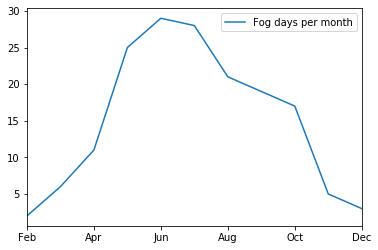

In [15]:
fogs_per_month.plot()

In [16]:
# find fog days per year - annual count fog days
years = fg_days.groupby(fg_days.index.year).size().index
fg_days_per_year=list(fg_days.groupby(fg_days.index.year).size().values)
fogs_per_year= pd.DataFrame(list(zip(years,fg_days_per_year)))
fogs_per_year.columns = ['Year','Fog days per year']
fogs_per_year['Year'] = pd.to_datetime(fogs_per_year['Year'],format='%Y')
fogs_per_year=fogs_per_year.set_index('Year',drop=True)
fogs_per_year.index = fogs_per_year.index.strftime('%Y')
fogs_per_year.sort_index(ascending=False).head(10)  # only showinf last 10 years here

,Fog days per year
2019,7
2018,7
2017,14
2016,8
2015,8
2014,7
2013,7
2012,8
2011,5
2010,6


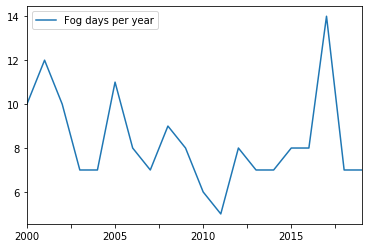

In [17]:
fogs_per_year.plot()

In [18]:
fg_aut.loc[fg_aut['fogflag']].head()

,avID,man,aut,rain24hr,fogflag,min_vis,fg_onset,fg_finish,fg_duration,wind5,...,wdir8,wspd8,wdir11,wspd11,wdir14,wspd14,wdir17,wspd17,wdir20,wspd20
2000-05-24,YBBN,6,4,19.0,True,0.10,18.15,22.45,4.3,160/06,...,150.0,5.0,60.0,7.0,30.0,8.0,230.0,5.0,230.0,5.0
2000-05-26,YBBN,0,1,2.2,True,0.45,16.15,16.45,0.3,060/07,...,30.0,9.0,360.0,6.0,310.0,4.0,310.0,3.0,320.0,4.0
2000-06-20,YBBN,0,1,0.2,True,0.80,15.45,16.15,0.3,030/04,...,0.0,0.0,350.0,4.0,320.0,4.0,0.0,0.0,230.0,4.0
2000-06-27,YBBN,4,6,0.2,True,0.30,12.45,23.15,10.3,120/06,...,150.0,3.0,270.0,4.0,220.0,4.0,220.0,4.0,260.0,4.0
2000-07-27,YBBN,0,2,6.8,True,0.35,13.15,14.45,1.3,020/04,...,360.0,6.0,330.0,7.0,250.0,4.0,270.0,2.0,310.0,5.0


In [19]:
# we create a copy of the dataframe, add columns for month and year
# We need to aggregate those values by month
# then we group the new columns and get the count/size 
fg_days = fg_aut.loc[fg_aut['fogflag']]
df_m = fg_days.copy()

print(df_m.index.month.unique().values)
print(df_m.index.year.unique().values)

df_m['month'] = df_m.index.month 
df_m['year'] = df_m.index.year 

# this would do the same 
df_m['month'] = [i.month for i in df_m.index]
df_m['year'] = [i.year for i in df_m.index]

# group by month and year, get the average
df_m = df_m.groupby(['month', 'year']).size()
print(df_m.index)
df_m.head()

[ 5  6  7  8  9 10  4 11 12  3  2]
[2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013
 2014 2015 2016 2017 2018 2019]
MultiIndex([( 2, 2008),
            ( 2, 2018),
            ( 3, 2002),
            ( 3, 2004),
            ( 3, 2006),
            ( 3, 2007),
            ( 3, 2019),
            ( 4, 2001),
            ( 4, 2002),
            ( 4, 2003),
            ...
            (10, 2015),
            (10, 2017),
            (10, 2019),
            (11, 2001),
            (11, 2003),
            (11, 2006),
            (11, 2016),
            (12, 2001),
            (12, 2004),
            (12, 2005)],
           names=['month', 'year'], length=106)


month  year
2      2008    1
       2018    1
3      2002    1
       2004    2
       2006    1
dtype: int64

In [20]:
# unstack the indexes
'''
Pivot a level of the (necessarily hierarchical) index labels, 
returning a DataFrame having a new level of column labels whose inner-most level 
consists of the pivoted index labels
'''
# we can unstack one level of the multiindex and move it into the columns
# unstacking year moves year into columns - but we want months into colums
df_m.unstack(level='year').head(2)  # same as df_m.unstack(level=1)

year,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
month,,,,,,,,,,,,,,,,,,,,
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN
3,NaN,NaN,1.0,NaN,2.0,NaN,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0


In [21]:
print(dict_mon)
# unstack the months
df_m=df_m.unstack(level='month')\
    .fillna(0)\
    .rename(columns=lambda x: dict_mon[x])\
    .sort_index(ascending=False)
df_m

{1: 'Jan', 2: 'Feb', 3: 'Mar', 4: 'Apr', 5: 'May', 6: 'Jun', 7: 'Jul', 8: 'Aug', 9: 'Sep', 10: 'Oct', 11: 'Nov', 12: 'Dec'}


month,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec
year,,,,,,,,,,,
2019,0.0,1.0,0.0,0.0,1.0,1.0,2.0,0.0,2.0,0.0,0.0
2018,1.0,0.0,0.0,1.0,2.0,1.0,1.0,1.0,0.0,0.0,0.0
2017,0.0,0.0,1.0,5.0,0.0,3.0,4.0,0.0,1.0,0.0,0.0
2016,0.0,0.0,0.0,2.0,0.0,3.0,0.0,1.0,0.0,2.0,0.0
2015,0.0,0.0,0.0,3.0,2.0,1.0,0.0,1.0,1.0,0.0,0.0
2014,0.0,0.0,0.0,1.0,2.0,2.0,0.0,2.0,0.0,0.0,0.0
2013,0.0,0.0,0.0,0.0,3.0,1.0,1.0,2.0,0.0,0.0,0.0
2012,0.0,0.0,2.0,0.0,1.0,1.0,1.0,2.0,1.0,0.0,0.0
2011,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0


In [22]:
print(df_m.max())
df_m.max().max()

month
Feb    1.0
Mar    2.0
Apr    2.0
May    5.0
Jun    4.0
Jul    3.0
Aug    4.0
Sep    2.0
Oct    3.0
Nov    2.0
Dec    1.0
dtype: float64


5.0

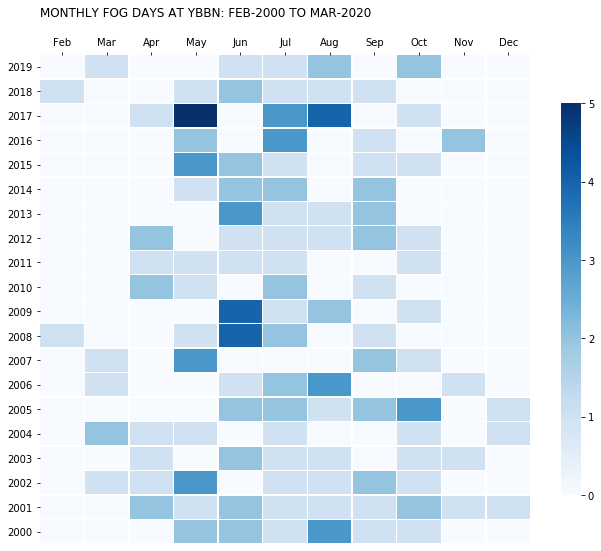

In [23]:
# use Seaborn’s .heatmap

'''use a sequential cmap with only two colors.
We can also make the limits of the colormap explicit by defining vmin and vmax.
Pandas .min and .max can help us figure out what are the best values for those.
'''

fig, ax = plt.subplots(figsize=(11, 9))

# plot heatmap
sns.heatmap(df_m, cmap="Blues", vmin= 0.0, vmax=df_m.max().max(), #square=True,
           linewidth=0.3, cbar_kws={"shrink": .8})

# xticks - move the ticks to the top of the chart to improve the visualization 
# and make it look more like a table.
ax.xaxis.tick_top()
# xticks_labels = dict_mon.values()  # includes Jan but we have no data for Jan
xticks_labels =['Feb', 'Mar', 'Apr', 'May', 'Jun','Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
plt.xticks(np.arange(11) + .5, labels=xticks_labels)


# get rid of the x and y labels since the values in our axis are quite self-explaining
plt.xlabel('')
plt.ylabel('')

# title

title = f'Monthly Fog days at {station}: \
{fg_aut.index[0].strftime("%b-%Y")} to {fg_aut.index[-1].strftime("%b-%Y")}\n'.upper()
plt.title(title, loc='left')
plt.show()

In [24]:
# GET SOI data
# http://www.bom.gov.au/climate/current/soihtm1.shtml
'''
import requests
url = 'http://www.bom.gov.au/climate/current/soihtm1.shtml'
soi_data = requests.get(url)
soi = pd.read_html(soi_data.text)  # ValueError: No tables found

However the table is there - even beautifulsoup bs4 has trouble extracting 
the table data !!!

We manually extract the table data and save the html coded data as soi_data.txt
'''

import datetime
# create list of months ['Jan','Feb',.....'Dec']
months = [datetime.date(2000, m, 1).strftime('%b') for m in range(1, 13)]

# we manually cut out table data from html file and save as .txt file
soi = pd.read_html('soi_data.txt',index_col=0, parse_dates=True)

len(soi), len(soi[0])
#(1, 145)   - its single dimesion list shape 1 not 2!!!
# however the 1st item in list is a 2D table !!
print('soi[0].shape',soi[0].shape)
print(soi[0][:2]) # get 1st 2 rows of data

# convert to DataFrame
soi = pd.DataFrame(soi[0])
soi.columns = months  # change column label from numbers to equivalent month names
# soi.index = soi.index.strftime('%Y')  # only keep the year for index labels
soi.index = soi.index.year  # since its datetime we can just keep year

soi = soi.head(21)  # only keep last 20 years data since Year 2000

soi = soi[months].apply(pd.to_numeric, errors='coerce') # force data numeric
# soi['winter_avg'] = (soi['May']+soi['Jun']+soi['Jul']+soi['Aug'])/4
soi['annual_avg_SOI'] = round(soi.mean(axis=1,skipna=True),2)

# not sure why avg using sum/len andm mean() give diff answers
print(f"\nMean SOI 2019: {soi.loc[2019].sum()/12:.2f}, {soi.loc[2019].mean():.2f}") 
print(f"Mean SOI 2018: {soi.loc[2018].sum()/12:.2f}, {soi.loc[2018].mean():.2f}") 

print(soi.shape)
soi.head(3)

soi[0].shape (145, 12)
             1     2    3    4    5     6    7     8      9     10    11    12
0                                                                             
2020-01-01  1.3  -2.2 -5.2 -0.5  2.8  -9.6  4.2     -      -     -     -     -
2019-01-01 -0.6 -13.5 -6.8 -1.3 -9.0 -10.4 -5.6  -4.4  -12.4  -5.6  -9.3  -5.5

Mean SOI 2019: -7.62, -7.03
Mean SOI 2018: 1.03, 0.95
(21, 13)


,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec,annual_avg_SOI
0,,,,,,,,,,,,,
2020,1.3,-2.2,-5.2,-0.5,2.8,-9.6,4.2,NaN,NaN,NaN,NaN,NaN,-1.31
2019,-0.6,-13.5,-6.8,-1.3,-9.0,-10.4,-5.6,-4.4,-12.4,-5.6,-9.3,-5.5,-7.03
2018,8.9,-6.0,10.5,4.5,2.1,-5.5,1.6,-6.9,-10.0,3.0,-0.1,9.3,0.95


In [25]:
def color_soi(value):
  """
  Colors elements in a dateframe green if TmTd < 1 
  and red if TmTd < 1. Else leave it black.
  """

  if value < -1:
    color = 'red'
  elif value > 1:
    color = 'blue'
  else:
    color = 'black'

  return 'color: %s' % color

soi = pd.merge(left=soi, right=fogs_per_year, how='left', left_index=True, right_index=True)
soi.style.applymap(color_soi,subset=soi.columns)

,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec,annual_avg_SOI,Fog days per year
0,,,,,,,,,,,,,,
2020,1.3,-2.2,-5.2,-0.5,2.8,-9.6,4.2,nan,nan,nan,nan,nan,-1.31,nan
2019,-0.6,-13.5,-6.8,-1.3,-9,-10.4,-5.6,-4.4,-12.4,-5.6,-9.3,-5.5,-7.03,nan
2018,8.9,-6,10.5,4.5,2.1,-5.5,1.6,-6.9,-10,3,-0.1,9.3,0.95,nan
2017,1.3,-2.2,5.1,-6.3,0.5,-10.4,8.1,3.3,6.9,9.1,11.8,-1.4,2.15,nan
2016,-19.7,-19.7,-4.7,-22,2.8,5.8,4.2,5.3,13.5,-4.3,-0.7,2.6,-3.07,nan
2015,-7.8,0.6,-11.2,-3.8,-13.7,-12,-14.7,-19.8,-17.8,-20.2,-5.3,-9.1,-11.23,nan
2014,12.2,-1.3,-13.3,8.6,4.4,-1.5,-3,-11.4,-7.6,-8,-10,-5.5,-3.03,nan
2013,-1.1,-3.6,10.5,0.3,8.4,13.9,8.1,-0.5,3.9,-1.9,9.2,0.6,3.98,nan
2012,9.4,2.5,2.9,-7.1,-2.7,-10.4,-1.7,-5,2.6,2.4,3.9,-6,-0.77,nan


In [26]:
soi['May'].corr(soi['Fog days per year'], method='pearson')

nan

In [27]:
print(soi.index) # convert index in years from string to datetime  Index dtype='object'
soi.index = pd.to_datetime(soi.index, format='%Y').year
soi.index # Int64Index dtype='int64'   
# Still not date time but we can slice like 2000:2019 now which we can't with objext index

Index([2020, 2019, 2018, 2017, 2016, 2015, 2014, 2013, 2012, 2011, 2010, 2009,
       2008, 2007, 2006, 2005, 2004, 2003, 2002, 2001, 2000],
      dtype='object', name=0)


Int64Index([2020, 2019, 2018, 2017, 2016, 2015, 2014, 2013, 2012, 2011, 2010,
            2009, 2008, 2007, 2006, 2005, 2004, 2003, 2002, 2001, 2000],
           dtype='int64', name=0)

In [28]:
years= np.arange(start=2000,stop=2020,step=1)   # get int year values 2000 to 2019 
months= ['Feb', 'Mar', 'Apr', 'May', 'Jun','Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
soi=soi.loc[years,months].sort_index(ascending=False)
soi.head()

,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec
0,,,,,,,,,,,
2019,-13.5,-6.8,-1.3,-9.0,-10.4,-5.6,-4.4,-12.4,-5.6,-9.3,-5.5
2018,-6.0,10.5,4.5,2.1,-5.5,1.6,-6.9,-10.0,3.0,-0.1,9.3
2017,-2.2,5.1,-6.3,0.5,-10.4,8.1,3.3,6.9,9.1,11.8,-1.4
2016,-19.7,-4.7,-22.0,2.8,5.8,4.2,5.3,13.5,-4.3,-0.7,2.6
2015,0.6,-11.2,-3.8,-13.7,-12.0,-14.7,-19.8,-17.8,-20.2,-5.3,-9.1


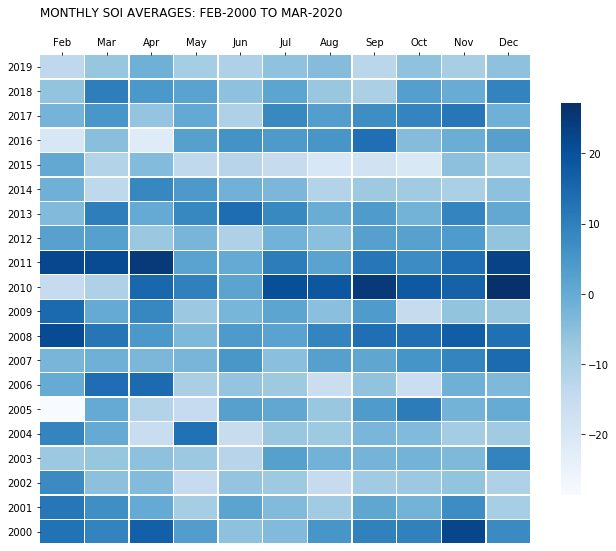

In [29]:
# use Seaborn’s .heatmap

'''use a sequential cmap with only two colors.
We can also make the limits of the colormap explicit by defining vmin and vmax.
Pandas .min and .max can help us figure out what are the best values for those.
'''

fig, ax = plt.subplots(figsize=(11, 9))

# plot heatmap
sns.heatmap(soi, cmap="Blues", vmin= soi.min().min(), vmax=soi.max().max(), #square=True,
           linewidth=0.3, cbar_kws={"shrink": .8})

# xticks - move the ticks to the top of the chart to improve the visualization 
# and make it look more like a table.
ax.xaxis.tick_top()
# xticks_labels = dict_mon.values()  # includes Jan but we have no data for Jan
xticks_labels =['Feb', 'Mar', 'Apr', 'May', 'Jun','Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
plt.xticks(np.arange(11) + .5, labels=xticks_labels)


# get rid of the x and y labels since the values in our axis are quite self-explaining
plt.xlabel('')
plt.ylabel('')

# title

title = f'Monthly SOI Averages: \
{fg_aut.index[0].strftime("%b-%Y")} to {fg_aut.index[-1].strftime("%b-%Y")}\n'.upper()
plt.title(title, loc='left')
plt.show()

In [30]:
# we can compute correlation between monthly fog counts and monthly soi values
# now we have got data in same shape
# REFER https://towardsdatascience.com/heatmap-basics-with-pythons-seaborn-fb92ea280a6c
print(soi.shape,'\n', soi.columns,'\n', soi.index)
print(df_m.shape,'\n', df_m.columns,'\n', df_m.index)

(20, 11) 
 Index(['Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov',
       'Dec'],
      dtype='object') 
 Int64Index([2019, 2018, 2017, 2016, 2015, 2014, 2013, 2012, 2011, 2010, 2009,
            2008, 2007, 2006, 2005, 2004, 2003, 2002, 2001, 2000],
           dtype='int64', name=0)
(20, 11) 
 Index(['Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov',
       'Dec'],
      dtype='object', name='month') 
 Int64Index([2019, 2018, 2017, 2016, 2015, 2014, 2013, 2012, 2011, 2010, 2009,
            2008, 2007, 2006, 2005, 2004, 2003, 2002, 2001, 2000],
           dtype='int64', name='year')


In [31]:
# Use corrwith() function to find the correlation among two dataframe objects along the column axis
# To find the correlation among the 
# columns of df1 and df2 along the column axis  (default)
df_m.corrwith(soi, axis = 'rows') 

month
Feb    0.192491
Mar   -0.089219
Apr    0.003035
May    0.003736
Jun    0.267253
Jul    0.373143
Aug   -0.080858
Sep   -0.010918
Oct    0.056382
Nov   -0.131793
Dec   -0.303537
dtype: float64

```
Some correlation between LaNina (+ve SOI) months and high number of fog days - about +30 to +40% for Months June and July. This makes sense as LaNina associated with high moisture content (above average ocean temps and above average rainfall over eastern QLD).

Strong -ve correlation for Dec -30% i.e LaNina years have fewer fog days while ElNino years deliver more fog days - makes sense.

TODO

Do a lagged correlation - so number of fog days in a month with SOI from previous month

Correlation between Monthly rainfall values (or rain days) and SOI index - test the hypothesis that LaNina equates to above average rainfall over SE QLD.

Correlation between Monthly rainfall values or even betetr number of rain days per month) and monthly fog counts - to see if more rain days give us more fog days.

Might need to use time series correlation for lagged correlation..

see https://towardsdatascience.com/finding-correlations-in-time-series-data-845e5dc538c4

```

In [32]:
# Use corrwith() function to find the correlation among two dataframe objects along the column axis
# To find the correlation among the 
# columns of df1 and df2 along the column axis 
df_m.corrwith(soi, axis = 'columns') 

year
2019    0.356106
2018   -0.705861
2017    0.091420
2016    0.359738
2015   -0.375963
2014    0.179359
2013    0.434312
2012   -0.263725
2011   -0.377253
2010    0.323022
2009   -0.215569
2008   -0.389593
2007   -0.262990
2006   -0.286639
2005    0.721102
2004    0.143654
2003   -0.275740
2002   -0.511291
2001   -0.369828
2000   -0.616723
dtype: float64

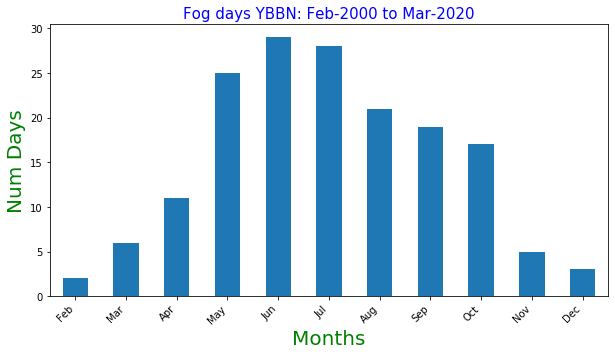

In [33]:
fg_days_by_month = fg_days.groupby(fg_days.index.month).size()
fig, ax = plt.subplots(figsize=(10,5), nrows=1, ncols=1 )
fg_days_by_month.plot( kind='bar', ax=ax)
title = f'Fog days {station}: {fg_aut.index[0].strftime("%b-%Y")} to {fg_aut.index[-1].strftime("%b-%Y")}'
ax.set_title(title, color='b',fontsize=15)
ax.set_ylabel('Num Days', color='g', fontsize=20)
ax.set_xlabel('Months', color='g', fontsize=20)
# g.get_xticks() [ 0  1  2  3  4  5  6  7  8  9 10]

if fg_days.groupby(fg_days.index.month).size().index[0] == 1:
    xlabels=[dict_mon[x+1] for x in ax.get_xticks()]
elif fg_days.groupby(fg_days.index.month).size().index[0] == 2:
    xlabels=[dict_mon[x+2] for x in ax.get_xticks()]
    
# xlabels=list( map( lambda x : dict_mon[x], ax.get_xticks()+2) )  # both give same result

# xlabels = ['{:,.2f}'.format(x) + 'K' for x in ax.get_xticks()/1000]
ax.set_xticklabels(xlabels,rotation=45, horizontalalignment='right')
#g.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
ax.tick_params(labelsize=10)

[ 0  1  2  3  4  5  6  7  8  9 10]


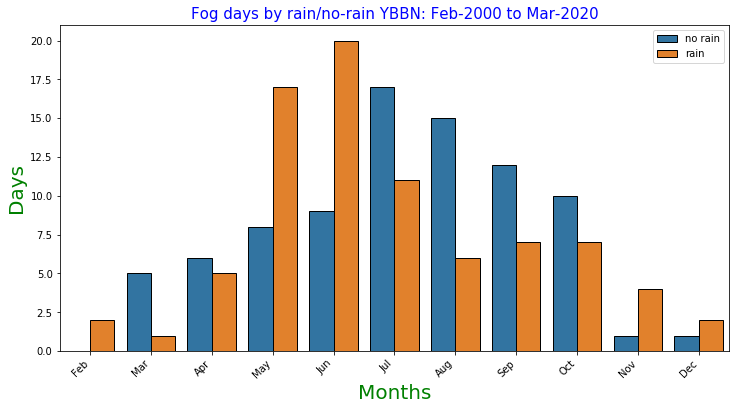

In [34]:
import seaborn as sns
fig, ax = plt.subplots(1, 1, figsize=(12,6))
sns.countplot(x=fg_days.index.month,
              hue='rain_flag',
              data=fg_days,
              ax=ax, edgecolor='k');
title = f'Fog days by rain/no-rain {station}: {fg_aut.index[0].strftime("%b-%Y")} to {fg_aut.index[-1].strftime("%b-%Y")}'
ax.set_title(title, color='b',fontsize=15)
ax.set_ylabel('Days', color='g', fontsize=20)
ax.set_xlabel('Months', color='g', fontsize=20)
print(ax.get_xticks()) #[ 0  1  2  3  4  5  6  7  8  9 10]

if fg_days.groupby(fg_days.index.month).size().index[0] == 1:
    xlabels=[dict_mon[x+1] for x in ax.get_xticks()]
elif fg_days.groupby(fg_days.index.month).size().index[0] == 2:
    xlabels=[dict_mon[x+2] for x in ax.get_xticks()]
    
ax.set_xticklabels(xlabels, rotation=45, 
                  horizontalalignment='right',fontsize=20)
ax.tick_params(labelsize=10)
my_labels = ['no rain', 'rain']
plt.legend(labels = my_labels)

In [35]:
#```
# Handling Axes object to label x-axis tick marks etc
# 
# https://stackoverflow.com/questions/23969619/plotting-with-seaborn-using-the-matplotlib-object-oriented-interface
# see also
# https://stackoverflow.com/questions/27019079/move-seaborn-plot-legend-to-a-different-position/
# 
# The plotting functions in seaborn are broadly divided into two classes
# 
# - "Axes-level" functions, including regplot, boxplot, kdeplot, and many others
# - "Figure-level" functions, including lmplot, factorplot, jointplot and one or two others
# 
# The first group is identified by taking an explicit ax argument and returning an Axes object. 
# As this suggests, you can use them in an "object oriented" style by passing your Axes to them:
# 
# f, (ax1, ax2) = plt.subplots(2)
# sns.regplot(x, y, ax=ax1)
# sns.kdeplot(x, ax=ax2)
# 
# Axes-level functions will only draw onto an Axes and won't otherwise mess with the figure, 
# so they can coexist perfectly happily in an object-oriented matplotlib script.
# 
# The second group of functions (Figure-level) are distinguished by the fact that the resulting plot can 
# potentially include several Axes which are always organized in a "meaningful" way. 
# That means that the functions need to have total control over the figure, so it isn't possible to plot,
# say, an lmplot onto one that already exists. Calling the function always initializes a figure and 
# sets it up for the specific plot it's drawing.
# 
# However, once you've called lmplot, it will return an object of the type FacetGrid. 
# This object has some methods for operating on the resulting plot that know a bit about the structure of the plot. 
# It also exposes the underlying figure and array of axes at the FacetGrid.fig and FacetGrid.axes arguments.
# The jointplot function is very similar, but it uses a JointGrid object.
# So you can still use these functions in an object-oriented context, but all of your customization has to come 
# after you've called the function.
#```
bad_fg_days.columns
bad_fg_days.tail()


,avID,man,aut,rain24hr,fogflag,min_vis,fg_onset,fg_finish,fg_duration,wind5,...,wdir8,wspd8,wdir11,wspd11,wdir14,wspd14,wdir17,wspd17,wdir20,wspd20
2018-09-08,YBBN,10,3,5.2,True,0.05,14.23,19.49,5.26,030/09,...,40.0,6.0,330.0,4.0,200.0,7.0,200.0,3.0,240.0,6.0
2019-06-15,YBBN,9,0,0.0,True,0.05,19.28,22.27,2.59,060/07,...,40.0,2.0,60.0,3.0,20.0,4.0,210.0,4.0,230.0,5.0
2019-08-07,YBBN,3,3,2.6,True,0.10,19.42,21.15,1.33,050/06,...,0.0,0.0,250.0,8.0,10.0,6.0,210.0,4.0,320.0,3.0
2019-08-18,YBBN,16,5,0.0,True,0.05,14.53,22.15,7.22,060/09,...,60.0,6.0,20.0,4.0,320.0,1.0,0.0,0.0,0.0,0.0
2019-10-19,YBBN,2,0,6.2,True,0.50,13.15,14.15,1.00,040/07,...,20.0,10.0,360.0,7.0,300.0,5.0,230.0,5.0,240.0,7.0


{1: '3 pm', 2: '6 pm', 3: '9 pm', 4: '12 am', 5: '3 am', 6: '6 am'}
[1 2 3 4 5 6]
['3 pm', '6 pm', '9 pm', '12 am', '3 am', '6 am']


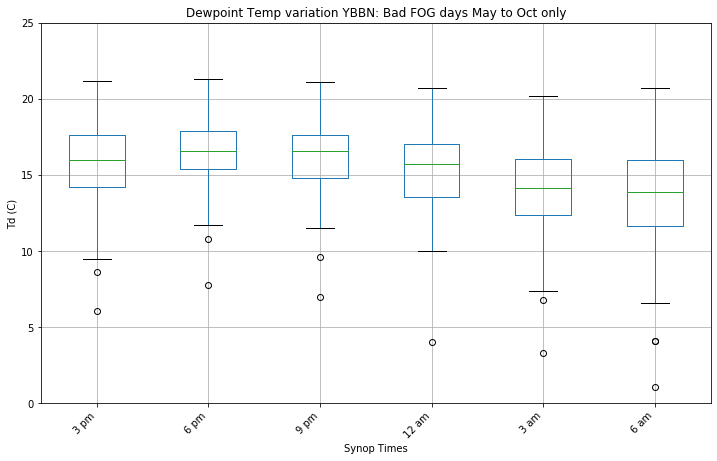

In [36]:
fig, ax = plt.subplots(1, 1, figsize=(12,7))
bad_fg_days.loc[bad_fg_days.index.month.isin([5,6,7,8,9,10])].boxplot(column=['Td5','Td8','Td11','Td14','Td17','Td20'], ax=ax)
ax.set_title(f'Dewpoint Temp variation {station}: Bad FOG days May to Oct only')


dict_synop_times=dict(zip(ax.get_xticks(),
                          ['3 pm','6 pm','9 pm','12 am','3 am','6 am']))
print(dict_synop_times)
print(ax.get_xticks())  # interestingly xticks starts at 1 not 0??
xlabels = [dict_synop_times[x] for x in ax.get_xticks()]
print(xlabels)

xlabels = [dict_synop_times[x] for x in ax.get_xticks()]
ax.set_xticklabels(xlabels, rotation=45, horizontalalignment='right')
ax.set_ylabel("Td (C)")  
ax.set_xlabel("Synop Times")  
ax.set_ylim(0,25)    # seems good y-axis range for coastal locations
if station in ['YTWB','YBOK','YBWW']:
    ax.set_ylim(-10,20)
plt.show()


[1 2 3 4 5 6]


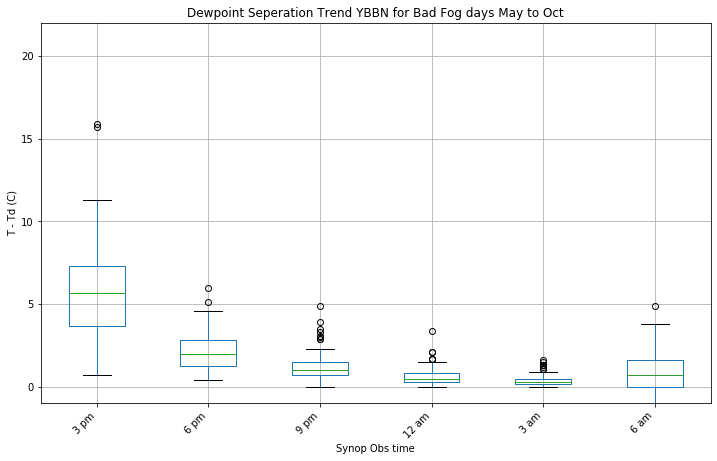

In [37]:
fig, ax = plt.subplots(1, 1, figsize=(12,7))
bad_fg_days.loc[bad_fg_days.index.month.isin([5,6,7,8,9,10])].boxplot(column=['TmTd5','TmTd8','TmTd11','TmTd14','TmTd17','TmTd20'],ax=ax)
ax.set_title(f'Dewpoint Seperation Trend {station} for Bad Fog days May to Oct')
print(ax.get_xticks())  
xlabels = [dict_synop_times[x] for x in ax.get_xticks()]
ax.set_xticklabels(xlabels, rotation=45, horizontalalignment='right')
ax.set_ylabel("T - Td (C)")  
ax.set_xlabel("Synop Obs time")  
ax.set_ylim(-1,22)    # seems good y-axis range for YBBN (5, 25)
plt.show()

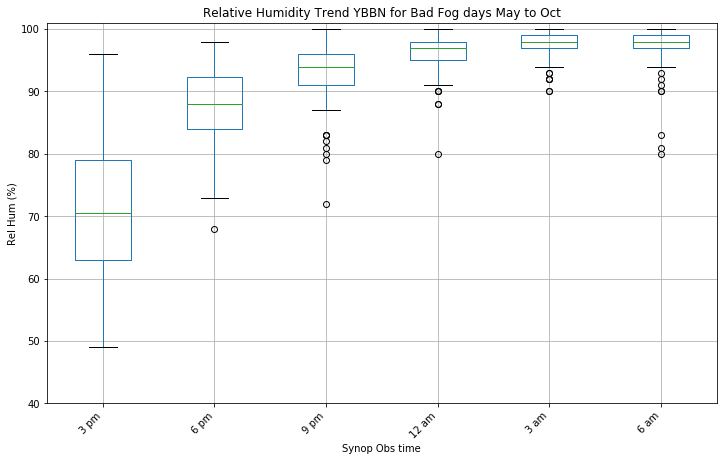

In [38]:
fig, ax = plt.subplots(1, 1, figsize=(12,7))
bad_fg_days.loc[bad_fg_days.index.month.isin([5,6,7,8,9,10])].boxplot(column=['RH5','RH8','RH11','RH14','RH17','RH20'], ax=ax)
ax.set_title(f'Relative Humidity Trend {station} for Bad Fog days May to Oct')
xlabels = [dict_synop_times[x] for x in ax.get_xticks()]
ax.set_xticklabels(xlabels, rotation=45, horizontalalignment='right')
ax.set_ylabel("Rel Hum (%)")  
ax.set_xlabel("Synop Obs time")  
ax.set_ylim(40,101)
plt.show()

In [39]:
fg_month_rain = fg_days['rain_flag'].groupby(fg_days.index.month).value_counts()
fg_month_rain

    rain_flag
2   True          2
3   False         5
    True          1
4   False         6
    True          5
5   True         17
    False         8
6   True         20
    False         9
7   False        17
    True         11
8   False        15
    True          6
9   False        12
    True          7
10  False        10
    True          7
11  True          4
    False         1
12  True          2
    False         1
Name: rain_flag, dtype: int64

[ 0  1  2  3  4  5  6  7  8  9 10 11]


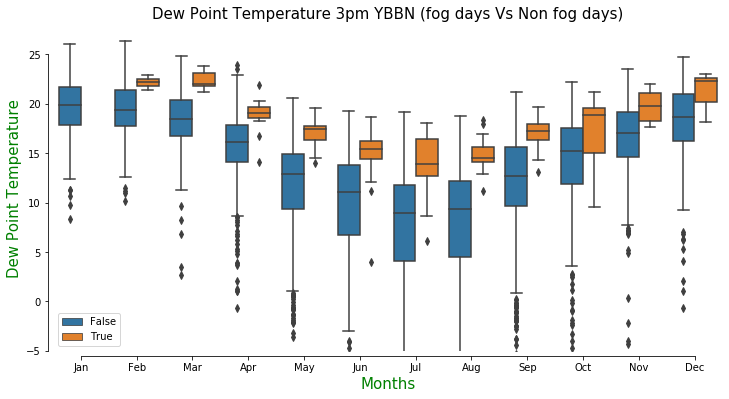

In [40]:
fig, ax = plt.subplots(1, 1, figsize=(12,6))
sns.boxplot(x=fg_aut.index.month, 
              y='Td5',
              hue='fogflag',
              data=fg_aut,ax=ax)
ax.set_title(f'Dew Point Temperature 3pm {station} (fog days Vs Non fog days)', fontsize=15)
ax.set_xlabel('Months', color='g', fontsize=15)
ax.set_ylabel('Dew Point Temperature', color='g', fontsize=15)
print(ax.get_xticks())# [ 0  1  2  3  4  5  6  7  8  9 10 11]  NB counts from 0, Jan is 1
xlabels = [dict_mon[x+1] for x in ax.get_xticks()] 
ax.set_xticklabels(xlabels, rotation=45, horizontalalignment='right')
ax.set_ylim(-5,28)
if station in ['YTWB','YBOK','YBWW']:
    ax.set_ylim(-10,25)
ax.legend(loc='lower left')#,labels=['no fog','fog'])
sns.despine(offset=5, trim=True)

In [41]:
fg_aut.loc[fg_aut.index.month.isin([6,7,8]),['fogflag','Td14']].\
    groupby([pd.Grouper(freq="y"),'fogflag']).describe().info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 39 entries, (2000-12-31 00:00:00, False) to (2019-12-31 00:00:00, True)
Data columns (total 8 columns):
(Td14, count)    39 non-null float64
(Td14, mean)     39 non-null float64
(Td14, std)      38 non-null float64
(Td14, min)      39 non-null float64
(Td14, 25%)      39 non-null float64
(Td14, 50%)      39 non-null float64
(Td14, 75%)      39 non-null float64
(Td14, max)      39 non-null float64
dtypes: float64(8)
memory usage: 2.8 KB


In [42]:
fg_aut.loc[fg_aut.index.month.isin([6,7,8]),['fogflag','Td11']].\
    groupby([pd.Grouper(freq="y"),'fogflag']).quantile(q=(0.2,0.8)).tail()

Td11
           fogflag           
2018-12-31 True    0.8  14.82
2019-12-31 False   0.2   6.40
                   0.8  14.10
           True    0.2  14.10
                   0.8  15.88

In [43]:
# July 12am Td variation fog VS no fog days
JJA_Td = fg_aut.loc[fg_aut.index.month.isin([6,7,8]),
                    ['rain_flag','fogflag','Td5','Td8','Td11','Td14','Td17','Td20']].\
        groupby(['rain_flag','fogflag']).\
        quantile(q=(0.2,0.5,0.8))

julyTd = fg_aut.loc[fg_aut.index.month.isin([6,7,8]),
                    ['rain_flag','fogflag','Td5','Td8','Td11','Td14','Td17','Td20']].\
        groupby(['rain_flag','fogflag']).\
        quantile(q=(0.2,0.5,0.8))

print(julyTd.info(),"\n\n", julyTd.index,"\n\n", julyTd.columns)
julyTd

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 12 entries, (False, False, 0.2) to (True, True, 0.8)
Data columns (total 6 columns):
Td5     12 non-null float64
Td8     12 non-null float64
Td11    12 non-null float64
Td14    12 non-null float64
Td17    12 non-null float64
Td20    12 non-null float64
dtypes: float64(6)
memory usage: 870.0 bytes
None 

 MultiIndex([(False, False, 0.2),
            (False, False, 0.5),
            (False, False, 0.8),
            (False,  True, 0.2),
            (False,  True, 0.5),
            (False,  True, 0.8),
            ( True, False, 0.2),
            ( True, False, 0.5),
            ( True, False, 0.8),
            ( True,  True, 0.2),
            ( True,  True, 0.5),
            ( True,  True, 0.8)],
           names=['rain_flag', 'fogflag', None]) 

 Index(['Td5', 'Td8', 'Td11', 'Td14', 'Td17', 'Td20'], dtype='object')


Td5    Td8   Td11   Td14   Td17   Td20
rain_flag fogflag                                              
False     False   0.2   2.30   5.50   4.90   4.40   3.80   3.30
                  0.5   8.40  10.55   9.90   8.70   7.90   7.15
                  0.8  12.08  13.50  12.90  11.90  11.00  10.30
          True    0.2  12.90  14.10  13.60  11.30  10.50   8.60
                  0.5  14.20  15.40  15.30  14.30  12.50  11.50
                  0.8  16.00  16.90  16.50  16.10  14.10  13.30
True      False   0.2   9.74  10.70  10.40  10.00   9.44   8.90
                  0.5  12.70  13.25  13.20  12.80  12.30  11.80
                  0.8  15.20  15.50  15.30  14.80  14.66  14.26
          True    0.2  13.90  14.32  14.02  12.82  11.26  11.00
                  0.5  15.50  15.70  15.00  14.40  13.90  13.20
                  0.8  16.86  16.92  17.16  16.48  15.98  15.14

In [44]:
idx = pd.IndexSlice
postrain_fog_Td_stats = julyTd.loc[idx[True,True,:], ['Td5','Td8','Td11','Td14']]
#postrain_fog_Td_stats.drop(labels=['rain_flag','fogflag'], axis=0, level = [0,1])
# https://www.w3resource.com/pandas/dataframe/dataframe-drop.php

postrain_fog_Td_stats.drop(index='rain_flag', level=0, inplace=True)
postrain_fog_Td_stats.drop(index='fogflag', level=0, inplace=True)
postrain_fog_Td_stats

Td5    Td8   Td11   Td14
rain_flag fogflag                                
True      True    0.2  13.90  14.32  14.02  12.82
                  0.5  15.50  15.70  15.00  14.40
                  0.8  16.86  16.92  17.16  16.48

In [45]:
dry_fg = julyTd.loc[idx[False,True,:], ['Td5']].droplevel(level=[0,1]).values.flatten()
dry_fg

array([12.9, 14.2, 16. ])

In [46]:
dry_no_fg=julyTd.loc[idx[False,False,:], ['Td5']].droplevel(level=[0,1]).values.flatten()
dry_no_fg

array([ 2.3 ,  8.4 , 12.08])

                        Td5   Td8
rain_flag fogflag                
False     True    0.2  12.9  14.1
                  0.5  14.2  15.4
                  0.8  16.0  16.9


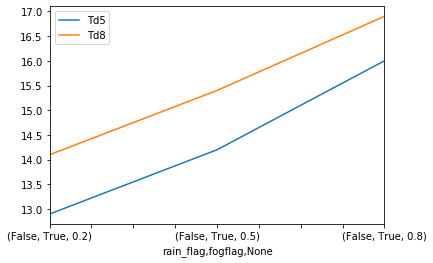

In [47]:
'''dry = rain24 > 0
if dry:
    if (Td_3pm > dry_fg[0]) & (Td_3pm > dry_fg[1])
'''

idx = pd.IndexSlice
print(julyTd.loc[idx[False,True,:], ['Td5','Td8']])
julyTd.loc[idx[False,True,:], ['Td5','Td8']].plot()

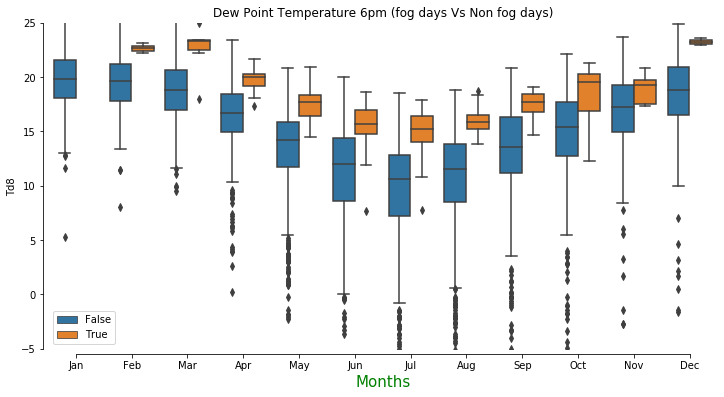

In [48]:
fig, ax = plt.subplots(1, 1, figsize=(12,6))
# sns.set(style="ticks", palette="pastel")
sns.boxplot(x=fg_aut.index.month, 
            y='Td8', 
            hue='fogflag',
            ax=ax, data=fg_aut)
ax.set_title("Dew Point Temperature 6pm (fog days Vs Non fog days)")
ax.set_xlabel('Months', color='g', fontsize=15)
xlabels = [dict_mon[x+1] for x in ax.get_xticks()]
ax.set_xticklabels(xlabels, rotation=45, horizontalalignment='right')
ax.legend(loc='lower left')
ax.set_ylim(-5,25)
if station in ['YTWB','YBOK','YBWW']:
    ax.set_ylim(-10,28)
sns.despine(offset=5, trim=True)

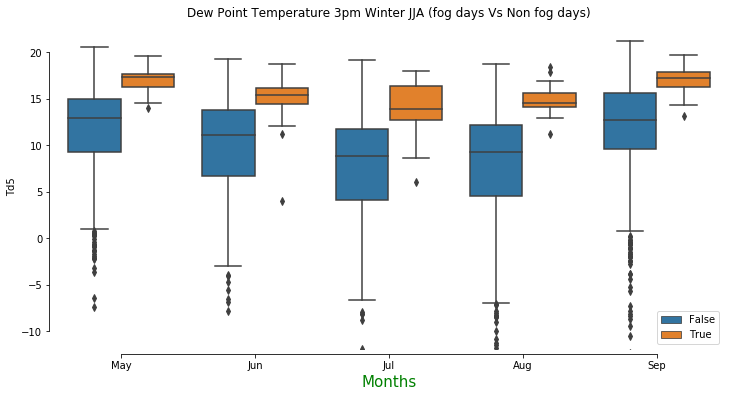

In [49]:
fig, ax = plt.subplots(1, 1, figsize=(12,6))
# sns.set(style="ticks", palette="pastel")
dat = fg_aut.loc[fg_aut.index.month.isin([5,6,7,8,9]),:]
sns.boxplot(x=dat.index.month, 
            y='Td5', 
            hue='fogflag',
            ax=ax, data=dat)
ax.set_title("Dew Point Temperature 3pm Winter JJA (fog days Vs Non fog days)")
ax.set_xlabel('Months', color='g', fontsize=15)
xlabels = ['May','Jun', 'Jul','Aug','Sep']
ax.set_xticklabels(xlabels, rotation=45, horizontalalignment='right')
ax.legend(loc='lower right')
ax.set_ylim(dat['Td5'].min()+5,dat['Td5'].max()+2)
sns.despine(offset=5, trim=True);  # x-axis tick labels won't rotate with this line


In [50]:
fg_aut.loc[fg_aut.index.month.isin([6,7,8]),
                    ['fogflag','Td5','Td8','Td11','Td14','Td17','Td20']].\
        groupby('fogflag').\
        quantile(q=(0.05,0.2,0.5,0.8,0.95))

Td5     Td8    Td11    Td14    Td17   Td20
fogflag                                                    
False   0.05  -2.900  -0.400   0.300   0.795   0.800   0.60
        0.20   3.800   6.900   6.100   5.400   4.500   4.00
        0.50   9.800  11.400  10.800   9.900   9.200   8.50
        0.80  13.400  14.300  13.900  13.200  12.500  11.92
        0.95  16.205  16.600  16.205  15.500  15.200  14.80
True    0.05  11.035  11.640  11.670  10.085   7.485   4.10
        0.20  13.500  14.140  14.000  12.240  10.940   9.54
        0.50  14.650  15.550  15.300  14.400  13.200  12.05
        0.80  16.300  16.960  16.920  16.400  14.840  14.64
        0.95  18.060  18.215  17.715  17.430  16.845  16.30

In [51]:
MJJAS_Td = fg_aut.loc[fg_aut.index.month.isin([6,7,8]),
                    ['fogflag','Td5','Td8','Td11','Td14','Td17','Td20']].\
        groupby('fogflag').\
        quantile(q=(0.05,0.2,0.5,0.8,0.95))
idx = pd.IndexSlice
MJJAS_Td.loc[idx[True,:], ['Td5','Td8']]

Td5     Td8
fogflag                     
True    0.05  11.035  11.640
        0.20  13.500  14.140
        0.50  14.650  15.550
        0.80  16.300  16.960
        0.95  18.060  18.215

In [52]:
# grab median 3pm Td for fog (=True) days only
MJJAS_Td.loc[idx[True,0.5], 'Td5']

14.649999999999999

In [81]:
'''
https://towardsdatascience.com/resampling-methods-for-inference-analysis-e75fecfefcb2

https://towardsdatascience.com/new-python-library-for-statistical-tests-simpler-than-statsmodels-richer-than-scipy-stats-ff380d4673c0


'''

td5 = fg_aut.loc[fg_aut.index.month.isin([6,7,8]),['fogflag','Td5','Td8','Td11']]
td5.loc[td5['fogflag'], 'Td5'] # extract Td5 values for fog days

# median
print(f"Median 3pm Td for fog days={np.median(td5.loc[td5['fogflag'], 'Td5']):.2f}, \
Median 3pm Td for non fog days={np.median(td5.loc[~td5['fogflag'], 'Td5']):.2f}")

# Mean 3pm Td fog days and non-fog days
print(f"\nMean 3pm Td for fog days={np.mean(td5.loc[td5['fogflag'], 'Td5']):.2f}, \
Mean 3pm Td for fog days={np.mean(td5.loc[~td5['fogflag'], 'Td5']):.2f}\n\n")

#95% Confidence Interval --> np.percentile(series, [2.5, 97.5])
print(f"95% Confidence Interval for 3pm Td fog days {np.percentile(td5.loc[td5['fogflag'], 'Td5'], [2.5, 97.5])}")
print(f"90% Confidence Interval for 3pm Td fog days {np.percentile(td5.loc[td5['fogflag'], 'Td5'], [5, 95])}")
print(f"80% Confidence Interval for 3pm Td fog days {np.percentile(td5.loc[td5['fogflag'], 'Td5'], [10, 90])}")
print(f"50% CI (IQR q1/25th to q3/75 percentile ??) {np.percentile(td5.loc[td5['fogflag'], 'Td5'], [25, 75])}")



Median 3pm Td for fog days=14.65, Median 3pm Td for non fog days=9.80

Mean 3pm Td for fog days=14.61, Mean 3pm Td for fog days=8.53


95% Confidence Interval for 3pm Td fog days [ 8.4125 18.5075]
90% Confidence Interval for 3pm Td fog days [11.035 18.06 ]
80% Confidence Interval for 3pm Td fog days [12.1  17.63]
50% CI (IQR q1/25th to q3/75 percentile ??) [13.725 16.175]


 https://sites.google.com/site/davidsstatistics/home/notched-box-plots
 
 https://www.nature.com/articles/nmeth.2813.pdf?origin=ppub
     
 Box plots are a simple but powerful graphing tool that can be used in place of histograms to address both goals. Whereas histograms require a sample size of at least 30 to be useful, box plots require a sample size of only 5, provide more detail in the tails of the distribution and are more readily compared across three or more samples.
 
 Box plots characterize a sample using the 25th, 50th and 75th percentiles—also known as the lower quartile (Q1), median (m or Q2) and upper quartile (Q3)—and the interquartile range (IQR = Q3 – Q1), which covers the central 50% of the data. Quartiles are insensitive to outliers and preserve information about the center and spread. Consequently, they are preferred over the mean and s.d. for population distributions that are asymmetric or irregularly shaped and for samples with extreme outliers.
 
 The core element that gives the box plot its name is a box whose length is the IQR and whose width is arbitrary. A line inside the box shows the median, which is not necessarily central. Whiskers are conventionally extended to the most extreme data point that is no more than 1.5 × IQR from the edge of the box (Tukey style) or all the way to minimum and maximum of the data values (Spear style)
 
  The 1.5 multiplier corresponds to approximately ±2.7s (where s is s.d.) and 99.3% coverage of the data for a normal distribution. Outliers beyond the whiskers may be individually plotted. Box plot construction requires a sample of at least n = 5 (preferably larger)
 
  Highly skewed distributions appear in box plot form with a markedly shorter whisker-and-box region and an absence of outliers on the side opposite the skew. Keep in mind that for small sample sizes, which do not necessarily represent the distribution well, these features may appear by chance.
 
 see also
 https://docs.scipy.org/doc/scipy/reference/tutorial/stats.html

Text(0.5, -5, 'Median 3pm Td for fog days 15.7')

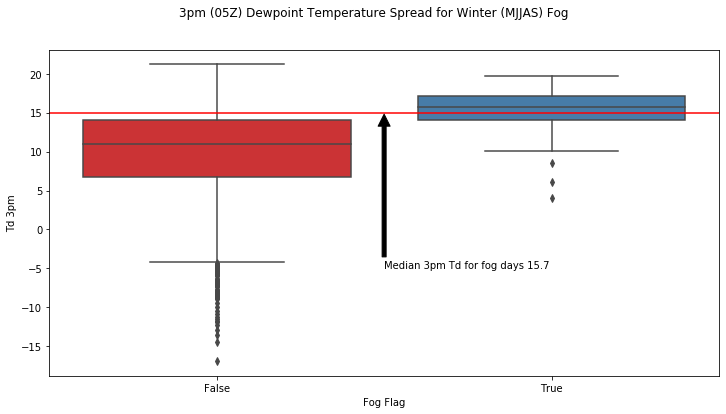

In [53]:
#print(fg_aut.columns)

'''Here we can see where the rule of thumb for 3pm Td > 16 for fog days 
come from - the median TD for winter fog is about 15C


By comparision median for non fog winter days is about 10 ~ Q1 for fog days

Better rule of thum for winter fog days - consider fog if Td > Q3 (no fog days) ~ 13
and high chance if Td > 14C '''

fg_JJA = fg_aut[( fg_aut.index.month.isin([5,6,7,8,9]))]
fig, ax = plt.subplots(1, 1, figsize=(12,6))
sns.boxplot(x='fogflag', y='Td5', data=fg_JJA,  palette='Set1',ax=ax)

fig.suptitle('3pm (05Z) Dewpoint Temperature Spread for Winter (MJJAS) Fog')
ax.set_xlabel('Fog Flag')
ax.set_ylabel('Td 3pm')
# ax.legend(['Fog', 'No Fog'],loc='lower right')
# sns.despine(offset=10, trim=True)
ax.axhline(y=15,color='red')# ymin=0, ymax=1)
ax.annotate('Median 3pm Td for fog days 15.7', xy=(0.5, 15), xytext=(0.5, -5),
            arrowprops=dict(facecolor='black', shrink=0.01))

Text(15.649999999999999, 0.35, 'Median Td for fog days')

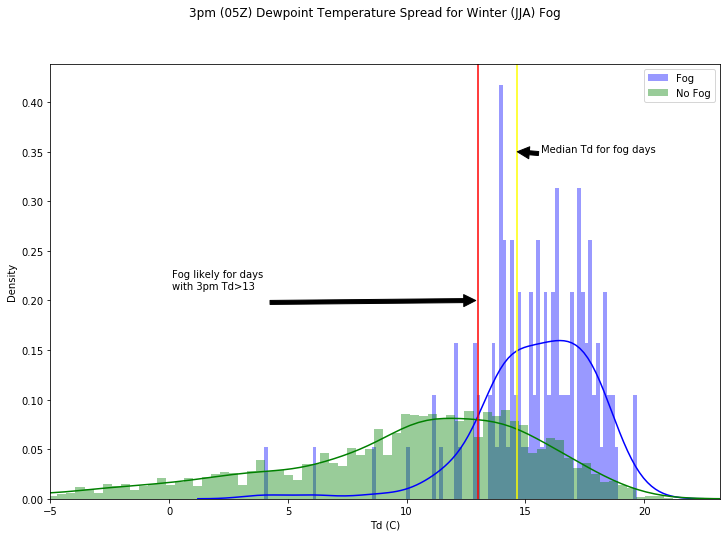

In [54]:
'''
https://matplotlib.org/3.1.1/api/_as_gen/matplotlib.pyplot.annotate.html
text : str
The text of the annotation. s is a deprecated synonym for this parameter.

xy : (float, float)
The point (x,y) to annotate.

xytext : (float, float), optional
The position (x,y) to place the text at. If None, defaults to xy.
'''
fg_JJA = fg_aut[( fg_aut.index.month.isin([5,6,7,8,9]))]
fig, ax = plt.subplots(nrows=1,ncols=1, figsize=(12,8))#,sharex=True,sharey=True)
sns.distplot(fg_JJA.loc[fg_JJA['fogflag'],'Td5'].values, kde=True, color='blue', bins=100,ax=ax)
sns.distplot(fg_JJA.loc[~fg_JJA['fogflag'],'Td5'].values, kde=True, color='green', bins=100,ax=ax)

ax.legend(['Fog', 'No Fog'])
fig.suptitle('3pm (05Z) Dewpoint Temperature Spread for Winter (JJA) Fog\n')
ax.set_xlabel('Td (C)')
#ax.set_xlim(fg_JJA['Td8'].min()+1,fg_JJA['Td8'].max()+1)
ax.set_xlim(-5,fg_JJA['Td5'].max()+2)
ax.set_ylabel('Density')

ax.axvline(x=13,color='red')# ymin=0, ymax=1)
ax.annotate('Fog likely for days \nwith 3pm Td>13\n', xy=(13, 0.2), xytext=(0.1, 0.2),
            arrowprops=dict(facecolor='black', shrink=0.01))

ax.axvline(x=MJJAS_Td.loc[idx[True,0.5], 'Td5'],color='yellow')# ymin=0, ymax=1)
ax.annotate('Median Td for fog days',
            xy=(MJJAS_Td.loc[idx[True,0.5], 'Td5'], 0.35),
            xytext=(MJJAS_Td.loc[idx[True,0.5], 'Td5']+1, 0.35),
            arrowprops=dict(facecolor='black', shrink=0.01))
# see more annotation shere

# https://jakevdp.github.io/PythonDataScienceHandbook/04.09-text-and-annotation.html

Text(16.55, 0.35, 'Median Td for fog days')

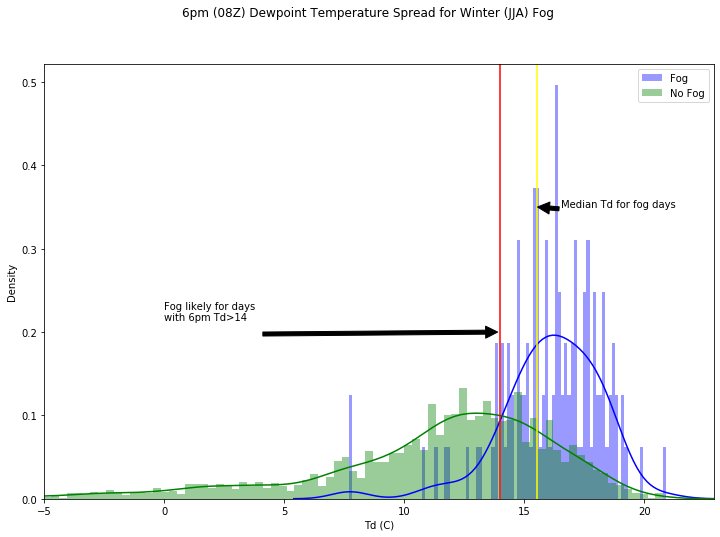

In [55]:
fg_JJA = fg_aut[( fg_aut.index.month.isin([5,6,7,8,9]))]
fig, ax = plt.subplots(nrows=1,ncols=1, figsize=(12,8))#,sharex=True,sharey=True)
sns.distplot(fg_JJA.loc[fg_JJA['fogflag'],'Td8'].values, kde=True, color='blue', bins=100,ax=ax)
sns.distplot(fg_JJA.loc[~fg_JJA['fogflag'],'Td8'].values, kde=True, color='green', bins=100,ax=ax)

ax.legend(['Fog', 'No Fog'])
fig.suptitle('6pm (08Z) Dewpoint Temperature Spread for Winter (JJA) Fog\n')
ax.set_xlabel('Td (C)')
#ax.set_xlim(fg_JJA['Td8'].min()+1,fg_JJA['Td8'].max()+1)
ax.set_xlim(-5,fg_JJA['Td8'].max()+2)
ax.set_ylabel('Density')

ax.axvline(x=14,color='red')# ymin=0, ymax=1)
ax.annotate('Fog likely for days \nwith 6pm Td>14\n', xy=(14, 0.2), xytext=(0, 0.2),
            arrowprops=dict(facecolor='black', shrink=0.01))

ax.axvline(x=MJJAS_Td.loc[idx[True,0.5], 'Td8'],color='yellow')# ymin=0, ymax=1)
ax.annotate('Median Td for fog days',
            xy=    (MJJAS_Td.loc[idx[True,0.5], 'Td8'], 0.35),
            xytext=(MJJAS_Td.loc[idx[True,0.5], 'Td8']+1, 0.35),
            arrowprops=dict(facecolor='black', shrink=0.01))

Text(4, 0.16, 'Fog likely given increasing Td 3pm last 4 days')

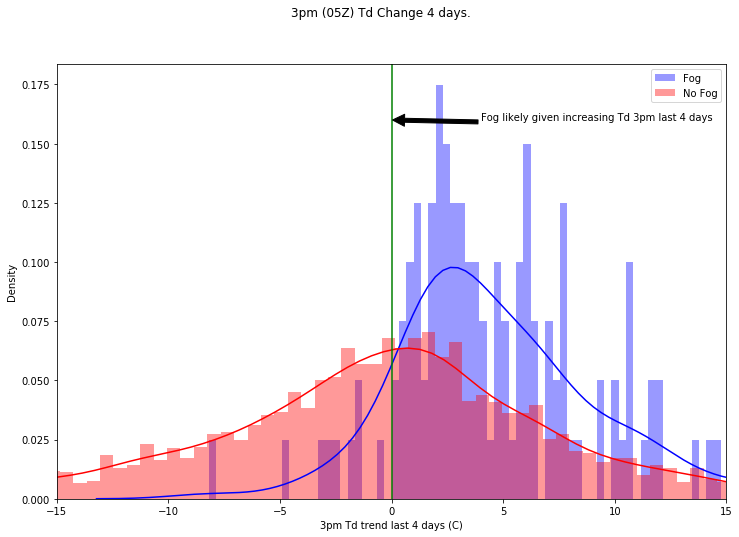

In [56]:
fg_aut['Td5_4day']=fg_aut['Td5'].diff(periods=4) # 4day trend Td Sep 12am
fg_JJA = fg_aut[( fg_aut.index.month.isin([5,6,7,8,9]))]
fig, ax = plt.subplots(nrows=1,ncols=1, figsize=(12,8))#,sharex=True,sharey=True)
sns.distplot(fg_JJA.loc[fg_JJA['fogflag'],'Td5_4day'].values, kde=True, color='blue', bins=100,ax=ax)
sns.distplot(fg_JJA.loc[~fg_JJA['fogflag'],'Td5_4day'].values, kde=True, color='red', bins=100,ax=ax)

ax.legend(['Fog', 'No Fog'])
fig.suptitle(f'3pm (05Z) Td Change 4 days.')
ax.set_xlabel('3pm Td trend last 4 days (C)')
ax.set_ylabel('Density')
ax.set_xlim(-15,15)
ax.axvline(x=0,color='green')# ymin=0, ymax=1)
ax.annotate('Fog likely given increasing Td 3pm last 4 days', xy=(0, 0.16), xytext=(4, 0.16),
            arrowprops=dict(facecolor='black', shrink=0.01))


In [57]:
from scipy import stats

fg_JJA = fg_aut[( fg_aut.index.month.isin([5,6,7,8,9]))]
td5_fg_days    = fg_JJA.loc[fg_JJA['fogflag'],'Td5'].dropna().values
td5_no_fg_days = fg_JJA.loc[~fg_JJA['fogflag'],'Td5'].dropna().values

mean_td5_fg =np.median(td5_fg_days) #.mean()
mean_td5_no_fg =np.median(td5_no_fg_days) #.mean()

std_err_fg = td5_fg_days.std()/np.sqrt(len(td5_fg_days))
std_err_no_fg = td5_no_fg_days.std()/np.sqrt(len(td5_no_fg_days))

print(f'Mean Td at 3pm for fog days = {mean_td5_fg} with standard error of {std_err_fg}') 
print(f'Mean Td at 3pm for fog days = {mean_td5_no_fg} with standard error of {std_err_no_fg}') 

confidence = 0.9  # 90% CI
h=std_err_fg*stats.t.ppf((1+confidence)/2,len(td5_fg_days))
if mean_td5_fg-h <= 20 <= mean_td5_fg+h:
    interval_90_count*=1
       
'''
https://machinelearningmastery.com/confidence-intervals-for-machine-learning/

A confidence interval is a bounds on the estimate of a population variable. 
It is an interval statistic used to quantify the uncertainty on an estimate.

Commonly used number of standard deviations from the Gaussian distribution and their 
corresponding significance level are as follows:

1.64 (90%)
1.96 (95%)
2.33 (98%)
2.58 (99%)

interval = z * sqrt( (error * (1 - error)) / n)
'''
# Note Median Td 3 pm for fog days ~ 16C

# binomial confidence interval
from math import sqrt
interval = 1.64 * sqrt( (std_err_fg * (1 - std_err_fg)) / len(td5_fg_days))
print('%.3f' % interval)

Mean Td at 3pm for fog days = 15.75 with standard error of 0.2228761118647029
Mean Td at 3pm for fog days = 11.0 with standard error of 0.11057195958107269
0.062


In [58]:
'''
fg_days = fg_aut.loc[fg_aut['fogflag']]; 
fg_free_days = fg_aut.loc[~fg_aut['fogflag']]

mask = (fg_days['min_vis']<=2) & (fg_days['fg_duration']>=1)
bad_fg_days = fg_days.loc[mask]
not_in_bad_fg_days = \
    fg_aut.loc[(fg_aut.index).difference(bad_fg_days.index)]
'''

#  https://www.kite.com/python/answers/how-to-compute-the-confidence-interval-of-a-sample-statistic-in-python
'''
confidence_level = 0.95
degrees_freedom = sample.size - 1
sample_mean = np.mean(sample)
sample_standard_error = scipy.stats.sem(sample)
confidence_interval = scipy.stats.t.interval(confidence_level, degrees_freedom, sample_mean, sample_standard_error)
'''

from scipy import stats
from scipy.stats import sem, t
confidence_level = 0.90  # 90% confidence interval

fg_JJA = fg_aut[( fg_aut.index.month.isin([5,6,7,8,9]))]
td5_fg_days    = fg_JJA.loc[fg_JJA['fogflag'],'Td5'].dropna().values
td5_no_fg_days = fg_JJA.loc[~fg_JJA['fogflag'],'Td5'].dropna().values

mean_fg =    np.median(td5_fg_days) #.mean()
mean_fg =    np.mean(td5_fg_days)
mean_no_fg = np.median(td5_no_fg_days) #.mean()
mean_no_fg = np.mean(td5_no_fg_days)

se_fg =    td5_fg_days.std() / np.sqrt(len(td5_fg_days))
se_fg =   sem(td5_fg_days)  # sample_standard_error=scipy.stats.sem(sample)
se_no_fg = td5_no_fg_days.std()/np.sqrt(len(td5_no_fg_days))
se_no_fg= sem(td5_no_fg_days)

# n = len(data)  m = mean(data)  std_err = sem(data)


h1 = se_fg    * t.ppf((1 + confidence_level) / 2, len(td5_fg_days)    - 1)
h2 = se_no_fg * t.ppf((1 + confidence_level) / 2, len(td5_no_fg_days) - 1)

print(f'Mean Td at 3pm for fog days = {mean_fg:.1f} with standard error of {se_fg:.1f}\n90% Confidence Interval : {(mean_fg-h1):.1f} to {(mean_fg+h1):.1f}') 
print(f'Mean Td at 3pm for no fog days = {mean_no_fg:.1f} with standard error of {se_no_fg:.1f}\n90% Confidence Interval : {(mean_no_fg-h2):.1f} to {(mean_no_fg+h2):.1f}') 

degrees_freedom=len(td5_fg_days)- 1
confidence_interval = np.round(stats.t.interval(confidence_level, degrees_freedom, mean_fg, se_fg),1)
confidence_interval


Mean Td at 3pm for fog days = 15.4 with standard error of 0.2
90% Confidence Interval : 15.1 to 15.8
Mean Td at 3pm for no fog days = 9.8 with standard error of 0.1
90% Confidence Interval : 9.6 to 9.9


array([15.1, 15.8])

In [59]:
print(td5_fg_days.std()/np.sqrt(len(td5_fg_days)),sem(td5_fg_days))
print(td5_no_fg_days.std()/np.sqrt(len(td5_no_fg_days)),sem(td5_no_fg_days))

0.2228761118647029 0.22379519251387786
0.11057195958107269 0.11059161157795429


In [82]:
'''
https://towardsdatascience.com/resampling-methods-for-inference-analysis-e75fecfefcb2
https://towardsdatascience.com/new-python-library-for-statistical-tests-simpler-than-statsmodels-richer-than-scipy-stats-ff380d4673c0
'''

td5 = fg_aut.loc[fg_aut.index.month.isin([6,7,8]),['fogflag','Td5','Td8','Td11']]
td5.loc[td5['fogflag'], 'Td5'] # extract Td5 values for fog days

# median
print(f"Median 3pm Td for fog days={np.median(td5.loc[td5['fogflag'], 'Td5']):.2f}, \
Median 3pm Td for non fog days={np.median(td5.loc[~td5['fogflag'], 'Td5']):.2f}")

# Mean 3pm Td fog days and non-fog days
print(f"\nMean 3pm Td for fog days={np.mean(td5.loc[td5['fogflag'], 'Td5']):.2f}, \
Mean 3pm Td for fog days={np.mean(td5.loc[~td5['fogflag'], 'Td5']):.2f}\n\n")

#95% Confidence Interval --> np.percentile(series, [2.5, 97.5])
print(f"95% Confidence Interval for 3pm Td fog days {np.percentile(td5.loc[td5['fogflag'], 'Td5'], [2.5, 97.5])}")
print(f"90% Confidence Interval for 3pm Td fog days {np.percentile(td5.loc[td5['fogflag'], 'Td5'], [5, 95])}")
print(f"80% Confidence Interval for 3pm Td fog days {np.percentile(td5.loc[td5['fogflag'], 'Td5'], [10, 90])}")
print(f"50% CI (IQR q1/25th to q3/75 percentile ??) {np.percentile(td5.loc[td5['fogflag'], 'Td5'], [25, 75])}")

Median 3pm Td for fog days=14.65, Median 3pm Td for non fog days=9.80

Mean 3pm Td for fog days=14.61, Mean 3pm Td for fog days=8.53


95% Confidence Interval for 3pm Td fog days [ 8.4125 18.5075]
90% Confidence Interval for 3pm Td fog days [11.035 18.06 ]
80% Confidence Interval for 3pm Td fog days [12.1  17.63]
50% CI (IQR q1/25th to q3/75 percentile ??) [13.725 16.175]


In [60]:
'''Dat is in wide/fat table format at the moment - makes some plotting tasks difficult with seaborn
We need to transform data into narrow but long format - using stack() to get columns into rows
stack(),pivot(),melt() basically do similar things - we use melt()

So only the columns where index/label starts with T or Td followed by one or more digit
only one or two digits \d{1,2}, \d* (says zero or more), \d+ (one or more)
'''
fg_aut.loc[:,(fg_aut.columns.str.contains(pat = '^(T|Td)\d+', regex = True))].tail()


/home/bou/py37/lib64/python3.7/site-packages/pandas/core/strings.py:1843: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  return func(self, *args, **kwargs)


,T5,Td5,T8,Td8,T11,Td11,T14,Td14,T17,Td17,T20,Td20,Td8to14,Td11to17,Td5_4day,T14_48hr
2020-03-24,22.6,18.6,22.4,18.2,21.3,18.1,20.8,18.2,20.2,18.8,19.6,19.1,0.0,0.7,2.7,-2.1
2020-03-25,25.7,16.0,21.8,16.0,20.7,16.6,19.1,17.3,17.5,16.1,17.0,15.8,1.3,-0.5,-0.9,-3.6
2020-03-26,26.6,17.5,23.7,18.1,23.5,18.6,20.4,19.0,19.9,18.0,18.6,17.3,0.9,-0.6,-1.9,-0.4
2020-03-27,23.0,17.9,21.0,16.2,20.8,15.9,19.7,15.5,18.8,15.0,18.5,15.2,-0.7,-0.9,-1.0,0.6
2020-03-28,25.7,18.6,23.1,19.7,22.3,19.6,21.5,19.1,19.2,18.7,20.0,18.7,-0.6,-0.9,0.0,1.1


In [61]:
''' ******   Temperature Melt()  '''
dfT = pd.melt(
    fg_aut.loc[:,(fg_aut.columns.str.contains(pat = '^T\d+', regex = True))].reset_index(),
              id_vars='index',
              value_vars=['T5','T8','T11','T14','T17','T20'],
              var_name='T',
              value_name="T_val")
#print(dfT.loc[dfT['index']=='2020-03-17'].tail(),"\n")
dfT.set_index(keys=pd.to_datetime(dfT['index']), drop=True,inplace=bool(1))
#print(dfT.loc[dfT['index']=='2020-03-17'].tail(),"\n")
dfT.drop(columns=['index'],inplace=bool(1))
dfT.loc['2020-03-17'].tail(6)

,T,T_val
index,,
2020-03-17,T5,24.9
2020-03-17,T8,23.0
2020-03-17,T11,21.7
2020-03-17,T14,18.7
2020-03-17,T17,17.3
2020-03-17,T20,17.0


In [62]:
# Now the data for each synop time is in different rows we can plot data for different synop times in same plot


''' ******   Temperature Melt()  '''
dfT = pd.melt(
    fg_aut.loc[:,(fg_aut.columns.str.contains(pat = '^T\d+', regex = True))].reset_index(),
              id_vars='index',
              value_vars=['T5','T8','T11','T14','T17','T20'],
              var_name='T',
              value_name="T_val")
dfT.set_index(keys=pd.to_datetime(dfT['index']), drop=True,inplace=bool(1))
dfT.drop(columns=['index'],inplace=bool(1))

''' ******   Dewpoint Melt()  '''
dfTd = pd.melt(
    fg_aut.loc[:,(fg_aut.columns.str.contains(pat = '^Td\d+',
                                                         regex = True))].reset_index(),
              id_vars='index',
              value_vars=['Td5','Td8','Td11','Td14','Td17','Td20'],
              var_name='Td',
              value_name="Td_val")
dfTd.set_index(keys=pd.to_datetime(dfTd['index']), drop=True,inplace=bool(1))
dfTd.drop(columns=['index'],inplace=bool(1))

''' ******   Seperation Melt()  '''
dfTmTd =  pd.melt(
    fg_aut.loc[:,(fg_aut.columns.str.contains("TmTd\d+"))].reset_index(),
              id_vars='index',
              value_vars=['TmTd5','TmTd8','TmTd11','TmTd14','TmTd17','TmTd20'],
              var_name='TmTd',
              value_name="TmTd_val")
dfTmTd.set_index(keys=pd.to_datetime(dfTmTd['index']), drop=True,inplace=bool(1))
dfTmTd.drop(columns=['index'],inplace=bool(1))

''' ******   RH Melt()  '''
dfRH = pd.melt(
    fg_aut.loc[:,(fg_aut.columns.str.contains("RH\d+"))].reset_index(),
              id_vars='index',
              value_vars=['RH5','RH8','RH11','RH14','RH17','RH20'],
              var_name='RH',
              value_name="RH_val")
dfRH.set_index(keys=pd.to_datetime(dfRH['index']), drop=True,inplace=bool(1))
dfRH.drop(columns=['index'],inplace=bool(1))

''' ******   QNH Melt()  '''
dfQNH = pd.melt(
    fg_aut.loc[:,(fg_aut.columns.str.contains("QNH\d+"))].reset_index(),
              id_vars='index',
              value_vars=['QNH5','QNH8','QNH11','QNH14','QNH17','QNH20'],
              var_name='QNH',
              value_name="QNH_val")
dfQNH.set_index(keys=pd.to_datetime(dfQNH['index']), drop=True,inplace=bool(1))
dfQNH.drop(columns=['index'],inplace=bool(1))

''' ******   Precip Melt()  '''
dfpptn = pd.melt(
    fg_aut.loc[:,(fg_aut.columns.str.contains("pptn\d+"))].reset_index(),
              id_vars='index',
              value_vars=['pptn5','pptn8','pptn11','pptn14','pptn17','pptn20'],
              var_name='pptn',
              value_name="pptn_val")
dfpptn.set_index(keys=pd.to_datetime(dfpptn['index']), drop=True,inplace=bool(1))
dfpptn.drop(columns=['index'],inplace=bool(1))

''' ******   Surface Wind SPD Melt()  '''
dfwspd = pd.melt(
    fg_aut.loc[:,(fg_aut.columns.str.contains("wspd\d+"))].reset_index(),
              id_vars='index',
              value_vars=['wspd5','wspd8','wspd11','wspd14','wspd17','wspd20'],
              var_name='wspd',
              value_name="wspd_val")
dfwspd.set_index(keys=pd.to_datetime(dfwspd['index']), drop=True,inplace=bool(1))
dfwspd.drop(columns=['index'],inplace=bool(1))

''' ******   Surface Wind DIR Melt()  '''
dfwdir = pd.melt(
    fg_aut.loc[:,(fg_aut.columns.str.contains("wdir\d+"))].reset_index(),
              id_vars='index',
              value_vars=['wdir5','wdir8','wdir11','wdir14','wdir17','wdir20'],
              var_name='wdir',
              value_name="wdir_val")
dfwdir.set_index(keys=pd.to_datetime(dfwdir['index']), drop=True,inplace=bool(1))
dfwdir.drop(columns=['index'],inplace=bool(1))

''' JOIN THE INDIVIDUAL DATA FRAMES - COLUMN WISE JOIN AXIS=1 '''
fg_temp = pd.concat([dfT,dfTd,dfTmTd,dfRH,dfQNH,dfpptn,dfwspd,dfwdir], axis=1,join='inner')
fg_temp.shape
fg_temp.head()

'''  MERGE fogflag from original fg data '''
fg_melt = fg_temp.merge(fg_aut['fogflag'],left_index=True,right_index=True,how='left')
fg_melt.loc['2019-06-20']

,T,T_val,Td,Td_val,TmTd,TmTd_val,RH,RH_val,QNH,QNH_val,pptn,pptn_val,wspd,wspd_val,wdir,wdir_val,fogflag
2019-06-20,T5,19.6,Td5,11.0,TmTd5,8.6,RH5,58.0,QNH5,1019.3,pptn5,0.0,wspd5,5.0,wdir5,180.0,False
2019-06-20,T8,18.2,Td8,12.0,TmTd8,6.2,RH8,67.0,QNH8,1020.3,pptn8,0.0,wspd8,4.0,wdir8,170.0,False
2019-06-20,T11,17.3,Td11,12.4,TmTd11,4.9,RH11,73.0,QNH11,1020.5,pptn11,0.0,wspd11,5.0,wdir11,180.0,False
2019-06-20,T14,16.5,Td14,11.7,TmTd14,4.8,RH14,73.0,QNH14,1019.7,pptn14,0.0,wspd14,7.0,wdir14,210.0,False
2019-06-20,T17,16.1,Td17,11.5,TmTd17,4.6,RH17,74.0,QNH17,1018.8,pptn17,0.0,wspd17,8.0,wdir17,210.0,False
2019-06-20,T20,14.5,Td20,10.9,TmTd20,5.2,RH20,79.0,QNH20,1018.4,pptn20,0.0,wspd20,7.0,wdir20,210.0,False


In [63]:
print(fg_melt.columns)
fg_aut.loc[:,(fg_aut.columns.str.contains("wdir\d+"))].tail(2)

Index(['T', 'T_val', 'Td', 'Td_val', 'TmTd', 'TmTd_val', 'RH', 'RH_val', 'QNH',
       'QNH_val', 'pptn', 'pptn_val', 'wspd', 'wspd_val', 'wdir', 'wdir_val',
       'fogflag'],
      dtype='object')


,wdir5,wdir8,wdir11,wdir14,wdir17,wdir20
2020-03-27,170.0,150.0,190.0,200.0,200.0,220.0
2020-03-28,120.0,90.0,120.0,130.0,210.0,250.0


Int64Index([2017, 2014, 2013, 2019, 2018, 2016, 2012, 2009, 2010, 2015, 2007,
            2003, 2004, 2008, 2011, 2006, 2005, 2002, 2001, 2000, 2020],
           dtype='int64')


[Text(0, 0, '2000'),
 Text(0, 0, '2001'),
 Text(0, 0, '2002'),
 Text(0, 0, '2003'),
 Text(0, 0, '2004'),
 Text(0, 0, '2005'),
 Text(0, 0, '2006'),
 Text(0, 0, '2007'),
 Text(0, 0, '2008'),
 Text(0, 0, '2009'),
 Text(0, 0, '2010'),
 Text(0, 0, '2011'),
 Text(0, 0, '2012'),
 Text(0, 0, '2013'),
 Text(0, 0, '2014'),
 Text(0, 0, '2015'),
 Text(0, 0, '2016'),
 Text(0, 0, '2017'),
 Text(0, 0, '2018'),
 Text(0, 0, '2019')]

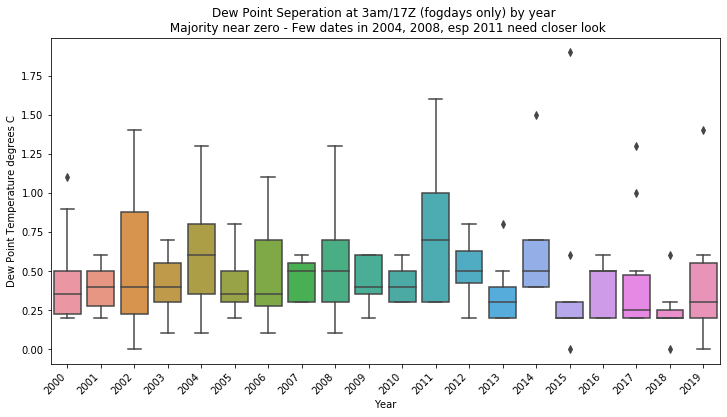

In [64]:
# simple way to get unique values for range of years for data
print(fg_aut.index.year.value_counts().index)

# xlabels = [dict_mon[x+1] for x in g.get_xticks()]
# g.set_xticklabels(xlabels)

fg_MJJAS = fg_melt[( fg_melt.index.month.isin([5,6,7,8,9]))]
'''
https://www.drawingfromdata.com/how-to-rotate-axis-labels-in-seaborn-and-matplotlib
https://medium.com/@neuralnets/data-visualization-with-python-and-seaborn-part-1-29c9478a8700
'''
fig, ax = plt.subplots(1, 1, figsize=(12,6))
#ax.set_xlim=(5,9)
#ax.set_ylim=0,5
dat = fg_aut.loc[fg_aut['fogflag'] & (fg_aut['TmTd17']< 2)]
sns.boxplot(x=dat.index.year,
            y='TmTd17', 
            ax=ax, data=dat)
ax.set_title("Dew Point Seperation at 3am/17Z (fogdays only) by year "+"\n"+" Majority near zero - Few dates in 2004, 2008, esp 2011 need closer look")
ax.set_xlabel("Year")
ax.set_ylabel("Dew Point Temperature degrees C")
#print(list(ax.get_xticklabels()))
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')

{0: '3 pm', 1: '6 pm', 2: '9 pm', 3: '12 am', 4: '3 am', 5: '6 am'}
['3 pm', '6 pm', '9 pm', '12 am', '3 am', '6 am']


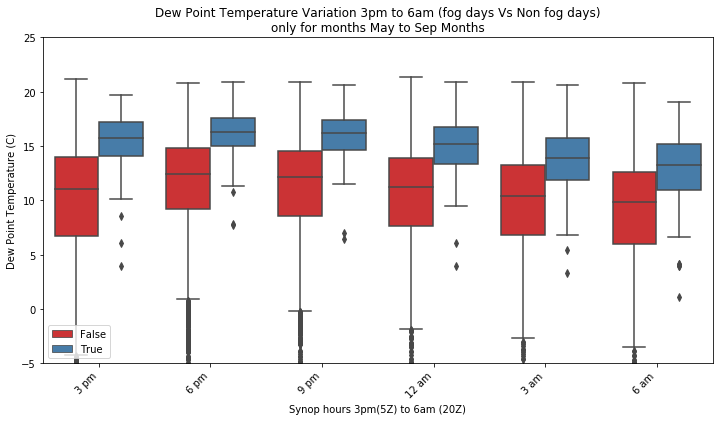

In [65]:
fg_MJJAS = fg_melt[( fg_melt.index.month.isin([5,6,7,8,9]))]
fig, ax = plt.subplots(1, 1, figsize=(12,6))
sns.boxplot(x='Td',
            y='Td_val',
            data=fg_MJJAS,
            ax=ax,hue='fogflag', palette='Set1')

dict_synop_times=dict(zip(ax.get_xticks(),['3 pm','6 pm','9 pm','12 am','3 am','6 am']))
print(dict_synop_times)

ax.set_title("Dew Point Temperature Variation 3pm to 6am (fog days Vs Non fog days)"+"\n"+"only for months May to Sep Months")
xlabels = [dict_synop_times[x] for x in ax.get_xticks()]
print(xlabels)
ax.set_xticklabels(xlabels, rotation=45, horizontalalignment='right')
#ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
ax.set_xlabel("Synop hours 3pm(5Z) to 6am (20Z)")
ax.set_ylabel("Dew Point Temperature (C)")
if station in ['YTWB','YBOK','YBWW']:
    ax.set_ylim(-10,20)#fg_MJJAS['Td_val'].max())
else:
    ax.set_ylim(-5,25)#fg_MJJAS['Td_val'].max())
ax.legend(loc='lower left')

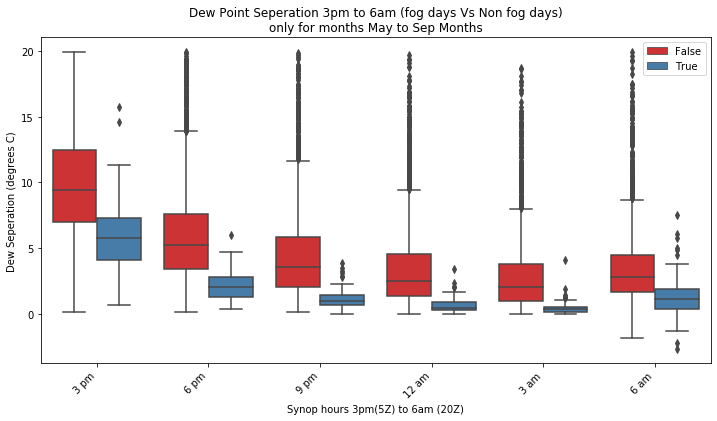

In [66]:
fig, ax = plt.subplots(1, 1, figsize=(12,6))
sns.boxplot(x='TmTd',
            y='TmTd_val',
            data=fg_MJJAS.loc[fg_MJJAS['TmTd_val'] < 20],
            ax=ax,hue='fogflag', palette='Set1')

ax.set_title("Dew Point Seperation 3pm to 6am (fog days Vs Non fog days)"+             "\nonly for months May to Sep Months")
xlabels = [dict_synop_times[x] for x in ax.get_xticks()]
ax.set_xticklabels(xlabels, rotation=45, horizontalalignment='right')
#ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
ax.set_xlabel("Synop hours 3pm(5Z) to 6am (20Z)")
ax.set_ylabel("Dew Seperation (degrees C)")
#ax.set_xlim=(5,9)
#ax.set_ylim=(0,25)
ax.legend(loc='upper right')

Text(0, 0.5, 'Dew Point Seperation (degrees Celcius)')

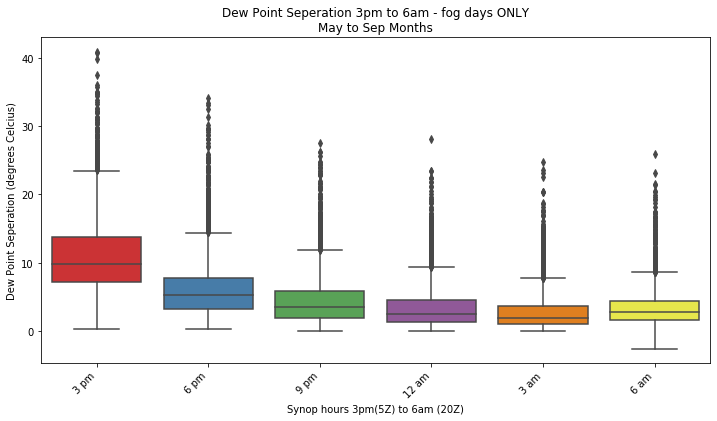

In [67]:
fg_aut.loc[:,(fg_aut.columns.str.contains("TmTd"))].describe()
tmtd_fog_days = fg_aut.loc[fg_aut['fogflag']]

'''Note that for fog days the 14Z and 17Z seperation is <1C in about 75% of the fog cases
Actually middle 50% of cases is between 0.4 to 0.6 @ 14Z, lowest 0.2 to 0.4 @17Z
Replace fog search using Temeprature (no predictabily - see below - with Td Seperation)
'''
tmtd_fog_days.loc[:,(tmtd_fog_days.columns.str.contains("TmTd"))].describe()
fig, ax = plt.subplots(1, 1, figsize=(12,6))
sns.boxplot(x='TmTd',
            y='TmTd_val',
            data=fg_MJJAS, #.loc[fg_MJJAS['TmTd_val'] < 20],
            ax=ax,palette='Set1')

ax.set_title("Dew Point Seperation 3pm to 6am - fog days ONLY"+"\nMay to Sep Months")
xlabels = [dict_synop_times[x] for x in ax.get_xticks()]
ax.set_xticklabels(xlabels, rotation=45, horizontalalignment='right')
ax.set_xlabel("Synop hours 3pm(5Z) to 6am (20Z)")
ax.set_ylabel("Dew Point Seperation (degrees Celcius)")
#ax.legend(loc='upper right')

Text(10, 0.2, '6pm T-Td<3.5\nfor about 95% of days with fog')

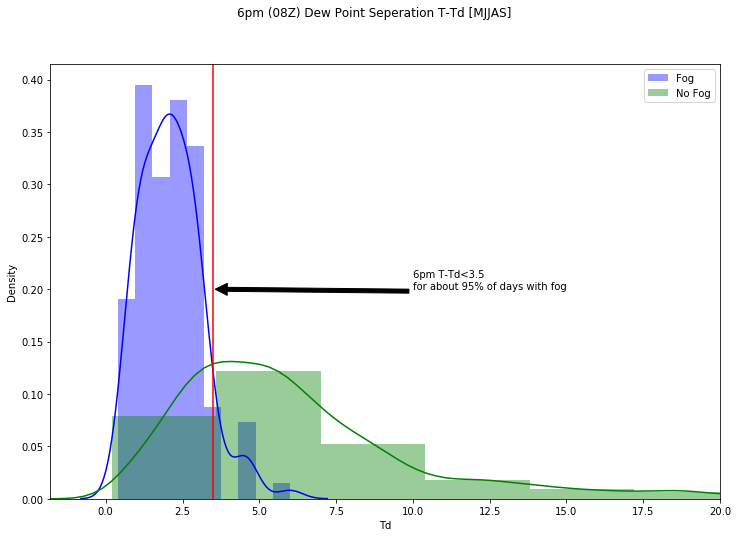

In [68]:

'''
Note that for 6pm Td depression between 0 and about 3, 
the density of fog outcomes is 3 to 4 times density of no fog outcomes
i.e chance of fog on such days 3 to 4 times higher than no fog outcome
'''

fg_JJA = fg_aut[( fg_aut.index.month.isin([5,6,7,8,9]))]
fig, ax = plt.subplots(nrows=1,ncols=1, figsize=(12,8))#,sharex=True,sharey=True)
sns.distplot(fg_JJA.loc[fg_JJA['fogflag'],'TmTd8'].values, kde=True, color='blue', bins=10,ax=ax)
sns.distplot(fg_JJA.loc[~fg_JJA['fogflag'],'TmTd8'].values, kde=True, color='green', bins=10,ax=ax)

ax.legend(['Fog', 'No Fog'])
fig.suptitle(f'6pm (08Z) Dew Point Seperation T-Td [MJJAS]')
ax.set_xlabel('Td')
ax.set_xlim(fg_JJA['TmTd8'].min()-2,20)
ax.set_ylabel('Density')
ax.axvline(x=3.5,color='red')# ymin=0, ymax=1)
ax.annotate('6pm T-Td<3.5\nfor about 95% of days with fog', xy=(3.5, 0.2), xytext=(10, 0.2),
            arrowprops=dict(facecolor='black', shrink=0.01))


In [69]:
#https://mode.com/example-gallery/python_dataframe_styling/
# https://towardsdatascience.com/style-pandas-dataframe-like-a-master-6b02bf6468b0
def color_tmtd(value):
  """
  Colors elements in a dateframe green if TmTd < 1 
  and red if TmTd < 1. Else leave it black.
  """

  if value < 1:
    color = 'green'
  elif value > 2:
    color = 'red'
  else:
    color = 'black'

  return 'color: %s' % color

# see 95% quantile value for 6pm T-Td for fog =True days
julyTmTd = fg_aut.loc[fg_aut.index.month.isin([6,7,8]),\
                      ['fogflag','TmTd5','TmTd8','TmTd11','TmTd14','TmTd17','TmTd20']].\
                groupby(['fogflag']).\
                quantile(q=(0.05,0.2,0.5,0.8,0.95))

#julyTmTd.loc[idx[True,:], ['TmTd5','TmTd8']].style.\
julyTmTd.loc[:, ['TmTd5','TmTd8']].style.\
applymap(color_tmtd, subset=['TmTd8']) # only styling 3pm T-Td
#format({'TmTd8': "{:.2%}"}) to applay any foramting as well

In [70]:
# can also check for rain/no rain seperation as well
julyTmTd = fg_aut.loc[fg_aut.index.month.isin([6,7,8]),\
                      ['rain_flag','fogflag','TmTd5','TmTd8','TmTd11','TmTd14','TmTd17','TmTd20']].\
                groupby(['rain_flag','fogflag']).\
                quantile(q=(0.05,0.2,0.5,0.8,0.95))

julyTmTd.loc[idx[:,True,:], ['TmTd5','TmTd8']].style.\
applymap(color_tmtd, subset=['TmTd8']) # only styling 3pm T-Td

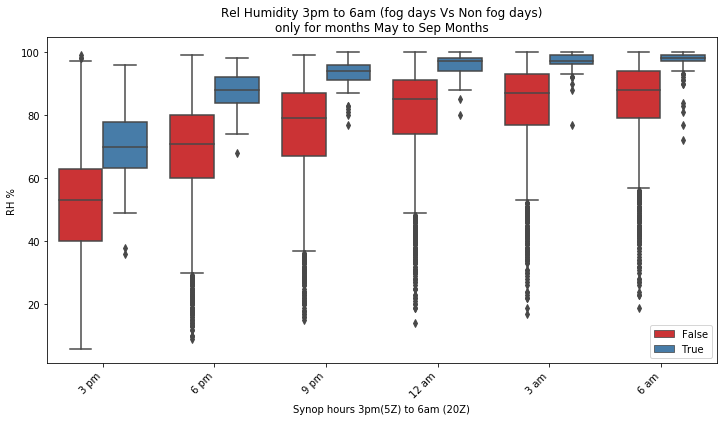

In [71]:
'''Note that for fog days the 14Z and 17Z RH is 94% or 96% in about 75% of the fog cases
Actually middle 50% of cases is between 94 to 96 @ 14Z, and 96-97% @17Z
Note no overlap of mid 50% distribution between fog and non fog days
    Fog days 75% of cases have RH > 94/96% @14/17Z
non Fog days 75% of cases have RH < 89/92% @14/17Z
Excellent prediction variable for fog
Replace fog search using Temperature (no predictabily - see below - with RH)
'''
# fog_days.loc[:,(fog_days.columns.str.contains("RH"))].describe()

#fig=plt.figure(figsize=(10,5))
#ax = fig.add_axes([0, 0, 1, 1])
fig, ax = plt.subplots(1, 1, figsize=(12,6))
sns.boxplot(x='RH',
            y='RH_val',
            data=fg_MJJAS,#.loc[fg_MJJAS['RH_val'] > 40],
            ax=ax,hue='fogflag', palette='Set1')

ax.set_title("Rel Humidity 3pm to 6am (fog days Vs Non fog days)"+             "\nonly for months May to Sep Months")
xlabels = [dict_synop_times[x] for x in ax.get_xticks()]
ax.set_xticklabels(xlabels, rotation=45, horizontalalignment='right')
ax.set_xlabel("Synop hours 3pm(5Z) to 6am (20Z)")
ax.set_ylabel("RH %")
ax.legend(loc='lower right')

Text(10, 0.08, 'Fog days likely given 3pm RH>=60%')

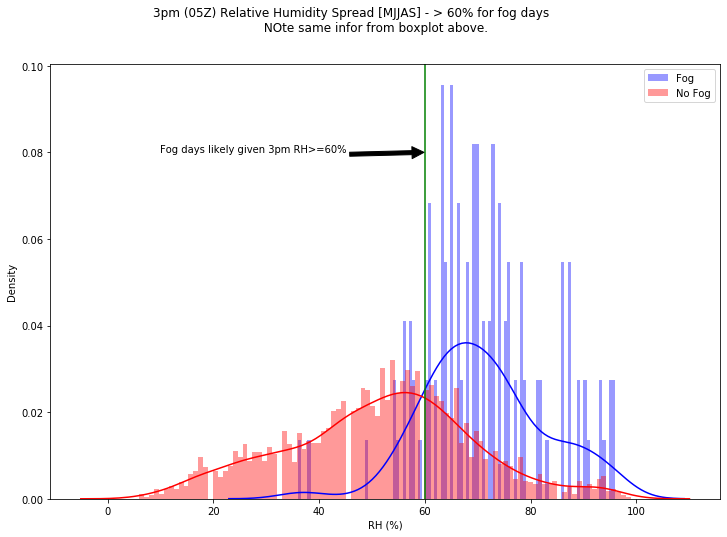

In [72]:
fg_JJA = fg_aut[( fg_aut.index.month.isin([5,6,7,8,9]))]
fig, ax = plt.subplots(nrows=1,ncols=1, figsize=(12,8))#,sharex=True,sharey=True)
sns.distplot(fg_JJA.loc[fg_JJA['fogflag'],'RH5'].values, kde=True, color='blue', bins=100,ax=ax)
sns.distplot(fg_JJA.loc[~fg_JJA['fogflag'],'RH5'].values, kde=True, color='red', bins=100,ax=ax)

ax.legend(['Fog', 'No Fog'])
fig.suptitle(f'3pm (05Z) Relative Humidity Spread [MJJAS] - > 60% for fog days            \n NOte same infor from boxplot above.')
ax.set_xlabel('RH (%)')
ax.set_ylabel('Density')
ax.axvline(x=60,color='green')# ymin=0, ymax=1)
ax.annotate('Fog days likely given 3pm RH>=60%', xy=(60, 0.08), xytext=(10, 0.08),
            arrowprops=dict(facecolor='black', shrink=0.01))

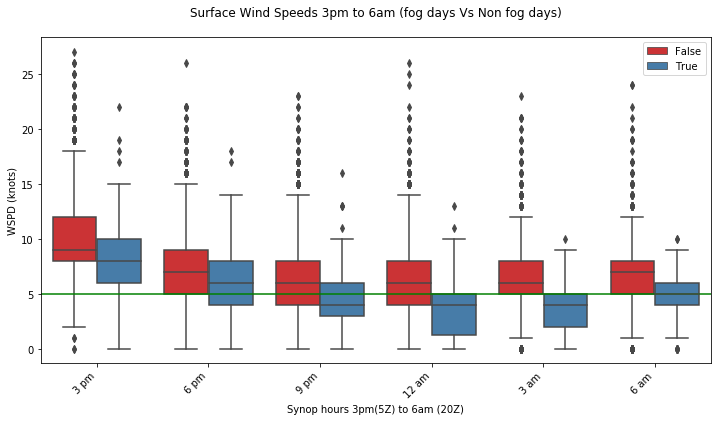

In [73]:
# Rule out fog at YBBN if winds greater than 10 knots 9pm onwards 
# best conditions winds less than 5 knots 12am onwards.

fig, ax = plt.subplots(1, 1, figsize=(12,6))
sns.boxplot(x='wspd',
            y='wspd_val',
            data=fg_MJJAS,
            ax=ax,hue='fogflag', palette='Set1')

ax.set_title("Surface Wind Speeds 3pm to 6am (fog days Vs Non fog days)"+
             "\n"+"")
xlabels = [dict_synop_times[x] for x in ax.get_xticks()]
ax.set_xticklabels(xlabels, rotation=45, horizontalalignment='right')
ax.set_xlabel("Synop hours 3pm(5Z) to 6am (20Z)")
ax.set_ylabel("WSPD (knots)")
ax.legend(loc='upper right')
ax.axhline(y=5,color='green',linestyle='-')# ymin=0, ymax=1)
#ax.axhline(y=10,color='green',linestyle='-')# ymin=0, ymax=1)
#ax.annotate('Fog days likely given 3pm RH>=60%', xy=(60, 0.08), xytext=(10, 0.08),
#            arrowprops=dict(facecolor='black', shrink=0.01))

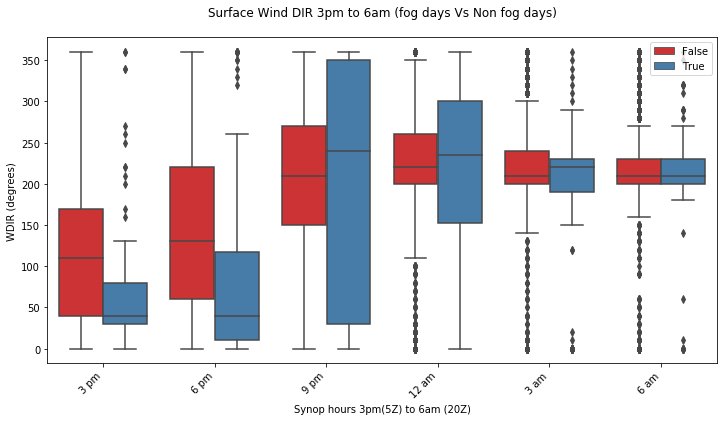

In [74]:
# Note this is not the best plot cause it treats wind dir as a numeric quantity
# However visual does suggest that fog more likely at YBBN for winds from NE quadrant 3pm and 6pm - actually about 3 times as likely for winds about and north of NE, ie.e for directions NE,NNE and N.

fig, ax = plt.subplots(1, 1, figsize=(12,6))
sns.boxplot(x='wdir',
            y='wdir_val',
            data=fg_MJJAS,
            ax=ax,hue='fogflag', palette='Set1')

ax.set_title("Surface Wind DIR 3pm to 6am (fog days Vs Non fog days)"+
             "\n"+"")
xlabels = [dict_synop_times[x] for x in ax.get_xticks()]
ax.set_xticklabels(xlabels, rotation=45, horizontalalignment='right')
ax.set_xlabel("Synop hours 3pm(5Z) to 6am (20Z)")
ax.set_ylabel("WDIR (degrees)")
ax.legend(loc='upper right')

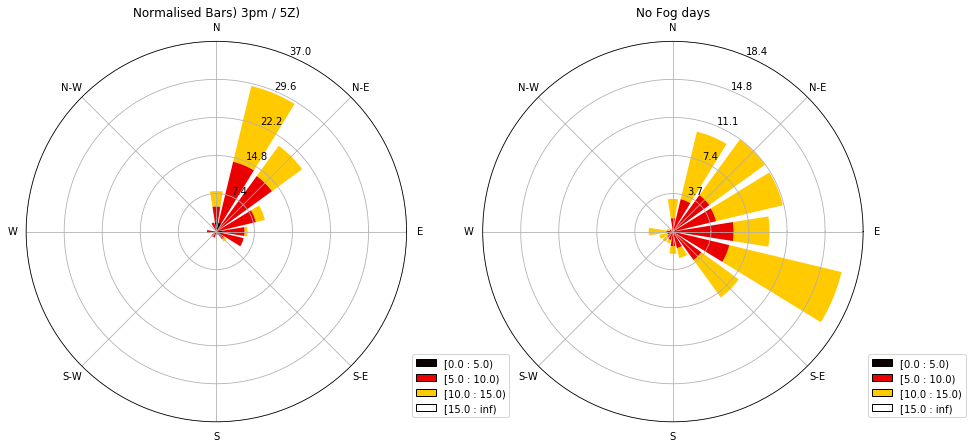

In [75]:
from windrose import WindroseAxes
from windrose import plot_windrose
import matplotlib.cm as cm

wind_3pm_fg = fg_days[['wdir5', 'wspd5']].rename( columns={'wdir5': 'direction', 'wspd5': 'speed'})
wind_3pm_nofg = fg_free_days[['wdir5', 'wspd5']].rename( columns={'wdir5': 'direction', 'wspd5': 'speed'})

fig, (ax1,ax2) = plt.subplots(nrows=1,ncols=2,
                              figsize=(15,12), 
                              subplot_kw=dict(projection='windrose')) #,sharex=True, sharey=True)

if station == 'YTWB':
    plot_windrose(wind_3pm_fg, kind='bar', 
              normed=True, bins=np.arange(0,30,5), 
              cmap=cm.hot, lw=3,ax=ax1)
    plot_windrose(wind_3pm_nofg, kind='bar', 
              normed=True, bins=np.arange(0,30,5), 
              cmap=cm.hot, lw=3,ax=ax2)
else:
    plot_windrose(wind_3pm_fg, kind='bar', 
              normed=True, bins=np.arange(0,20,5), 
              cmap=cm.hot, lw=3,ax=ax1)
    plot_windrose(wind_3pm_nofg, kind='bar', 
              normed=True, bins=np.arange(0,20,5), 
              cmap=cm.hot, lw=3,ax=ax2)
    
    
ax1.legend(bbox_to_anchor=(1, 0))
ax1.set_title("Normalised Bars) 3pm / 5Z)")
#ax2.contourf(wd, ws, bins=np.arange(0, 8, 1), cmap=cm.hot)
    
ax2.legend(bbox_to_anchor=(1, 0))
ax2.set_title("No Fog days")

plt.show()

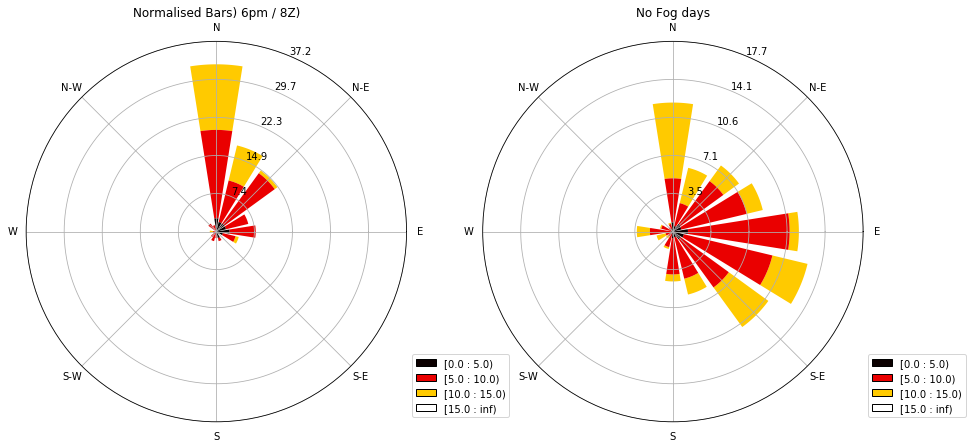

In [76]:
wind_6pm_fg = fg_days[['wdir8', 'wspd8']].rename( columns={'wdir8': 'direction', 'wspd8': 'speed'})
wind_6pm_nofg = fg_free_days[['wdir8', 'wspd8']].rename( columns={'wdir8': 'direction', 'wspd8': 'speed'})

fig, (ax1,ax2) = plt.subplots(nrows=1,ncols=2,
                              figsize=(15,12), 
                              subplot_kw=dict(projection='windrose')) #,sharex=True, sharey=True)

if station == 'YTWB':
    plot_windrose(wind_6pm_fg, kind='bar', 
              normed=True, bins=np.arange(0,30,5), 
              cmap=cm.hot, lw=3,ax=ax1)

    plot_windrose(wind_6pm_nofg, kind='bar', 
              normed=True, bins=np.arange(0,30,5), 
              cmap=cm.hot, lw=3,ax=ax2)
else:
    plot_windrose(wind_6pm_fg, kind='bar', 
              normed=True, bins=np.arange(0,20,5), 
              cmap=cm.hot, lw=3,ax=ax1)

    plot_windrose(wind_6pm_nofg, kind='bar', 
              normed=True, bins=np.arange(0,20,5), 
              cmap=cm.hot, lw=3,ax=ax2)
   
ax1.legend(bbox_to_anchor=(1, 0))
ax1.set_title("Normalised Bars) 6pm / 8Z)")
#ax2.contourf(wd, ws, bins=np.arange(0, 8, 1), cmap=cm.hot)

ax2.legend(bbox_to_anchor=(1, 0))
ax2.set_title("No Fog days")
plt.show()


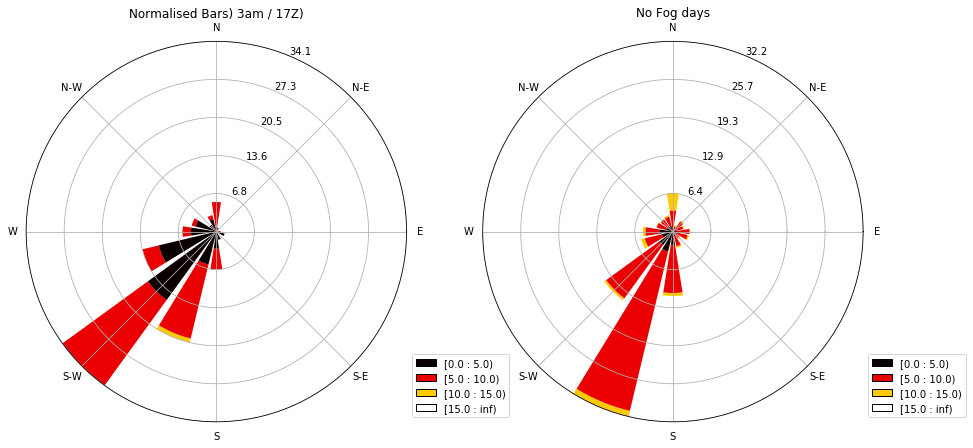

In [77]:
wind_3am_fg = fg_days[['wdir17', 'wspd17']].rename( columns={'wdir17': 'direction', 'wspd17': 'speed'})
wind_3am_nofg = fg_free_days[['wdir17', 'wspd17']].rename( columns={'wdir17': 'direction', 'wspd17': 'speed'})

fig, (ax1,ax2) = plt.subplots(nrows=1,ncols=2,
                              figsize=(15,12), 
                              subplot_kw=dict(projection='windrose')) #,sharex=True, sharey=True)

if station == 'YTWB':
    plot_windrose(wind_3am_fg, kind='bar', 
              normed=True, bins=np.arange(0,30,5), 
              cmap=cm.hot, lw=3,ax=ax1)
    plot_windrose(wind_3am_nofg, kind='bar', 
              normed=True, bins=np.arange(0,30,5), 
              cmap=cm.hot, lw=3,ax=ax2)
else:
    plot_windrose(wind_3am_fg, kind='bar', 
              normed=True, bins=np.arange(0,20,5), 
              cmap=cm.hot, lw=3,ax=ax1)
    plot_windrose(wind_3am_nofg, kind='bar', 
              normed=True, bins=np.arange(0,20,5), 
              cmap=cm.hot, lw=3,ax=ax2)
    
    
ax1.legend(bbox_to_anchor=(1, 0))
ax1.set_title("Normalised Bars) 3am / 17Z)")
#ax2.contourf(wd, ws, bins=np.arange(0, 8, 1), cmap=cm.hot)
    
ax2.legend(bbox_to_anchor=(1, 0))
ax2.set_title("No Fog days")

plt.show()

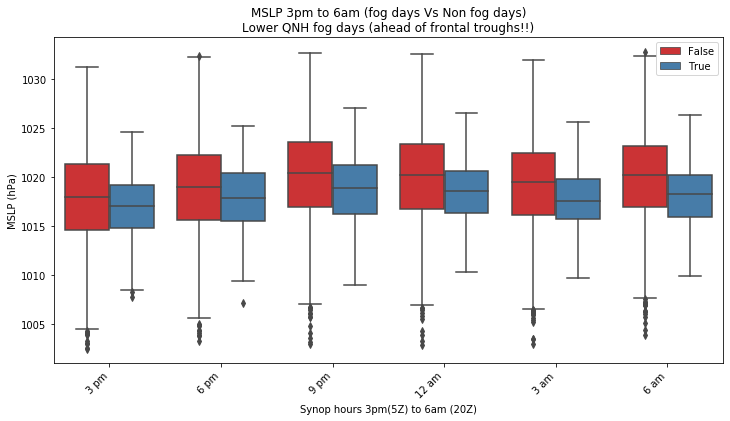

In [78]:
fig, ax = plt.subplots(1, 1, figsize=(12,6))
sns.boxplot(x='QNH',
            y='QNH_val',
            data=fg_MJJAS.loc[fg_MJJAS['QNH_val'] > 1002],
            ax=ax,hue='fogflag', palette='Set1')

ax.set_title("MSLP 3pm to 6am (fog days Vs Non fog days)"+
             "\n"+"Lower QNH fog days (ahead of frontal troughs!!)")
xlabels = [dict_synop_times[x] for x in ax.get_xticks()]
ax.set_xticklabels(xlabels, rotation=45, horizontalalignment='right')
ax.set_xlabel("Synop hours 3pm(5Z) to 6am (20Z)")
ax.set_ylabel("MSLP (hPa)")
ax.legend(loc='upper right')

Text(0, 0.5, 'Density')

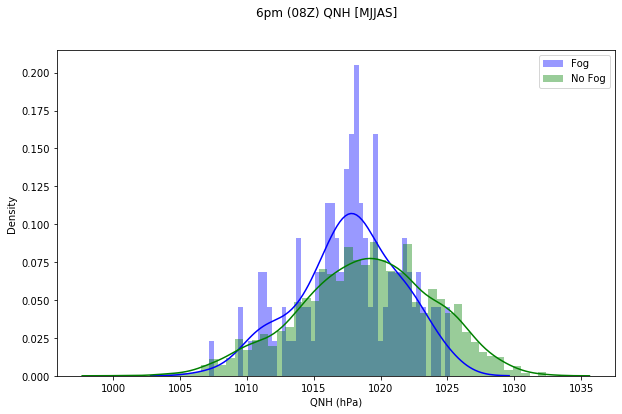

In [79]:
fg_JJA = fg_aut[( fg_aut.index.month.isin([5,6,7,8,9]))]
fig, ax = plt.subplots(nrows=1,ncols=1, figsize=(10,6))#,sharex=True,sharey=True)
sns.distplot(fg_JJA.loc[fg_JJA['fogflag'],'QNH8'].values, kde=True, color='blue', bins=50,ax=ax)
sns.distplot(fg_JJA.loc[~fg_JJA['fogflag'],'QNH8'].values, kde=True, color='green', bins=50,ax=ax)

ax.legend(['Fog', 'No Fog'])
fig.suptitle(f'6pm (08Z) QNH [MJJAS]')
ax.set_xlabel('QNH (hPa)')
ax.set_ylabel('Density')

Text(5, 0.1, 'Fog more likely with\nfalling pressure last 24/48hr')

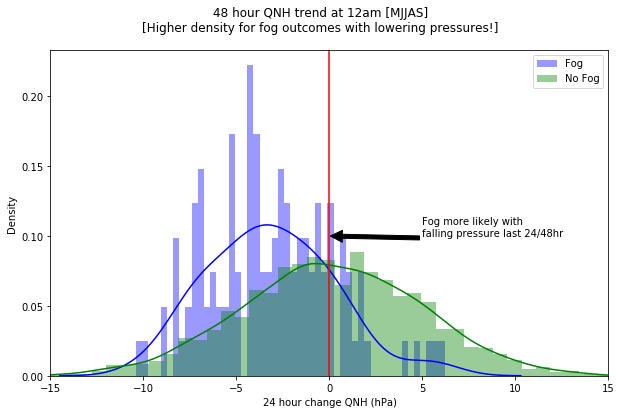

In [80]:
# QNH at synop times are NOT VERY GOOD DISCRIMINATOR between Fog/No Fog Events! BUT QNH trends do.
# 
# Note the quite Bell shaped/normal distribution 48hr change in QNH trend QNH(12am)
# QNH(-48hr) at for no fog outcomes. For fog days however, strongly skewed with majority lowering QNH trend - i.e below 0hpa. Some overlap with no fog outcomes but lowering QNH more convinving for fog outcomes. Some value in considering 24/28 hr QNH trend as fog predictor for YBBN at least.


'''
Density of fog outcomes at least 2 times that of non fog for QNH trend between -3 and -8
'''

fg_JJA = fg_aut[( fg_aut.index.month.isin([5,6,7,8,9]))]#.dropna(subset=['TmTd_trend_5to14'])
fig, ax = plt.subplots(nrows=1,ncols=1, figsize=(10,6))#,sharex=True,sharey=True)
sns.distplot(fg_JJA.loc[fg_JJA['fogflag'],'QNH14_48hr'].values, kde=True, color='blue', bins=50,ax=ax)
sns.distplot(fg_JJA.loc[~fg_JJA['fogflag'],'QNH14_48hr'].values, kde=True, color='green', bins=50,ax=ax)

ax.legend(['Fog', 'No Fog'])
fig.suptitle('48 hour QNH trend at 12am [MJJAS]\n[Higher density for fog outcomes with lowering pressures!]')
ax.set_xlabel('24 hour change QNH (hPa)')
ax.set_ylabel('Density')
ax.set_xlim(-15,15)
ax.axvline(x=0,color='red')# ymin=0, ymax=1)
ax.annotate('Fog more likely with\nfalling pressure last 24/48hr', xy=(0, 0.1), xytext=(5, 0.1),
            arrowprops=dict(facecolor='black', shrink=0.01))

Text(0, 0.5, 'Temperature (degrees C)')

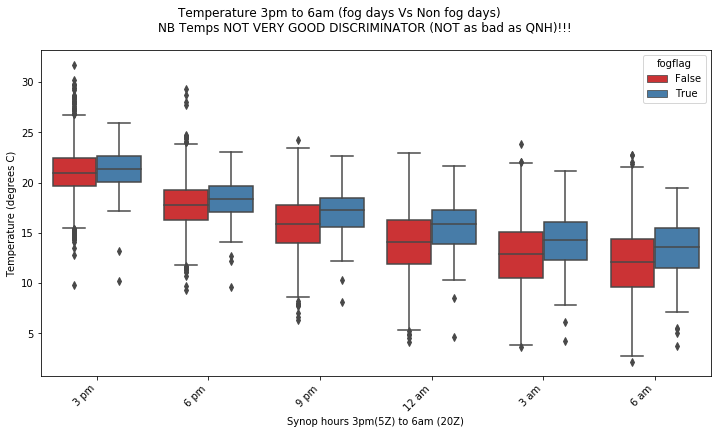

In [81]:
fig, ax = plt.subplots(1, 1, figsize=(12,6))
sns.boxplot(x='T',
            y='T_val',
            data=fg_MJJAS,
            ax=ax,hue='fogflag', palette='Set1')

fig.suptitle(f'Temperature 3pm to 6am (fog days Vs Non fog days)             \nNB Temps NOT VERY GOOD DISCRIMINATOR (NOT as bad as QNH)!!!')
xlabels = [dict_synop_times[x] for x in ax.get_xticks()]
ax.set_xticklabels(xlabels, rotation=45, horizontalalignment='right')
ax.set_xlabel("Synop hours 3pm(5Z) to 6am (20Z)")
ax.set_ylabel("Temperature (degrees C)")

Text(0, 0.5, 'Density')

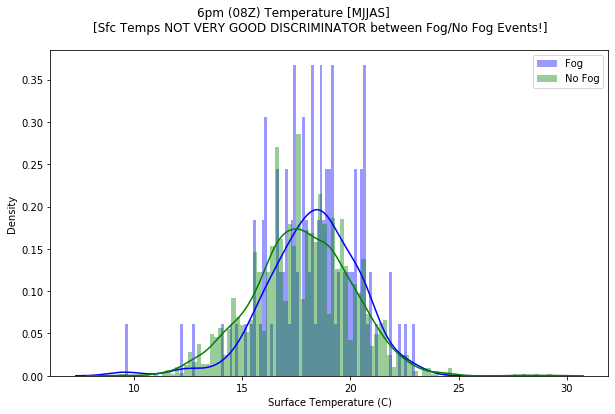

In [82]:
fg_JJA = fg_aut[( fg_aut.index.month.isin([5,6,7,8,9]))]
fig, ax = plt.subplots(nrows=1,ncols=1, figsize=(10,6))#,sharex=True,sharey=True)
sns.distplot(fg_JJA.loc[fg_JJA['fogflag'],'T8'].values, kde=True, color='blue', bins=100,ax=ax)
sns.distplot(fg_JJA.loc[~fg_JJA['fogflag'],'T8'].values, kde=True, color='green', bins=100,ax=ax)

ax.legend(['Fog', 'No Fog'])
fig.suptitle('6pm (08Z) Temperature [MJJAS]              \n[Sfc Temps NOT VERY GOOD DISCRIMINATOR between Fog/No Fog Events!]')
ax.set_xlabel('Surface Temperature (C)')
ax.set_ylabel('Density')

Text(2.5, 0.4, 'Fog more likely with\nlowering seperation last 24/48hr')

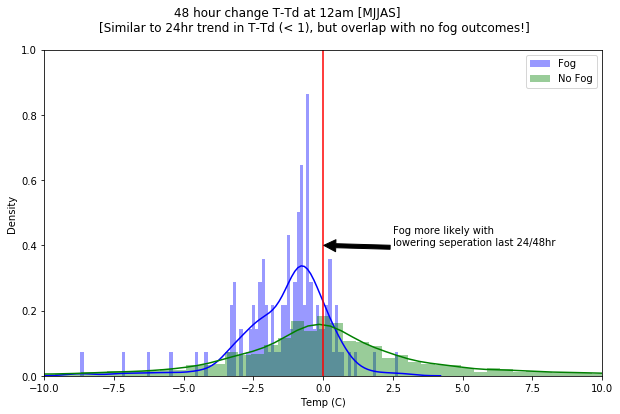

In [83]:
# HIgher chance fog if Td sep trend 48hr 0 to -3
# Normally distributed 24hr change in Td seperation T-Td around 0deg at 12am for no fog outcomes. 
# For fog days however, strongly skewed with majority 80 to 90% less than 1.
# No surprise here although this part of distribution also overlaps with no fog outcomes So marginal value at best.

fg_JJA = fg_aut[( fg_aut.index.month.isin([5,6,7,8,9]))]
fig, ax = plt.subplots(nrows=1,ncols=1, figsize=(10,6))#,sharex=True,sharey=True)
sns.distplot(fg_JJA.loc[fg_JJA['fogflag'],'TmTd14_48hr'].values, kde=True, color='blue', bins=100,ax=ax)
sns.distplot(fg_JJA.loc[~fg_JJA['fogflag'],'TmTd14_48hr'].values, kde=True, color='green', bins=100,ax=ax)

ax.legend(['Fog', 'No Fog'])
fig.suptitle('48 hour change T-Td at 12am [MJJAS]              \n[Similar to 24hr trend in T-Td (< 1), but overlap with no fog outcomes!]')
ax.set_xlabel('Temp (C)')
ax.set_ylabel('Density')
ax.set_ylim(0,1)
ax.set_xlim(-10,10)
ax.axvline(x=0,color='red')# ymin=0, ymax=1)
ax.annotate('Fog more likely with\nlowering seperation last 24/48hr', xy=(0, 0.4), xytext=(2.5, 0.4),
            arrowprops=dict(facecolor='black', shrink=0.01))

In [84]:
'''
Decreasing T-Td trend 3pm to 3am and depression below defined threholds at certain synop times

fg_aut['TmTd_trend_8to17']=\
    (fg_aut['TmTd17']<fg_aut['TmTd14'])&(fg_aut['TmTd14']<fg_aut['TmTd11'])&\
    (fg_aut['TmTd11']<fg_aut['TmTd8'])&(fg_aut['TmTd8']<fg_aut['TmTd5'])&\
    (fg_aut['TmTd17']<1.5) & (fg_aut['TmTd14']<2.5) & (fg_aut['TmTd11']<3.5) # 133 days and 59 had fog
    
Out of about 7000 events,
800 days trend is true - of these about 90 days lead to fog
6200 days trend false - but 74 of this days end up getting fog - not much discrimination!!
'''
# https://pbpython.com/pandas-crosstab.html
pd.crosstab(fg_aut['TmTd_trend_5to14'],fg_aut['fogflag'],margins=True, margins_name="Total")


fogflag,False,True,Total
TmTd_trend_5to14,,,
False,5871,44,5915
True,956,122,1078
Total,6827,166,6993


In [85]:
round(pd.crosstab(fg_aut['TmTd_trend_5to14'],fg_aut['fogflag'],margins=True, margins_name="Total",normalize=True)*100,1)

fogflag,False,True,Total
TmTd_trend_5to14,,,
False,84.0,0.6,84.6
True,13.7,1.7,15.4
Total,97.6,2.4,100.0


In [86]:
round(fg_aut['fogflag'].groupby(fg_aut['TmTd_trend_5to14']).value_counts(normalize=True)*100,0)


TmTd_trend_5to14  fogflag
False             False      99.0
                  True        1.0
True              False      89.0
                  True       11.0
Name: fogflag, dtype: float64

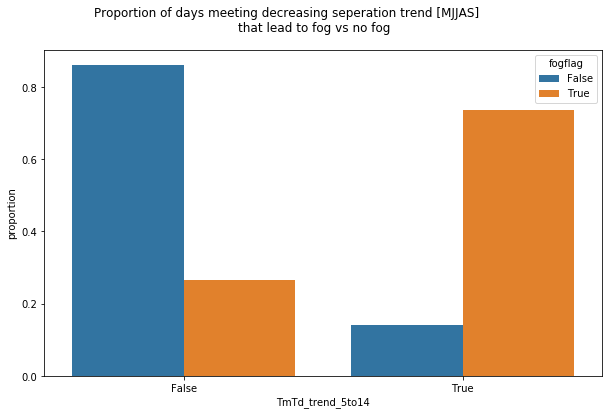

In [87]:
'''
Fog outcome higher (75%) for days meeting decreasing Td seperation between 5Z and 17Z - false alarms 10%
For days not meeting trend about 85% of days did not have fog, but about 25% did - can miss 25% of events!!

good predictive skills!!!
'''

fg_aut['fogflag'].groupby(fg_aut['TmTd_trend_5to14']).value_counts(normalize=True)
percentage = lambda i: len(i) / float(len(x)) * 100

#fig, ax = plt.subplots(nrows=1,ncols=1, figsize=(10,6))
#sns.countplot(x="TmTd_trend_8to17", hue="fogflag",  estimator=percentage,data=fg_aut)

# https://stackoverflow.com/questions/35692781/python-plotting-percentage-in-seaborn-bar-plot

fig, ax = plt.subplots(nrows=1,ncols=1, figsize=(10,6))
fig.suptitle('Proportion of days meeting decreasing seperation trend [MJJAS]              \nthat lead to fog vs no fog')
x, y, hue = "TmTd_trend_5to14", "proportion","fogflag"

(fg_aut['TmTd_trend_5to14']
 .groupby(fg_aut['fogflag'])
 .value_counts(normalize=True)
 .rename(y)
 .reset_index()
 .pipe((sns.barplot, "data"), x='TmTd_trend_5to14', y='proportion', hue='fogflag'));


In [88]:
pd.crosstab(fg_aut['TmTd_trend_5to14'],fg_aut['fogflag']) == \
fg_aut.groupby(['TmTd_trend_5to14', 'fogflag'])['fogflag'].count().unstack().fillna(0)

fogflag,False,True
TmTd_trend_5to14,,
False,True,True
True,True,True


In [89]:
fg_aut.pivot_table(index='TmTd_trend_5to14', columns='fogflag', aggfunc={'fogflag':len}, fill_value=0)

fogflag      
fogflag            False True 
TmTd_trend_5to14              
False               5871    44
True                 956   122

(0.2, 11.527315267525587)

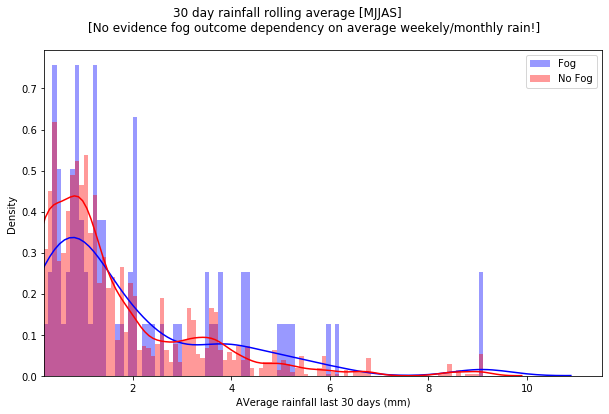

In [90]:
# fg_aut['avg_mthly_rain'] = fg_aut.loc[:,'rain24hr'].rolling(window=30).mean() # 30 day rolling mean`

fg_JJA = fg_aut[( fg_aut.index.month.isin([5,6,7,8,9]))].dropna(subset=['avg_mthly_rain'])
fig, ax = plt.subplots(nrows=1,ncols=1, figsize=(10,6))#,sharex=True,sharey=True)
sns.distplot(fg_JJA.loc[fg_JJA['fogflag'],'avg_mthly_rain'].values, kde=True, color='blue', bins=100,ax=ax)
sns.distplot(fg_JJA.loc[~fg_JJA['fogflag'],'avg_mthly_rain'].values, kde=True, color='red', bins=100,ax=ax)

ax.legend(['Fog', 'No Fog'])
fig.suptitle('30 day rainfall rolling average [MJJAS]              \n[No evidence fog outcome dependency on average weekely/monthly rain!]')
ax.set_xlabel('AVerage rainfall last 30 days (mm)')
ax.set_ylabel('Density')
ax.set_xlim(0.2,)

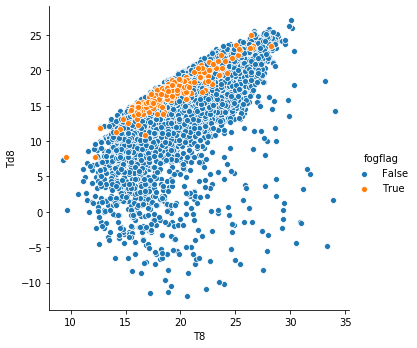

In [91]:
bad_fg_days.columns

sns.pairplot(x_vars=['T8'], y_vars=['Td8'], 
             data=fg_aut,  hue="fogflag", height=5)


In [92]:
fg_aut['T17'].corr(fg_aut['Td17'], method='spearman') #pearson') 90-92%
fg_aut['Td17'].corr(fg_aut['QNH17'], method='spearman') #pearson')


-0.5138121415780554

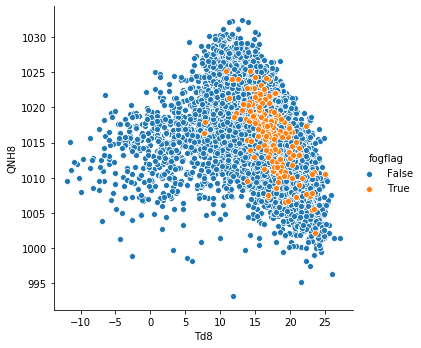

In [93]:
sns.pairplot(x_vars=['Td8'], y_vars=['QNH8'], 
             data=fg_aut,  hue="fogflag", height=5)

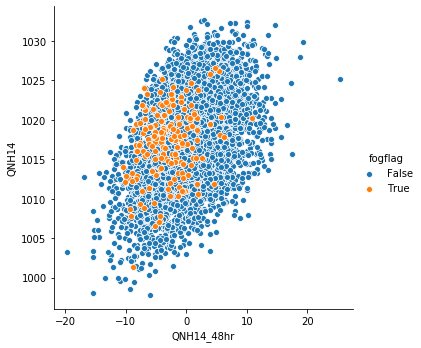

In [94]:
'''Higher Td > 10 associated with fog events
No sig relatiosnhip with QNH
However majority of fog cases in YBBN ssociated with falling
QNH trend ove 48 hours - most Brissy fog events with approaching 
westerly trough/frontal systems'''
sns.pairplot(x_vars=['QNH14_48hr'], y_vars=['QNH14'], 
             data=fg_aut,  hue="fogflag", height=5)

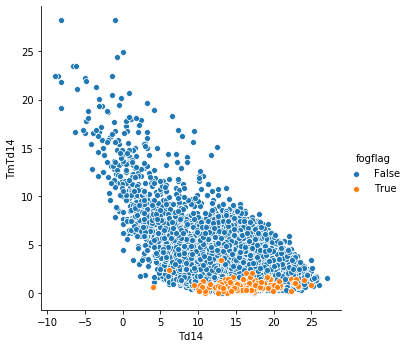

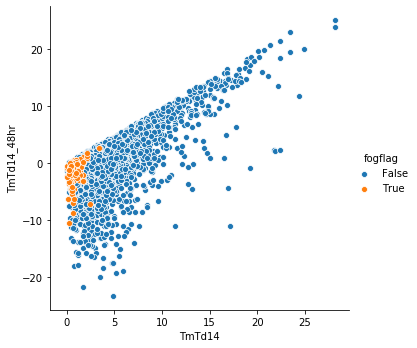

In [95]:
sns.pairplot(x_vars=['Td14'], y_vars=['TmTd14'], 
             data=fg_aut,  hue="fogflag", height=5)
sns.pairplot(x_vars=['TmTd14'], y_vars=['TmTd14_48hr'], 
             data=fg_aut,  hue="fogflag", height=5)

In [96]:
# We get fog data from Robs and align my start date with his
rob_dates = bous.get_fog_data_robs_FCT(station=station,get_dates_only="Yep")
print(f'Only {rob_dates.shape[0]} fog days for Brisbane in Robs data!')
print(f'From start_date:{rob_dates[0]} to end_date:{rob_dates[-1]}')


Getting fog data for YBBN derived using ROBS FCT
Only 46 fog days for Brisbane in Robs data!
From start_date:2008-05-16 to end_date:2018-09-08


In [97]:
#df = bous.process_climate_zone_csv_2020('app/data/HM01X_Data_040842.txt')
#ff = bous.process_climate_zone_csv_2020('YBBN')
#ff.tail()

In [98]:
'''Now grab climate zone data file for station '''
#from utility_functions_sep2018 import process_climate_zone_csv_2020
#from utility_functions_sep2018 import get_sounding_data
#from utility_functions_sep2018 import get_climatological_fog_probability

import pickle
import os
station=station
df  = pickle.load(
                open(
                os.path.join('app','data', station+'_aws.pkl'), 'rb'))

'''
# If/When data file is updated
df = bous.process_climate_zone_csv_2020('app/data/HM01X_Data_040842.txt')

# filter 1800Z - actually 3am/1700z data so between_time('16:50','17:10')
'''
print(f'Number of days in dataset:\
{pd.date_range(start=df.index[0],end=df.index[-1],freq="D").shape[0]},\n\
From start_date={df.index[0]} to end_date={df.index[-1]}')


Number of days in dataset:7569,
From start_date=2000-01-01 00:00:00 to end_date=2020-09-20 18:30:00


In [99]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 372074 entries, 2000-01-01 00:00:00 to 2020-09-20 18:30:00
Data columns (total 42 columns):
AvID            372074 non-null object
M_type          372074 non-null object
pptn10min       371719 non-null float64
pptnSince9      368817 non-null float64
T               372006 non-null float64
Td              371993 non-null float64
RH              371993 non-null float64
WS              372035 non-null float64
WDir            372022 non-null float64
MaxGust10min    369550 non-null float64
QNH             370234 non-null float64
CL1_amnt        263180 non-null float64
CL1_ht          263118 non-null float64
CL2_amnt        149751 non-null float64
CL2_ht          149750 non-null float64
CL3_amnt        56033 non-null float64
CL3_ht          56033 non-null float64
Ceil1_amnt      372074 non-null object
Ceil1_ht        161406 non-null float64
Ceil2_amnt      372074 non-null object
Ceil2_ht        88399 non-null float64
Ceil3_amnt      372074

In [100]:
# not good - have 100ft cloud in results - we want > 1000ft
df.query(('Ceil1_ht > 1000' and 'Ceil1_amnt.str.contains("SCT|BKN|OVC")') or \
         ('Ceil2_ht > 1000' and 'Ceil2_amnt.str.contains("SCT|BKN|OVC")') or  \
         ('Ceil3_ht > 1000' and 'Ceil3_amnt.str.contains("SCT|BKN|OVC")'))[['Ceil1_ht','Ceil1_amnt','Ceil2_ht','Ceil2_amnt','Ceil3_ht','Ceil3_amnt']].head()

,Ceil1_ht,Ceil1_amnt,Ceil2_ht,Ceil2_amnt,Ceil3_ht,Ceil3_amnt
date,,,,,,
2000-07-24 16:30:00,100.0,BKN,NaN,,NaN,
2000-07-24 17:00:00,400.0,BKN,NaN,,NaN,
2000-07-24 17:52:00,100.0,SCT,NaN,,NaN,
2000-07-24 18:30:00,100.0,SCT,NaN,,NaN,
2000-07-25 19:00:00,3500.0,SCT,NaN,,NaN,


In [101]:
# not good - still have 100ft cloud in results - we want > 1000ft
df.query('Ceil1_ht > 1000' and 'Ceil1_amnt.str.contains("SCT|BKN|OVC")')         [['Ceil1_ht','Ceil1_amnt']].head()


,Ceil1_ht,Ceil1_amnt
date,,
2000-07-24 16:30:00,100.0,BKN
2000-07-24 17:00:00,400.0,BKN
2000-07-24 17:52:00,100.0,SCT
2000-07-24 18:30:00,100.0,SCT
2000-07-25 19:00:00,3500.0,SCT


In [102]:
# chaining queries work
df.query('Ceil1_ht > 500').query('Ceil1_amnt.str.contains("SCT|BKN|OVC")')[['Ceil1_ht','Ceil1_amnt']].head()

,Ceil1_ht,Ceil1_amnt
date,,
2000-07-25 19:00:00,3500.0,SCT
2000-07-26 01:30:00,5000.0,SCT
2000-07-26 02:00:00,5200.0,OVC
2000-07-26 02:30:00,6100.0,SCT
2000-07-26 03:00:00,5500.0,SCT


In [103]:
cldy_days =   set(
    np.unique((df.query('Ceil1_ht > 500').query('Ceil1_amnt.str.contains("BKN|OVC")')).index.date))\
.union(
  set(
    np.unique((df.query('Ceil2_ht > 500').query('Ceil2_amnt.str.contains("BKN|OVC")')).index.date)))\
.union(
    set(
    np.unique((df.query('Ceil3_ht > 500').query('Ceil3_amnt.str.contains("BKN|OVC")')).index.date)))

print(len(sorted(cldy_days, reverse=True)))
# sorted(cldy_days, reverse=True)

5936


In [104]:
# no ned for np.unique - sets only have unique values anyway
cldy_days =   set(
    (df.query('Ceil1_ht > 500').query('Ceil1_amnt.str.contains("BKN|OVC")')).index.date)\
.union(
  set(
    (df.query('Ceil2_ht > 500').query('Ceil2_amnt.str.contains("BKN|OVC")')).index.date))\
.union(
    set(
    (df.query('Ceil3_ht > 500').query('Ceil3_amnt.str.contains("BKN|OVC")')).index.date))

len(sorted(cldy_days, reverse=True))

5936

In [105]:
# does it really matter if cld if FEW or SCT or BKN or OVC 
# just the fact there is cloud above 500ft is sufficient!
cldy_days =   set(
    (df.query('Ceil1_ht > 500')).index.date)\
.union(
  set(
    (df.query('Ceil2_ht > 500')).index.date))\
.union(
    set(
    (df.query('Ceil3_ht > 500')).index.date))

len(sorted(cldy_days, reverse=True))

6433

In [106]:
# thats too many cloudy days!!!!!!!!! 6282???
len(np.unique(df.index.date))


7567

In [172]:
# extract data for 12am, 3am, 5am  also merge in fogflag for those days
# note fog flag is for calendar days starting 00Z or actually 0200 UTC 
# e.g Fog flag for Wed 11th Nov is actually for fog that occurs
# anytime from 0000Z/0200Z Wed 11th to 2330Z Wed 11th (actuall allow upto 0200Z Thu 12th !!)
# so no problem merging with aws data as that also for UTC date starting 00 UTC 11th to 00Z Thu 12th

'''
7394 days
between_time('16:50','17:10') - 7445 rows - too many (resample('D') fix!)
between_time('16:55','17:05') - 7381 about 15 less days
between_time('16:59','17:01') - 7358 about 44 fewer days
'''
dat11 = df[['WDir','WS','T','Td','RH','pptnSince9','vis','vis_aws','PW','QNH',
   'Ceil1_ht','Ceil1_amnt','Ceil2_ht','Ceil2_amnt','Ceil3_ht','Ceil3_amnt']]\
.between_time('10:50','11:10').resample('D').first().loc[df.index[0]:df.index[-1]]
dat11 = pd.merge(left=dat11,right=fg_aut[['fogflag']],left_index=True, right_index=True, how='left')

dat14 = df[['WDir','WS','T','Td','RH','pptnSince9','vis','vis_aws','PW','QNH',
   'Ceil1_ht','Ceil1_amnt','Ceil2_ht','Ceil2_amnt','Ceil3_ht','Ceil3_amnt']]\
.between_time('13:50','14:10').resample('D').first().loc[df.index[0]:df.index[-1]]
dat14 = pd.merge(left=dat14,right=fg_aut[['fogflag']],left_index=True, right_index=True, how='left')

dat17 = df[['WDir','WS','T','Td','RH','pptnSince9','vis','vis_aws','PW','QNH',
   'Ceil1_ht','Ceil1_amnt','Ceil2_ht','Ceil2_amnt','Ceil3_ht','Ceil3_amnt']]\
.between_time('16:50','17:10').resample('D').first().loc[df.index[0]:df.index[-1]]
dat17 = pd.merge(left=dat17,right=fg_aut[['fogflag']],left_index=True, right_index=True, how='left')

dat23 = df[['WDir','WS','T','Td','RH','pptnSince9','vis','vis_aws','PW','QNH',
   'Ceil1_ht','Ceil1_amnt','Ceil2_ht','Ceil2_amnt','Ceil3_ht','Ceil3_amnt']]\
.between_time('22:50','23:10').resample('D').first().loc[df.index[0]:df.index[-1]]
dat23 = pd.merge(left=dat23,right=fg_aut[['fogflag']],left_index=True, right_index=True, how='left')

dat05 = df[['WDir','WS','T','Td','RH','pptnSince9','vis','vis_aws','PW','QNH',
   'Ceil1_ht','Ceil1_amnt','Ceil2_ht','Ceil2_amnt','Ceil3_ht','Ceil3_amnt']]\
.between_time('04:50','05:10').resample('D').first().loc[df.index[0]:df.index[-1]]
dat05 = pd.merge(left=dat05,right=fg_aut[['fogflag']],left_index=True, right_index=True, how='left')

In [108]:
fg_aut.index

DatetimeIndex(['2000-02-09', '2000-02-10', '2000-02-11', '2000-02-12',
               '2000-02-13', '2000-02-16', '2000-02-17', '2000-02-18',
               '2000-02-19', '2000-02-20',
               ...
               '2020-03-18', '2020-03-19', '2020-03-21', '2020-03-22',
               '2020-03-23', '2020-03-24', '2020-03-25', '2020-03-26',
               '2020-03-27', '2020-03-28'],
              dtype='datetime64[ns]', length=6993, freq=None)

In [109]:
# print(dat14.query('Ceil3_ht > 1000').query('Ceil3_amnt.str.contains("BKN|OVC")').shape)

cldy_days =   set(
    (dat11.query('Ceil1_ht > 1000')).index.date)\
.union(
  set(
    (dat11.query('Ceil2_ht > 1000')).index.date))\
.union(
    set(
    (dat11.query('Ceil3_ht > 1000')).index.date))

print(fg_aut.shape[0],len(cldy_days))
# very handy isin() to flag days with cloud cover
print (dat11.index.isin(cldy_days))

dat11['cldy'] = dat11.index.isin(cldy_days)

cldy_days =   set(
    (dat14.query('Ceil1_ht > 1000')).index.date)\
.union(
  set(
    (dat14.query('Ceil2_ht > 1000')).index.date))\
.union(
    set(
    (dat14.query('Ceil3_ht > 1000')).index.date))

print(fg_aut.shape[0],len(cldy_days))
dat14['cldy'] = dat14.index.isin(cldy_days)

cldy_days =   set(
    (dat17.query('Ceil1_ht > 1000')).index.date)\
.union(
  set(
    (dat17.query('Ceil2_ht > 1000')).index.date))\
.union(
    set(
    (dat17.query('Ceil3_ht > 1000')).index.date))

print(fg_aut.shape[0],len(cldy_days))
dat17['cldy'] = dat17.index.isin(cldy_days)

6993 3340
[False False False ...  True  True False]
6993 3472
6993 3291


In [110]:
'''About 3200 cloud days out of 7392 days is just under half - plausible!! although still seems many

Check below confirms that days clasified cloudy has some SCT or BKN cld cove above 1000ft '''

dat14[['cldy','Ceil1_ht','Ceil1_amnt','Ceil2_ht','Ceil2_amnt','Ceil3_ht','Ceil3_amnt']].loc[dat14['cldy']]

#Would need pd.get_dummies() to use this flag variable for model training

,cldy,Ceil1_ht,Ceil1_amnt,Ceil2_ht,Ceil2_amnt,Ceil3_ht,Ceil3_amnt
date,,,,,,,
2000-01-09,True,6100.0,SCT,8300.0,SCT,12000.0,OVC
2000-01-12,True,9000.0,SCT,NaN,,NaN,
2000-02-08,True,3600.0,SCT,7600.0,SCT,10000.0,OVC
2000-02-11,True,6100.0,OVC,NaN,,NaN,
2000-02-12,True,3400.0,SCT,4300.0,SCT,NaN,
...,...,...,...,...,...,...,...
2020-09-07,True,11500.0,OVC,NaN,,NaN,
2020-09-09,True,3400.0,BKN,NaN,,NaN,
2020-09-17,True,2100.0,OVC,NaN,,NaN,


In [ ]:
#fig, ax = plt.subplots(1, 1, figsize=(10,5))
#sns.catplot(x="cldy", y="Ceil1_ht", hue="fogflag", kind="swarm", data=dat14,ax=ax)
#ax.set_title("Dew Point Temperature 3am (fog days Vs Non fog days)")
#ax.set_xlabel('Months', color='g', fontsize=15)
#xlabels = [dict_mon[x+1] for x in ax.get_xticks()]
#ax.set_xticklabels(xlabels, rotation=45, horizontalalignment='right')
#ax.legend(loc='lower left')
#sns.despine(offset=5, trim=True)  # x-axis tick labels won't rotate with this line

In [ ]:
imp.reload(bous)

In [115]:
import os
time='1700'
os.path.join(cur_dir,'app','data',station+'_sonde_'+time+'_aws.pkl')

'/home/bou/shared/stats-R/flask_projects/avguide/app/data/YBBN_sonde_1700_aws.pkl'

In [120]:
# Now merge with sonde 900hpa data - to get 23Z sonde pass time='23'
# If we have a new data grab - need to run this script again
# sonde = bous.batch_process_F160_hanks(station='YBBN',time='1700')
# otherwise just load pickled sonde file

# sonde = bous.get_sounding_data(station='YBBN',time='17')  obseleted
time='1700'
sonde = pickle.load(
            open(os.path.join(cur_dir,'app','data',station+'_sonde_'+time+'_aws.pkl'), 'rb'))
sonde = sonde.dropna(axis='rows', how='all')
print(f'Sonde data shape {sonde.shape} - from {sonde.index[0]} to {sonde.index[-1]}')

# only keep sonde data for period we have fog dates/data
sonde = sonde.loc[fg_aut.index[0]:fg_aut.index[-1]]
print(f'Sonde data new size/shape {sonde.shape}')

'''To trully be able to capture seasonal variations
    we have to convert calendar day to a categorical variable.
    We can bin months like this '''
    # DJF 'summer',MAM  'autumn', JJA 'winter', SON 'spring'
seasons = {'summer': [12, 1, 2], 'autumn': [3, 4, 5],
               'winter': [6, 7, 8], 'spring': [9, 10, 11]}

sonde['season'] = ''
for k, v in enumerate(seasons):
    # print (v,seasons[v])
    # print(obs.index.month.isin(seasons[v]))
    sonde.loc[sonde.index.month.isin(seasons[v]), 'season'] = v

# get some lapse rates to see association between stability and fog freq
# note sfc_T is actually is lowest level temp data 
# may not be really at surface but okay for most cases

sonde['lr_sfc_850']=sonde['sfc_T'] - sonde['T850']
sonde['lr_850_500']=sonde['T850'] - sonde['T500']
#sonde['mid_rh']=    sonde['T700'] - sonde['Td700']
sonde['mid_rh']=  (
    (sonde['T850'] - sonde['Td850'])+\
    (sonde['T700'] - sonde['Td700'])+\
    (sonde['T500'] - sonde['Td500']))/3
print(sonde.shape)
print(sonde['lr_850_500'].isnull().sum())
print(sonde['lr_sfc_850'].isnull().sum())

# get fogflag into sonde data
# don't as sonde data may be UTC date for sonding times 17Z and 19Z and 23Z
# sonde = pd.merge(left=sonde,right=fg_aut[['fogflag']],left_index=True, right_index=True, how='left')
# sonde['fogflag']=np.where(sonde["fogflag"] == True, True, False)
sonde17 = sonde
print(sonde17.columns)
sonde17.tail(2)


Sonde data shape (6963, 26) - from 2000-06-05 00:00:00 to 2020-06-08 00:00:00
Sonde data new size/shape (6895, 26)
(6895, 30)
4907
4897
Index(['sfc_P', 'sfc_T', 'sfc_Td', 'sfc_wdir', 'sfc_wspd', 'P910', 'T910',
       'Td910', '900_wdir', '900_WS', 'P850', 'T850', 'Td850', '850_wdir',
       '850_WS', 'P700', 'T700', 'Td700', '700_wdir', '700_WS', 'P500', 'T500',
       'Td500', '500_wdir', '500_WS', 'tmp_rate850_500', 'season',
       'lr_sfc_850', 'lr_850_500', 'mid_rh'],
      dtype='object')


,sfc_P,sfc_T,sfc_Td,sfc_wdir,sfc_wspd,P910,T910,Td910,900_wdir,900_WS,...,P500,T500,Td500,500_wdir,500_WS,tmp_rate850_500,season,lr_sfc_850,lr_850_500,mid_rh
2020-03-27,1018.0,17.8,15.3,220.0,6.2,910.0,NaN,NaN,120.0,25.8,...,500.0,-12.7,-19.7,245.0,7.2,25.7,autumn,4.8,25.7,4.866667
2020-03-28,1017.0,19.4,18.7,205.0,7.2,910.0,NaN,NaN,90.0,5.2,...,500.0,-11.1,-34.1,260.0,15.4,23.1,autumn,7.4,23.1,9.400000


In [121]:
# Now merge with sonde 900hpa data - to get 23Z sonde pass time='23'
# sonde = bous.get_sounding_data(station='YBBN',time='23')   obseleted

time='2300'
sonde = pickle.load(
            open(os.path.join(cur_dir,'app','data',station+'_sonde_'+time+'_aws.pkl'), 'rb'))
sonde.dropna(axis='rows', how='all',inplace=True)

print(f'Sonde data shape {sonde.shape} - from {sonde.index[0]} to {sonde.index[-1]}')

# only keep sonde data for period we have fog dates/data
sonde = sonde.loc[fg_aut.index[0]:fg_aut.index[-1]]
print(f'Sonde data new size/shape {sonde.shape}')

'''To trully be able to capture seasonal variations
    we have to convert calendar day to a categorical variable.
    We can bin months like this '''
    # DJF 'summer',MAM  'autumn', JJA 'winter', SON 'spring'
seasons = {'summer': [12, 1, 2], 'autumn': [3, 4, 5],
               'winter': [6, 7, 8], 'spring': [9, 10, 11]}

sonde['season'] = ''
for k, v in enumerate(seasons):
    # print (v,seasons[v])
    # print(obs.index.month.isin(seasons[v]))
    sonde.loc[sonde.index.month.isin(seasons[v]), 'season'] = v

# get some lapse rates to see association between stability and fog freq
# note sfc_T is actually is lowest level temp data 
# may not be really at surface but okay for most cases

sonde['lr_sfc_850']=sonde['sfc_T'] - sonde['T850']
sonde['lr_850_500']=sonde['T850'] - sonde['T500']
#sonde['mid_rh']=    sonde['T700'] - sonde['Td700']
sonde['mid_rh']=  (
    (sonde['T850'] - sonde['Td850'])+\
    (sonde['T700'] - sonde['Td700'])+\
    (sonde['T500'] - sonde['Td500']))/3
print(sonde.shape)
print(sonde['lr_850_500'].isnull().sum())
print(sonde['lr_sfc_850'].isnull().sum())

# get fogflag into sonde data
# don't as sonde data may be UTC date for sonding times 17Z and 19Z and 23Z
# sonde = pd.merge(left=sonde,right=fg_aut[['fogflag']],left_index=True, right_index=True, how='left')
# sonde['fogflag']=np.where(sonde["fogflag"] == True, True, False)
sonde23 = sonde
print(sonde23.columns)
sonde23.tail(2)

Sonde data shape (6964, 26) - from 2000-02-05 00:00:00 to 2020-06-07 00:00:00
Sonde data new size/shape (6891, 26)
(6891, 30)
39
19
Index(['sfc_P', 'sfc_T', 'sfc_Td', 'sfc_wdir', 'sfc_wspd', 'P910', 'T910',
       'Td910', '900_wdir', '900_WS', 'P850', 'T850', 'Td850', '850_wdir',
       '850_WS', 'P700', 'T700', 'Td700', '700_wdir', '700_WS', 'P500', 'T500',
       'Td500', '500_wdir', '500_WS', 'tmp_rate850_500', 'season',
       'lr_sfc_850', 'lr_850_500', 'mid_rh'],
      dtype='object')


,sfc_P,sfc_T,sfc_Td,sfc_wdir,sfc_wspd,P910,T910,Td910,900_wdir,900_WS,...,P500,T500,Td500,500_wdir,500_WS,tmp_rate850_500,season,lr_sfc_850,lr_850_500,mid_rh
2020-03-27,1020.0,23.8,16.8,155.0,6.2,910.0,NaN,NaN,95.0,20.6,...,500.0,-12.3,-31.3,335.0,5.2,24.5,autumn,11.6,24.5,8.366667
2020-03-28,1019.0,23.2,19.2,90.0,7.2,910.0,NaN,NaN,95.0,6.2,...,500.0,-11.5,-43.5,265.0,17.4,23.5,autumn,11.2,23.5,12.900000


In [122]:
print(sonde17.shape, sonde23.shape)
sonde23.info()

(6895, 30) (6891, 30)
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 6891 entries, 2000-02-09 to 2020-03-28
Data columns (total 30 columns):
sfc_P              6891 non-null float64
sfc_T              6891 non-null float64
sfc_Td             6891 non-null float64
sfc_wdir           6891 non-null float64
sfc_wspd           6891 non-null float64
P910               6891 non-null float64
T910               488 non-null float64
Td910              488 non-null float64
900_wdir           6683 non-null float64
900_WS             6683 non-null float64
P850               6891 non-null float64
T850               6872 non-null float64
Td850              6872 non-null float64
850_wdir           6625 non-null float64
850_WS             6625 non-null float64
P700               6891 non-null float64
T700               6868 non-null float64
Td700              6868 non-null float64
700_wdir           6734 non-null float64
700_WS             6734 non-null float64
P500               6891 non-null fl

In [173]:
# merge sonde into aws data - this will trim aws data outside first/last fog dates
# but ensures validity/integrity fog flag - also carries fog flag from dat to sonde
# also we bring surface conditions winds, temps etc from aws data not from sonde

# # for some reason after merge - fogflag stops being boolean - fix it

aws14_sonde17 = pd.merge(
    left=dat14, 
    right=sonde17[['900_wdir', '900_WS','850_wdir', '850_WS',\
                 'season', 'lr_850_500','lr_sfc_850','mid_rh']],
    left_index=True, right_index=True, how='right')
aws14_sonde17['fogflag']=np.where(aws14_sonde17["fogflag"] == True, True, False)


aws17_sonde17 = pd.merge(
    left=dat17, 
    right=sonde17[['900_wdir', '900_WS','850_wdir', '850_WS',\
                 'season', 'lr_850_500','lr_sfc_850','mid_rh']],
    left_index=True, right_index=True, how='right')
aws17_sonde17['fogflag']=np.where(aws17_sonde17["fogflag"] == True, True, False)


aws17_sonde23 = pd.merge(
    left=dat17, 
    right=sonde23[['900_wdir', '900_WS','850_wdir', '850_WS',\
                 'season', 'lr_850_500','lr_sfc_850','mid_rh']],
    left_index=True, right_index=True, how='right')
aws17_sonde23['fogflag']=np.where(aws17_sonde23["fogflag"] == True, True, False)

aws23_sonde23 = pd.merge(
    left=dat23, 
    right=sonde23[['900_wdir', '900_WS','850_wdir', '850_WS',\
                 'season', 'lr_850_500','lr_sfc_850','mid_rh']],
    left_index=True, right_index=True, how='right')
aws23_sonde23['fogflag']=np.where(aws23_sonde23["fogflag"] == True, True, False)

aws23_sonde23.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 6891 entries, 2000-02-09 to 2020-03-28
Data columns (total 25 columns):
WDir          6850 non-null float64
WS            6850 non-null float64
T             6849 non-null float64
Td            6849 non-null float64
RH            6849 non-null float64
pptnSince9    6775 non-null float64
vis           6839 non-null float64
vis_aws       6692 non-null float64
PW            481 non-null float64
QNH           6838 non-null float64
Ceil1_ht      3025 non-null float64
Ceil1_amnt    6850 non-null object
Ceil2_ht      1557 non-null float64
Ceil2_amnt    6850 non-null object
Ceil3_ht      839 non-null float64
Ceil3_amnt    6850 non-null object
fogflag       6891 non-null bool
900_wdir      6683 non-null float64
900_WS        6683 non-null float64
850_wdir      6625 non-null float64
850_WS        6625 non-null float64
season        6891 non-null object
lr_850_500    6852 non-null float64
lr_sfc_850    6872 non-null float64
mid_rh        6847 n

In [135]:
# note that fog predictions can be done two ways
# lets say its 00Z now or 04Z or 05Z and we would like to estimate fog potential for next day
# we can use forecast sonde data i.e cur_day+1700Z or cur_day+2300Z model sonde data
# merge that with cur_days 0200Z or 0500Z aws data (for sfc T,Td,, QNH etc) and see well 
# prediction goes

# to test this scheme we would merge this way (both aws and sonde from same UTC date) 
# this is kind of like forecast 23Z sonde for next morning but since we have sonde for all days
# this is like a perfect prog method - we just use next days sonde instead !!
# and we use this dataset for pattern matching
# so 05Z T,Td,QNH, winds etc and 23Z sonde 900winds - find all matching and see fog fractions
# for matching days

aws05_sonde23 = pd.merge(
    left=dat05, 
    right=sonde23[['900_wdir', '900_WS','850_wdir', '850_WS',\
                 'season', 'lr_850_500','lr_sfc_850','mid_rh']],
    left_index=True, right_index=True, how='right')



# another way is use cur_days 0200 or 0500Z data and latest sonde - usually 2300Z 
# (about 3 to 6 hours old sonde data )and see how well these predictions go 
# so say its 0200 or 0500Z on Wed 11th Nov, we use this same mornings 23Z sonde
# which would be dated Tue 10th Nov (UTC date) 
# Now with merging on index - both dates should match 
# so we would need to reindex our sonde data so that Tue 10th Nov data gets index of Wed 11th Nov !!!
# i.e we nned to increment each of the dates by one day - then merge would get right data

# to test this approach we need to 
sonde23_new = sonde23.set_index(sonde23.index + pd.Timedelta(str(1) + ' days'))
aws05_sonde23_new = pd.merge(
    left=dat05, 
    right=sonde23_new[['900_wdir', '900_WS','850_wdir', '850_WS',\
                 'season', 'lr_850_500','lr_sfc_850','mid_rh']],
    left_index=True, right_index=True, how='right')



In [126]:
sonde23.tail()

,sfc_P,sfc_T,sfc_Td,sfc_wdir,sfc_wspd,P910,T910,Td910,900_wdir,900_WS,...,P500,T500,Td500,500_wdir,500_WS,tmp_rate850_500,season,lr_sfc_850,lr_850_500,mid_rh
2020-03-24,1021.0,22.6,18.2,205.0,4.2,910.0,NaN,NaN,90.0,16.4,...,500.0,-9.7,-32.7,245.0,17.4,20.9,autumn,11.4,20.9,8.633333
2020-03-25,1020.0,25.4,16.4,160.0,6.2,910.0,NaN,NaN,115.0,8.2,...,500.0,-10.5,-38.5,260.0,27.8,22.3,autumn,13.6,22.3,20.666667
2020-03-26,1021.0,23.2,17.2,190.0,6.2,910.0,NaN,NaN,150.0,13.4,...,500.0,-11.5,-32.5,250.0,13.4,21.7,autumn,13.0,21.7,8.866667
2020-03-27,1020.0,23.8,16.8,155.0,6.2,910.0,NaN,NaN,95.0,20.6,...,500.0,-12.3,-31.3,335.0,5.2,24.5,autumn,11.6,24.5,8.366667
2020-03-28,1019.0,23.2,19.2,90.0,7.2,910.0,NaN,NaN,95.0,6.2,...,500.0,-11.5,-43.5,265.0,17.4,23.5,autumn,11.2,23.5,12.900000


In [127]:
sonde23_new.tail()

,sfc_P,sfc_T,sfc_Td,sfc_wdir,sfc_wspd,P910,T910,Td910,900_wdir,900_WS,...,P500,T500,Td500,500_wdir,500_WS,tmp_rate850_500,season,lr_sfc_850,lr_850_500,mid_rh
2020-03-25,1021.0,22.6,18.2,205.0,4.2,910.0,NaN,NaN,90.0,16.4,...,500.0,-9.7,-32.7,245.0,17.4,20.9,autumn,11.4,20.9,8.633333
2020-03-26,1020.0,25.4,16.4,160.0,6.2,910.0,NaN,NaN,115.0,8.2,...,500.0,-10.5,-38.5,260.0,27.8,22.3,autumn,13.6,22.3,20.666667
2020-03-27,1021.0,23.2,17.2,190.0,6.2,910.0,NaN,NaN,150.0,13.4,...,500.0,-11.5,-32.5,250.0,13.4,21.7,autumn,13.0,21.7,8.866667
2020-03-28,1020.0,23.8,16.8,155.0,6.2,910.0,NaN,NaN,95.0,20.6,...,500.0,-12.3,-31.3,335.0,5.2,24.5,autumn,11.6,24.5,8.366667
2020-03-29,1019.0,23.2,19.2,90.0,7.2,910.0,NaN,NaN,95.0,6.2,...,500.0,-11.5,-43.5,265.0,17.4,23.5,autumn,11.2,23.5,12.900000


In [128]:
# note aws data at 0500Z for 26th and 27th March
dat05.loc['26-03-2020':'28-03-2020']

,WDir,WS,T,Td,RH,pptnSince9,vis,vis_aws,PW,QNH,Ceil1_ht,Ceil1_amnt,Ceil2_ht,Ceil2_amnt,Ceil3_ht,Ceil3_amnt,fogflag
date,,,,,,,,,,,,,,,,,
2020-03-26,100.0,8.9,26.6,17.5,57.0,0.0,10.0,10.0,NaN,1018.5,3300.0,SCT,NaN,,NaN,,False
2020-03-27,170.0,11.1,23.0,17.9,73.0,0.0,10.0,10.0,NaN,1019.7,1900.0,BKN,4400.0,BKN,9700.0,OVC,False
2020-03-28,120.0,8.9,25.7,18.6,65.0,0.0,10.0,10.0,NaN,1017.5,7300.0,BKN,NaN,,NaN,,False


In [129]:
# note sonde23 data for 26th and 27th March
sonde23.loc['26-03-2020':'28-03-2020', [ '900_wdir', '900_WS','850_wdir','850_WS'] ]

,900_wdir,900_WS,850_wdir,850_WS
2020-03-26,150.0,13.4,125.0,17.4
2020-03-27,95.0,20.6,110.0,13.4
2020-03-28,95.0,6.2,80.0,8.2


In [130]:
''' The simple merge with no reindexing works as expected '''
aws05_sonde23.loc['26-03-2020':'28-03-2020']

,WDir,WS,T,Td,RH,pptnSince9,vis,vis_aws,PW,QNH,...,Ceil3_amnt,fogflag,900_wdir,900_WS,850_wdir,850_WS,season,lr_850_500,lr_sfc_850,mid_rh
2020-03-26,100.0,8.9,26.6,17.5,57.0,0.0,10.0,10.0,NaN,1018.5,...,,False,150.0,13.4,125.0,17.4,autumn,21.7,13.0,8.866667
2020-03-27,170.0,11.1,23.0,17.9,73.0,0.0,10.0,10.0,NaN,1019.7,...,OVC,False,95.0,20.6,110.0,13.4,autumn,24.5,11.6,8.366667
2020-03-28,120.0,8.9,25.7,18.6,65.0,0.0,10.0,10.0,NaN,1017.5,...,,False,95.0,6.2,80.0,8.2,autumn,23.5,11.2,12.900000


In [131]:
'''However notice how the sonde data for 26-03-2020  and 27-03-2020
gets merged with aws data for 27th and 28th respectively in aws05_sonde23_new dataset

this is cause of
sonde23_new = sonde23.set_index(sonde23.index + pd.Timedelta(str(1) + ' days'))
'''
aws05_sonde23_new.loc['26-03-2020':'28-03-2020']

,WDir,WS,T,Td,RH,pptnSince9,vis,vis_aws,PW,QNH,...,Ceil3_amnt,fogflag,900_wdir,900_WS,850_wdir,850_WS,season,lr_850_500,lr_sfc_850,mid_rh
2020-03-26,100.0,8.9,26.6,17.5,57.0,0.0,10.0,10.0,NaN,1018.5,...,,False,115.0,8.2,80.0,9.2,autumn,22.3,13.6,20.666667
2020-03-27,170.0,11.1,23.0,17.9,73.0,0.0,10.0,10.0,NaN,1019.7,...,OVC,False,150.0,13.4,125.0,17.4,autumn,21.7,13.0,8.866667
2020-03-28,120.0,8.9,25.7,18.6,65.0,0.0,10.0,10.0,NaN,1017.5,...,,False,95.0,20.6,110.0,13.4,autumn,24.5,11.6,8.366667


We will try to run pattern matching both ways -
so using either 0200, 0400, or 0500Z obs for day we need want to run predictions for the 0606 TAF obviously

but either 
1. use forecast sonde data as in aws05_sonde23   (since we running predictions in hindsight we actually have this forecast sodes!!)


2. use current days latest sonde (which would be 23Z/9am sonde for current day )


We run using both approaches and see which has better skills

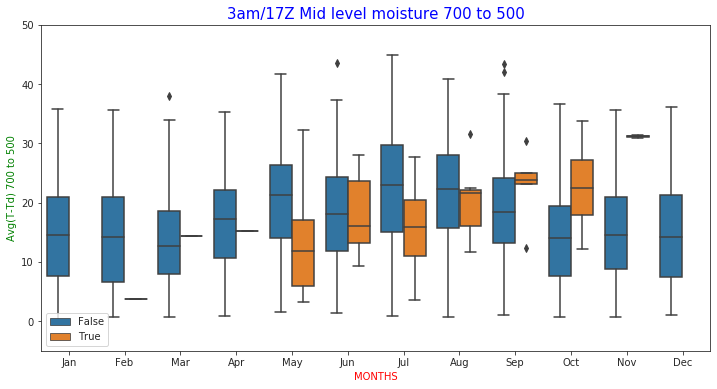

In [136]:
#Just checking for Mid level moisture
import seaborn as sns
sns.set_style('ticks')
fig, ax = plt.subplots(1, 1, figsize=(12,6))
# fig.set_size_inches(11.7,8.27) # the size of A4 paper
sns.boxplot(ax=ax,
              x=aws17_sonde17.index.month,
              y='mid_rh',#y='lr_850_500',
              hue='fogflag',
              data=aws17_sonde17)

ax.set_title("3am/17Z Mid level moisture 700 to 500", color='b',fontsize=15)
ax.set_ylabel('Avg(T-Td) 700 to 500', color='g', fontsize=10)
ax.set_ylim(-5,50)  #plt.ylim(0,20) #plt.ylim(10,36)
ax.set_xlabel('MONTHS', color='r', fontsize=10)
xlabels = [dict_mon[x+1] for x in ax.get_xticks()]
ax.set_xticklabels(xlabels)
ax.legend(loc='lower left')
ax.tick_params(labelsize=10)

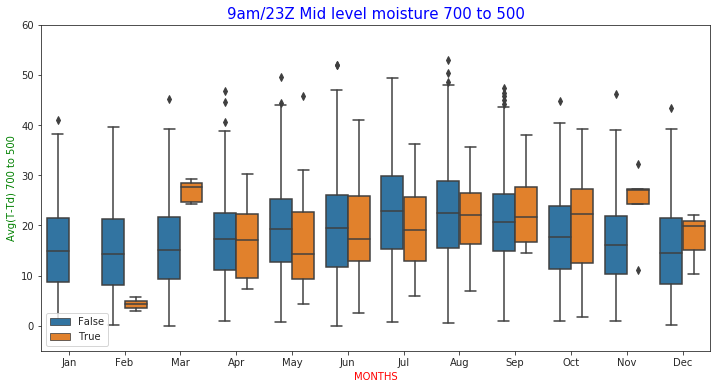

In [137]:
'''Just checking for Mid level moisture'''
import seaborn as sns
sns.set_style('ticks')
fig, ax = plt.subplots(1, 1, figsize=(12,6))
# fig.set_size_inches(11.7,8.27) # the size of A4 paper
sns.boxplot(ax=ax,
              x=aws23_sonde23.index.month,
              y='mid_rh',#y='lr_850_500',
              hue='fogflag',
              data=aws23_sonde23)

ax.set_title("9am/23Z Mid level moisture 700 to 500", color='b',fontsize=15)
ax.set_ylabel('Avg(T-Td) 700 to 500', color='g', fontsize=10)
ax.set_ylim(-5,60)  #plt.ylim(0,20) #plt.ylim(10,36)
ax.set_xlabel('MONTHS', color='r', fontsize=10)
xlabels = [dict_mon[x+1] for x in ax.get_xticks()]
ax.set_xticklabels(xlabels)
ax.legend(loc='lower left')
ax.tick_params(labelsize=10)

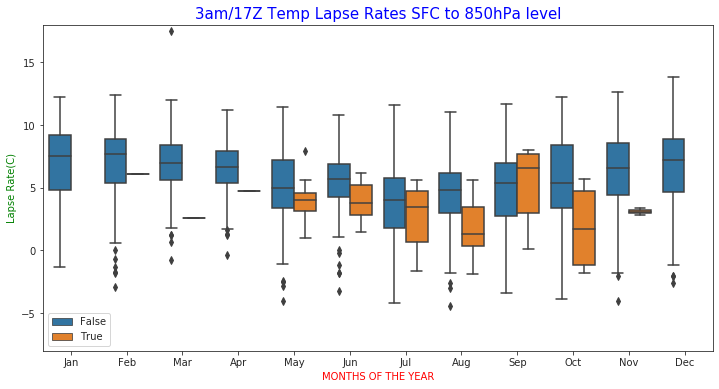

In [139]:
'''Just checking for stable lapse rates sfc to 850 @ 23Z/9am
Looks like GOOD discriminator between fog/no fog from Mar to Aug - possibly til Oct
with stable lapse rates < 10-11 with fog cases 
Little overlap of middle 50% (25th to 75th percentile)  
so looks like 9am sonde (although released around time fog is clearing)
has some predictive capability for fog that formed few hours earlier.
This would make sense esp. in winter when surface mixing starts quite late around 8/9am
'''
import seaborn as sns
sns.set_style('ticks')
fig, ax = plt.subplots(1, 1, figsize=(12,6))
# fig.set_size_inches(11.7,8.27) # the size of A4 paper
sns.boxplot(ax=ax,
              x=aws17_sonde17.index.month,
              y='lr_sfc_850',#y='lr_850_500',
              hue='fogflag',
              data=aws17_sonde17)

ax.set_ylim(-8,18)  #plt.ylim(0,20) #plt.ylim(10,36)
ax.set_title("3am/17Z Temp Lapse Rates SFC to 850hPa level", color='b',fontsize=15)
ax.set_ylabel('Lapse Rate(C)', color='g', fontsize=10)
ax.set_xlabel('MONTHS OF THE YEAR', color='r', fontsize=10)
xlabels = [dict_mon[x+1] for x in ax.get_xticks()]
ax.set_xticklabels(xlabels)
ax.legend(loc='lower left')
ax.tick_params(labelsize=10)

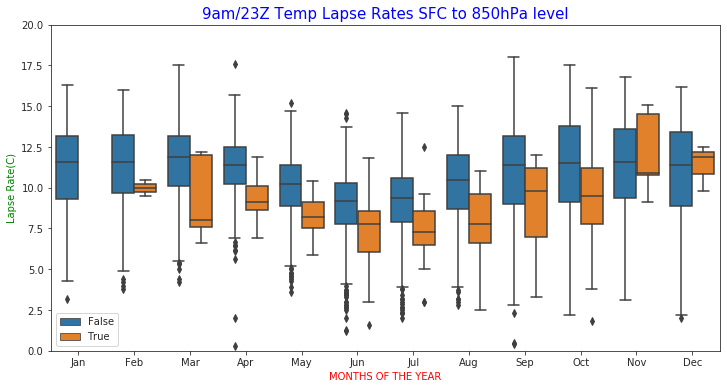

In [140]:
fig, ax = plt.subplots(1, 1, figsize=(12,6))
sns.boxplot(ax=ax,
              x=aws23_sonde23.index.month,
              y='lr_sfc_850',#y='lr_850_500',
              hue='fogflag',
              data=aws23_sonde23)

ax.set_ylim(0,20)#plt.ylim(0,20) #plt.ylim(10,36)
ax.set_title("9am/23Z Temp Lapse Rates SFC to 850hPa level", color='b',fontsize=15)
ax.set_ylabel('Lapse Rate(C)', color='g', fontsize=10)
ax.set_xlabel('MONTHS OF THE YEAR', color='r', fontsize=10)
xlabels = [dict_mon[x+1] for x in ax.get_xticks()]
ax.set_xticklabels(xlabels)
ax.legend(loc='lower left')
ax.tick_params(labelsize=10)

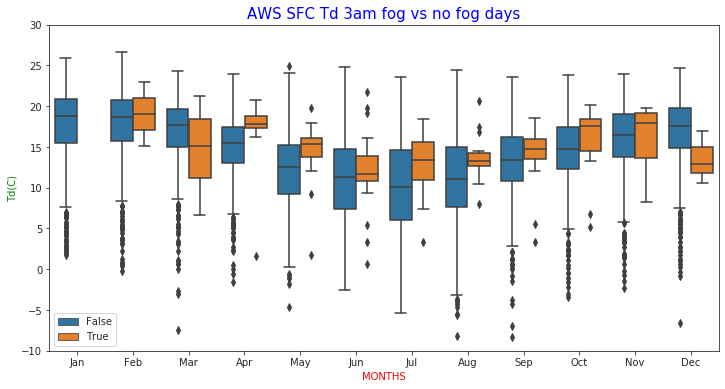

In [141]:
'''Using Td from aws data at 17z/3am Td
quite a lot of overlap with no fog days during MJJA - not very useful !!
'''
fig, ax = plt.subplots(1, 1, figsize=(12,6))
# the size of A4 paper
# fig.set_size_inches(11.7,8.27)
#fig,ax = plt.subplots(figsize=(10,6))
sns.boxplot(ax=ax,
              x=aws17_sonde17.index.month,
              y='Td',
              hue='fogflag',
              data=aws17_sonde17)

ax.set_ylim(-10,30)  #plt.ylim(0,20) #plt.ylim(10,36)
ax.set_title("AWS SFC Td 3am fog vs no fog days", color='b',fontsize=15)
ax.set_ylabel('Td(C)', color='g', fontsize=10)
ax.set_xlabel('MONTHS', color='r', fontsize=10)
xlabels = [dict_mon[x+1] for x in ax.get_xticks()]
ax.set_xticklabels(xlabels)
ax.legend(loc='lower left')
ax.tick_params(labelsize=10)


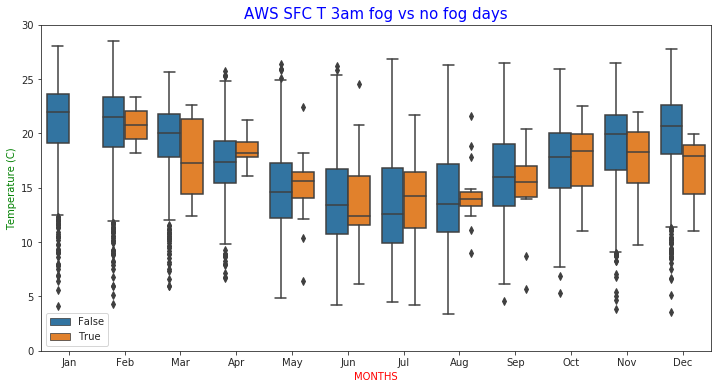

In [143]:

'''Surface T not great discriminator for fog/no fog seperation'''
fig, ax = plt.subplots(1, 1, figsize=(12,6))
# the size of A4 paper
# fig.set_size_inches(11.7,8.27)
#fig,ax = plt.subplots(figsize=(10,6))
sns.boxplot(ax=ax,
              x=aws17_sonde17.index.month,
              y='T',
              hue='fogflag',
              data=aws17_sonde17)

ax.set_ylim(0,30)  #plt.ylim(0,20) #plt.ylim(10,36)
ax.set_title("AWS SFC T 3am fog vs no fog days", color='b',fontsize=15)
ax.set_ylabel('Temperature (C)', color='g', fontsize=10)
ax.set_xlabel('MONTHS', color='r', fontsize=10)
xlabels = [dict_mon[x+1] for x in ax.get_xticks()]
ax.set_xticklabels(xlabels)
ax.tick_params(labelsize=10)
ax.legend(loc='lower left')


In [144]:
aws17_sonde17['TmTd'] = aws17_sonde17['T'] - aws17_sonde17['Td']
print(aws17_sonde17.shape)
aws = aws17_sonde17[pd.notnull(aws17_sonde17['TmTd'])]
print(aws.shape)

(6895, 26)
(6857, 26)


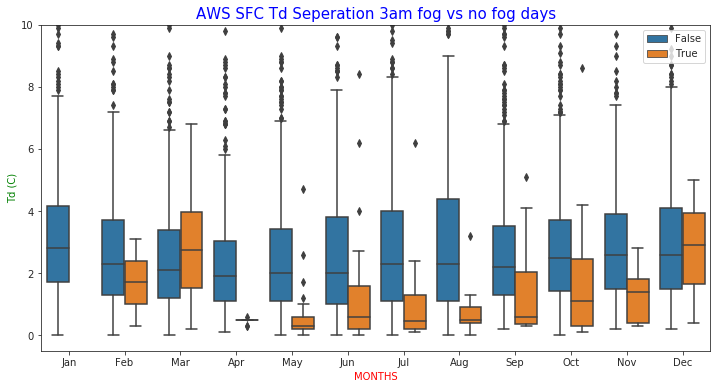

In [145]:

'''Surface Td seperation great discriminator for fog/no fog seperation
TmTd means all below 1 for fog days, fog non-fog days means all above 2
so possible use for seperation
 
esp MJJA when almost no overlap of mid 50% of distribution between fog and non fog events
'''
fig, ax = plt.subplots(1, 1, figsize=(12,6))
sns.boxplot(ax=ax,
            x=aws.index.month,
            y='TmTd',
            hue='fogflag',
            data=aws)

ax.set_ylim(-0.5,10)  #plt.ylim(0,20) #plt.ylim(10,36)
ax.set_title("AWS SFC Td Seperation 3am fog vs no fog days", color='b',fontsize=15)
ax.set_ylabel('Td (C)', color='g', fontsize=10)
ax.set_xlabel('MONTHS', color='r', fontsize=10)
xlabels = [dict_mon[x+1] for x in ax.get_xticks()]
ax.set_xticklabels(xlabels)
ax.tick_params(labelsize=10)
ax.legend(loc='upper right')

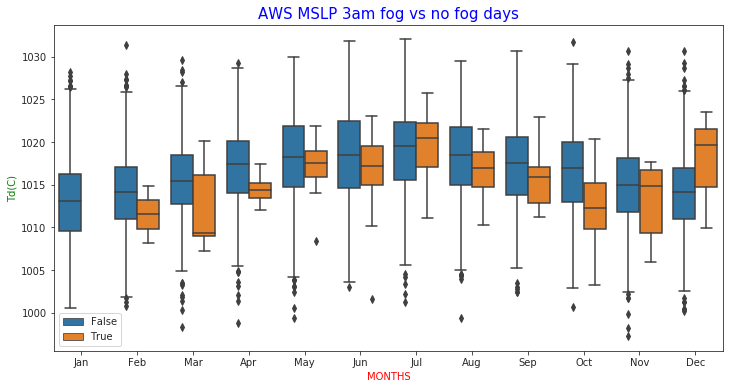

In [146]:
fig, ax = plt.subplots(1, 1, figsize=(12,6))
# the size of A4 paper
# fig.set_size_inches(11.7,8.27)
#fig,ax = plt.subplots(figsize=(10,6))
ax=sns.boxplot(ax=ax,
            x=aws17_sonde17.index.month,
            y='QNH',
            hue='fogflag',
            data=aws17_sonde17)

ax.set_title("AWS MSLP 3am fog vs no fog days", color='b',fontsize=15)
ax.set_ylabel('Td(C)', color='g', fontsize=10)
ax.set_xlabel('MONTHS', color='r', fontsize=10)
xlabels = [dict_mon[x+1] for x in ax.get_xticks()]
ax.set_xticklabels(xlabels)
ax.tick_params(labelsize=10)
ax.legend(loc='lower left')

In [147]:
# list of bins (limits) used for wind speeds knots
# 0-2knots, , 2-4 knots, ... 8 to 10 knots
np.arange(0, 10, 2)

array([0, 2, 4, 6, 8])

Strongest wind at 3am/1700Z = 10.0 knots, lightest = 0.0


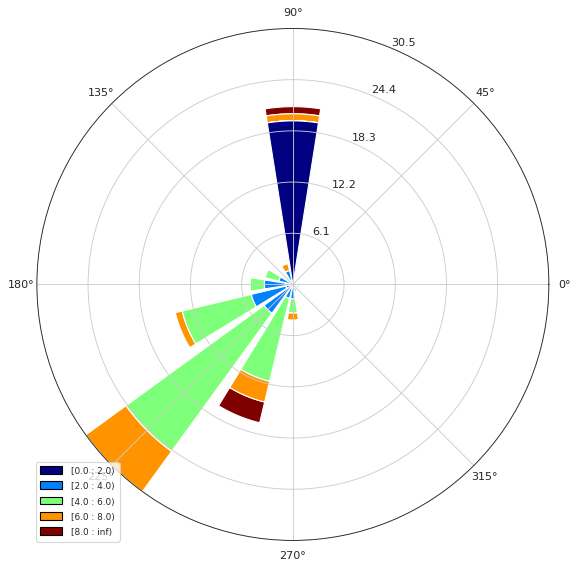

In [148]:
from windrose import WindroseAxes
import matplotlib.cm as cm

#bad_fg_days
#not_in_bad_fg_days

fg_days=fg_aut.loc[fg_aut['fogflag']]; fg_days.shape
fg_free_days=fg_aut.loc[~fg_aut['fogflag']]
# fg_aut.columns
'''
https://windrose.readthedocs.io/en/latest/usage.html
Other possible type of windrose plots
stacked histogram representation, not normed, with bins limits'''
# ax.box(wd, ws, bins=np.arange(0, 10, 2))
'''windrose in filled representation, with a controled colormap'''
# ax.contourf(wd, ws, bins=np.arange(0, 10, 2), cmap=cm.hot)
'''Same as above, but with contours over each filled region'''
# ax.contourf(wd, ws, bins=np.arange(0, 10, 2), cmap=cm.hot)
# ax.contour(wd, ws, bins=np.arange(0, 10, 2), colors='black')
'''without filled regions'''
# ax.contour(wd, ws, bins=np.arange(0, 10, 2), cmap=cm.hot, lw=3)

#wd=not_in_bad_fg_days['wdir17'].values
#ws=not_in_bad_fg_days['wspd17'].values
# BOTH fg_free and no_in_bad_fg give SAME result
#wd=fg_free_days['wdir17'].values
#ws=fg_free_days['wspd17'].values
'''
Fog-less days twice as likely to have S'thly winds - 10% vs <5%
and also      twice as likely to have SSW    winds 31% vs 14% 
So less likely fog with SE to SSW sector winds

The higher freq of nthly winds for fog days could be calm winds
translated to nthly winds
SW winds - more than twice as likely for fog days 31% vs 12%
Fog days have cases with winds with any easterly component
'''

#wd=fg_days['wdir17'].values
#ws=fg_days['wspd17'].values
# BOTH fg_days and bad_fg_days give SIMILAR result
wd=bad_fg_days['wdir17'].values
ws=bad_fg_days['wspd17'].values

#wd=fg_free_days['wdir17'].values
#ws=fg_free_days['wdir17'].values


print(f'Strongest wind at 3am/1700Z = {ws.max()} knots, lightest = {ws.min()}')
'''Hardly any fog cases with winds stronger than 10 knots at 17Z'''
np.arange(0, 10, 2)
ax = WindroseAxes.from_ax()
#ax.contour(wd, ws, bins=np.arange(0, 8, 1), cmap=cm.hot, lw=3)
#ax.set_legend()
'''A stacked histogram with normed (displayed in percent) results'''
ax.bar(wd, ws, bins=np.arange(0, 10, 2), normed=True, nsector=16)
ax.set_legend()


# The computed values used to plot the windrose with the ax._info dictionnary :
# - ax._info['bins'] : list of bins (limits) used for wind speeds. 
# If not set in the call, bins will be set to 6 parts between wind speed min and max.
# 
# - ax._info['dir'] : list of directions “boundaries” used to compute the distribution by wind direction sector. 
# This can be set by the nsector parameter (see below).
# 
# - ax._info['table'] : the resulting table of the computation. 
# It’s a 2D histogram, where each line represents a wind speed class, 
# and each column represents a wind direction class.
# 

In [149]:
'''
wd=bad_fg_days['wdir17'].values
ws=bad_fg_days['wspd17'].values
ax.bar(wd, ws, bins=np.arange(0, 10, 2), normed=True, nsector=16)
'''
table = ax._info['table']
print(table.shape)
'''  5 rows for each speed class
    16 cols for each direction class '''

print(f'Frequency of 2 to 4 kt winds {sum(table[2,:]):.0f}%')  #2-4 knot wind speed class
pd.DataFrame(table[2,:]).squeeze()

(5, 16)
Frequency of 2 to 4 kt winds 45%


0      0.000000
1      0.000000
2      0.000000
3      0.000000
4      0.000000
5      0.847458
6      0.000000
7      0.000000
8      1.694915
9     10.169492
10    20.338983
11     8.474576
12     1.694915
13     1.694915
14     0.000000
15     0.000000
Name: 0, dtype: float64

In [150]:
print(ax._info['bins'])
# https://realpython.com/how-to-use-numpy-arange/
np.arange(10,step=2)
for i,n in enumerate(np.arange(10,step=2)):
    print(f'Frequency of {n} to {n+2} kt winds:{table[i,:].sum():.1f}%')

[0, 2, 4, 6, 8, inf]
Frequency of 0 to 2 kt winds:21.2%
Frequency of 2 to 4 kt winds:18.6%
Frequency of 4 to 6 kt winds:44.9%
Frequency of 6 to 8 kt winds:11.9%
Frequency of 8 to 10 kt winds:3.4%


In [153]:
''' ->axis=1 - horizontal row sums i.e ACROSS column axis
20% 0-2, 19% 2-4kt, 44% 4-6kt, 12% 5-8kt, 4% 8-10kt '''
table.sum(axis=1)

array([21.18644068, 18.6440678 , 44.91525424, 11.86440678,  3.38983051])

In [154]:
dirs=('N','NNE','NE','ENE','E','ESE','SE','SSE','S','SSW','SW','WSW','W','WNW','NW','NNW')
# these are the direction bins
list(zip(dirs,ax._info['dir']))

[('N', 348.75),
 ('NNE', 11.25),
 ('NE', 33.75),
 ('ENE', 56.25),
 ('E', 78.75),
 ('ESE', 101.25),
 ('SE', 123.75),
 ('SSE', 146.25),
 ('S', 168.75),
 ('SSW', 191.25),
 ('SW', 213.75),
 ('WSW', 236.25),
 ('W', 258.75),
 ('WNW', 281.25),
 ('NW', 303.75),
 ('NNW', 326.25)]

In [155]:
'''For FOG days 
SW winds most common - 31% of cases, followed by N (21%) - mostly calm
SSW 17%, WSW 15%'''

table.sum(axis=0) # OR  np.sum(table, axis=0) sum ACROSS rows so individual column sums
sorted(
       list(zip(dirs,np.around(table.sum(axis=0),decimals=1),ax._info['dir'])), 
       key = lambda x: x[1],
       reverse=True)

# list(zip(dirs,np.around(table.sum(axis=0),decimals=1)))


[('SW', 30.5, 213.75),
 ('N', 21.2, 348.75),
 ('SSW', 16.9, 191.25),
 ('WSW', 14.4, 236.25),
 ('W', 5.1, 258.75),
 ('S', 4.2, 168.75),
 ('WNW', 3.4, 281.25),
 ('NNW', 2.5, 326.25),
 ('ESE', 0.8, 101.25),
 ('SSE', 0.8, 146.25),
 ('NNE', 0.0, 11.25),
 ('NE', 0.0, 33.75),
 ('ENE', 0.0, 56.25),
 ('E', 0.0, 78.75),
 ('SE', 0.0, 123.75),
 ('NW', 0.0, 303.75)]

In [156]:
#dict_dir=dict(zip(np.arange(16), dirs))
#dict_dir
# In[120]:
np.sum(table, axis=0)


array([21.18644068,  0.        ,  0.        ,  0.        ,  0.        ,
        0.84745763,  0.        ,  0.84745763,  4.23728814, 16.94915254,
       30.50847458, 14.40677966,  5.08474576,  3.38983051,  0.        ,
        2.54237288])

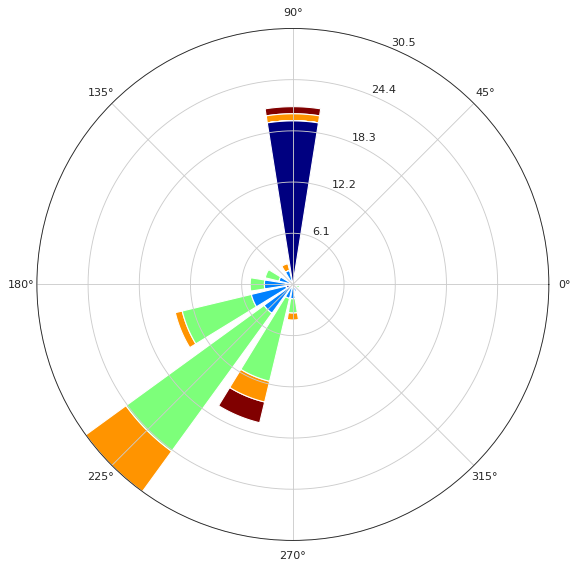

In [157]:

wd=bad_fg_days['wdir17'].values
ws=bad_fg_days['wspd17'].values
ax = WindroseAxes.from_ax()
ax.bar(wd, ws, bins=np.arange(0, 10, 2), normed=True, nsector=16)


In [158]:
wd_freq=np.sum(table, axis=0)
wd_freq

array([21.18644068,  0.        ,  0.        ,  0.        ,  0.        ,
        0.84745763,  0.        ,  0.84745763,  4.23728814, 16.94915254,
       30.50847458, 14.40677966,  5.08474576,  3.38983051,  0.        ,
        2.54237288])

In [159]:

list(zip(ax._info['dir']))

[(348.75,),
 (11.25,),
 (33.75,),
 (56.25,),
 (78.75,),
 (101.25,),
 (123.75,),
 (146.25,),
 (168.75,),
 (191.25,),
 (213.75,),
 (236.25,),
 (258.75,),
 (281.25,),
 (303.75,),
 (326.25,)]

[Text(0.0, 0, 'N'),
 Text(0.7853981633974483, 0, 'NNE'),
 Text(1.5707963267948966, 0, 'NE'),
 Text(2.356194490192345, 0, 'ENE'),
 Text(3.141592653589793, 0, 'E'),
 Text(3.9269908169872414, 0, 'ESE'),
 Text(4.71238898038469, 0, 'SE'),
 Text(5.497787143782138, 0, 'SSE')]

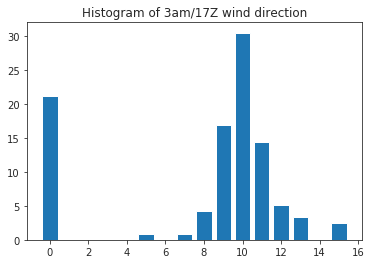

In [160]:
# Frequency bar plot for each direction - vertical column sums i.e ACROSS axis=0
wd=bad_fg_days['wdir17'].values
ws=bad_fg_days['wspd17'].values
wd_freq = np.sum(table, axis=0)
direction = ax._info['dir']
plt.bar(np.arange(16), wd_freq, align='center')
xlabels = ('N','NNE','NE','ENE','E','ESE','SE','SSE','S','SSW','SW','WSW','W','WNW','NW','NNW')
#xticks=np.arange(16)

dict_dir=dict(zip(np.arange(16), dirs))
plt.title('Histogram of 3am/17Z wind direction')

ax.set_xticklabels(xlabels)
xlabels = [dict_dir[x] for x in np.arange(16)]
ax.set_xticklabels(xlabels)

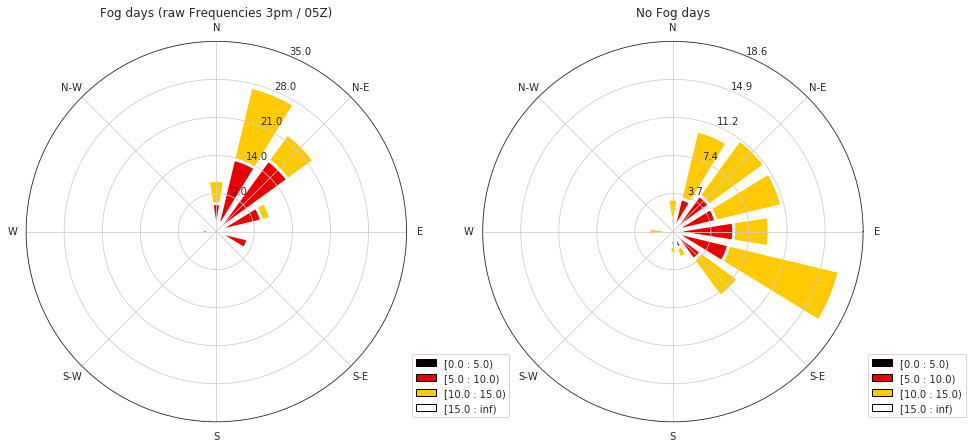

In [164]:
'''
df: Pandas DataFrame with DateTimeIndex as index and at least 2 columns ('speed' and 'direction').
var_name : name of var column name ; default value is VAR_DEFAULT='speed'
direction_name : name of direction column name ; default value is DIR_DEFAULT='direction'
kind : kind of plot (might be either, 'contour', 'contourf', 'bar', 'box', 'pdf')
'''
from windrose import plot_windrose
wdir='wdir5'
wspd='wspd5'

wind_df_fg = bad_fg_days[[wdir, wspd]].rename( columns={wdir: 'direction', wspd: 'speed'})
wind_df_nofg = not_in_bad_fg_days[[wdir, wspd]].rename( columns={wdir: 'direction', wspd: 'speed'})

fig, (ax1,ax2) = plt.subplots(nrows=1,ncols=2,
                              figsize=(15,12), 
                              subplot_kw=dict(projection='windrose')) #,sharex=True, sharey=True)
#ax1.contourf(wd, ws, bins=np.arange(0, 8, 1), cmap=cm.hot)
# fig.suptitle('Surface Winds Fog Days (left) Vs Fog Free days Brisbane')

plot_windrose(wind_df_fg, kind='bar', 
              normed=True, bins=np.arange(0,20,5), 
              cmap=cm.hot, lw=3,ax=ax1)
ax1.legend(bbox_to_anchor=(1, 0))
ax1.set_title("Fog days (raw Frequencies 3pm / 05Z)")
#ax2.contourf(wd, ws, bins=np.arange(0, 8, 1), cmap=cm.hot)

plot_windrose(wind_df_nofg, kind='bar', 
              normed=True, bins=np.arange(0,20,5), 
              cmap=cm.hot, lw=3,ax=ax2)
ax2.legend(bbox_to_anchor=(1, 0))
ax2.set_title("No Fog days")
plt.show()
# 3pm, 5Z sfc winds
# Note predominant moderate 10 to 15 knots NE breeze for fog days and E/SE 10/15 kts winds for no fog days
# light W/SW and SE 5 to 10 knots fog fog days and stronger W'ly (10/15) for no fog 

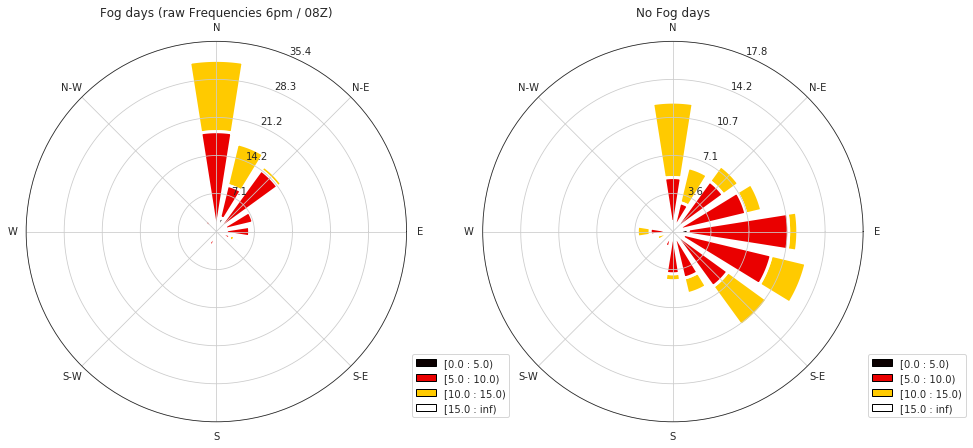

In [165]:
wdir='wdir8'
wspd='wspd8'
wind_df_fg = bad_fg_days[[wdir, wspd]].rename( columns={wdir: 'direction', wspd: 'speed'})
wind_df_nofg = not_in_bad_fg_days[[wdir, wspd]].rename( columns={wdir: 'direction', wspd: 'speed'})

fig, (ax1,ax2) = plt.subplots(nrows=1,ncols=2,
                              figsize=(15,12), 
                              subplot_kw=dict(projection='windrose')) #,sharex=True, sharey=True)
#ax1.contourf(wd, ws, bins=np.arange(0, 8, 1), cmap=cm.hot)
# fig.suptitle('Surface Winds Fog Days (left) Vs Fog Free days Brisbane')

plot_windrose(wind_df_fg, kind='bar', 
              normed=True, bins=np.arange(0,20,5), 
              cmap=cm.hot, lw=3,ax=ax1)
ax1.legend(bbox_to_anchor=(1, 0))
ax1.set_title("Fog days (raw Frequencies 6pm / 08Z)")
#ax2.contourf(wd, ws, bins=np.arange(0, 8, 1), cmap=cm.hot)

plot_windrose(wind_df_nofg, kind='bar', 
              normed=True, bins=np.arange(0,20,5),
              cmap=cm.hot, lw=3,ax=ax2)
ax2.legend(bbox_to_anchor=(1, 0))
ax2.set_title("No Fog days")
plt.show()
# 6pm.8Z
# Note predominant moderate 10 to 15 knots NE breeze for fog days and E to S 10/15 kts winds for no fog days
# light SW 5 to 10 knots fog fog days but stronger W'ly (10/15) for no fog 

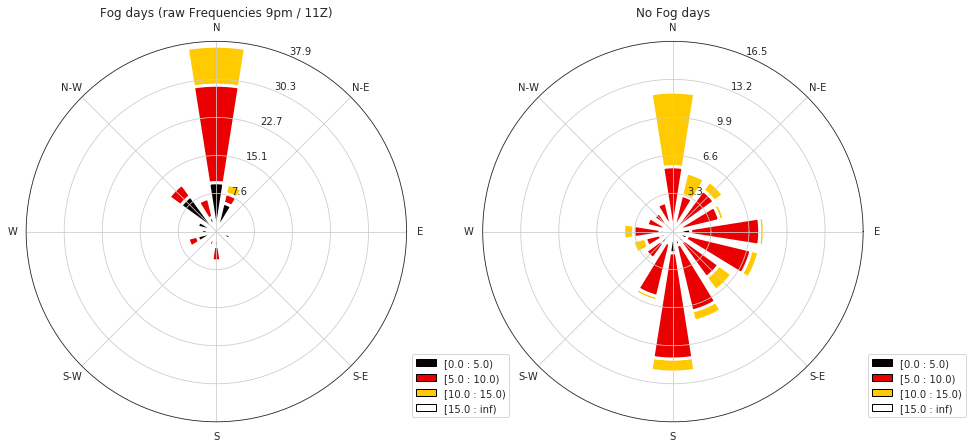

In [166]:
wdir='wdir11'
wspd='wspd11'
wind_df_fg = bad_fg_days[[wdir, wspd]].rename( columns={wdir: 'direction', wspd: 'speed'})
wind_df_nofg = not_in_bad_fg_days[[wdir, wspd]].rename( columns={wdir: 'direction', wspd: 'speed'})

fig, (ax1,ax2) = plt.subplots(nrows=1,ncols=2,
                              figsize=(15,12), 
                              subplot_kw=dict(projection='windrose')) #,sharex=True, sharey=True)
#ax1.contourf(wd, ws, bins=np.arange(0, 8, 1), cmap=cm.hot)
# fig.suptitle('Surface Winds Fog Days (left) Vs Fog Free days Brisbane')

plot_windrose(wind_df_fg, kind='bar', 
              normed=True, bins=np.arange(0,20,5), 
              cmap=cm.hot, lw=3,ax=
              ax1)
ax1.legend(bbox_to_anchor=(1, 0))
ax1.set_title("Fog days (raw Frequencies 9pm / 11Z)")
#ax2.contourf(wd, ws, bins=np.arange(0, 8, 1), cmap=cm.hot)

plot_windrose(wind_df_nofg, kind='bar', 
              normed=True, bins=np.arange(0,20,5), 
              cmap=cm.hot, lw=3,ax=ax2)
ax2.legend(bbox_to_anchor=(1, 0))
ax2.set_title("No Fog days")
plt.show()

# 9pm/11Z
# Note predominant moderate 10 to 15 knots NW to NE breeze for fog days and E to S 10/15 kts winds for no fog days
# light SW 5 to 10 knots fog fog days but stronger W'ly (10/15) for no fog 

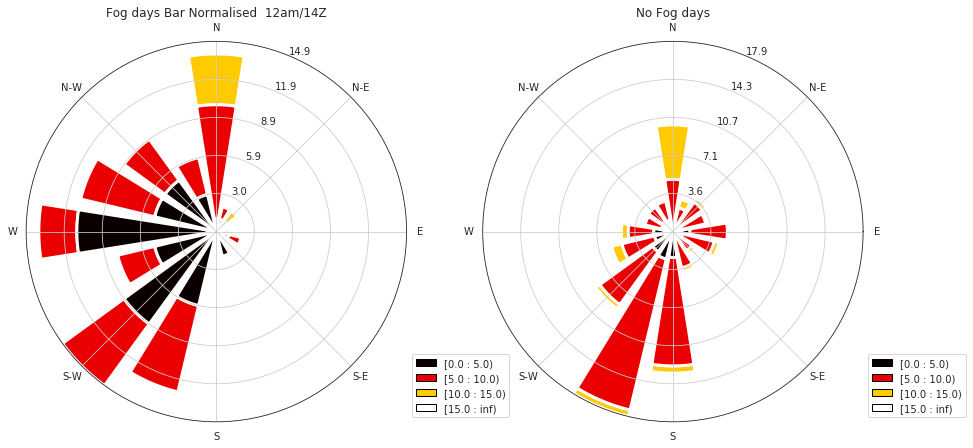

In [168]:
'''
For fog days, 17Z sfc winds are more SW (Avg direction about 225 degrees) than non-fog days when its more SSW (about 202 deg)
Better look at winds earlier in the night or evening cause by 17Z/3am winds by default from SW quarter around this time

Afternoon/evening sfc winds 3pm 6pm 9pm are best for discriminating bet fog and no fog events 

For fog days                            For fog free days
~10/7% cases sfc winds SW'lies 2-4 knots   ~10 cases sfc winds SSW'lies 2-4 knots
~40/28% cases sfc winds SW'lies 4-6 knots   ~450/7% cases sfc winds SSW'lies 4-6 knots
~50/35% cases sfc winds SW'lies 6-8 knots   ~1500/20% cases sfc winds SSW'lies 6-8 knots

Just based on 17Z/3am surface winds - more than 60% of fog cases associated with at least 4 knots winds (so generally advected fog)
'''

wdir='wdir14'
wspd='wspd14'
wind_df_fg = bad_fg_days[[wdir, wspd]].rename( columns={wdir: 'direction', wspd: 'speed'})
wind_df_nofg = not_in_bad_fg_days[[wdir, wspd]].rename( columns={wdir: 'direction', wspd: 'speed'})

fig, (ax1,ax2) = plt.subplots(nrows=1,ncols=2,
                              figsize=(15,12), 
                              subplot_kw=dict(projection='windrose')) #,sharex=True, sharey=True)
#ax1.contourf(wd, ws, bins=np.arange(0, 8, 1), cmap=cm.hot)
# fig.suptitle('Surface Winds Fog Days (left) Vs Fog Free days Brisbane')

plot_windrose(wind_df_fg, kind='bar', 
              normed=True, bins=np.arange(0,20,5), 
              cmap=cm.hot, lw=3,ax=ax1)
ax1.legend(bbox_to_anchor=(1, 0))
ax1.set_title("Fog days Bar Normalised  12am/14Z")
#ax2.contourf(wd, ws, bins=np.arange(0, 8, 1), cmap=cm.hot)

plot_windrose(wind_df_nofg, kind='bar', 
              normed=True, bins=np.arange(0,20,5), 
              cmap=cm.hot, lw=3,ax=ax2)
ax2.legend(bbox_to_anchor=(1, 0))
ax2.set_title("No Fog days")
plt.show()

In [175]:
snd900 = aws23_sonde23.loc[:,['fogflag','900_wdir','900_WS']]\
        .rename(columns={'900_wdir': 'direction', '900_WS': 'speed'})
snd900 = snd900.dropna(subset=['direction','speed'])

snd900_fg =   snd900.loc[snd900['fogflag']]
snd900_nofg = snd900.loc[~snd900['fogflag']]
snd900.tail()

,fogflag,direction,speed
2020-03-24,False,90.0,16.4
2020-03-25,False,115.0,8.2
2020-03-26,False,150.0,13.4
2020-03-27,False,95.0,20.6
2020-03-28,False,95.0,6.2


In [176]:
snd900.info()
snd900.isnull().sum()
# snd900['direction']=snd900['direction'].astype("Float32").astype("Int32")
# snd900['speed']=snd900['speed'].astype("Int32")
print(snd900[snd900['speed'].isnull()])
snd900['speed'].isnull().any()
#snd900['speed'] = pd.to_numeric(snd900['speed'], errors='coerce')
#snd900['speed'] = snd900.dropna(subset=['speed'])
#snd900['speed'] = snd900['speed'].astype(int)



<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 6683 entries, 2000-02-17 to 2020-03-28
Data columns (total 3 columns):
fogflag      6683 non-null bool
direction    6683 non-null float64
speed        6683 non-null float64
dtypes: bool(1), float64(2)
memory usage: 163.2 KB
Empty DataFrame
Columns: [fogflag, direction, speed]
Index: []


False

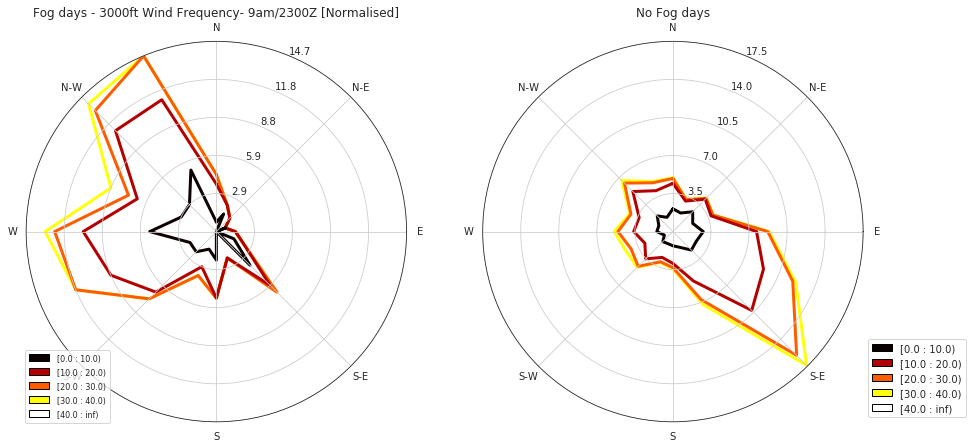

In [177]:
import matplotlib.pyplot as plt
from windrose import plot_windrose
import matplotlib.cm as cm


fig, (ax1,ax2) = plt.subplots(nrows=1,ncols=2,
                              figsize=(15,12), 
                              subplot_kw=dict(projection='windrose')) 
#,sharex=True, sharey=True)
#ax1.contourf(wd, ws, bins=np.arange(0, 8, 1), cmap=cm.hot)
# fig.suptitle('Surface Winds Fog Days (left) Vs Fog Free days Brisbane')
plot_windrose(snd900_fg, 
              kind='contour', 
              normed=True, 
              bins=np.arange(0,50,10), 
              cmap=cm.hot, lw=3,ax=ax1)
#ax1.legend(bbox_to_anchor=(1, 0))
ax1.set_title("Fog days - 3000ft Wind Frequency- 9am/2300Z [Normalised]")

#ax2.contourf(wd, ws, bins=np.arange(0, 8, 1), cmap=cm.hot)
plot_windrose(snd900_nofg, 
              kind='contour', 
              normed=True, 
              bins=np.arange(0,50,10), 
              cmap=cm.hot, lw=3,ax=ax2)
ax2.legend(bbox_to_anchor=(1, 0))
ax2.set_title("No Fog days")
plt.show()


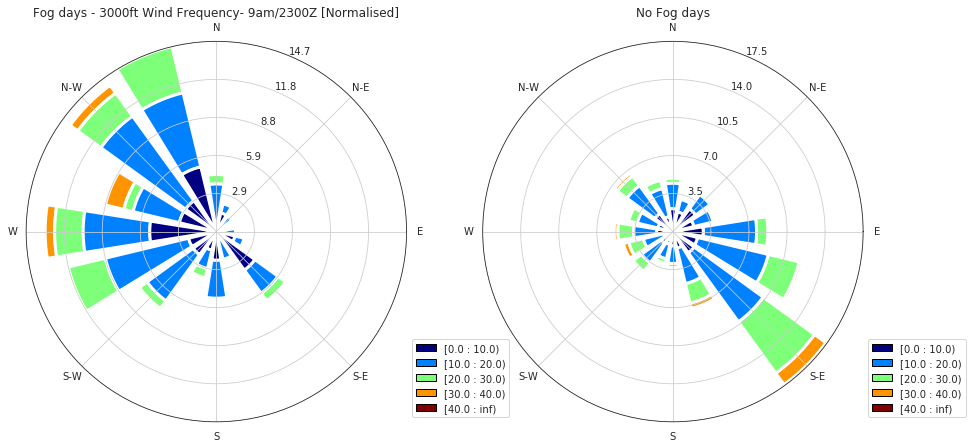

In [178]:
fig, (ax1,ax2) = plt.subplots(nrows=1,ncols=2,
                              figsize=(15,12), 
                              subplot_kw=dict(projection='windrose')) 
#,sharex=True, sharey=True)
#ax1.contourf(wd, ws, bins=np.arange(0, 8, 1), cmap=cm.hot)
# fig.suptitle('Surface Winds Fog Days (left) Vs Fog Free days Brisbane')
plot_windrose(snd900_fg, 
              kind='bar', 
              normed=True, 
              bins=np.arange(0,50,10),lw=3,ax=ax1)
ax1.legend(bbox_to_anchor=(1, 0))
# cmap=cm.hot does not look good here
ax1.set_title("Fog days - 3000ft Wind Frequency- 9am/2300Z [Normalised]")

#ax2.contourf(wd, ws, bins=np.arange(0, 8, 1), cmap=cm.hot)
plot_windrose(snd900_nofg, 
              kind='bar', 
              normed=True, 
              bins=np.arange(0,50,10),lw=3,ax=ax2)
ax2.legend(bbox_to_anchor=(1, 0))
ax2.set_title("No Fog days")
plt.show()


Index(['fogflag', 'direction', 'speed'], dtype='object') (138, 3)


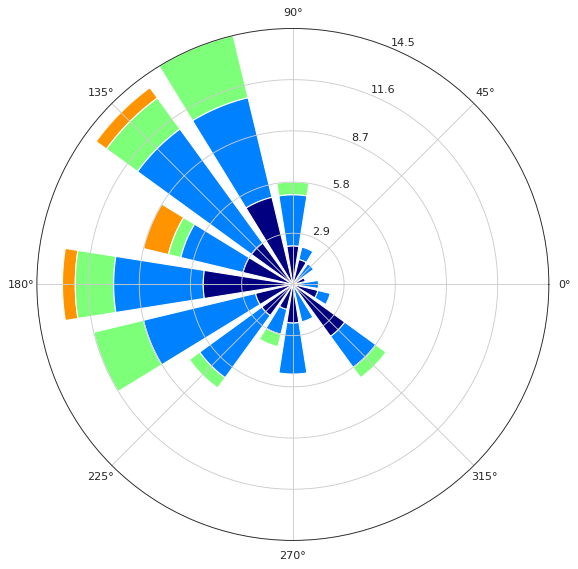

In [179]:

'''
Looks like 3000ft direction can be quite good discriminator fog days vs non-fog Days
Fog days winds predominantly from NW to SW sectors
Non-Fog days winds predominantly from E thru S i.e SE sector
wid speeds not really strong discriminator
'''
from windrose import WindroseAxes
print(snd900_fg.columns,snd900_fg.shape)
wd=snd900_fg['direction'].values
ws=snd900_fg['speed'].values
ax = WindroseAxes.from_ax()
ax.bar(wd, ws, bins=np.arange(0,50,10), normed=True, nsector=16)

/home/bou/py37/lib64/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike
  after removing the cwd from sys.path.


(93, 3)


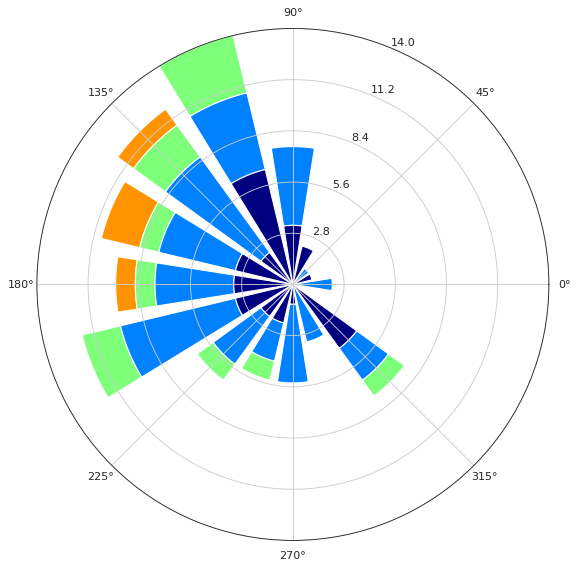

In [180]:
mask1 = (fg_days['min_vis']<=1) & (fg_days['fg_duration']>=1)

#real bad fog days
snd_900_bad_fg_days = snd900.loc[(fg_days.loc[mask1]).index].dropna(subset=['direction'])
print(snd_900_bad_fg_days.shape)
wd=snd_900_bad_fg_days['direction'].values
ws=snd_900_bad_fg_days['speed'].values
ax = WindroseAxes.from_ax()
ax.bar(wd, ws, bins=np.arange(0,50,10), normed=True, nsector=16)


In [181]:
table = ax._info['table']  # 5 rows for each speed bin, 16 cols for direction bin
table.shape
dirs=('N','NNE','NE','ENE','E','ESE','SE','SSE','S','SSW','SW','WSW','W','WNW','NW','NNW')
print(table[0,:].sum(),table[1,:].sum(),table[2,:].sum(),table[3,:].sum(),table[4,:].sum())
# row sums Percentage or ferquency of wind speeds in this bin
'''40% of fog cases had 3000ft winds 0-10 knots
   42% of fog cases had 3000ft winds 10-20 knots
   15% of fog cases had 3000ft winds 20-30 knots, only 3% 30-40, 0% 40+
   > 83% of fog cases wind below 20 knots
   > 97% of fog cases wind below 30 knots
'''
table.sum(axis=1)

34.40860215053763 48.38709677419355 12.903225806451612 4.301075268817204 0.0


array([34.40860215, 48.38709677, 12.90322581,  4.30107527,  0.        ])

In [182]:
table.sum(axis=0) # OR  np.sum(table, axis=0) sum ACROSS rows so column sums
dir_frq=list(zip(dirs,table.sum(axis=0)))
'''
6 most common gradient wind direction for fog days in the NW and SW sectors
NNW,NW,WNW,W,WSW  ~ 60% and including SW,SSW,S 7%,4%,6%  
about 75% or 3/4 of all fog cases
Least likely gradient wind directions (freq <5%) N through E to S
'''
sorted(
       list(zip(dirs,np.around(table.sum(axis=0),decimals=0))), 
       key = lambda x: x[1],
       reverse=True)

[('NNW', 14.0),
 ('WSW', 12.0),
 ('NW', 12.0),
 ('WNW', 11.0),
 ('W', 10.0),
 ('N', 8.0),
 ('SE', 8.0),
 ('SW', 6.0),
 ('S', 5.0),
 ('SSW', 5.0),
 ('SSE', 3.0),
 ('NNE', 2.0),
 ('E', 2.0),
 ('NE', 1.0),
 ('ENE', 1.0),
 ('ESE', 0.0)]

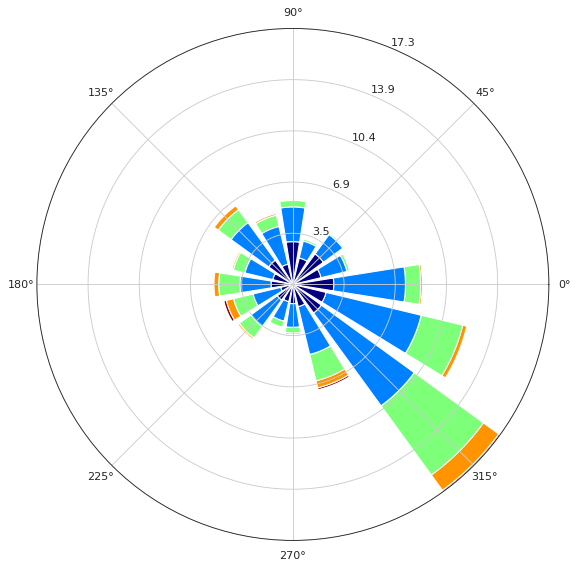

In [183]:
wd=snd900_nofg['direction'].values
ws=snd900_nofg['speed'].values
ax = WindroseAxes.from_ax()
ax.bar(wd, ws, bins=np.arange(0,50,10), normed=True, nsector=16)


In [184]:
table = ax._info['table']  # 5 rows for each speed bin, 16 cols for direction bin
table.shape
dirs=('N','NNE','NE','ENE','E','ESE','SE','SSE','S','SSW','SW','WSW','W','WNW','NW','NNW')
table[0,:].sum(),table[1,:].sum(),table[2,:].sum(),table[3,:].sum(),table[4,:].sum()
# row sums Percentage or ferquency of wind speeds in this bin
table.sum(axis=1)


array([29.13674561, 46.47822765, 19.64858671,  4.06417112,  0.67226891])

In [185]:

'''23% of fog cases had 3000ft winds 0-10 knots
   48% of fog cases had 3000ft winds 10-20 knots
   21% of fog cases had 3000ft winds 20-30 knots, only 4% 30-40, <1% 40+
   > 85% of fog cases wind below 20 knots
   > 97% of fog cases wind below 30 knots
'''
table.sum(axis=0)
dir_frq=list(zip(dirs,table.sum(axis=0)))
'''
6 most common gradient wind direction (>10%) for no fog days in the SE,ESE,E sectors
Least likely gradient wind directions (freq <5%) N through E to S
'''
sorted(
       list(zip(dirs,np.around(table.sum(axis=0),decimals=0))), 
       key = lambda x: x[1],
       reverse=True)

[('SE', 17.0),
 ('ESE', 12.0),
 ('E', 9.0),
 ('SSE', 7.0),
 ('NW', 7.0),
 ('N', 6.0),
 ('SW', 5.0),
 ('WSW', 5.0),
 ('W', 5.0),
 ('NNW', 5.0),
 ('NE', 4.0),
 ('ENE', 4.0),
 ('WNW', 4.0),
 ('NNE', 3.0),
 ('S', 3.0),
 ('SSW', 3.0)]

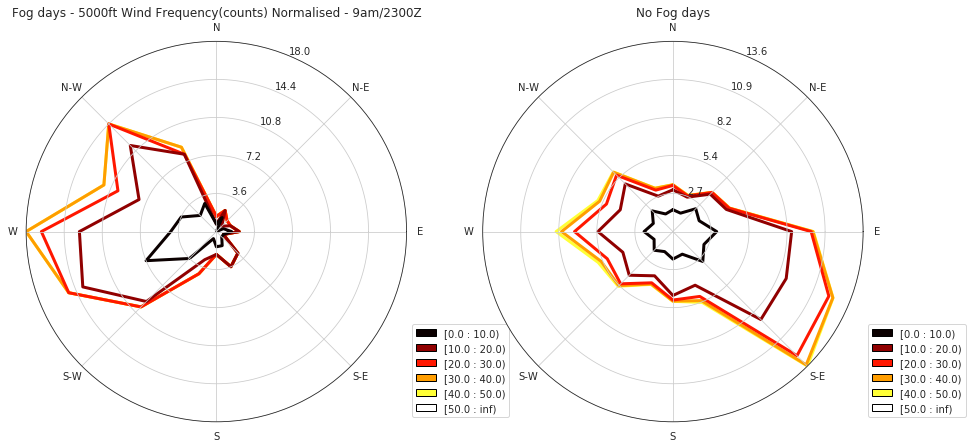

In [186]:
snd850 = aws23_sonde23.loc[:,['fogflag','850_wdir','850_WS']]\
        .rename(columns={'850_wdir': 'direction', '850_WS': 'speed'})


snd850_fg =   snd850.loc[snd850['fogflag']]
snd850_nofg = snd850.loc[~snd850['fogflag']]

snd850_fg['speed'].max(),snd850_nofg['speed'].max()

fig, (ax1,ax2) = plt.subplots(nrows=1,ncols=2,
                              figsize=(15,12), 
                              subplot_kw=dict(projection='windrose')) #,sharex=True, sharey=True)
#ax1.contourf(wd, ws, bins=np.arange(0, 8, 1), cmap=cm.hot)
# fig.suptitle('Surface Winds Fog Days (left) Vs Fog Free days Brisbane')
plot_windrose(snd850_fg, kind='contour', 
              normed=True, bins=np.arange(0,60,10), 
              cmap=cm.hot, lw=3,ax=ax1)
ax1.legend(bbox_to_anchor=(1, 0))
ax1.set_title("Fog days - 5000ft Wind Frequency(counts) Normalised - 9am/2300Z")
#ax2.contourf(wd, ws, bins=np.arange(0, 8, 1), cmap=cm.hot)
plot_windrose(snd850_nofg, kind='contour', 
              normed=True, bins=np.arange(0,60,10), 
              cmap=cm.hot, lw=3,ax=ax2)
ax2.legend(bbox_to_anchor=(1, 0))
ax2.set_title("No Fog days")
plt.show()

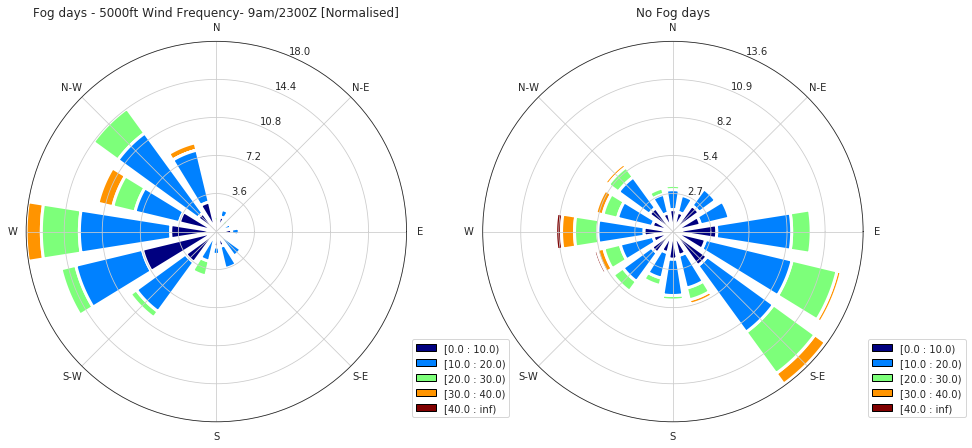

In [187]:
fig, (ax1,ax2) = plt.subplots(nrows=1,ncols=2,
                              figsize=(15,12), 
                              subplot_kw=dict(projection='windrose')) 
#,sharex=True, sharey=True)
#ax1.contourf(wd, ws, bins=np.arange(0, 8, 1), cmap=cm.hot)
# fig.suptitle('Surface Winds Fog Days (left) Vs Fog Free days Brisbane')
plot_windrose(snd850_fg, 
              kind='bar', 
              normed=True, 
              bins=np.arange(0,50,10),lw=3,ax=ax1)
ax1.legend(bbox_to_anchor=(1, 0))
# cmap=cm.hot does not look good here
ax1.set_title("Fog days - 5000ft Wind Frequency- 9am/2300Z [Normalised]")

#ax2.contourf(wd, ws, bins=np.arange(0, 8, 1), cmap=cm.hot)
plot_windrose(snd850_nofg, 
              kind='bar', 
              normed=True, 
              bins=np.arange(0,50,10),lw=3,ax=ax2)
ax2.legend(bbox_to_anchor=(1, 0))
ax2.set_title("No Fog days")
plt.show()

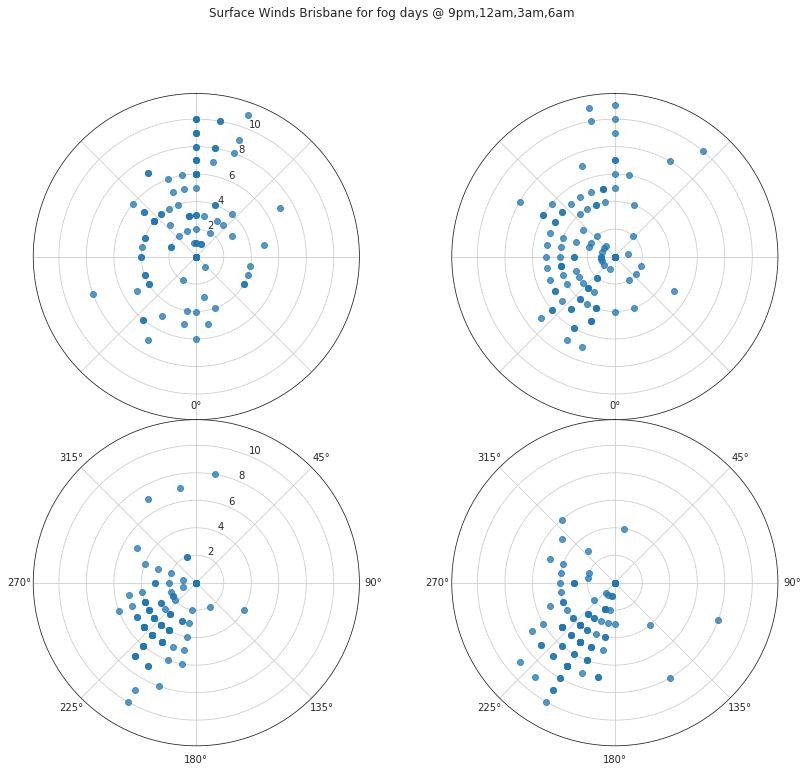

In [188]:
'''
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11Z,14Z,17Z,20Z as 2by2 grid subplots 2 rows, 2 cols
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
'''

fig, axs = plt.subplots(
    nrows=2,ncols=2,
    figsize=(15,12), 
    subplot_kw=dict(projection='polar'),
    sharex=True, sharey=True,
    gridspec_kw={'hspace': 0, 'wspace': 0})

(ax1, ax2), (ax3, ax4) = axs

fig.suptitle('Surface Winds Brisbane for fog days @ 9pm,12am,3am,6am')
ax1.scatter(x=np.deg2rad(bad_fg_days['wdir11'].values), 
            y=bad_fg_days['wspd11'].values, cmap='hsv', alpha=0.75)
ax2.scatter(x=np.deg2rad(bad_fg_days['wdir14'].values), 
            y=bad_fg_days['wspd14'].values, cmap='hsv', alpha=0.75)
ax3.scatter(x=np.deg2rad(bad_fg_days['wdir17'].values), 
            y=bad_fg_days['wspd17'].values, cmap='hsv', alpha=0.75)
ax4.scatter(x=np.deg2rad(bad_fg_days['wdir20'].values), 
            y=bad_fg_days['wspd20'].values, cmap='hsv', alpha=0.75)

for ax in axs.flat:
    ax.label_outer()
    #ax.set_title('11Z') #'Text' object is not callable
    ax.set_theta_zero_location('N', offset=0)
    ax.set_theta_direction('clockwise')


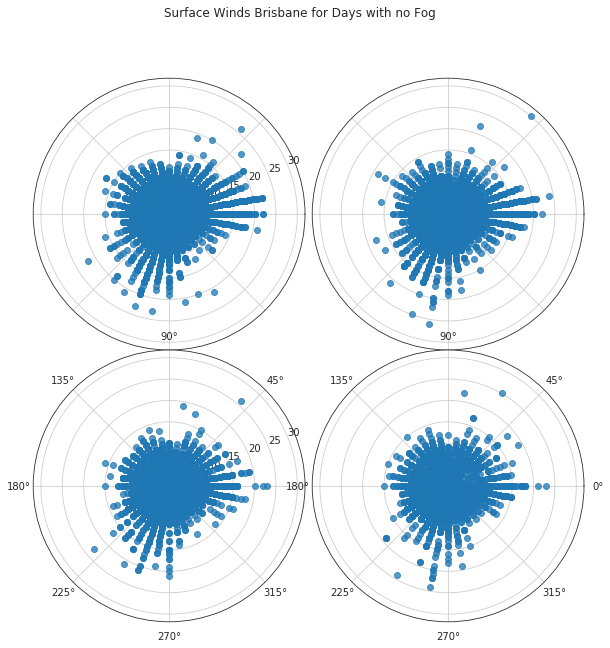

In [189]:
'''
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
11Z,14Z,17Z,20Z as 2by2 grid subplots 2 rows, 2 cols Fog Free days
++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
'''

fig, axs = plt.subplots(
    nrows=2,ncols=2,
    figsize=(10,10), 
    subplot_kw=dict(projection='polar'),
    sharex=True, sharey=True,
    gridspec_kw={'hspace': 0, 'wspace': 0})

(ax1, ax2), (ax3, ax4) = axs

fig.suptitle('Surface Winds Brisbane for Days with no Fog')
ax1.scatter(x=np.deg2rad(fg_free_days['wdir11'].values), 
            y=fg_free_days['wspd11'].values, cmap='hsv', alpha=0.75)
ax2.scatter(x=np.deg2rad(fg_free_days['wdir14'].values), 
            y=fg_free_days['wspd14'].values, cmap='hsv', alpha=0.75)
ax3.scatter(x=np.deg2rad(fg_free_days['wdir17'].values), 
            y=fg_free_days['wspd17'].values, cmap='hsv', alpha=0.75)
ax4.scatter(x=np.deg2rad(fg_free_days['wdir20'].values), 
            y=fg_free_days['wspd20'].values, cmap='hsv', alpha=0.75)

for ax in axs.flat:
    ax.label_outer()
    #ax.set_title('11Z') #'Text' object is not callable
    ax.set_theta_zero_location


In [ ]:
'''
Make some rules around Td, Td trends, TmTd, gradient wind dir and predict for outcome
'''

In [190]:
#obs_4day=aws17_sonde23.loc[dat17.index[-1]]
obs_4day=aws05_sonde23.loc['2020-03-25']

print(obs_4day.isnull()['T'] or obs_4day.isnull()['Td'] or 
      obs_4day.isnull()['lr_sfc_850'] or obs_4day.isnull()['QNH'] or 
      obs_4day.isnull()['900_wdir'] or obs_4day.isnull()['900_WS'])

obs_4day

False


WDir               70
WS                  7
T                25.7
Td                 16
RH                 55
pptnSince9          0
vis                10
vis_aws            10
PW                NaN
QNH            1018.2
Ceil1_ht         4700
Ceil1_amnt        BKN
Ceil2_ht         5200
Ceil2_amnt        OVC
Ceil3_ht          NaN
Ceil3_amnt           
fogflag         False
900_wdir          115
900_WS            8.2
850_wdir           80
850_WS            9.2
season         autumn
lr_850_500       22.3
lr_sfc_850       13.6
mid_rh        20.6667
Name: 2020-03-25 00:00:00, dtype: object

In [191]:
aws05_sonde23.index[0],aws05_sonde23.index[-1]


dat14.index[0],dat14.index[-1]

(Timestamp('2000-01-01 00:00:00', freq='D'),
 Timestamp('2020-09-20 00:00:00', freq='D'))

In [192]:
print(aws05_sonde23['fogflag'].unique())
print("\n",aws05_sonde23['fogflag'].value_counts())
aws_sonde_daily=aws05_sonde23.dropna(subset=['fogflag'])
#aws_sonde_daily['fogflag'].astype(bool,inplace=True)
print("\n",aws_sonde_daily['fogflag'].value_counts())

nan_value = float("NaN")

# Convert NaN values to empty string

aws_sonde_daily.replace("", nan_value, inplace=True)
aws_sonde_daily.dropna(subset=['fogflag'],inplace=True)


[False nan True]

 False    6414
True      153
Name: fogflag, dtype: int64

 False    6414
True      153
Name: fogflag, dtype: int64


/home/bou/py37/lib64/python3.7/site-packages/pandas/core/frame.py:4278: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  method=method,
/home/bou/py37/lib64/python3.7/site-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':


In [193]:
aws_sonde_daily['fogflag'].astype(bool,inplace=True)
aws_sonde_daily['fogflag'].value_counts()



False    6414
True      153
Name: fogflag, dtype: int64

In [194]:

# about 160 fog days
print(aws_sonde_daily.loc[
    aws_sonde_daily['fogflag']==True]['fogflag'].value_counts())
# about 6400 fog free days
print(aws_sonde_daily.loc[
    aws_sonde_daily['fogflag']==False]['fogflag'].value_counts())
aws_sonde_daily['fogflag'].value_counts()

True    153
Name: fogflag, dtype: int64
False    6414
Name: fogflag, dtype: int64


False    6414
True      153
Name: fogflag, dtype: int64

In [195]:
# ### Resample only 50% of no fog days

# In[151]:


# grab all fog days
fg_days_sample = aws_sonde_daily.loc[aws_sonde_daily['fogflag']==True]

print("Fog_days_sample.shape=",fg_days_sample.shape)
# grab ONLY 1/2 or 50% of the no fog days
no_fog_days_sample = aws_sonde_daily.loc[aws_sonde_daily['fogflag']==False].sample(frac=0.5, replace=False,random_state=99,axis=0)

# we still have 20 times as many no fog days 
print("No_fog_days_sample.shape=",no_fog_days_sample.shape)
no_fog_days_sample['fogflag'].value_counts()  # none true so great

# MERGE / join with fg days
sample = pd.concat([fg_days_sample,no_fog_days_sample],axis=0)
print("Sample shape=",sample.shape)
sample['fogflag'].value_counts()

Fog_days_sample.shape= (153, 25)
No_fog_days_sample.shape= (3207, 25)
Sample shape= (3360, 25)


False    3207
True      153
Name: fogflag, dtype: int64

In [ ]:
imp.reload(bous)

In [ ]:
what

In [196]:
fg_aut['fogflag'].value_counts()

False    6827
True      166
Name: fogflag, dtype: int64

In [197]:
# search window 5 weeks/35 days wide either side of day
# generate dates for which forecast sought
# dates = pd.date_range(start='2000-01-01' , end='2020-03-08', freq='D')


#dates = pd.date_range(
#    start=aws_sonde_daily.index[0],
#    end=aws_sonde_daily.index[-1],freq='D')


# generate climatological fog probs

fogger_aws05_sonde23=\
    bous.get_climatological_fog_probability(
    station='YBBN',
    dates=aws_sonde_daily.index.sort_values(),
    aws_sonde_daily=aws05_sonde23)



Processing date:2000-02-09 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1007.0 --> 1003.0 to 1011.0
SFC TD:				-0.7 --> -3.7 to 2.3
SFC TmTd (+/- 3):		23.4 --> 20.4 to 26.4
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: object)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2000-02-10 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1016.1 --> 1012.1 to 1020.1
SFC TD:				13.1 --> 10.1 to 16.1
SFC TmTd (+/- 3):		9.5 --> 6.5 to 12.5
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: object)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2000-02-11 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH e

QNH envelope:			1010.8 --> 1006.8 to 1014.8
SFC TD:				16.0 --> 13.0 to 19.0
SFC TmTd (+/- 3):		7.9 --> 4.9 to 10.9
Num days matching synop pattern=17
2000-03-11    False
2000-03-21    False
2001-02-13    False
2001-02-20    False
2003-03-15    False
2003-04-01    False
2005-03-16    False
2007-02-26    False
2008-02-27    False
2009-03-14    False
2011-02-11    False
2011-04-15    False
2014-02-25    False
2014-03-24    False
2015-03-16    False
2015-04-03    False
2018-02-22    False
Name: fogflag, dtype: object
False    17
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2000-03-12 00:00:00
900Hpa wind direction envelop:	90.0 -->60.0 to 120.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1018.1 --> 1014.1 to 1022.1
SFC TD:				14.6 --> 11.6 to 17.6
SFC TmTd (+/- 3):		10.7 --> 7.7 to 13.7
Num days matching synop pattern=65
2000-02-17    False
2000-02-18    False
2000-03-12    False
2000-03-19    False
2000-03-31    False

900Hpa wind direction envelop:	110.0 -->80.0 to 140.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1016.3 --> 1012.3 to 1020.3
SFC TD:				17.6 --> 14.6 to 20.6
SFC TmTd (+/- 3):		9.2 --> 6.2 to 12.2
Num days matching synop pattern=158
2000-02-25    False
2000-02-26    False
2000-03-04    False
2000-03-15    False
2000-03-16    False
              ...  
2019-04-27    False
2019-05-01    False
2020-03-23    False
2020-03-25    False
2020-03-28    False
Name: fogflag, Length: 158, dtype: object
False    152
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2000-03-31 00:00:00
900Hpa wind direction envelop:	70.0 -->40.0 to 100.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1015.4 --> 1011.4 to 1019.4
SFC TD:				17.5 --> 14.5 to 20.5
SFC TmTd (+/- 3):		9.2 --> 6.2 to 12.2
Num days matching synop pattern=69
2000-03-12    False
2000-03-14    False
2000-03-15    False
2000-03-19    False
2000-03-27    False
  

900Hpa wind direction envelop:	120.0 -->90.0 to 150.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1013.0 --> 1009.0 to 1017.0
SFC TD:				18.5 --> 15.5 to 21.5
SFC TmTd (+/- 3):		6.1 --> 3.1 to 9.1
Num days matching synop pattern=79
2000-03-27    False
2000-04-17    False
2001-03-27    False
2002-03-21    False
2002-04-09    False
              ...  
2018-03-31    False
2018-04-01    False
2018-04-20    False
2018-05-01    False
2019-05-01    False
Name: fogflag, Length: 79, dtype: object
False    76
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2000-04-19 00:00:00
900Hpa wind direction envelop:	150.0 -->120.0 to 180.0
900Hpa wind speed envelope:	20.6 --> 10.6 to 30.6
QNH envelope:			1010.4 --> 1006.4 to 1014.4
SFC TD:				5.8 --> 2.8 to 8.8
SFC TmTd (+/- 3):		17.5 --> 14.5 to 20.5
Num days matching synop pattern=6
2000-04-19    False
2007-04-07    False
2010-05-18    False
2013-05-10    False
2015-05-13   

SFC TD:				22.5 --> 19.5 to 25.5
SFC TmTd (+/- 3):		5.3 --> 2.3 to 8.3
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: object)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2000-05-02 00:00:00
Missing values for synop search parameters
900Hpa wind direction envelop:	95.0 -->65.0 to 125.0
900Hpa wind speed envelope:	26.8 --> 16.8 to 36.8
QNH envelope:			nan --> nan to nan
SFC TD:				14.4 --> 11.4 to 17.4
SFC TmTd (+/- 3):		13.6 --> 10.6 to 16.6
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: object)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2000-05-03 00:00:00
900Hpa wind direction envelop:	50.0 -->20.0 to 80.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1013.0 --> 1009.0 to 1017.0
SFC TD:				19.1 --> 16.1 to 22.1
SFC TmTd (+/- 3):		5.4 --> 2.4 to 8.4
Num days matching synop pattern=14
2000-05-03    False

Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2000-05-29 00:00:00
900Hpa wind direction envelop:	225.0 -->195.0 to 255.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1014.0 --> 1010.0 to 1018.0
SFC TD:				-2.1 --> -5.1 to 0.9
SFC TmTd (+/- 3):		20.0 --> 17.0 to 23.0
Num days matching synop pattern=6
2000-05-29    False
2000-05-31    False
2001-05-28    False
2005-06-16    False
2013-06-18    False
2014-06-29    False
Name: fogflag, dtype: object
False    6
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2000-05-30 00:00:00
900Hpa wind direction envelop:	225.0 -->195.0 to 255.0
900Hpa wind speed envelope:	28.8 --> 18.8 to 38.8
QNH envelope:			1012.0 --> 1008.0 to 1016.0
SFC TD:				-0.9 --> -3.9 to 2.1
SFC TmTd (+/- 3):		19.0 --> 16.0 to 22.0
Num days matching synop pattern=6
2000-05-28    False
2000-05-30    False
2007-06-27    False
2014-06-24    False
2014-06-29    False

900Hpa wind direction envelop:	290.0 -->260.0 to 320.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1013.3 --> 1009.3 to 1017.3
SFC TD:				10.2 --> 7.2 to 13.2
SFC TmTd (+/- 3):		10.8 --> 7.8 to 13.8
Num days matching synop pattern=12
2000-07-18    False
2004-08-17    False
2004-08-20    False
2005-08-20    False
2008-07-09    False
2010-06-28    False
2011-06-14    False
2011-07-24    False
2013-08-18    False
2015-08-17    False
2016-06-22    False
2018-08-15    False
Name: fogflag, dtype: object
False    12
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2000-07-20 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1014.6 --> 1010.6 to 1018.6
SFC TD:				1.7 --> -1.3 to 4.7
SFC TmTd (+/- 3):		23.0 --> 20.0 to 26.0
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: object)
Series([], Name: fogflag, dtype: int64)
Did not fin

Num days matching synop pattern=1
2000-08-09    True
Name: fogflag, dtype: object
True    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2000-08-10 00:00:00
900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	4.2 --> -5.8 to 14.2
QNH envelope:			1013.0 --> 1009.0 to 1017.0
SFC TD:				18.0 --> 15.0 to 21.0
SFC TmTd (+/- 3):		6.7 --> 3.7 to 9.7
Num days matching synop pattern=12
2000-08-10     True
2001-09-14    False
2002-07-10    False
2006-08-25    False
2011-08-02    False
2011-08-03    False
2012-09-13    False
2013-09-12    False
2015-09-12    False
2016-09-05    False
2019-08-12    False
2019-09-04    False
Name: fogflag, dtype: object
False    11
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2000-08-11 00:00:00
Missing values for synop search parameters
900Hpa wind direction envelop:	135.0 -->105.0 to 165.0
900Hpa wind speed envelope:	25.8 

900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1018.5 --> 1014.5 to 1022.5
SFC TD:				15.2 --> 12.2 to 18.2
SFC TmTd (+/- 3):		7.2 --> 4.2 to 10.2
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: object)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2000-09-22 00:00:00
900Hpa wind direction envelop:	5.0 -->335.0 to 35.0
900Hpa wind speed envelope:	20.6 --> 10.6 to 30.6
QNH envelope:			1019.6 --> 1015.6 to 1023.6
SFC TD:				14.8 --> 11.8 to 17.8
SFC TmTd (+/- 3):		7.6 --> 4.6 to 10.6
Num days matching synop pattern=40
2000-09-22    False
2000-10-24    False
2001-10-10    False
2002-09-05    False
2002-09-16    False
2003-09-30    False
2003-10-18    False
2004-08-25    False
2004-08-29    False
2004-09-06    False
2004-09-28    False
2005-08-30    False
2006-09-23    False
2006-10-19    False
2006-10-26    False
2008-08-29    False
2008-08-30      NaN
2008-09-13    False
2008-09-18    False
20

QNH envelope:			1023.2 --> 1019.2 to 1027.2
SFC TD:				14.8 --> 11.8 to 17.8
SFC TmTd (+/- 3):		9.8 --> 6.8 to 12.8
Num days matching synop pattern=22
2000-10-04    False
2001-09-19    False
2002-10-04    False
2003-10-18    False
2004-10-31    False
2005-11-03    False
2008-10-10    False
2009-09-16    False
2009-10-10    False
2009-10-21    False
2009-10-27    False
2010-09-11    False
2010-11-07    False
2011-10-23    False
2012-10-15    False
2015-10-16    False
2016-10-20    False
2016-11-06    False
2017-10-19    False
2019-09-19    False
2019-09-25    False
2019-10-29    False
Name: fogflag, dtype: object
False    22
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2000-10-06 00:00:00
900Hpa wind direction envelop:	350.0 -->320.0 to 20.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1018.5 --> 1014.5 to 1022.5
SFC TD:				12.3 --> 9.3 to 15.3
SFC TmTd (+/- 3):		1.8 --> -1.2 to 4.8
Num days matching synop pattern=2
2

SFC TD:				10.6 --> 7.6 to 13.6
SFC TmTd (+/- 3):		12.1 --> 9.1 to 15.1
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: object)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2000-10-20 00:00:00
900Hpa wind direction envelop:	20.0 -->350.0 to 50.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1016.6 --> 1012.6 to 1020.6
SFC TD:				13.6 --> 10.6 to 16.6
SFC TmTd (+/- 3):		9.8 --> 6.8 to 12.8
Num days matching synop pattern=47
2000-10-20    False
2000-10-23      NaN
2002-09-24      NaN
2002-11-19    False
2002-11-20    False
2003-09-30    False
2003-10-18    False
2003-11-17    False
2004-11-18    False
2005-09-27    False
2005-10-01    False
2006-11-22    False
2007-11-14    False
2007-11-20    False
2007-11-21    False
2008-10-28      NaN
2008-11-04    False
2009-09-16    False
2009-11-11    False
2010-09-18    False
2011-09-23    False
2011-11-19    False
2012-11-12    False
2012-11-24   

QNH envelope:			1019.3 --> 1015.3 to 1023.3
SFC TD:				14.0 --> 11.0 to 17.0
SFC TmTd (+/- 3):		8.1 --> 5.1 to 11.1
Num days matching synop pattern=14
2000-11-05    False
2001-11-17    False
2003-10-19    False
2005-10-05    False
2008-12-03    False
2008-12-05    False
2008-12-06    False
2012-10-19    False
2013-10-28    False
2013-12-04    False
2014-12-10    False
2015-10-21    False
2015-12-10    False
2016-10-21    False
Name: fogflag, dtype: object
False    14
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2000-11-06 00:00:00
900Hpa wind direction envelop:	145.0 -->115.0 to 175.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1019.0 --> 1015.0 to 1023.0
SFC TD:				13.1 --> 10.1 to 16.1
SFC TmTd (+/- 3):		2.3 --> -0.7 to 5.3
Num days matching synop pattern=3
2000-11-06    False
2002-11-10    False
2018-11-10    False
Name: fogflag, dtype: object
False    3
Name: fogflag, dtype: int64
Did not find any FG days found 

Num days matching synop pattern=3
2000-12-09    False
2006-01-08      NaN
2019-12-07    False
Name: fogflag, dtype: object
False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2000-12-10 00:00:00
900Hpa wind direction envelop:	350.0 -->320.0 to 20.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1017.6 --> 1013.6 to 1021.6
SFC TD:				8.5 --> 5.5 to 11.5
SFC TmTd (+/- 3):		12.9 --> 9.9 to 15.9
Num days matching synop pattern=14
2000-12-10    False
2002-11-09    False
2004-11-08    False
2004-12-08    False
2006-01-10    False
2006-11-07    False
2006-12-18    False
2009-12-06    False
2010-12-09    False
2013-01-11    False
2014-11-06    False
2014-11-08    False
2014-11-09    False
2017-01-09    False
Name: fogflag, dtype: object
False    14
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2000-12-11 00:00:00
900Hpa wind direction envelop:	290.0 -->260.0 to 320.0
900Hpa 

Num days matching synop pattern=50
2000-12-04    False
2001-01-04    False
2001-01-05    False
2001-01-10    False
2001-02-04      NaN
2002-01-18    False
2002-12-28    False
2003-01-05    False
2003-01-12    False
2003-01-16    False
2003-12-17    False
2003-12-29    False
2004-01-19    False
2004-02-03    False
2005-01-10    False
2005-01-11    False
2006-12-04    False
2006-12-17    False
2006-12-29    False
2007-01-04    False
2007-01-17    False
2007-02-01    False
2007-02-04    False
2007-12-18    False
2007-12-25    False
2008-01-10    False
2008-01-11    False
2008-01-23    False
2008-12-21    False
2009-01-05    False
2009-01-10    False
2009-02-05    False
2009-12-11    False
2011-12-16      NaN
2011-12-17    False
2012-12-05    False
2012-12-13    False
2014-01-06    False
2014-01-27    False
2014-01-28    False
2014-01-29    False
2014-02-06    False
2014-12-22    False
2015-12-18    False
2016-01-16    False
2017-12-11    False
2018-02-05    False
2018-12-23    False
2018-

Num days matching synop pattern=5
2001-01-31    False
2004-02-01      NaN
2010-02-13    False
2012-01-29      NaN
2013-02-28    False
Name: fogflag, dtype: object
False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2001-02-02 00:00:00
900Hpa wind direction envelop:	55.0 -->25.0 to 85.0
900Hpa wind speed envelope:	30.8 --> 20.8 to 40.8
QNH envelope:			1009.2 --> 1005.2 to 1013.2
SFC TD:				23.4 --> 20.4 to 26.4
SFC TmTd (+/- 3):		2.9 --> -0.1 to 5.9
Num days matching synop pattern=6
2001-02-02    False
2010-01-30    False
2012-01-28    False
2013-01-24    False
2013-02-25    False
2015-02-20    False
Name: fogflag, dtype: object
False    6
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2001-02-03 00:00:00
900Hpa wind direction envelop:	115.0 -->85.0 to 145.0
900Hpa wind speed envelope:	9.2 --> -0.8 to 19.2
QNH envelope:			1012.4 --> 1008.4 to 1016.4
SFC TD:				18.4 --> 15.4 to 21.4
SFC 

Did not find any FG days found in matching synops

Processing date:2001-02-18 00:00:00
900Hpa wind direction envelop:	145.0 -->115.0 to 175.0
900Hpa wind speed envelope:	28.8 --> 18.8 to 38.8
QNH envelope:			1015.1 --> 1011.1 to 1019.1
SFC TD:				17.6 --> 14.6 to 20.6
SFC TmTd (+/- 3):		7.4 --> 4.4 to 10.4
Num days matching synop pattern=50
2000-02-29    False
2001-02-16    False
2001-02-17    False
2001-02-18    False
2002-03-04    False
2002-03-22    False
2002-03-23    False
2003-01-23    False
2003-02-02    False
2003-03-17    False
2005-01-25    False
2005-02-10    False
2006-02-21    False
2006-02-28    False
2006-03-21    False
2006-03-24    False
2007-02-01    False
2007-03-25    False
2009-03-11    False
2009-03-20    False
2010-02-17    False
2010-02-18    False
2011-02-23      NaN
2012-01-15    False
2012-03-05    False
2012-03-18    False
2013-02-14    False
2013-02-16    False
2013-03-11    False
2013-03-18    False
2014-01-26    False
2014-02-04    False
2014-02-22    Fal

Did not find any FG days found in matching synops

Processing date:2001-03-10 00:00:00
900Hpa wind direction envelop:	120.0 -->90.0 to 150.0
900Hpa wind speed envelope:	19.6 --> 9.6 to 29.6
QNH envelope:			1012.5 --> 1008.5 to 1016.5
SFC TD:				18.1 --> 15.1 to 21.1
SFC TmTd (+/- 3):		4.0 --> 1.0 to 7.0
Num days matching synop pattern=63
2000-04-05    False
2000-04-11    False
2001-02-16    False
2001-03-10    False
2001-03-27    False
              ...  
2018-03-21    False
2018-03-29    False
2019-03-01    False
2020-02-24    False
2020-03-13    False
Name: fogflag, Length: 63, dtype: object
False    62
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2001-03-11 00:00:00
900Hpa wind direction envelop:	335.0 -->305.0 to 5.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1017.7 --> 1013.7 to 1021.7
SFC TD:				13.9 --> 10.9 to 16.9
SFC TmTd (+/- 3):		8.9 --> 5.9 to 11.9
Num days matching synop pattern=11
2001-03-11    False

SFC TD:				15.5 --> 12.5 to 18.5
SFC TmTd (+/- 3):		8.6 --> 5.6 to 11.6
Num days matching synop pattern=150
2000-02-25    False
2000-02-26    False
2000-02-29    False
2000-04-10    False
2000-04-13    False
              ...  
2019-04-29    False
2020-03-07    False
2020-03-09    False
2020-03-17    False
2020-03-26    False
Name: fogflag, Length: 150, dtype: object
False    143
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2001-03-31 00:00:00
900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	23.6 --> 13.6 to 33.6
QNH envelope:			1021.9 --> 1017.9 to 1025.9
SFC TD:				14.1 --> 11.1 to 17.1
SFC TmTd (+/- 3):		11.2 --> 8.2 to 14.2
Num days matching synop pattern=87
2000-04-10    False
2000-04-23    False
2001-03-30    False
2001-03-31    False
2001-04-04    False
              ...  
2019-04-04    False
2019-04-18    False
2019-04-29    False
2020-03-09    False
2020-03-17    False
Name: fogflag, Length: 87

SFC TD:				14.6 --> 11.6 to 17.6
SFC TmTd (+/- 3):		10.6 --> 7.6 to 13.6
Num days matching synop pattern=4
2001-05-04    False
2005-05-24    False
2011-06-03    False
2016-05-22    False
Name: fogflag, dtype: object
False    4
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2001-05-05 00:00:00
900Hpa wind direction envelop:	265.0 -->235.0 to 295.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1014.7 --> 1010.7 to 1018.7
SFC TD:				15.5 --> 12.5 to 18.5
SFC TmTd (+/- 3):		8.5 --> 5.5 to 11.5
Num days matching synop pattern=21
2001-05-05    False
2001-05-16    False
2002-05-15      NaN
2005-04-29    False
2006-04-20    False
2006-05-22    False
2008-04-23    False
2009-05-12    False
2009-05-27    False
2010-05-04     True
2011-04-11    False
2011-04-13      NaN
2013-04-17    False
2014-05-23    False
2016-05-18     True
2017-05-23     True
2017-05-25    False
2017-05-28    False
2018-04-13    False
2018-04-23    False
201

False    46
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2001-05-20 00:00:00
900Hpa wind direction envelop:	160.0 -->130.0 to 190.0
900Hpa wind speed envelope:	25.8 --> 15.8 to 35.8
QNH envelope:			1016.1 --> 1012.1 to 1020.1
SFC TD:				14.7 --> 11.7 to 17.7
SFC TmTd (+/- 3):		1.2 --> -1.8 to 4.2
Num days matching synop pattern=5
2001-05-20    False
2005-05-05    False
2010-06-07    False
2011-06-10    False
2013-06-21     True
Name: fogflag, dtype: object
False    4
True     1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2001-05-21 00:00:00
900Hpa wind direction envelop:	160.0 -->130.0 to 190.0
900Hpa wind speed envelope:	30.8 --> 20.8 to 40.8
QNH envelope:			1012.5 --> 1008.5 to 1016.5
SFC TD:				13.8 --> 10.8 to 16.8
SFC TmTd (+/- 3):		5.6 --> 2.6 to 8.6
Num days matching synop pattern=10
2001-05-21    False
2002-05-10    False
2003-06-08    False
2008-04-18    False
2009-05-17    Fal

Num days matching synop pattern=1
2001-06-15    False
Name: fogflag, dtype: object
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2001-06-16 00:00:00
900Hpa wind direction envelop:	140.0 -->110.0 to 170.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1017.1 --> 1013.1 to 1021.1
SFC TD:				-2.1 --> -5.1 to 0.9
SFC TmTd (+/- 3):		20.4 --> 17.4 to 23.4
Num days matching synop pattern=10
2001-06-16    False
2003-06-14    False
2004-07-18    False
2005-07-17    False
2007-06-16    False
2008-06-14    False
2014-06-30    False
2016-07-13    False
2018-05-31    False
2019-05-30    False
Name: fogflag, dtype: object
False    10
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2001-06-17 00:00:00
900Hpa wind direction envelop:	145.0 -->115.0 to 175.0
900Hpa wind speed envelope:	20.6 --> 10.6 to 30.6
QNH envelope:			1020.2 --> 1016.2 to 1024.2
SFC TD:				8.7 --> 5.7 to 11.7

SFC TmTd (+/- 3):		9.0 --> 6.0 to 12.0
Num days matching synop pattern=18
2001-06-10    False
2001-07-01    False
2002-07-10    False
2003-08-03    False
2005-06-03    False
2007-06-02    False
2009-06-02    False
2009-08-01    False
2011-07-02    False
2013-07-03    False
2014-07-01    False
2014-07-02    False
2016-06-02    False
2016-07-01    False
2016-07-02    False
2017-07-01    False
2017-08-01    False
2018-08-01    False
Name: fogflag, dtype: object
False    18
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2001-07-02 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1014.5 --> 1010.5 to 1018.5
SFC TD:				19.7 --> 16.7 to 22.7
SFC TmTd (+/- 3):		6.8 --> 3.8 to 9.8
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: object)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2001-0

Num days matching synop pattern=37
2000-06-24    False
2001-06-17    False
2001-07-20    False
2001-07-30    False
2002-06-21      NaN
2002-07-15    False
2002-07-31      NaN
2002-08-15      NaN
2002-08-16    False
2003-08-09    False
2004-07-14    False
2005-07-26      NaN
2007-06-22    False
2008-06-15    False
2008-06-22    False
2009-06-16    False
2009-06-17    False
2009-07-24    False
2009-08-07    False
2011-07-13    False
2011-08-15    False
2011-08-20    False
2012-06-23    False
2012-07-23    False
2012-07-24    False
2012-07-30    False
2013-07-12    False
2013-07-24    False
2014-07-20    False
2015-06-19    False
2015-06-20    False
2015-07-07    False
2015-08-08    False
2017-06-21    False
2017-06-30    False
2018-06-20    False
2019-06-22    False
Name: fogflag, dtype: object
False    33
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2001-07-21 00:00:00
900Hpa wind direction envelop:	195.0 -->165.0 to 225.0
900Hpa wind sp

Name: fogflag, dtype: object
False    17
True      4
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2001-08-05 00:00:00
900Hpa wind direction envelop:	260.0 -->230.0 to 290.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1007.1 --> 1003.1 to 1011.1
SFC TD:				10.1 --> 7.1 to 13.1
SFC TmTd (+/- 3):		13.6 --> 10.6 to 16.6
Num days matching synop pattern=3
2001-08-05    False
2009-07-13    False
2011-08-10    False
Name: fogflag, dtype: object
False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2001-08-06 00:00:00
900Hpa wind direction envelop:	80.0 -->50.0 to 110.0
900Hpa wind speed envelope:	3.0 --> -7.0 to 13.0
QNH envelope:			1019.9 --> 1015.9 to 1023.9
SFC TD:				15.3 --> 12.3 to 18.3
SFC TmTd (+/- 3):		6.9 --> 3.9 to 9.9
Num days matching synop pattern=14
2001-08-06    False
2002-08-04    False
2005-07-31     True
2005-09-06    False
2006-08-28    False
2007-08-17

SFC TD:				14.0 --> 11.0 to 17.0
SFC TmTd (+/- 3):		10.5 --> 7.5 to 13.5
Num days matching synop pattern=30
2001-09-06    False
2001-09-15    False
2001-09-16    False
2001-09-29    False
2001-09-30    False
2002-08-04    False
2003-09-07    False
2004-10-06    False
2004-10-10    False
2006-09-25    False
2006-10-11    False
2008-09-30    False
2009-08-05    False
2009-09-11    False
2009-09-15    False
2011-08-03    False
2011-08-31      NaN
2011-09-04    False
2012-09-25    False
2013-08-28    False
2014-08-11    False
2014-09-11    False
2016-09-10    False
2016-09-16    False
2018-08-24    False
2018-09-05    False
2018-09-24    False
2019-08-04    False
2019-08-17    False
2019-09-14    False
Name: fogflag, dtype: object
False    29
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2001-09-07 00:00:00
900Hpa wind direction envelop:	355.0 -->325.0 to 25.0
900Hpa wind speed envelope:	23.6 --> 13.6 to 33.6
QNH envelope:			1014.4 --> 1010.

Num days matching synop pattern=40
2000-09-17    False
2000-10-11    False
2001-09-18    False
2001-09-20    False
2001-09-21    False
2001-09-22    False
2001-09-27    False
2001-09-28    False
2001-10-22      NaN
2002-08-27      NaN
2002-08-28    False
2002-09-30    False
2003-10-13    False
2003-10-17    False
2004-10-10    False
2004-10-17    False
2006-10-04    False
2006-10-22    False
2007-10-17    False
2008-09-24    False
2008-10-16    False
2009-10-19    False
2010-08-29    False
2010-09-30    False
2011-09-14    False
2011-09-21    False
2012-09-17    False
2012-09-25    False
2014-08-21    False
2014-09-06    False
2014-09-21    False
2014-10-08    False
2014-10-18    False
2014-10-21    False
2015-08-19    False
2015-09-19    False
2016-10-14    False
2018-09-21    False
2018-09-24    False
2019-10-21    False
Name: fogflag, dtype: object
False    38
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2001-09-22 00:00:00
900Hpa wi

Did not find any FG days found in matching synops

Processing date:2001-10-07 00:00:00
900Hpa wind direction envelop:	255.0 -->225.0 to 285.0
900Hpa wind speed envelope:	18.6 --> 8.6 to 28.6
QNH envelope:			1018.1 --> 1014.1 to 1022.1
SFC TD:				3.3 --> 0.3 to 6.3
SFC TmTd (+/- 3):		15.0 --> 12.0 to 18.0
Num days matching synop pattern=2
2001-10-07    False
2019-10-07     True
Name: fogflag, dtype: object
True     1
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2001-10-08 00:00:00
900Hpa wind direction envelop:	10.0 -->340.0 to 40.0
900Hpa wind speed envelope:	3.0 --> -7.0 to 13.0
QNH envelope:			1021.1 --> 1017.1 to 1025.1
SFC TD:				8.4 --> 5.4 to 11.4
SFC TmTd (+/- 3):		11.1 --> 8.1 to 14.1
Num days matching synop pattern=17
2001-10-08    False
2001-10-23    False
2002-11-07    False
2004-11-07    False
2004-11-08    False
2005-09-09    False
2006-09-19    False
2006-10-24    False
2007-09-23    False
2008-10-19    False
20

SFC TmTd (+/- 3):		1.4 --> -1.6 to 4.4
Num days matching synop pattern=6
2001-10-26    False
2002-10-14    False
2003-10-10    False
2003-10-31    False
2011-09-25    False
2016-09-21     True
Name: fogflag, dtype: object
False    5
True     1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2001-10-27 00:00:00
900Hpa wind direction envelop:	220.0 -->190.0 to 250.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1007.6 --> 1003.6 to 1011.6
SFC TD:				3.6 --> 0.6 to 6.6
SFC TmTd (+/- 3):		25.4 --> 22.4 to 28.4
Num days matching synop pattern=2
2001-10-27    False
2001-11-21    False
Name: fogflag, dtype: object
False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2001-10-28 00:00:00
900Hpa wind direction envelop:	295.0 -->265.0 to 325.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1011.4 --> 1007.4 to 1015.4
SFC TD:				6.6 --> 3.6 to 9.6
SFC TmTd (+/- 3

900Hpa wind direction envelop:	320.0 -->290.0 to 350.0
900Hpa wind speed envelope:	18.6 --> 8.6 to 28.6
QNH envelope:			1010.5 --> 1006.5 to 1014.5
SFC TD:				20.4 --> 17.4 to 23.4
SFC TmTd (+/- 3):		5.6 --> 2.6 to 8.6
Num days matching synop pattern=74
2000-10-26    False
2000-11-30    False
2001-10-29    False
2001-11-24    False
2001-11-25    False
              ...  
2019-11-29    False
2019-11-30    False
2019-12-11    False
2019-12-13    False
2019-12-14    False
Name: fogflag, Length: 74, dtype: object
False    70
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2001-11-25 00:00:00
900Hpa wind direction envelop:	315.0 -->285.0 to 345.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1013.8 --> 1009.8 to 1017.8
SFC TD:				20.7 --> 17.7 to 23.7
SFC TmTd (+/- 3):		3.4 --> 0.4 to 6.4
Num days matching synop pattern=37
2001-11-24    False
2001-11-25    False
2002-11-26    False
2003-10-24    False
2004-10-24    False
2004

Num days matching synop pattern=70
2001-11-23    False
2001-12-02    False
2001-12-14    False
2002-11-25    False
2002-12-22    False
              ...  
2019-11-21    False
2019-11-23    False
2019-11-25    False
2019-11-29    False
2019-12-23      NaN
Name: fogflag, Length: 70, dtype: object
False    66
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2001-12-15 00:00:00
900Hpa wind direction envelop:	140.0 -->110.0 to 170.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1007.2 --> 1003.2 to 1011.2
SFC TD:				19.2 --> 16.2 to 22.2
SFC TmTd (+/- 3):		6.2 --> 3.2 to 9.2
Num days matching synop pattern=42
2000-12-02    False
2000-12-15      NaN
2001-12-15    False
2001-12-16    False
2002-12-25    False
2003-01-10    False
2003-11-12      NaN
2005-11-20    False
2006-01-18    False
2006-11-13    False
2006-11-29    False
2007-01-03    False
2007-11-10    False
2007-12-01      NaN
2007-12-02    False
2007-12-17    False
200

Did not find any FG days found in matching synops

Processing date:2002-01-05 00:00:00
900Hpa wind direction envelop:	335.0 -->305.0 to 5.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1023.6 --> 1019.6 to 1027.6
SFC TD:				14.3 --> 11.3 to 17.3
SFC TmTd (+/- 3):		7.8 --> 4.8 to 10.8
Num days matching synop pattern=7
2002-01-05    False
2003-12-07    False
2004-01-06    False
2007-12-04    False
2008-12-10    False
2017-01-10    False
2020-02-09    False
Name: fogflag, dtype: object
False    7
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2002-01-06 00:00:00
900Hpa wind direction envelop:	335.0 -->305.0 to 5.0
900Hpa wind speed envelope:	22.6 --> 12.6 to 32.6
QNH envelope:			1018.0 --> 1014.0 to 1022.0
SFC TD:				9.9 --> 6.9 to 12.9
SFC TmTd (+/- 3):		8.6 --> 5.6 to 11.6
Num days matching synop pattern=2
2002-01-06    False
2010-12-09    False
Name: fogflag, dtype: object
False    2
Name: fogflag, dtype: int64
Did not

900Hpa wind direction envelop:	100.0 -->70.0 to 130.0
900Hpa wind speed envelope:	5.2 --> -4.8 to 15.2
QNH envelope:			1018.9 --> 1014.9 to 1022.9
SFC TD:				13.9 --> 10.9 to 16.9
SFC TmTd (+/- 3):		12.6 --> 9.6 to 15.6
Num days matching synop pattern=27
2000-02-17    False
2000-02-18    False
2001-01-10    False
2002-01-19    False
2002-12-17    False
2003-01-25    False
2003-12-29    False
2006-12-19      NaN
2006-12-20    False
2006-12-29    False
2006-12-30    False
2007-01-17    False
2008-01-11    False
2010-02-21    False
2011-12-17    False
2012-02-01    False
2013-12-19    False
2014-12-22    False
2015-02-14    False
2015-12-18    False
2018-01-05    False
2018-12-23    False
2018-12-24    False
2018-12-25    False
2018-12-26    False
2019-12-27    False
2019-12-29    False
Name: fogflag, dtype: object
False    26
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2002-01-21 00:00:00
900Hpa wind direction envelop:	40.0 -->10.0 to 70

900Hpa wind direction envelop:	140.0 -->110.0 to 170.0
900Hpa wind speed envelope:	17.4 --> 7.4 to 27.4
QNH envelope:			1019.6 --> 1015.6 to 1023.6
SFC TD:				16.2 --> 13.2 to 19.2
SFC TmTd (+/- 3):		8.1 --> 5.1 to 11.1
Num days matching synop pattern=92
2000-02-17    False
2000-02-18    False
2000-02-25    False
2000-02-26    False
2000-02-29    False
              ...  
2019-02-15    False
2019-02-25    False
2019-02-26    False
2019-03-03    False
2020-03-07    False
Name: fogflag, Length: 92, dtype: object
False    88
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2002-02-12 00:00:00
900Hpa wind direction envelop:	145.0 -->115.0 to 175.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1011.9 --> 1007.9 to 1015.9
SFC TD:				20.6 --> 17.6 to 23.6
SFC TmTd (+/- 3):		6.7 --> 3.7 to 9.7
Num days matching synop pattern=105
2001-02-16    False
2001-02-21    False
2001-02-22    False
2001-02-24    False
2001-03-10    False
  

QNH envelope:			1016.7 --> 1012.7 to 1020.7
SFC TD:				17.3 --> 14.3 to 20.3
SFC TmTd (+/- 3):		8.8 --> 5.8 to 11.8
Num days matching synop pattern=80
2000-02-22    False
2000-02-23    False
2000-03-12    False
2000-03-14    False
2000-03-15    False
              ...  
2019-02-03    False
2019-02-27    False
2020-02-23    False
2020-03-01    False
2020-03-28    False
Name: fogflag, Length: 80, dtype: object
False    79
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2002-02-26 00:00:00
900Hpa wind direction envelop:	345.0 -->315.0 to 15.0
900Hpa wind speed envelope:	3.0 --> -7.0 to 13.0
QNH envelope:			1012.7 --> 1008.7 to 1016.7
SFC TD:				18.3 --> 15.3 to 21.3
SFC TmTd (+/- 3):		7.9 --> 4.9 to 10.9
Num days matching synop pattern=41
2000-03-28    False
2001-03-19    False
2002-02-18    False
2002-02-26    False
2002-03-26    False
2003-01-30    False
2004-01-23    False
2004-02-17    False
2004-02-18    False
2004-03-12    False
2004-03

900Hpa wind direction envelop:	50.0 -->20.0 to 80.0
900Hpa wind speed envelope:	4.2 --> -5.8 to 14.2
QNH envelope:			1014.8 --> 1010.8 to 1018.8
SFC TD:				15.0 --> 12.0 to 18.0
SFC TmTd (+/- 3):		11.7 --> 8.7 to 14.7
Num days matching synop pattern=22
2000-02-20    False
2000-03-19    False
2000-03-31    False
2001-02-20    False
2002-02-16    False
2002-02-25    False
2002-03-15    False
2005-03-16    False
2006-03-15    False
2006-04-12    False
2007-03-04    False
2007-03-18    False
2007-04-15    False
2009-02-23    False
2009-03-14    False
2011-03-15      NaN
2014-02-25    False
2014-02-26    False
2015-03-16    False
2017-02-15    False
2017-04-16    False
2020-03-21    False
Name: fogflag, dtype: object
False    21
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2002-03-16 00:00:00
900Hpa wind direction envelop:	300.0 -->270.0 to 330.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1013.1 --> 1009.1 to 1017.1
SFC

Did not find any FG days found in matching synops

Processing date:2002-03-26 00:00:00
900Hpa wind direction envelop:	350.0 -->320.0 to 20.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1009.5 --> 1005.5 to 1013.5
SFC TD:				20.1 --> 17.1 to 23.1
SFC TmTd (+/- 3):		6.8 --> 3.8 to 9.8
Num days matching synop pattern=20
2001-03-19    False
2001-03-20    False
2002-02-26    False
2002-03-26    False
2004-02-26      NaN
2006-04-02    False
2008-04-02    False
2009-03-15    False
2009-04-03    False
2011-02-28    False
2012-02-20    False
2012-02-29    False
2012-04-22     True
2013-02-28    False
2015-02-26    False
2017-03-27    False
2018-03-25    False
2018-04-12    False
2019-03-17    False
2019-03-24    False
Name: fogflag, dtype: object
False    18
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2002-03-27 00:00:00
900Hpa wind direction envelop:	40.0 -->10.0 to 70.0
900Hpa wind speed envelope:	13.4 --> 3.4

SFC TD:				15.3 --> 12.3 to 18.3
SFC TmTd (+/- 3):		10.4 --> 7.4 to 13.4
Num days matching synop pattern=159
2000-03-12    False
2000-03-30    False
2000-04-10    False
2000-04-13    False
2000-04-20    False
              ...  
2019-04-27    False
2019-04-28    False
2019-04-29    False
2020-03-18    False
2020-03-25    False
Name: fogflag, Length: 159, dtype: object
False    153
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2002-04-15 00:00:00
900Hpa wind direction envelop:	110.0 -->80.0 to 140.0
900Hpa wind speed envelope:	17.4 --> 7.4 to 27.4
QNH envelope:			1018.4 --> 1014.4 to 1022.4
SFC TD:				16.1 --> 13.1 to 19.1
SFC TmTd (+/- 3):		9.2 --> 6.2 to 12.2
Num days matching synop pattern=182
2000-03-30    False
2000-04-05    False
2000-04-13    False
2000-04-20    False
2000-04-22    False
              ...  
2019-04-28    False
2019-04-29    False
2020-03-18    False
2020-03-23    False
2020-03-25    False
Name: fogflag, Length: 182

Did not find any FG days found in matching synops

Processing date:2002-04-28 00:00:00
900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	20.6 --> 10.6 to 30.6
QNH envelope:			1023.7 --> 1019.7 to 1027.7
SFC TD:				18.5 --> 15.5 to 21.5
SFC TmTd (+/- 3):		1.9 --> -1.1 to 4.9
Num days matching synop pattern=16
2000-04-25    False
2000-04-26    False
2002-04-28    False
2002-05-04    False
2002-05-06    False
2003-05-28    False
2005-04-22      NaN
2005-04-27    False
2005-05-04    False
2013-05-06    False
2018-05-27    False
2019-04-19    False
2019-04-20    False
2019-04-23    False
2019-05-13    False
2019-05-20    False
Name: fogflag, dtype: object
False    15
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2002-04-29 00:00:00
900Hpa wind direction envelop:	135.0 -->105.0 to 165.0
900Hpa wind speed envelope:	19.6 --> 9.6 to 29.6
QNH envelope:			1022.7 --> 1018.7 to 1026.7
SFC TD:				12.7 --> 9.7 to 15.7
S

900Hpa wind direction envelop:	45.0 -->15.0 to 75.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1011.9 --> 1007.9 to 1015.9
SFC TD:				2.6 --> -0.4 to 5.6
SFC TmTd (+/- 3):		24.6 --> 21.6 to 27.6
Num days matching synop pattern=1
2002-05-17    False
Name: fogflag, dtype: object
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2002-05-18 00:00:00
900Hpa wind direction envelop:	300.0 -->270.0 to 330.0
900Hpa wind speed envelope:	24.6 --> 14.6 to 34.6
QNH envelope:			1014.4 --> 1010.4 to 1018.4
SFC TD:				11.4 --> 8.4 to 14.4
SFC TmTd (+/- 3):		11.1 --> 8.1 to 14.1
Num days matching synop pattern=8
2002-05-18    False
2009-04-24    False
2009-06-13    False
2010-05-24    False
2012-06-15    False
2013-04-21    False
2018-05-10    False
2018-06-13    False
Name: fogflag, dtype: object
False    8
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2002-05-19 00:00:00
900H

Did not find any FG days found in matching synops

Processing date:2002-06-05 00:00:00
900Hpa wind direction envelop:	90.0 -->60.0 to 120.0
900Hpa wind speed envelope:	19.6 --> 9.6 to 29.6
QNH envelope:			1020.5 --> 1016.5 to 1024.5
SFC TD:				16.2 --> 13.2 to 19.2
SFC TmTd (+/- 3):		5.3 --> 2.3 to 8.3
Num days matching synop pattern=33
2002-05-05    False
2002-06-05    False
2003-05-14    False
2004-05-23    False
2004-07-09    False
2005-06-05    False
2006-06-18    False
2006-06-21    False
2006-06-22    False
2006-06-24     True
2007-05-06    False
2007-05-28    False
2008-05-31    False
2009-06-11    False
2009-06-20    False
2012-05-23    False
2013-05-06    False
2013-06-04    False
2014-05-14    False
2014-05-21    False
2014-05-30    False
2015-06-14    False
2015-07-09    False
2016-05-21    False
2017-05-17    False
2017-06-15    False
2018-05-27    False
2018-05-28    False
2018-07-10    False
2019-05-16    False
2019-05-17    False
2019-05-21    False
2019-06-30    False
N

Num days matching synop pattern=0
Series([], Name: fogflag, dtype: object)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2002-06-23 00:00:00
900Hpa wind direction envelop:	120.0 -->90.0 to 150.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1024.6 --> 1020.6 to 1028.6
SFC TD:				9.4 --> 6.4 to 12.4
SFC TmTd (+/- 3):		10.8 --> 7.8 to 13.8
Num days matching synop pattern=53
2000-05-19    False
2000-06-24    False
2002-06-22      NaN
2002-06-23    False
2003-06-18    False
2003-07-05    False
2003-07-15    False
2003-07-16    False
2003-07-17    False
2004-05-21    False
2004-06-22      NaN
2004-07-15    False
2005-05-23    False
2005-05-29    False
2005-06-06    False
2005-06-07    False
2005-06-26    False
2005-07-18    False
2006-05-21    False
2006-06-07    False
2006-06-17    False
2006-06-27    False
2006-06-28    False
2006-07-21    False
2006-07-22    False
2007-05-26    False
2008-05-23    False
2008-

900Hpa wind direction envelop:	90.0 -->60.0 to 120.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1020.0 --> 1016.0 to 1024.0
SFC TD:				1.7 --> -1.3 to 4.7
SFC TmTd (+/- 3):		18.2 --> 15.2 to 21.2
Num days matching synop pattern=6
2001-06-22    False
2002-07-07    False
2007-06-13    False
2012-07-15    False
2016-07-27    False
2017-07-21    False
Name: fogflag, dtype: object
False    6
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2002-07-08 00:00:00
900Hpa wind direction envelop:	320.0 -->290.0 to 350.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1019.3 --> 1015.3 to 1023.3
SFC TD:				11.2 --> 8.2 to 14.2
SFC TmTd (+/- 3):		10.6 --> 7.6 to 13.6
Num days matching synop pattern=32
2000-07-23    False
2000-07-24      NaN
2001-06-19    False
2001-07-13     True
2002-07-08    False
2002-08-05    False
2003-07-01    False
2003-07-08    False
2004-06-13    False
2004-07-16    False
2004-07-24    Fals

Did not find any FG days found in matching synops

Processing date:2002-07-21 00:00:00
900Hpa wind direction envelop:	145.0 -->115.0 to 175.0
900Hpa wind speed envelope:	23.6 --> 13.6 to 33.6
QNH envelope:			1022.4 --> 1018.4 to 1026.4
SFC TD:				7.6 --> 4.6 to 10.6
SFC TmTd (+/- 3):		12.9 --> 9.9 to 15.9
Num days matching synop pattern=44
2000-06-24    False
2001-06-17    False
2001-06-26    False
2001-06-27    False
2001-08-13    False
2002-07-21    False
2002-08-07    False
2002-08-15      NaN
2002-08-16    False
2003-06-17    False
2004-06-27    False
2004-07-14    False
2004-07-20    False
2004-07-21    False
2005-08-16    False
2005-08-24    False
2006-06-27    False
2006-07-19    False
2006-08-06    False
2007-06-22    False
2007-07-21    False
2008-06-22    False
2008-08-18    False
2008-08-24    False
2009-06-17    False
2009-07-24    False
2009-08-07    False
2010-07-23    False
2011-06-24    False
2011-06-27    False
2011-07-28    False
2011-08-20    False
2012-07-23    Fals

900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1014.2 --> 1010.2 to 1018.2
SFC TD:				11.5 --> 8.5 to 14.5
SFC TmTd (+/- 3):		11.8 --> 8.8 to 14.8
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: object)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2002-08-10 00:00:00
900Hpa wind direction envelop:	5.0 -->335.0 to 35.0
900Hpa wind speed envelope:	3.0 --> -7.0 to 13.0
QNH envelope:			1014.4 --> 1010.4 to 1018.4
SFC TD:				15.2 --> 12.2 to 18.2
SFC TmTd (+/- 3):		8.0 --> 5.0 to 11.0
Num days matching synop pattern=8
2002-08-10    False
2003-07-06    False
2009-09-05    False
2010-07-31    False
2011-07-11    False
2011-08-05    False
2013-08-13    False
2019-08-05    False
Name: fogflag, dtype: object
False    8
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2002-08-11 00:00:00
900Hpa wind direction envelop:	335.0 -->305.0 to 5.0
900Hpa wind spee

900Hpa wind direction envelop:	350.0 -->320.0 to 20.0
900Hpa wind speed envelope:	22.6 --> 12.6 to 32.6
QNH envelope:			999.0 --> 995.0 to 1003.0
SFC TD:				1.7 --> -1.3 to 4.7
SFC TmTd (+/- 3):		32.0 --> 29.0 to 35.0
Num days matching synop pattern=1
2002-09-02    False
Name: fogflag, dtype: object
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2002-09-03 00:00:00
900Hpa wind direction envelop:	315.0 -->285.0 to 345.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1015.0 --> 1011.0 to 1019.0
SFC TD:				17.5 --> 14.5 to 20.5
SFC TmTd (+/- 3):		8.3 --> 5.3 to 11.3
Num days matching synop pattern=50
2000-09-18    False
2000-09-23    False
2000-09-26    False
2000-09-28    False
2001-08-04    False
2002-09-03    False
2002-09-20    False
2002-09-27    False
2003-09-22    False
2003-09-23    False
2004-08-30    False
2004-09-18    False
2004-09-26    False
2004-09-27    False
2004-09-29    False
2004-09-30    Fals

Num days matching synop pattern=20
2000-09-22    False
2001-08-25    False
2001-09-24      NaN
2001-10-10    False
2002-09-16    False
2003-08-21    False
2008-08-21    False
2008-08-30      NaN
2009-08-20    False
2009-10-11     True
2012-08-29    False
2013-08-16    False
2013-10-16    False
2014-09-24    False
2014-10-06    False
2016-08-19    False
2016-09-17    False
2017-08-21    False
2018-09-06    False
2019-09-15    False
Name: fogflag, dtype: object
False    17
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2002-09-17 00:00:00
900Hpa wind direction envelop:	240.0 -->210.0 to 270.0
900Hpa wind speed envelope:	24.6 --> 14.6 to 34.6
QNH envelope:			1009.5 --> 1005.5 to 1013.5
SFC TD:				16.3 --> 13.3 to 19.3
SFC TmTd (+/- 3):		5.1 --> 2.1 to 8.1
Num days matching synop pattern=20
2000-08-20    False
2001-08-26    False
2001-09-12    False
2002-09-09    False
2002-09-17    False
2005-09-16    False
2009-08-29    False
20

900Hpa wind direction envelop:	55.0 -->25.0 to 85.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1008.9 --> 1004.9 to 1012.9
SFC TD:				18.9 --> 15.9 to 21.9
SFC TmTd (+/- 3):		9.6 --> 6.6 to 12.6
Num days matching synop pattern=10
2002-10-01    False
2002-10-21    False
2004-10-23     True
2005-10-12    False
2005-11-02    False
2007-09-02    False
2009-09-01      NaN
2011-11-04    False
2016-11-02    False
2018-10-02    False
Name: fogflag, dtype: object
False    8
True     1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2002-10-02 00:00:00
900Hpa wind direction envelop:	60.0 -->30.0 to 90.0
900Hpa wind speed envelope:	4.2 --> -5.8 to 14.2
QNH envelope:			1002.1 --> 998.1 to 1006.1
SFC TD:				8.7 --> 5.7 to 11.7
SFC TmTd (+/- 3):		22.5 --> 19.5 to 25.5
Num days matching synop pattern=1
2002-10-02    False
Name: fogflag, dtype: object
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching s

False    47
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2002-10-14 00:00:00
900Hpa wind direction envelop:	230.0 -->200.0 to 260.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1010.2 --> 1006.2 to 1014.2
SFC TD:				19.9 --> 16.9 to 22.9
SFC TmTd (+/- 3):		4.3 --> 1.3 to 7.3
Num days matching synop pattern=20
2001-10-26    False
2002-10-14    False
2003-10-02    False
2004-09-11    False
2004-10-27    False
2006-10-27    False
2007-10-01    False
2007-10-12    False
2009-09-19    False
2009-11-12    False
2010-09-28    False
2010-10-04    False
2013-09-14     True
2013-11-17    False
2014-09-16    False
2016-09-21     True
2017-09-28    False
2018-10-23    False
2019-10-26    False
2019-11-12    False
Name: fogflag, dtype: object
False    18
True      2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2002-10-15 00:00:00
900Hpa wind direction envelop:	110.0 -->80.0 to 140

900Hpa wind direction envelop:	280.0 -->250.0 to 310.0
900Hpa wind speed envelope:	9.2 --> -0.8 to 19.2
QNH envelope:			1017.5 --> 1013.5 to 1021.5
SFC TD:				11.4 --> 8.4 to 14.4
SFC TmTd (+/- 3):		11.6 --> 8.6 to 14.6
Num days matching synop pattern=19
2001-09-25    False
2002-10-29    False
2005-12-01    False
2006-09-24    False
2006-10-25    False
2006-11-04     True
2007-09-24    False
2010-10-22    False
2012-10-04      NaN
2012-10-05    False
2012-10-16    False
2013-11-08    False
2013-11-27    False
2014-11-10    False
2016-11-09    False
2016-11-12    False
2018-09-26    False
2018-11-06    False
2019-11-18    False
Name: fogflag, dtype: object
False    17
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2002-10-30 00:00:00
900Hpa wind direction envelop:	285.0 -->255.0 to 315.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1016.7 --> 1012.7 to 1020.7
SFC TD:				15.9 --> 12.9 to 18.9
SFC TmTd (+/- 3)

SFC TD:				16.7 --> 13.7 to 19.7
SFC TmTd (+/- 3):		8.4 --> 5.4 to 11.4
Num days matching synop pattern=72
2000-10-21    False
2001-11-14    False
2001-11-16    False
2001-12-12    False
2002-10-11    False
              ...  
2017-12-12    False
2017-12-16    False
2018-10-17    False
2018-11-15    False
2019-10-28    False
Name: fogflag, Length: 72, dtype: object
False    68
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2002-11-13 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1014.8 --> 1010.8 to 1018.8
SFC TD:				20.1 --> 17.1 to 23.1
SFC TmTd (+/- 3):		6.1 --> 3.1 to 9.1
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: object)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2002-11-14 00:00:00
900Hpa wind direction envelop:	350.0 -->320.0 to 20.0
900Hpa wind spe

SFC TD:				15.4 --> 12.4 to 18.4
SFC TmTd (+/- 3):		10.4 --> 7.4 to 13.4
Num days matching synop pattern=71
2001-11-22    False
2001-11-23    False
2001-12-14    False
2002-11-14    False
2002-11-25    False
              ...  
2019-10-24    False
2019-11-21    False
2019-11-22    False
2019-11-23    False
2019-11-25    False
Name: fogflag, Length: 71, dtype: object
False    66
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2002-11-26 00:00:00
900Hpa wind direction envelop:	320.0 -->290.0 to 350.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1014.4 --> 1010.4 to 1018.4
SFC TD:				20.5 --> 17.5 to 23.5
SFC TmTd (+/- 3):		5.7 --> 2.7 to 8.7
Num days matching synop pattern=64
2000-11-30    False
2001-11-24    False
2001-11-25    False
2002-11-26    False
2002-12-22    False
              ...  
2017-10-28    False
2017-12-19    False
2017-12-23    False
2017-12-29    False
2019-11-29    False
Name: fogflag, Length: 64, dty

False    21
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2002-12-09 00:00:00
900Hpa wind direction envelop:	340.0 -->310.0 to 10.0
900Hpa wind speed envelope:	20.6 --> 10.6 to 30.6
QNH envelope:			1024.2 --> 1020.2 to 1028.2
SFC TD:				8.0 --> 5.0 to 11.0
SFC TmTd (+/- 3):		12.0 --> 9.0 to 15.0
Num days matching synop pattern=5
2002-12-09    False
2009-12-06    False
2013-01-11    False
2014-11-05    False
2017-12-07    False
Name: fogflag, dtype: object
False    5
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2002-12-10 00:00:00
900Hpa wind direction envelop:	260.0 -->230.0 to 290.0
900Hpa wind speed envelope:	24.6 --> 14.6 to 34.6
QNH envelope:			1020.3 --> 1016.3 to 1024.3
SFC TD:				11.3 --> 8.3 to 14.3
SFC TmTd (+/- 3):		10.3 --> 7.3 to 13.3
Num days matching synop pattern=4
2002-12-10    False
2008-12-05    False
2012-01-10    False
2016-11-12    False
Name: fogflag, dtype: object
F

SFC TmTd (+/- 3):		12.3 --> 9.3 to 15.3
Num days matching synop pattern=25
2000-12-22    False
2001-12-19    False
2002-01-15    False
2002-12-23    False
2003-12-20    False
2004-01-10      NaN
2005-12-01    False
2006-12-24    False
2008-12-16    False
2008-12-17      NaN
2008-12-23    False
2009-01-15    False
2012-12-01    False
2012-12-15    False
2013-11-27    False
2013-12-23    False
2014-01-01    False
2014-01-02    False
2014-11-23    False
2014-12-15    False
2016-11-29    False
2016-12-02    False
2016-12-14    False
2018-11-20    False
2018-12-12    False
Name: fogflag, dtype: object
False    23
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2002-12-24 00:00:00
900Hpa wind direction envelop:	35.0 -->5.0 to 65.0
900Hpa wind speed envelope:	2.0 --> -8.0 to 12.0
QNH envelope:			1008.8 --> 1004.8 to 1012.8
SFC TD:				19.8 --> 16.8 to 22.8
SFC TmTd (+/- 3):		8.4 --> 5.4 to 11.4
Num days matching synop pattern=36
2002-12-24    Fals

SFC TmTd (+/- 3):		7.5 --> 4.5 to 10.5
Num days matching synop pattern=2
2003-01-07    False
2012-01-07    False
Name: fogflag, dtype: object
False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2003-01-08 00:00:00
900Hpa wind direction envelop:	225.0 -->195.0 to 255.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1020.4 --> 1016.4 to 1024.4
SFC TD:				1.3 --> -1.7 to 4.3
SFC TmTd (+/- 3):		16.8 --> 13.8 to 19.8
Num days matching synop pattern=1
2003-01-08    False
Name: fogflag, dtype: object
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2003-01-09 00:00:00
900Hpa wind direction envelop:	175.0 -->145.0 to 205.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1014.9 --> 1010.9 to 1018.9
SFC TD:				1.4 --> -1.6 to 4.4
SFC TmTd (+/- 3):		20.4 --> 17.4 to 23.4
Num days matching synop pattern=2
2003-01-09    False
2012-02-07    False
Name: fog

Num days matching synop pattern=141
2000-02-23    False
2000-02-26    False
2001-01-13    False
2001-01-20    False
2001-01-21    False
              ...  
2019-01-31    False
2020-02-16    False
2020-02-21    False
2020-02-24    False
2020-02-29    False
Name: fogflag, Length: 141, dtype: object
False    138
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2003-01-29 00:00:00
900Hpa wind direction envelop:	65.0 -->35.0 to 95.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1014.2 --> 1010.2 to 1018.2
SFC TD:				17.7 --> 14.7 to 20.7
SFC TmTd (+/- 3):		9.9 --> 6.9 to 12.9
Num days matching synop pattern=81
2000-02-20    False
2000-02-21    False
2000-02-22    False
2001-01-20    False
2001-01-23    False
              ...  
2019-12-31    False
2020-01-02    False
2020-01-14    False
2020-01-31    False
2020-03-01    False
Name: fogflag, Length: 81, dtype: object
False    78
Name: fogflag, dtype: int64
Did not find any FG d

900Hpa wind direction envelop:	205.0 -->175.0 to 235.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1000.6 --> 996.6 to 1004.6
SFC TD:				17.1 --> 14.1 to 20.1
SFC TmTd (+/- 3):		3.9 --> 0.9 to 6.9
Num days matching synop pattern=1
2003-02-10    False
Name: fogflag, dtype: object
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2003-02-11 00:00:00
900Hpa wind direction envelop:	185.0 -->155.0 to 215.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1008.1 --> 1004.1 to 1012.1
SFC TD:				-4.3 --> -7.3 to -1.3
SFC TmTd (+/- 3):		33.3 --> 30.3 to 36.3
Num days matching synop pattern=1
2003-02-11    False
Name: fogflag, dtype: object
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2003-02-12 00:00:00
900Hpa wind direction envelop:	185.0 -->155.0 to 215.0
900Hpa wind speed envelope:	6.6 --> -3.4 to 16.6
QNH envelope:			1016.6 --> 1012.6 to 1

900Hpa wind direction envelop:	110.0 -->80.0 to 140.0
900Hpa wind speed envelope:	24.6 --> 14.6 to 34.6
QNH envelope:			1006.2 --> 1002.2 to 1010.2
SFC TD:				21.5 --> 18.5 to 24.5
SFC TmTd (+/- 3):		3.8 --> 0.8 to 6.8
Num days matching synop pattern=24
2003-02-23    False
2003-02-24    False
2003-02-25    False
2004-02-02    False
2004-03-02    False
2005-01-26    False
2007-02-03    False
2008-02-13      NaN
2009-02-21    False
2010-01-29    False
2010-01-31      NaN
2010-02-01    False
2010-03-03    False
2011-01-20    False
2012-01-26    False
2012-03-12    False
2012-03-21    False
2013-03-17    False
2014-01-25    False
2015-01-22    False
2015-01-27    False
2015-01-28    False
2017-01-21    False
2017-02-13    False
Name: fogflag, dtype: object
False    22
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2003-02-25 00:00:00
900Hpa wind direction envelop:	120.0 -->90.0 to 150.0
900Hpa wind speed envelope:	24.6 --> 14.6 to 34.6
QNH en

Num days matching synop pattern=3
2000-03-06    False
2003-03-09    False
2012-04-07    False
Name: fogflag, dtype: object
False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2003-03-11 00:00:00
900Hpa wind direction envelop:	115.0 -->85.0 to 145.0
900Hpa wind speed envelope:	19.6 --> 9.6 to 29.6
QNH envelope:			1019.8 --> 1015.8 to 1023.8
SFC TD:				8.9 --> 5.9 to 11.9
SFC TmTd (+/- 3):		12.8 --> 9.8 to 15.8
Num days matching synop pattern=15
2001-02-08    False
2001-04-07      NaN
2003-03-11    False
2011-02-08    False
2011-02-09    False
2012-03-09    False
2013-03-05    False
2013-04-06    False
2014-02-10    False
2014-03-07    False
2014-04-07    False
2016-02-07    False
2016-03-07    False
2017-02-08    False
2020-03-08    False
Name: fogflag, dtype: object
False    14
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2003-03-12 00:00:00
900Hpa wind direction envelop:	110.0 -->80

Did not find any FG days found in matching synops

Processing date:2003-03-23 00:00:00
900Hpa wind direction envelop:	95.0 -->65.0 to 125.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1011.9 --> 1007.9 to 1015.9
SFC TD:				17.7 --> 14.7 to 20.7
SFC TmTd (+/- 3):		7.7 --> 4.7 to 10.7
Num days matching synop pattern=76
2000-03-15    False
2000-03-27    False
2000-03-31    False
2000-04-17    False
2001-02-20    False
              ...  
2018-03-31    False
2018-04-01    False
2018-04-08    False
2020-02-21    False
2020-02-29    False
Name: fogflag, Length: 76, dtype: object
False    75
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2003-03-24 00:00:00
900Hpa wind direction envelop:	105.0 -->75.0 to 135.0
900Hpa wind speed envelope:	5.2 --> -4.8 to 15.2
QNH envelope:			1015.2 --> 1011.2 to 1019.2
SFC TD:				16.1 --> 13.1 to 19.1
SFC TmTd (+/- 3):		9.6 --> 6.6 to 12.6
Num days matching synop pattern=100
2000-02-17    Fal

Did not find any FG days found in matching synops

Processing date:2003-04-05 00:00:00
900Hpa wind direction envelop:	145.0 -->115.0 to 175.0
900Hpa wind speed envelope:	25.8 --> 15.8 to 35.8
QNH envelope:			1023.9 --> 1019.9 to 1027.9
SFC TD:				10.0 --> 7.0 to 13.0
SFC TmTd (+/- 3):		12.4 --> 9.4 to 15.4
Num days matching synop pattern=22
2000-05-08    False
2001-03-06    False
2002-04-05    False
2002-04-29    False
2002-04-30      NaN
2003-04-05    False
2003-04-21    False
2003-05-07    False
2005-04-21    False
2008-03-09    False
2009-03-08    False
2011-04-08    False
2012-03-10      NaN
2012-04-09    False
2012-04-30    False
2013-05-09    False
2014-03-07    False
2014-04-07    False
2015-04-28    False
2018-03-07    False
2018-03-09    False
2018-04-30    False
Name: fogflag, dtype: object
False    20
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2003-04-06 00:00:00
900Hpa wind direction envelop:	160.0 -->130.0 to 190.0
900Hpa

900Hpa wind direction envelop:	150.0 -->120.0 to 180.0
900Hpa wind speed envelope:	29.8 --> 19.8 to 39.8
QNH envelope:			1019.2 --> 1015.2 to 1023.2
SFC TD:				12.5 --> 9.5 to 15.5
SFC TmTd (+/- 3):		11.5 --> 8.5 to 14.5
Num days matching synop pattern=55
2000-04-22    False
2000-04-23    False
2000-05-15      NaN
2000-05-21    False
2001-03-29    False
2001-03-31    False
2001-04-04    False
2001-04-05      NaN
2002-03-31      NaN
2002-04-30      NaN
2003-03-17    False
2003-04-18    False
2003-04-19    False
2003-04-24    False
2004-03-27    False
2004-04-05      NaN
2004-04-27    False
2005-03-30    False
2005-04-05    False
2005-04-16    False
2005-04-21    False
2006-05-15    False
2008-04-03    False
2008-04-04    False
2008-04-07    False
2008-04-15    False
2008-04-17    False
2009-03-27    False
2009-03-28    False
2009-03-29    False
2009-05-08    False
2010-03-16    False
2010-04-13    False
2010-04-15    False
2010-04-16    False
2011-04-07    False
2011-04-24    False
2011

900Hpa wind direction envelop:	160.0 -->130.0 to 190.0
900Hpa wind speed envelope:	23.6 --> 13.6 to 33.6
QNH envelope:			1012.9 --> 1008.9 to 1016.9
SFC TD:				17.2 --> 14.2 to 20.2
SFC TmTd (+/- 3):		9.1 --> 6.1 to 12.1
Num days matching synop pattern=45
2000-03-29    False
2000-04-05    False
2002-04-01    False
2002-04-04    False
2002-05-10    False
2003-03-31    False
2003-04-03    False
2003-04-15    False
2003-05-03    False
2004-04-02    False
2005-04-16    False
2005-05-03    False
2006-04-21    False
2007-03-31    False
2008-04-14    False
2008-04-18    False
2009-03-29    False
2009-04-15    False
2009-05-17    False
2010-04-03    False
2010-04-04    False
2011-04-16    False
2012-03-29    False
2012-03-30    False
2012-03-31    False
2012-04-01    False
2012-04-04    False
2012-04-05    False
2013-06-02    False
2013-06-03    False
2014-04-27    False
2014-05-12    False
2016-04-04    False
2016-04-11    False
2017-04-01    False
2017-04-11    False
2017-05-10    False
2017

Did not find any FG days found in matching synops

Processing date:2003-05-18 00:00:00
900Hpa wind direction envelop:	325.0 -->295.0 to 355.0
900Hpa wind speed envelope:	20.6 --> 10.6 to 30.6
QNH envelope:			1008.2 --> 1004.2 to 1012.2
SFC TD:				12.4 --> 9.4 to 15.4
SFC TmTd (+/- 3):		13.5 --> 10.5 to 16.5
Num days matching synop pattern=1
2003-05-18    False
Name: fogflag, dtype: object
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2003-05-19 00:00:00
900Hpa wind direction envelop:	300.0 -->270.0 to 330.0
900Hpa wind speed envelope:	36.0 --> 26.0 to 46.0
QNH envelope:			1009.2 --> 1005.2 to 1013.2
SFC TD:				20.2 --> 17.2 to 23.2
SFC TmTd (+/- 3):		4.9 --> 1.9 to 7.9
Num days matching synop pattern=2
2003-05-19    False
2018-04-14    False
Name: fogflag, dtype: object
False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2003-05-20 00:00:00
900Hpa wind direction envelop:	23

False    15
True      3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2003-06-14 00:00:00
900Hpa wind direction envelop:	140.0 -->110.0 to 170.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1018.2 --> 1014.2 to 1022.2
SFC TD:				0.1 --> -2.9 to 3.1
SFC TmTd (+/- 3):		22.6 --> 19.6 to 25.6
Num days matching synop pattern=13
2001-06-16    False
2002-07-17    False
2003-05-26    False
2003-06-14    False
2005-07-17    False
2008-06-14    False
2014-06-05    False
2016-05-10    False
2016-07-13    False
2017-05-31    False
2018-05-31    False
2019-05-30    False
2019-07-13    False
Name: fogflag, dtype: object
False    13
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2003-06-15 00:00:00
900Hpa wind direction envelop:	335.0 -->305.0 to 5.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1022.7 --> 1018.7 to 1026.7
SFC TD:				6.0 --> 3.0 to 9.0
SFC TmTd (+/- 

SFC TmTd (+/- 3):		2.7 --> -0.3 to 5.7
Num days matching synop pattern=3
2003-07-10    False
2006-08-11    False
2018-06-07    False
Name: fogflag, dtype: object
False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2003-07-11 00:00:00
900Hpa wind direction envelop:	45.0 -->15.0 to 75.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1017.0 --> 1013.0 to 1021.0
SFC TD:				13.2 --> 10.2 to 16.2
SFC TmTd (+/- 3):		12.0 --> 9.0 to 15.0
Num days matching synop pattern=12
2001-06-11    False
2003-07-11    False
2004-06-09    False
2009-08-04    False
2011-06-06    False
2011-06-11    False
2014-07-03    False
2016-06-17    False
2017-06-26    False
2018-07-04    False
2018-08-02    False
2019-08-05    False
Name: fogflag, dtype: object
False    12
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2003-07-12 00:00:00
900Hpa wind direction envelop:	165.0 -->135.0 to 195.0
900Hpa w

900Hpa wind speed envelope:	23.6 --> 13.6 to 33.6
QNH envelope:			1018.4 --> 1014.4 to 1022.4
SFC TD:				3.5 --> 0.5 to 6.5
SFC TmTd (+/- 3):		13.6 --> 10.6 to 16.6
Num days matching synop pattern=8
2002-06-27    False
2003-07-25    False
2003-08-26    False
2006-07-31      NaN
2007-07-17      NaN
2008-07-31      NaN
2011-08-07    False
2016-07-26    False
Name: fogflag, dtype: object
False    5
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2003-07-26 00:00:00
900Hpa wind direction envelop:	145.0 -->115.0 to 175.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1017.9 --> 1013.9 to 1021.9
SFC TD:				-3.0 --> -6.0 to 0.0
SFC TmTd (+/- 3):		21.5 --> 18.5 to 24.5
Num days matching synop pattern=4
2003-07-26    False
2004-07-18    False
2014-06-30    False
2016-07-13    False
Name: fogflag, dtype: object
False    4
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2003-07-27 00:00

900Hpa wind direction envelop:	315.0 -->285.0 to 345.0
900Hpa wind speed envelope:	23.6 --> 13.6 to 33.6
QNH envelope:			1014.5 --> 1010.5 to 1018.5
SFC TD:				13.4 --> 10.4 to 16.4
SFC TmTd (+/- 3):		7.2 --> 4.2 to 10.2
Num days matching synop pattern=35
2000-09-23    False
2001-08-25    False
2001-09-25    False
2002-08-31    False
2003-08-22    False
2004-07-25     True
2004-08-17    False
2004-08-30    False
2004-09-23    False
2005-08-03    False
2006-08-24     True
2006-09-23    False
2007-09-19    False
2007-09-25    False
2008-07-17    False
2008-07-20    False
2008-09-11    False
2008-09-18    False
2009-08-16    False
2011-08-17    False
2011-09-24    False
2012-08-16    False
2012-08-22     True
2012-09-20     True
2013-07-19    False
2014-07-31      NaN
2014-09-15    False
2016-08-22    False
2016-08-23    False
2017-09-21    False
2018-07-28      NaN
2018-08-10    False
2018-09-14    False
2019-08-18     True
2019-09-16    False
Name: fogflag, dtype: object
False    28
Tru

Num days matching synop pattern=28
2001-09-01     True
2001-09-12    False
2001-09-25    False
2002-09-21    False
2002-10-13    False
2003-08-12     True
2003-09-02      NaN
2003-09-10    False
2003-09-24    False
2003-09-26    False
2004-09-29    False
2007-09-11    False
2007-09-15    False
2007-09-26    False
2007-09-27    False
2007-09-28     True
2007-09-29    False
2008-09-20    False
2010-09-27    False
2012-08-16    False
2012-09-19    False
2013-08-17    False
2014-09-16    False
2014-10-02    False
2016-10-01    False
2016-10-09    False
2017-08-27    False
2018-08-31    False
Name: fogflag, dtype: object
False    24
True      3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2003-09-11 00:00:00
900Hpa wind direction envelop:	285.0 -->255.0 to 315.0
900Hpa wind speed envelope:	35.0 --> 25.0 to 45.0
QNH envelope:			1016.9 --> 1012.9 to 1020.9
SFC TD:				13.1 --> 10.1 to 16.1
SFC TmTd (+/- 3):		11.6 --> 8.6 to 14.6
Num days matchi

900Hpa wind direction envelop:	275.0 -->245.0 to 305.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1011.4 --> 1007.4 to 1015.4
SFC TD:				17.1 --> 14.1 to 20.1
SFC TmTd (+/- 3):		7.5 --> 4.5 to 10.5
Num days matching synop pattern=29
2000-09-08    False
2000-09-30    False
2000-10-25    False
2000-10-26    False
2001-09-01     True
2001-09-12    False
2002-09-21    False
2002-10-20    False
2003-09-10    False
2003-09-23    False
2003-09-24    False
2003-09-25    False
2003-09-26    False
2003-10-21    False
2007-09-15    False
2007-09-25    False
2007-09-26    False
2007-09-27    False
2007-09-29    False
2007-10-22    False
2007-10-25    False
2010-09-27    False
2012-09-19    False
2012-10-21    False
2014-09-16    False
2014-10-02    False
2016-10-10      NaN
2018-10-20    False
2018-10-27    False
Name: fogflag, dtype: object
False    27
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2003-09-25 00:00:

SFC TmTd (+/- 3):		6.5 --> 3.5 to 9.5
Num days matching synop pattern=5
2003-10-07    False
2003-10-11    False
2008-09-26    False
2016-10-12    False
2018-09-23    False
Name: fogflag, dtype: object
False    5
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2003-10-08 00:00:00
900Hpa wind direction envelop:	250.0 -->220.0 to 280.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1021.4 --> 1017.4 to 1025.4
SFC TD:				-2.2 --> -5.2 to 0.8
SFC TmTd (+/- 3):		21.9 --> 18.9 to 24.9
Num days matching synop pattern=2
2003-10-08    False
2012-10-13    False
Name: fogflag, dtype: object
False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2003-10-09 00:00:00
900Hpa wind direction envelop:	150.0 -->120.0 to 180.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1009.2 --> 1005.2 to 1013.2
SFC TD:				12.3 --> 9.3 to 15.3
SFC TmTd (+/- 3):		16.4 --> 13.4 to 19.4
Nu

Num days matching synop pattern=0
Series([], Name: fogflag, dtype: object)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2003-10-21 00:00:00
900Hpa wind direction envelop:	255.0 -->225.0 to 285.0
900Hpa wind speed envelope:	15.8 --> 5.8 to 25.8
QNH envelope:			1010.0 --> 1006.0 to 1014.0
SFC TD:				15.4 --> 12.4 to 18.4
SFC TmTd (+/- 3):		8.8 --> 5.8 to 11.8
Num days matching synop pattern=23
2000-10-25    False
2002-09-21    False
2003-09-24    False
2003-10-21    False
2004-11-11    False
2005-11-10      NaN
2005-11-19      NaN
2006-10-27    False
2007-09-29    False
2007-10-25    False
2008-09-28     True
2009-11-15    False
2012-09-19    False
2012-10-03    False
2012-10-21    False
2012-11-21    False
2013-10-13    False
2013-11-18    False
2016-10-10      NaN
2017-11-03    False
2018-09-19    False
2018-10-27    False
2019-10-26    False
Name: fogflag, dtype: object
False    19
True      1
Name: fogflag, dtype: int64
Di

SFC TD:				18.1 --> 15.1 to 21.1
SFC TmTd (+/- 3):		8.2 --> 5.2 to 11.2
Num days matching synop pattern=51
2000-12-03    False
2001-11-02    False
2002-10-11    False
2003-10-03    False
2003-11-03    False
2005-10-03     True
2005-10-19    False
2005-11-20    False
2005-11-21    False
2005-11-24    False
2006-09-30    False
2006-12-04    False
2007-11-26    False
2007-11-28    False
2007-11-30    False
2007-12-01      NaN
2007-12-02    False
2009-10-26    False
2009-11-13    False
2009-11-23    False
2009-12-01    False
2010-11-02    False
2011-10-25    False
2011-11-04    False
2011-11-10    False
2012-10-02    False
2012-11-02    False
2012-11-22    False
2012-12-05    False
2013-10-30    False
2013-11-21    False
2014-11-02    False
2014-11-27    False
2015-10-01    False
2015-10-23    False
2015-11-16    False
2015-12-04    False
2016-11-27    False
2017-11-12    False
2017-11-16    False
2017-11-24    False
2017-11-26    False
2017-11-27    False
2018-10-01    False
2018-10-12   

900Hpa wind direction envelop:	10.0 -->340.0 to 40.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1014.2 --> 1010.2 to 1018.2
SFC TD:				18.8 --> 15.8 to 21.8
SFC TmTd (+/- 3):		7.2 --> 4.2 to 10.2
Num days matching synop pattern=69
2000-10-24    False
2001-11-23    False
2001-12-02    False
2001-12-14    False
2002-11-14    False
              ...  
2019-11-21    False
2019-11-25    False
2019-11-27    False
2019-11-28    False
2019-12-23      NaN
Name: fogflag, Length: 69, dtype: object
False    65
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2003-11-20 00:00:00
900Hpa wind direction envelop:	355.0 -->325.0 to 25.0
900Hpa wind speed envelope:	16.4 --> 6.4 to 26.4
QNH envelope:			1014.8 --> 1010.8 to 1018.8
SFC TD:				20.0 --> 17.0 to 23.0
SFC TmTd (+/- 3):		6.0 --> 3.0 to 9.0
Num days matching synop pattern=60
2001-12-14    False
2003-11-18    False
2003-11-19    False
2003-11-20    False
2003-12-11    False
2003-1

Did not find any FG days found in matching synops

Processing date:2003-12-07 00:00:00
900Hpa wind direction envelop:	330.0 -->300.0 to 0.0
900Hpa wind speed envelope:	16.4 --> 6.4 to 26.4
QNH envelope:			1020.5 --> 1016.5 to 1024.5
SFC TD:				12.9 --> 9.9 to 15.9
SFC TmTd (+/- 3):		7.8 --> 4.8 to 10.8
Num days matching synop pattern=13
2002-01-05    False
2003-11-15    False
2003-12-07    False
2007-12-04    False
2008-12-10    False
2009-12-05    False
2012-11-13    False
2013-01-08    False
2014-12-05    False
2014-12-06    False
2014-12-10    False
2017-01-10    False
2018-11-06    False
Name: fogflag, dtype: object
False    13
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2003-12-08 00:00:00
900Hpa wind direction envelop:	275.0 -->245.0 to 305.0
900Hpa wind speed envelope:	5.2 --> -4.8 to 15.2
QNH envelope:			1018.7 --> 1014.7 to 1022.7
SFC TD:				14.5 --> 11.5 to 17.5
SFC TmTd (+/- 3):		6.5 --> 3.5 to 9.5
Num days matching synop pa

SFC TmTd (+/- 3):		6.6 --> 3.6 to 9.6
Num days matching synop pattern=61
2000-11-29      NaN
2001-11-24    False
2001-12-28      NaN
2002-01-12    False
2003-11-22    False
              ...  
2019-12-12    False
2019-12-13    False
2019-12-14    False
2020-01-17    False
2020-01-19    False
Name: fogflag, Length: 61, dtype: object
False    58
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2003-12-22 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1005.6 --> 1001.6 to 1009.6
SFC TD:				21.2 --> 18.2 to 24.2
SFC TmTd (+/- 3):		6.6 --> 3.6 to 9.6
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: object)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2003-12-24 00:00:00
900Hpa wind direction envelop:	340.0 -->310.0 to 10.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope

900Hpa wind direction envelop:	355.0 -->325.0 to 25.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1017.2 --> 1013.2 to 1021.2
SFC TD:				18.1 --> 15.1 to 21.1
SFC TmTd (+/- 3):		9.3 --> 6.3 to 12.3
Num days matching synop pattern=52
2001-01-16      NaN
2001-12-14    False
2003-01-17    False
2003-01-21    False
2003-01-26    False
2003-12-11    False
2004-01-04    False
2004-12-18    False
2005-12-22    False
2005-12-31    False
2006-12-13    False
2007-01-20    False
2007-12-21    False
2008-12-04    False
2008-12-09    False
2009-01-20    False
2009-12-17    False
2009-12-18    False
2009-12-31    False
2010-01-01    False
2010-01-22    False
2010-12-11    False
2011-02-04    False
2011-12-03    False
2012-11-29    False
2012-11-30    False
2013-12-03    False
2013-12-22    False
2013-12-25    False
2014-12-01    False
2014-12-02    False
2014-12-03    False
2014-12-23    False
2015-12-14      NaN
2015-12-20    False
2015-12-22    False
2016-01-13    False
2016-0

Did not find any FG days found in matching synops

Processing date:2004-01-20 00:00:00
900Hpa wind direction envelop:	95.0 -->65.0 to 125.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1019.1 --> 1015.1 to 1023.1
SFC TD:				16.9 --> 13.9 to 19.9
SFC TmTd (+/- 3):		8.4 --> 5.4 to 11.4
Num days matching synop pattern=67
2000-02-17    False
2000-02-18    False
2001-02-04      NaN
2002-02-23    False
2002-02-24    False
              ...  
2019-01-20    False
2019-02-07    False
2019-12-27    False
2019-12-30    False
2020-02-23    False
Name: fogflag, Length: 67, dtype: object
False    64
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2004-01-21 00:00:00
900Hpa wind direction envelop:	35.0 -->5.0 to 65.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1016.2 --> 1012.2 to 1020.2
SFC TD:				16.2 --> 13.2 to 19.2
SFC TmTd (+/- 3):		10.9 --> 7.9 to 13.9
Num days matching synop pattern=43
2000-12-21    False


QNH envelope:			1020.5 --> 1016.5 to 1024.5
SFC TD:				15.8 --> 12.8 to 18.8
SFC TmTd (+/- 3):		9.4 --> 6.4 to 12.4
Num days matching synop pattern=47
2001-01-04    False
2002-01-18    False
2002-02-11    False
2002-02-24    False
2002-03-04    False
2003-01-05    False
2003-01-12    False
2003-01-23    False
2003-02-02    False
2004-01-19    False
2004-02-03    False
2004-03-03      NaN
2005-01-09      NaN
2005-01-11    False
2005-01-18    False
2005-03-06    False
2007-02-01    False
2007-02-04    False
2007-03-06    False
2008-01-09    False
2008-01-10    False
2008-01-11    False
2008-02-10    False
2008-03-03    False
2009-01-05    False
2009-02-05    False
2011-03-04      NaN
2013-01-06    False
2013-02-11    False
2013-02-13    False
2013-03-07      NaN
2014-01-06    False
2014-01-15    False
2014-01-26    False
2014-01-27    False
2014-01-28    False
2014-03-03    False
2014-03-10    False
2016-01-16    False
2016-02-21    False
2016-02-22    False
2017-03-07    False
2018-02-0

Num days matching synop pattern=49
2001-03-19    False
2002-02-26    False
2002-02-27      NaN
2002-02-28    False
2002-03-16    False
2002-03-25    False
2003-01-21    False
2003-01-30    False
2003-02-18    False
2004-01-23    False
2004-01-24    False
2004-02-17    False
2004-02-18    False
2005-02-01    False
2005-02-20    False
2005-02-21    False
2006-01-17    False
2006-01-23    False
2006-02-16    False
2007-01-22    False
2007-01-23    False
2007-01-26    False
2009-03-15    False
2010-01-16    False
2010-01-25    False
2010-01-26    False
2010-01-27    False
2010-01-28    False
2011-02-28    False
2012-02-19    False
2012-02-28    False
2013-03-16    False
2015-03-03    False
2015-03-23    False
2016-01-19    False
2016-01-21    False
2017-01-19    False
2017-01-25    False
2017-01-31    False
2017-02-17    False
2017-02-18    False
2017-03-11    False
2019-01-15    False
2019-01-22    False
2019-01-23    False
2019-03-22    False
2019-03-24    False
2020-01-28    False
2020-

SFC TmTd (+/- 3):		7.6 --> 4.6 to 10.6
Num days matching synop pattern=7
2001-03-11    False
2004-03-07    False
2006-02-09    False
2006-02-10    False
2018-02-11    False
2019-02-11    False
2020-02-09    False
Name: fogflag, dtype: object
False    7
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2004-03-08 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1006.5 --> 1002.5 to 1010.5
SFC TD:				13.5 --> 10.5 to 16.5
SFC TmTd (+/- 3):		7.5 --> 4.5 to 10.5
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: object)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2004-03-09 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1020.5 --> 1016.5 to 1024.5
SFC TD:				10.4 --> 7.4 to 13.4
SFC TmTd (+/- 3):		8.9 -

Name: fogflag, dtype: object
False    7
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2004-03-22 00:00:00
900Hpa wind direction envelop:	140.0 -->110.0 to 170.0
900Hpa wind speed envelope:	30.8 --> 20.8 to 40.8
QNH envelope:			1008.4 --> 1004.4 to 1012.4
SFC TD:				16.6 --> 13.6 to 19.6
SFC TmTd (+/- 3):		7.5 --> 4.5 to 10.5
Num days matching synop pattern=17
2000-03-26    False
2002-04-01    False
2004-03-19    False
2004-03-21    False
2004-03-22    False
2004-03-23    False
2010-02-17    False
2011-03-05    False
2011-04-05    False
2012-03-06    False
2013-03-13    False
2016-02-26    False
2018-02-21    False
2018-03-12    False
2018-04-26    False
2019-04-02    False
2020-03-14    False
Name: fogflag, dtype: object
False    17
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2004-03-23 00:00:00
900Hpa wind direction envelop:	150.0 -->120.0 to 180.0
900Hpa wind speed envelope:	34.0 --> 2

Num days matching synop pattern=88
2000-04-13    False
2000-04-22    False
2001-03-14    False
2001-03-30    False
2001-04-05      NaN
              ...  
2019-04-17    False
2019-04-27    False
2019-04-28    False
2019-04-29    False
2020-03-25    False
Name: fogflag, Length: 88, dtype: object
False    80
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2004-04-07 00:00:00
900Hpa wind direction envelop:	160.0 -->130.0 to 190.0
900Hpa wind speed envelope:	22.6 --> 12.6 to 32.6
QNH envelope:			1016.7 --> 1012.7 to 1020.7
SFC TD:				14.1 --> 11.1 to 17.1
SFC TmTd (+/- 3):		7.9 --> 4.9 to 10.9
Num days matching synop pattern=72
2001-03-29    False
2001-03-30    False
2002-03-04    False
2002-03-09      NaN
2002-03-14    False
              ...  
2018-05-04    False
2019-04-16    False
2019-04-17    False
2019-04-18    False
2019-04-28    False
Name: fogflag, Length: 72, dtype: object
False    69
Name: fogflag, dtype: int64
Did not find any FG 

Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2004-04-20 00:00:00
900Hpa wind direction envelop:	135.0 -->105.0 to 165.0
900Hpa wind speed envelope:	4.2 --> -5.8 to 14.2
QNH envelope:			1017.4 --> 1013.4 to 1021.4
SFC TD:				16.1 --> 13.1 to 19.1
SFC TmTd (+/- 3):		7.4 --> 4.4 to 10.4
Num days matching synop pattern=55
2000-03-30    False
2000-04-13    False
2001-04-16    False
2002-03-24    False
2002-04-09    False
2002-04-13      NaN
2002-04-24    False
2002-04-25    False
2002-04-27    False
2003-03-24    False
2003-03-25    False
2003-03-26    False
2004-04-06    False
2004-04-13    False
2004-04-20    False
2004-05-02    False
2004-05-04    False
2005-04-15    False
2005-04-19    False
2006-04-14    False
2006-04-15    False
2007-03-21    False
2007-05-14    False
2008-03-24    False
2008-04-20    False
2008-04-21    False
2010-03-25    False
2010-04-01    False
2010-05-05    False
2010-05-20    False
2011-04-23    False
2012-04-17

Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2004-05-05 00:00:00
900Hpa wind direction envelop:	110.0 -->80.0 to 140.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1020.3 --> 1016.3 to 1024.3
SFC TD:				11.9 --> 8.9 to 14.9
SFC TmTd (+/- 3):		13.3 --> 10.3 to 16.3
Num days matching synop pattern=30
2002-04-29    False
2003-04-17    False
2004-05-05    False
2004-05-21    False
2005-05-22    False
2005-05-23    False
2006-04-10    False
2007-04-04    False
2007-04-13    False
2007-04-14    False
2008-05-26    False
2008-05-27    False
2009-05-08    False
2009-05-25    False
2010-04-14    False
2010-04-26    False
2012-05-09    False
2012-05-16    False
2013-04-28    False
2013-04-29    False
2013-05-25    False
2014-04-07    False
2015-04-28    False
2016-04-14    False
2016-05-15    False
2016-05-20      NaN
2017-04-22    False
2017-04-29    False
2018-04-30    False
2018-05-16    False
Name: fogflag, dtype: object
F

Num days matching synop pattern=4
2003-06-06    False
2004-05-18    False
2010-05-13    False
2016-05-25    False
Name: fogflag, dtype: object
False    4
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2004-05-19 00:00:00
900Hpa wind direction envelop:	125.0 -->95.0 to 155.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1016.0 --> 1012.0 to 1020.0
SFC TD:				10.5 --> 7.5 to 13.5
SFC TmTd (+/- 3):		13.1 --> 10.1 to 16.1
Num days matching synop pattern=23
2000-06-07    False
2001-05-18    False
2001-05-22    False
2002-06-21      NaN
2003-04-17    False
2004-05-19    False
2005-05-16    False
2005-05-18    False
2005-05-22    False
2006-04-22    False
2006-04-23    False
2006-04-25    False
2006-05-12    False
2011-05-27    False
2012-05-16    False
2012-06-13    False
2013-06-07    False
2014-05-11    False
2015-04-27    False
2015-06-07    False
2017-04-29    False
2018-05-14    False
2018-05-15    False
Name: fogflag, d

900Hpa wind direction envelop:	30.0 -->360.0 to 60.0
900Hpa wind speed envelope:	16.4 --> 6.4 to 26.4
QNH envelope:			1004.1 --> 1000.1 to 1008.1
SFC TD:				23.9 --> 20.9 to 26.9
SFC TmTd (+/- 3):		5.0 --> 2.0 to 8.0
Num days matching synop pattern=2
2004-06-01    False
2006-05-04    False
Name: fogflag, dtype: object
False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2004-06-02 00:00:00
900Hpa wind direction envelop:	330.0 -->300.0 to 0.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1017.2 --> 1013.2 to 1021.2
SFC TD:				17.2 --> 14.2 to 20.2
SFC TmTd (+/- 3):		10.0 --> 7.0 to 13.0
Num days matching synop pattern=17
2001-05-15    False
2002-06-11    False
2003-06-01    False
2004-05-24    False
2004-06-02    False
2004-07-02    False
2007-05-01    False
2007-05-04     True
2008-05-16     True
2009-06-23     True
2013-06-01    False
2014-05-27    False
2014-06-02     True
2015-05-30    False
2015-07-05    False


SFC TD:				9.3 --> 6.3 to 12.3
SFC TmTd (+/- 3):		12.9 --> 9.9 to 15.9
Num days matching synop pattern=7
2004-06-14    False
2006-05-29    False
2007-05-20    False
2009-06-13    False
2010-06-28    False
2011-06-05    False
2018-05-19    False
Name: fogflag, dtype: object
False    7
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2004-06-16 00:00:00
900Hpa wind direction envelop:	145.0 -->115.0 to 175.0
900Hpa wind speed envelope:	17.4 --> 7.4 to 27.4
QNH envelope:			1016.7 --> 1012.7 to 1020.7
SFC TD:				4.4 --> 1.4 to 7.4
SFC TmTd (+/- 3):		16.7 --> 13.7 to 19.7
Num days matching synop pattern=25
2001-05-13    False
2001-05-30    False
2002-06-26    False
2003-06-09    False
2004-06-16    False
2005-06-24    False
2006-06-08    False
2008-06-15    False
2008-06-22    False
2009-06-16    False
2009-07-17    False
2010-05-15    False
2010-06-19    False
2011-05-14    False
2012-05-26    False
2012-06-05    False
2014-06-15    False
2014-0

SFC TD:				17.2 --> 14.2 to 20.2
SFC TmTd (+/- 3):		10.1 --> 7.1 to 13.1
Num days matching synop pattern=13
2001-08-04    False
2003-07-06    False
2004-06-02    False
2004-07-02    False
2009-06-12    False
2010-07-11    False
2010-07-31    False
2011-07-11    False
2014-06-02     True
2014-06-03    False
2015-06-01    False
2015-07-05    False
2018-08-02    False
Name: fogflag, dtype: object
False    12
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2004-07-03 00:00:00
900Hpa wind direction envelop:	340.0 -->310.0 to 10.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1005.8 --> 1001.8 to 1009.8
SFC TD:				23.5 --> 20.5 to 26.5
SFC TmTd (+/- 3):		4.9 --> 1.9 to 7.9
Num days matching synop pattern=4
2004-07-03    False
2005-07-12    False
2008-06-02     True
2014-06-01    False
Name: fogflag, dtype: object
False    3
True     1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Pr

900Hpa wind direction envelop:	315.0 -->285.0 to 345.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1022.4 --> 1018.4 to 1026.4
SFC TD:				11.3 --> 8.3 to 14.3
SFC TmTd (+/- 3):		8.6 --> 5.6 to 11.6
Num days matching synop pattern=39
2000-07-24      NaN
2001-06-19    False
2001-07-13     True
2001-08-15      NaN
2002-06-20      NaN
2002-07-08    False
2002-07-22    False
2002-08-05    False
2003-07-08    False
2004-06-13    False
2004-07-16    False
2004-07-24    False
2005-07-06    False
2005-07-28    False
2005-08-07    False
2005-08-09    False
2006-06-29    False
2006-08-20    False
2007-07-16    False
2007-07-31    False
2007-08-08    False
2008-06-29    False
2009-07-20     True
2009-07-21    False
2010-06-25    False
2010-07-18    False
2012-06-20     True
2012-08-07    False
2014-07-15    False
2015-06-23    False
2015-06-30    False
2015-07-30    False
2016-07-19     True
2016-08-09    False
2017-07-16    False
2017-07-30     True
2017-08-13    False
2019-0

False    31
True      2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2004-07-31 00:00:00
900Hpa wind direction envelop:	270.0 -->240.0 to 300.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1018.9 --> 1014.9 to 1022.9
SFC TD:				10.0 --> 7.0 to 13.0
SFC TmTd (+/- 3):		9.7 --> 6.7 to 12.7
Num days matching synop pattern=25
2000-07-23    False
2001-07-31    False
2004-06-30    False
2004-07-31    False
2004-08-20    False
2004-08-27    False
2005-08-07    False
2005-08-20    False
2006-08-13    False
2007-08-08    False
2008-06-29    False
2008-08-26    False
2009-07-18    False
2009-07-30    False
2010-06-28    False
2011-07-24    False
2012-08-14    False
2013-08-18    False
2014-08-31    False
2015-08-17    False
2015-08-27    False
2019-07-26    False
2019-07-29    False
2019-08-25    False
2019-08-27    False
Name: fogflag, dtype: object
False    25
Name: fogflag, dtype: int64
Did not find any FG days found in matc

Did not find any FG days found in matching synops

Processing date:2004-08-29 00:00:00
900Hpa wind direction envelop:	340.0 -->310.0 to 10.0
900Hpa wind speed envelope:	26.8 --> 16.8 to 36.8
QNH envelope:			1015.8 --> 1011.8 to 1019.8
SFC TD:				16.5 --> 13.5 to 19.5
SFC TmTd (+/- 3):		5.7 --> 2.7 to 8.7
Num days matching synop pattern=29
2000-09-22    False
2000-09-23    False
2002-09-05    False
2002-09-27    False
2004-07-25     True
2004-08-29    False
2004-09-28    False
2004-09-30    False
2005-09-28    False
2007-09-19    False
2008-08-30      NaN
2008-09-13    False
2008-09-22    False
2011-09-19    False
2011-09-24    False
2012-09-20     True
2013-09-13    False
2013-09-23     True
2013-09-30    False
2014-07-31      NaN
2014-09-09     True
2014-09-15    False
2016-08-22    False
2016-09-13    False
2016-09-17    False
2018-07-28      NaN
2018-08-10    False
2018-09-06    False
2018-09-28    False
Name: fogflag, dtype: object
False    22
True      4
Name: fogflag, dtype: int6

SFC TD:				7.4 --> 4.4 to 10.4
SFC TmTd (+/- 3):		11.8 --> 8.8 to 14.8
Num days matching synop pattern=7
2001-09-20    False
2002-08-28    False
2004-09-13    False
2008-08-24    False
2015-08-15    False
2016-10-14    False
2018-09-21    False
Name: fogflag, dtype: object
False    7
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2004-09-14 00:00:00
900Hpa wind direction envelop:	285.0 -->255.0 to 315.0
900Hpa wind speed envelope:	5.2 --> -4.8 to 15.2
QNH envelope:			1022.5 --> 1018.5 to 1026.5
SFC TD:				6.5 --> 3.5 to 9.5
SFC TmTd (+/- 3):		13.9 --> 10.9 to 16.9
Num days matching synop pattern=5
2000-08-13    False
2002-10-08    False
2004-09-14    False
2012-08-14    False
2018-08-14    False
Name: fogflag, dtype: object
False    5
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2004-09-15 00:00:00
900Hpa wind direction envelop:	180.0 -->150.0 to 210.0
900Hpa wind speed envelope:	9.2 --> -

SFC TmTd (+/- 3):		6.5 --> 3.5 to 9.5
Num days matching synop pattern=62
2000-09-18    False
2000-09-23    False
2000-09-27    False
2000-10-02    False
2000-10-12    False
              ...  
2018-10-03    False
2018-10-04    False
2018-10-31    False
2019-09-28    False
2019-10-24    False
Name: fogflag, Length: 62, dtype: object
False    58
True      2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2004-09-27 00:00:00
900Hpa wind direction envelop:	295.0 -->265.0 to 325.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1016.4 --> 1012.4 to 1020.4
SFC TD:				18.3 --> 15.3 to 21.3
SFC TmTd (+/- 3):		5.7 --> 2.7 to 8.7
Num days matching synop pattern=40
2000-09-26    False
2002-09-03    False
2002-09-26    False
2002-09-27    False
2002-10-13    False
2002-10-30    False
2002-10-31    False
2004-09-18    False
2004-09-27    False
2004-10-11    False
2004-10-13    False
2004-10-18    False
2005-10-27    False
2007-09-14   

QNH envelope:			1020.4 --> 1016.4 to 1024.4
SFC TD:				12.5 --> 9.5 to 15.5
SFC TmTd (+/- 3):		10.8 --> 7.8 to 13.8
Num days matching synop pattern=60
2000-10-11    False
2001-09-06    False
2001-09-15    False
2001-09-16    False
2001-09-17    False
2001-09-21    False
2001-09-22    False
2001-09-28    False
2001-09-29    False
2001-09-30    False
2001-10-09      NaN
2001-10-22      NaN
2002-10-10    False
2003-09-07    False
2003-10-14    False
2003-10-17    False
2003-11-08      NaN
2003-11-13    False
2004-09-20    False
2004-10-10    False
2004-10-30    False
2006-09-28    False
2008-10-16    False
2008-10-17    False
2009-10-19    False
2009-10-29    False
2009-10-31    False
2010-09-30    False
2010-10-19    False
2011-09-21    False
2011-10-21    False
2012-09-09    False
2012-09-17    False
2012-09-25    False
2012-10-24    False
2012-11-04    False
2012-11-05    False
2013-10-31    False
2014-09-20    False
2014-10-08    False
2014-10-22    False
2015-09-19    False
2015-09-2

Num days matching synop pattern=12
2002-10-01    False
2003-10-27    False
2004-10-23     True
2005-11-02    False
2008-10-12    False
2013-11-01    False
2013-11-15    False
2014-11-04    False
2015-11-27    False
2016-11-24    False
2019-11-02    False
2019-11-20    False
Name: fogflag, dtype: object
False    11
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2004-10-24 00:00:00
900Hpa wind direction envelop:	295.0 -->265.0 to 325.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1011.4 --> 1007.4 to 1015.4
SFC TD:				21.1 --> 18.1 to 24.1
SFC TmTd (+/- 3):		4.1 --> 1.1 to 7.1
Num days matching synop pattern=43
2000-10-26    False
2001-11-24    False
2001-11-25    False
2002-10-20    False
2002-10-31    False
2002-11-26    False
2002-11-29    False
2003-09-25    False
2003-09-26    False
2004-10-24    False
2005-10-11    False
2005-10-21      NaN
2005-10-25    False
2005-10-26    False
2005-10-27    False
200

Did not find any FG days found in matching synops

Processing date:2004-11-08 00:00:00
900Hpa wind direction envelop:	360.0 -->330.0 to 30.0
900Hpa wind speed envelope:	9.2 --> -0.8 to 19.2
QNH envelope:			1020.0 --> 1016.0 to 1024.0
SFC TD:				9.0 --> 6.0 to 12.0
SFC TmTd (+/- 3):		10.7 --> 7.7 to 13.7
Num days matching synop pattern=19
2000-12-10    False
2001-10-08    False
2001-10-23    False
2001-12-04      NaN
2004-11-06    False
2004-11-07    False
2004-11-08    False
2004-11-10    False
2006-10-07    False
2006-10-18    False
2006-10-24    False
2009-10-20    False
2009-12-06    False
2014-10-06    False
2014-10-10    False
2014-11-05    False
2017-11-05    False
2018-10-08    False
2019-12-09    False
Name: fogflag, dtype: object
False    18
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2004-11-09 00:00:00
900Hpa wind direction envelop:	165.0 -->135.0 to 195.0
900Hpa wind speed envelope:	3.0 --> -7.0 to 13.0
QNH envelope:			1018

Did not find any FG days found in matching synops

Processing date:2004-11-22 00:00:00
900Hpa wind direction envelop:	160.0 -->130.0 to 190.0
900Hpa wind speed envelope:	25.8 --> 15.8 to 35.8
QNH envelope:			1014.3 --> 1010.3 to 1018.3
SFC TD:				17.1 --> 14.1 to 20.1
SFC TmTd (+/- 3):		3.2 --> 0.2 to 6.2
Num days matching synop pattern=7
2002-11-15    False
2002-12-27    False
2004-11-22    False
2010-11-19    False
2014-12-11    False
2015-12-24    False
2017-12-09    False
Name: fogflag, dtype: object
False    7
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2004-11-23 00:00:00
900Hpa wind direction envelop:	165.0 -->135.0 to 195.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1017.9 --> 1013.9 to 1021.9
SFC TD:				10.1 --> 7.1 to 13.1
SFC TmTd (+/- 3):		12.8 --> 9.8 to 15.8
Num days matching synop pattern=14
2002-10-28    False
2002-11-22    False
2003-11-26      NaN
2003-11-27      NaN
2003-11-28    False
2004-11-0

SFC TmTd (+/- 3):		14.3 --> 11.3 to 17.3
Num days matching synop pattern=9
2000-12-10    False
2001-12-04      NaN
2002-11-07    False
2004-12-08    False
2006-11-07    False
2011-12-09    False
2017-01-09    False
2018-01-06    False
2019-12-09    False
Name: fogflag, dtype: object
False    8
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2004-12-09 00:00:00
900Hpa wind direction envelop:	30.0 -->360.0 to 60.0
900Hpa wind speed envelope:	23.6 --> 13.6 to 33.6
QNH envelope:			1018.9 --> 1014.9 to 1022.9
SFC TD:				-2.0 --> -5.0 to 1.0
SFC TmTd (+/- 3):		26.7 --> 23.7 to 29.7
Num days matching synop pattern=1
2004-12-09    False
Name: fogflag, dtype: object
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2004-12-11 00:00:00
900Hpa wind direction envelop:	325.0 -->295.0 to 355.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1008.6 --> 1004.6 to 1012.6
SFC TD:				12

900Hpa wind direction envelop:	290.0 -->260.0 to 320.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1010.7 --> 1006.7 to 1014.7
SFC TD:				21.9 --> 18.9 to 24.9
SFC TmTd (+/- 3):		5.8 --> 2.8 to 8.8
Num days matching synop pattern=58
2001-11-24    False
2001-11-25    False
2001-12-21      NaN
2001-12-28      NaN
2002-01-12    False
2002-11-26    False
2002-11-29    False
2003-12-12    False
2003-12-21    False
2003-12-25    False
2004-01-25    False
2004-01-27    False
2004-12-22    False
2004-12-23    False
2004-12-24    False
2005-01-20    False
2005-12-23      NaN
2005-12-24    False
2005-12-27    False
2005-12-28    False
2005-12-29    False
2006-01-23    False
2006-12-25    False
2007-01-24    False
2007-01-26    False
2007-12-16    False
2008-11-19    False
2008-11-28    False
2008-12-12    False
2009-01-22    False
2009-11-19    False
2009-11-27    False
2010-12-15    False
2012-11-18    False
2012-12-19    False
2013-12-10    False
2013-12-28    False
2014-1

QNH envelope:			1020.9 --> 1016.9 to 1024.9
SFC TD:				11.6 --> 8.6 to 14.6
SFC TmTd (+/- 3):		9.0 --> 6.0 to 12.0
Num days matching synop pattern=7
2001-01-06    False
2005-01-06    False
2008-01-04    False
2011-02-07    False
2011-12-16      NaN
2016-01-06    False
2017-12-11    False
Name: fogflag, dtype: object
False    6
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2005-01-07 00:00:00
900Hpa wind direction envelop:	140.0 -->110.0 to 170.0
900Hpa wind speed envelope:	21.6 --> 11.6 to 31.6
QNH envelope:			1017.1 --> 1013.1 to 1021.1
SFC TD:				17.7 --> 14.7 to 20.7
SFC TmTd (+/- 3):		4.7 --> 1.7 to 7.7
Num days matching synop pattern=33
2001-02-05    False
2002-12-27    False
2002-12-29    False
2003-01-06    False
2003-12-15    False
2003-12-16      NaN
2005-01-07    False
2005-02-11    False
2007-02-02    False
2008-01-09    False
2008-01-25    False
2008-12-20    False
2009-01-17    False
2010-01-04    False
2010-12-29    False
2

Name: fogflag, dtype: object
False    27
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2005-01-23 00:00:00
900Hpa wind direction envelop:	100.0 -->70.0 to 130.0
900Hpa wind speed envelope:	17.4 --> 7.4 to 27.4
QNH envelope:			1012.9 --> 1008.9 to 1016.9
SFC TD:				23.1 --> 20.1 to 26.1
SFC TmTd (+/- 3):		7.0 --> 4.0 to 10.0
Num days matching synop pattern=37
2001-02-27    False
2002-02-22    False
2003-02-13    False
2003-02-14    False
2005-01-16    False
2005-01-23    False
2005-01-25    False
2005-01-26    False
2005-02-16    False
2005-02-17    False
2006-01-15    False
2006-01-21    False
2006-01-22    False
2006-02-20    False
2006-02-27    False
2007-01-31    False
2008-01-30    False
2009-01-04    False
2009-01-29    False
2009-02-03    False
2009-02-22    False
2010-01-30    False
2010-02-24    False
2012-12-21    False
2013-01-23    False
2013-01-30    False
2013-02-26    False
2013-02-27    False
2014-02-21    False
2016-01-03

SFC TD:				16.2 --> 13.2 to 19.2
SFC TmTd (+/- 3):		11.3 --> 8.3 to 14.3
Num days matching synop pattern=8
2003-01-26    False
2003-02-16    False
2005-02-03    False
2005-02-20    False
2005-12-31    False
2016-01-18    False
2017-02-04    False
2019-01-18    False
Name: fogflag, dtype: object
False    8
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2005-02-04 00:00:00
900Hpa wind direction envelop:	300.0 -->270.0 to 330.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1020.5 --> 1016.5 to 1024.5
SFC TD:				12.6 --> 9.6 to 15.6
SFC TmTd (+/- 3):		12.1 --> 9.1 to 15.1
Num days matching synop pattern=8
2005-02-04    False
2005-02-07    False
2005-03-04    False
2008-01-05    False
2012-03-01    False
2013-01-11    False
2013-01-12    False
2017-03-04    False
Name: fogflag, dtype: object
False    8
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2005-02-05 00:00:00
900Hpa wi

2000-02-23    False
2000-03-04    False
2000-03-15    False
2000-03-21    False
2001-01-13    False
              ...  
2020-02-16    False
2020-02-17    False
2020-02-21    False
2020-02-24    False
2020-02-29    False
Name: fogflag, Length: 115, dtype: object
False    112
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2005-02-18 00:00:00
900Hpa wind direction envelop:	100.0 -->70.0 to 130.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1013.9 --> 1009.9 to 1017.9
SFC TD:				18.5 --> 15.5 to 21.5
SFC TmTd (+/- 3):		9.8 --> 6.8 to 12.8
Num days matching synop pattern=146
2000-02-17    False
2000-02-18    False
2000-02-21    False
2000-02-22    False
2000-02-25    False
              ...  
2019-01-29    False
2019-01-31    False
2019-03-13    False
2020-02-21    False
2020-02-29    False
Name: fogflag, Length: 146, dtype: object
False    143
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

P

Did not find any FG days found in matching synops

Processing date:2005-03-04 00:00:00
900Hpa wind direction envelop:	325.0 -->295.0 to 355.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1018.0 --> 1014.0 to 1022.0
SFC TD:				15.5 --> 12.5 to 18.5
SFC TmTd (+/- 3):		10.7 --> 7.7 to 13.7
Num days matching synop pattern=15
2001-03-11    False
2003-02-16    False
2005-02-04    False
2005-02-15    False
2005-02-21    False
2005-03-04    False
2005-03-27    False
2006-02-10    False
2006-03-27    False
2007-03-15    False
2007-03-16    False
2012-03-01    False
2015-03-23    False
2017-03-04    False
2018-02-11    False
Name: fogflag, dtype: object
False    15
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2005-03-05 00:00:00
900Hpa wind direction envelop:	155.0 -->125.0 to 185.0
900Hpa wind speed envelope:	15.6 --> 5.6 to 25.6
QNH envelope:			1021.7 --> 1017.7 to 1025.7
SFC TD:				12.5 --> 9.5 to 15.5
SFC TmTd (+/- 3):		11

Num days matching synop pattern=117
2000-02-25    False
2000-04-10    False
2000-04-22    False
2000-04-23    False
2001-03-01      NaN
              ...  
2019-04-29    False
2020-03-07    False
2020-03-09    False
2020-03-16    False
2020-03-17    False
Name: fogflag, Length: 117, dtype: object
False    110
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2005-03-31 00:00:00
900Hpa wind direction envelop:	120.0 -->90.0 to 150.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1022.0 --> 1018.0 to 1026.0
SFC TD:				15.0 --> 12.0 to 18.0
SFC TmTd (+/- 3):		8.5 --> 5.5 to 11.5
Num days matching synop pattern=115
2000-03-12    False
2000-04-10    False
2000-04-13    False
2001-03-14    False
2001-03-30    False
              ...  
2019-04-28    False
2019-04-29    False
2020-03-18    False
2020-03-25    False
2020-03-26    False
Name: fogflag, Length: 115, dtype: object
False    107
Name: fogflag, dtype: int64
Did not find any

900Hpa wind direction envelop:	125.0 -->95.0 to 155.0
900Hpa wind speed envelope:	17.8 --> 7.8 to 27.8
QNH envelope:			1018.5 --> 1014.5 to 1022.5
SFC TD:				17.8 --> 14.8 to 20.8
SFC TmTd (+/- 3):		4.7 --> 1.7 to 7.7
Num days matching synop pattern=80
2000-04-05    False
2000-04-29    False
2001-04-28    False
2002-03-09      NaN
2002-04-09    False
              ...  
2019-04-20    False
2019-04-22    False
2019-04-23    False
2019-04-26    False
2020-03-27    False
Name: fogflag, Length: 80, dtype: object
False    75
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2005-04-14 00:00:00
900Hpa wind direction envelop:	100.0 -->70.0 to 130.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1016.8 --> 1012.8 to 1020.8
SFC TD:				16.9 --> 13.9 to 19.9
SFC TmTd (+/- 3):		8.5 --> 5.5 to 11.5
Num days matching synop pattern=158
2000-03-12    False
2000-03-16    False
2000-03-30    False
2000-03-31    False
2000-04-03    False
    

900Hpa wind direction envelop:	115.0 -->85.0 to 145.0
900Hpa wind speed envelope:	17.4 --> 7.4 to 27.4
QNH envelope:			1025.2 --> 1021.2 to 1029.2
SFC TD:				18.8 --> 15.8 to 21.8
SFC TmTd (+/- 3):		4.6 --> 1.6 to 7.6
Num days matching synop pattern=17
2000-04-25    False
2002-04-28    False
2002-05-06    False
2003-04-22    False
2004-04-14    False
2005-04-27    False
2011-05-19    False
2012-04-13    False
2013-05-06    False
2013-05-28    False
2015-05-18    False
2016-04-15    False
2016-04-27    False
2018-05-27    False
2019-04-23    False
2019-05-13    False
2019-05-18    False
Name: fogflag, dtype: object
False    17
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2005-04-28 00:00:00
900Hpa wind direction envelop:	80.0 -->50.0 to 110.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1024.0 --> 1020.0 to 1028.0
SFC TD:				15.0 --> 12.0 to 18.0
SFC TmTd (+/- 3):		9.1 --> 6.1 to 12.1
Num days matching synop pattern=4

SFC TD:				17.6 --> 14.6 to 20.6
SFC TmTd (+/- 3):		6.6 --> 3.6 to 9.6
Num days matching synop pattern=14
2001-04-27    False
2002-05-09    False
2004-05-10    False
2005-05-10    False
2006-05-22    False
2007-04-05    False
2011-05-03    False
2013-05-01    False
2014-05-04    False
2014-05-28    False
2015-04-19    False
2017-04-13    False
2018-05-08    False
2018-05-12    False
Name: fogflag, dtype: object
False    14
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2005-05-11 00:00:00
900Hpa wind direction envelop:	260.0 -->230.0 to 290.0
900Hpa wind speed envelope:	9.2 --> -0.8 to 19.2
QNH envelope:			1015.3 --> 1011.3 to 1019.3
SFC TD:				20.4 --> 17.4 to 23.4
SFC TmTd (+/- 3):		5.2 --> 2.2 to 8.2
Num days matching synop pattern=15
2000-05-05    False
2001-04-22    False
2003-04-28     True
2004-04-17     True
2004-04-24    False
2004-05-10    False
2005-05-11    False
2007-05-18    False
2009-06-04     True
2010-06-01    False
2012

900Hpa wind direction envelop:	250.0 -->220.0 to 280.0
900Hpa wind speed envelope:	9.2 --> -0.8 to 19.2
QNH envelope:			1022.8 --> 1018.8 to 1026.8
SFC TD:				13.8 --> 10.8 to 16.8
SFC TmTd (+/- 3):		8.3 --> 5.3 to 11.3
Num days matching synop pattern=17
2001-05-04    False
2001-06-20    False
2002-06-25    False
2003-05-09    False
2003-06-05    False
2005-05-24    False
2006-06-25    False
2008-05-03    False
2008-05-24    False
2008-06-25      NaN
2009-06-05    False
2010-06-17    False
2011-06-08    False
2016-05-22    False
2017-05-30    False
2018-05-29     True
2019-06-08    False
Name: fogflag, dtype: object
False    15
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2005-05-25 00:00:00
900Hpa wind direction envelop:	180.0 -->150.0 to 210.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1017.8 --> 1013.8 to 1021.8
SFC TD:				14.6 --> 11.6 to 17.6
SFC TmTd (+/- 3):		8.8 --> 5.8 to 11.8
Num days matching

QNH envelope:			1018.6 --> 1014.6 to 1022.6
SFC TD:				15.4 --> 12.4 to 18.4
SFC TmTd (+/- 3):		7.7 --> 4.7 to 10.7
Num days matching synop pattern=66
2000-05-20    False
2001-06-02    False
2001-06-18    False
2001-07-04    False
2002-05-03      NaN
              ...  
2018-05-24    False
2018-07-09    False
2018-07-10    False
2019-05-16    False
2019-06-30    False
Name: fogflag, Length: 66, dtype: object
False    62
True      2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2005-06-06 00:00:00
900Hpa wind direction envelop:	115.0 -->85.0 to 145.0
900Hpa wind speed envelope:	16.4 --> 6.4 to 26.4
QNH envelope:			1021.7 --> 1017.7 to 1025.7
SFC TD:				11.8 --> 8.8 to 14.8
SFC TmTd (+/- 3):		9.8 --> 6.8 to 12.8
Num days matching synop pattern=82
2000-05-15      NaN
2000-05-20    False
2000-05-21    False
2001-06-18    False
2001-06-27    False
              ...  
2018-06-25    False
2019-05-14    False
2019-05-15    False
2019-05-19    Fa

Did not find any FG days found in matching synops

Processing date:2005-07-03 00:00:00
900Hpa wind direction envelop:	135.0 -->105.0 to 165.0
900Hpa wind speed envelope:	18.6 --> 8.6 to 28.6
QNH envelope:			1017.9 --> 1013.9 to 1021.9
SFC TD:				16.0 --> 13.0 to 19.0
SFC TmTd (+/- 3):		9.9 --> 6.9 to 12.9
Num days matching synop pattern=35
2002-07-10    False
2003-07-04    False
2003-08-02    False
2004-07-09    False
2005-06-03    False
2005-06-05    False
2005-07-03    False
2005-07-04    False
2005-07-11    False
2006-07-12    False
2007-06-01    False
2007-06-04    False
2008-05-31    False
2008-06-17    False
2008-07-03    False
2009-05-29    False
2009-05-30    False
2009-06-11    False
2009-08-05    False
2010-07-04    False
2012-07-04    False
2013-06-04    False
2013-07-02    False
2013-07-11    False
2014-05-29    False
2014-08-02    False
2014-08-03    False
2014-08-04    False
2015-06-09    False
2015-06-12    False
2015-07-02    False
2018-07-03    False
2018-08-01    Fals

900Hpa wind direction envelop:	205.0 -->175.0 to 235.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1014.3 --> 1010.3 to 1018.3
SFC TD:				0.9 --> -2.1 to 3.9
SFC TmTd (+/- 3):		19.1 --> 16.1 to 22.1
Num days matching synop pattern=16
2000-07-15    False
2001-07-19    False
2002-06-28    False
2002-07-24    False
2002-08-14    False
2005-06-16    False
2005-07-16    False
2006-07-29    False
2008-07-30    False
2011-07-07    False
2013-06-18    False
2013-06-25    False
2014-06-29    False
2018-06-18    False
2018-07-31    False
2018-08-08    False
Name: fogflag, dtype: object
False    16
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2005-07-17 00:00:00
900Hpa wind direction envelop:	110.0 -->80.0 to 140.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1019.0 --> 1015.0 to 1023.0
SFC TD:				-0.6 --> -3.6 to 2.4
SFC TmTd (+/- 3):		21.4 --> 18.4 to 24.4
Num days matching synop pattern=5
2001-06-16    F

Did not find any FG days found in matching synops

Processing date:2005-08-01 00:00:00
900Hpa wind direction envelop:	135.0 -->105.0 to 165.0
900Hpa wind speed envelope:	16.4 --> 6.4 to 26.4
QNH envelope:			1012.7 --> 1008.7 to 1016.7
SFC TD:				16.7 --> 13.7 to 19.7
SFC TmTd (+/- 3):		9.5 --> 6.5 to 12.5
Num days matching synop pattern=31
2001-08-01    False
2002-07-10    False
2003-07-12    False
2003-08-02    False
2003-09-03    False
2004-09-01    False
2004-09-02    False
2005-07-11    False
2005-08-01    False
2006-08-10    False
2006-08-26    False
2006-09-04    False
2007-08-11    False
2007-08-25    False
2009-07-23    False
2009-08-17    False
2010-08-03    False
2012-08-11    False
2013-09-02    False
2013-09-03    False
2014-07-02    False
2016-07-01    False
2017-08-01    False
2017-08-14     True
2017-08-24    False
2018-07-03    False
2018-08-01    False
2018-09-02    False
2018-09-04    False
2019-08-01    False
2019-08-12    False
Name: fogflag, dtype: object
False    

900Hpa wind direction envelop:	5.0 -->335.0 to 35.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1022.6 --> 1018.6 to 1026.6
SFC TD:				9.8 --> 6.8 to 12.8
SFC TmTd (+/- 3):		9.9 --> 6.9 to 12.9
Num days matching synop pattern=33
2001-07-13     True
2003-08-29    False
2004-07-24    False
2004-08-06    False
2004-08-25    False
2004-08-26    False
2005-08-14    False
2007-07-16    False
2007-07-24    False
2007-07-25    False
2007-08-28    False
2007-08-31    False
2008-08-25    False
2009-07-19    False
2009-07-20     True
2009-07-25    False
2009-08-04    False
2009-09-13    False
2010-07-17    False
2010-07-18    False
2010-08-17    False
2012-08-21    False
2012-08-28    False
2013-09-06    False
2014-07-21    False
2015-08-07    False
2015-08-28    False
2016-08-28    False
2016-08-30    False
2017-07-13    False
2017-07-16    False
2018-09-18    False
2019-07-20    False
Name: fogflag, dtype: object
False    31
True      2
Name: fogflag, dtype: int64
Did not f

900Hpa wind direction envelop:	135.0 -->105.0 to 165.0
900Hpa wind speed envelope:	20.6 --> 10.6 to 30.6
QNH envelope:			1026.5 --> 1022.5 to 1030.5
SFC TD:				8.8 --> 5.8 to 11.8
SFC TmTd (+/- 3):		10.6 --> 7.6 to 13.6
Num days matching synop pattern=23
2001-09-22    False
2002-08-07    False
2002-08-27      NaN
2002-09-13    False
2003-08-28    False
2004-07-22    False
2005-08-24    False
2005-08-25    False
2005-08-26    False
2005-08-27    False
2006-09-13    False
2008-08-24    False
2010-07-23    False
2011-07-28    False
2011-07-29    False
2011-08-24    False
2014-08-13    False
2014-09-21    False
2014-09-22    False
2015-07-28    False
2015-08-15    False
2015-08-19    False
2018-09-21    False
Name: fogflag, dtype: object
False    22
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2005-08-28 00:00:00
900Hpa wind direction envelop:	85.0 -->55.0 to 115.0
900Hpa wind speed envelope:	17.4 --> 7.4 to 27.4
QNH envelope:			1026.3 --> 

900Hpa wind direction envelop:	10.0 -->340.0 to 40.0
900Hpa wind speed envelope:	9.2 --> -0.8 to 19.2
QNH envelope:			1017.4 --> 1013.4 to 1021.4
SFC TD:				11.1 --> 8.1 to 14.1
SFC TmTd (+/- 3):		9.9 --> 6.9 to 12.9
Num days matching synop pattern=36
2001-10-08    False
2001-10-10    False
2003-08-21    False
2003-09-30    False
2004-08-06    False
2004-08-26    False
2005-09-01     True
2005-09-09    False
2006-08-12    False
2006-08-27    False
2006-10-07    False
2007-09-23    False
2008-08-29    False
2008-09-04    False
2008-09-18    False
2009-08-08    False
2009-09-05    False
2009-09-14    False
2009-09-16    False
2010-08-07    False
2010-08-17    False
2010-09-18    False
2011-09-23    False
2012-08-21    False
2012-08-28    False
2012-09-16    False
2014-09-10     True
2014-10-03    False
2014-10-06    False
2014-10-10    False
2015-08-28    False
2016-08-28    False
2018-09-13    False
2018-09-18    False
2018-09-27    False
2019-08-26    False
Name: fogflag, dtype: object

Name: fogflag, dtype: object
False    51
True      3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2005-09-24 00:00:00
900Hpa wind direction envelop:	325.0 -->295.0 to 355.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1017.9 --> 1013.9 to 1021.9
SFC TD:				13.9 --> 10.9 to 16.9
SFC TmTd (+/- 3):		8.4 --> 5.4 to 11.4
Num days matching synop pattern=81
2000-09-18    False
2000-09-23    False
2000-09-25    False
2000-09-26    False
2000-09-28    False
              ...  
2018-09-14    False
2018-09-27    False
2019-10-13    False
2019-10-23    False
2019-10-24    False
Name: fogflag, Length: 81, dtype: object
False    76
True      5
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2005-09-25 00:00:00
900Hpa wind direction envelop:	315.0 -->285.0 to 345.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1015.8 --> 1011.8 to 1019.8
SFC TD:				15.2 --> 12.2 to 1

QNH envelope:			1020.1 --> 1016.1 to 1024.1
SFC TD:				14.4 --> 11.4 to 17.4
SFC TmTd (+/- 3):		6.4 --> 3.4 to 9.4
Num days matching synop pattern=14
2004-09-19    False
2005-09-30     True
2005-10-06    False
2006-10-14    False
2008-09-27    False
2008-11-05    False
2015-09-21    False
2015-09-29    False
2016-10-07    False
2018-11-07    False
2019-09-07    False
2019-09-27    False
2019-10-04    False
2019-11-04    False
Name: fogflag, dtype: object
False    13
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2005-10-07 00:00:00
900Hpa wind direction envelop:	320.0 -->290.0 to 350.0
900Hpa wind speed envelope:	38.0 --> 28.0 to 48.0
QNH envelope:			1012.8 --> 1008.8 to 1016.8
SFC TD:				1.3 --> -1.7 to 4.3
SFC TmTd (+/- 3):		16.0 --> 13.0 to 19.0
Num days matching synop pattern=1
2005-10-07    False
Name: fogflag, dtype: object
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processi

SFC TmTd (+/- 3):		4.3 --> 1.3 to 7.3
Num days matching synop pattern=10
2005-10-24    False
2007-10-28    False
2008-11-27    False
2009-09-21    False
2009-11-21    False
2012-10-10    False
2015-11-25    False
2016-11-11    False
2018-11-27    False
2019-10-16    False
Name: fogflag, dtype: object
False    10
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2005-10-25 00:00:00
900Hpa wind direction envelop:	315.0 -->285.0 to 345.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1009.1 --> 1005.1 to 1013.1
SFC TD:				19.7 --> 16.7 to 22.7
SFC TmTd (+/- 3):		5.3 --> 2.3 to 8.3
Num days matching synop pattern=45
2000-09-30    False
2000-10-25    False
2000-10-26    False
2001-10-25    False
2001-11-24    False
2003-09-25    False
2003-09-26    False
2003-10-24    False
2003-11-21    False
2004-10-20    False
2004-10-24    False
2005-10-25    False
2005-10-26    False
2005-11-25    False
2007-09-26    False
2007-09-27    Fal

Did not find any FG days found in matching synops

Processing date:2005-11-14 00:00:00
900Hpa wind direction envelop:	290.0 -->260.0 to 320.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1016.0 --> 1012.0 to 1020.0
SFC TD:				18.2 --> 15.2 to 21.2
SFC TmTd (+/- 3):		7.4 --> 4.4 to 10.4
Num days matching synop pattern=52
2000-10-25    False
2000-12-11    False
2002-10-30    False
2002-10-31    False
2002-11-26    False
2003-11-01    False
2004-10-11    False
2004-10-13    False
2004-11-21    False
2004-11-28    False
2004-12-16    False
2005-10-27    False
2005-11-14    False
2005-11-22    False
2005-12-06      NaN
2006-11-25    False
2007-10-25    False
2007-12-15    False
2008-10-14    False
2008-11-02    False
2008-11-15    False
2008-12-16    False
2009-10-24    False
2009-11-19    False
2009-11-26      NaN
2011-10-24    False
2011-11-02    False
2011-11-13    False
2011-11-14    False
2011-12-10    False
2012-10-21    False
2012-11-14    False
2012-11-27    Fals

900Hpa wind direction envelop:	355.0 -->325.0 to 25.0
900Hpa wind speed envelope:	19.6 --> 9.6 to 29.6
QNH envelope:			1009.6 --> 1005.6 to 1013.6
SFC TD:				18.7 --> 15.7 to 21.7
SFC TmTd (+/- 3):		7.8 --> 4.8 to 10.8
Num days matching synop pattern=43
2000-12-13    False
2001-11-23    False
2001-12-02    False
2001-12-09    False
2002-12-02    False
2003-10-27    False
2003-12-19    False
2004-11-30    False
2005-11-26    False
2005-11-29    False
2005-11-30    False
2007-10-27    False
2007-11-02    False
2008-11-25    False
2009-11-20    False
2009-11-21    False
2009-11-22    False
2009-12-10    False
2010-01-01    False
2011-11-22    False
2012-11-15    False
2012-12-02    False
2013-11-10    False
2013-11-11    False
2013-11-13    False
2013-11-22    False
2013-12-23    False
2014-12-04    False
2014-12-25    False
2015-11-03      NaN
2015-11-13    False
2015-11-25    False
2015-11-27    False
2016-11-30    False
2016-12-16    False
2016-12-29    False
2017-10-28    False
2017-1

SFC TD:				20.6 --> 17.6 to 23.6
SFC TmTd (+/- 3):		7.3 --> 4.3 to 10.3
Num days matching synop pattern=83
2000-11-29      NaN
2001-12-02    False
2001-12-14    False
2002-11-26    False
2002-12-22    False
              ...  
2019-11-25    False
2019-11-29    False
2019-12-11    False
2020-01-01    False
2020-01-04    False
Name: fogflag, Length: 83, dtype: object
False    79
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2005-12-16 00:00:00
900Hpa wind direction envelop:	260.0 -->230.0 to 290.0
900Hpa wind speed envelope:	19.6 --> 9.6 to 29.6
QNH envelope:			1007.0 --> 1003.0 to 1011.0
SFC TD:				23.0 --> 20.0 to 26.0
SFC TmTd (+/- 3):		2.3 --> -0.7 to 5.3
Num days matching synop pattern=12
2001-11-11     True
2003-12-26    False
2004-12-13    False
2005-12-16    False
2008-11-19    False
2009-11-28    False
2014-11-21    False
2014-12-18    False
2014-12-29    False
2015-01-14    False
2015-12-01    False
2020-01-20    False
Name: fogf

SFC TmTd (+/- 3):		8.3 --> 5.3 to 11.3
Num days matching synop pattern=8
2002-01-11    False
2003-01-18    False
2004-12-19    False
2006-01-01    False
2007-12-16    False
2013-12-11    False
2014-01-03    False
2016-12-01    False
Name: fogflag, dtype: object
False    8
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-01-03 00:00:00
900Hpa wind direction envelop:	50.0 -->20.0 to 80.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1017.5 --> 1013.5 to 1021.5
SFC TD:				20.3 --> 17.3 to 23.3
SFC TmTd (+/- 3):		4.0 --> 1.0 to 7.0
Num days matching synop pattern=11
2002-12-14    False
2006-01-03    False
2006-01-16    False
2008-01-29    False
2009-12-15    False
2009-12-27    False
2010-12-22    False
2011-01-30    False
2013-12-06    False
2015-01-04    False
2017-11-30    False
Name: fogflag, dtype: object
False    11
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-

900Hpa wind direction envelop:	110.0 -->80.0 to 140.0
900Hpa wind speed envelope:	17.4 --> 7.4 to 27.4
QNH envelope:			1013.6 --> 1009.6 to 1017.6
SFC TD:				22.0 --> 19.0 to 25.0
SFC TmTd (+/- 3):		1.2 --> -1.8 to 4.2
Num days matching synop pattern=15
2002-12-27    False
2005-01-12    False
2006-01-19    False
2006-01-20    False
2007-02-13    False
2008-01-29    False
2009-01-25    False
2009-12-29    False
2010-01-03    False
2010-12-24    False
2012-01-23    False
2013-02-15    False
2013-02-17    False
2014-01-23    False
2015-02-19    False
Name: fogflag, dtype: object
False    15
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-01-21 00:00:00
900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1012.3 --> 1008.3 to 1016.3
SFC TD:				20.6 --> 17.6 to 23.6
SFC TmTd (+/- 3):		7.0 --> 4.0 to 10.0
Num days matching synop pattern=129
2001-01-13    False
2001-01-21    

Num days matching synop pattern=5
2006-02-07    False
2011-03-06      NaN
2015-01-06    False
2019-03-06    False
2020-03-08    False
Name: fogflag, dtype: object
False    4
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-02-08 00:00:00
900Hpa wind direction envelop:	60.0 -->30.0 to 90.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1015.3 --> 1011.3 to 1019.3
SFC TD:				2.8 --> -0.2 to 5.8
SFC TmTd (+/- 3):		15.8 --> 12.8 to 18.8
Num days matching synop pattern=1
2006-02-08    False
Name: fogflag, dtype: object
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-02-09 00:00:00
900Hpa wind direction envelop:	275.0 -->245.0 to 305.0
900Hpa wind speed envelope:	10.6 --> 0.6 to 20.6
QNH envelope:			1021.8 --> 1017.8 to 1025.8
SFC TD:				15.5 --> 12.5 to 18.5
SFC TmTd (+/- 3):		6.7 --> 3.7 to 9.7
Num days matching synop pattern=5
2004-03-07    False
2006-02-09  

Num days matching synop pattern=124
2000-02-21    False
2000-02-25    False
2000-02-29    False
2000-03-16    False
2000-03-26    False
              ...  
2019-03-02    False
2020-02-04    False
2020-02-21    False
2020-03-03    False
2020-03-23    False
Name: fogflag, Length: 124, dtype: object
False    122
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-02-24 00:00:00
900Hpa wind direction envelop:	110.0 -->80.0 to 140.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1016.3 --> 1012.3 to 1020.3
SFC TD:				19.7 --> 16.7 to 22.7
SFC TmTd (+/- 3):		7.0 --> 4.0 to 10.0
Num days matching synop pattern=168
2000-02-21    False
2000-02-23    False
2000-02-26    False
2000-02-29    False
2000-03-04    False
              ...  
2020-02-23    False
2020-02-24    False
2020-03-23    False
2020-03-27    False
2020-03-28    False
Name: fogflag, Length: 168, dtype: object
False    167
Name: fogflag, dtype: int64
Did not find any

SFC TD:				17.9 --> 14.9 to 20.9
SFC TmTd (+/- 3):		7.5 --> 4.5 to 10.5
Num days matching synop pattern=34
2000-03-26    False
2001-02-18    False
2001-03-28    False
2003-04-15    False
2004-03-23    False
2004-04-02    False
2005-03-28    False
2006-03-24    False
2007-03-25    False
2007-03-31    False
2008-04-11    False
2008-04-14    False
2008-04-18    False
2010-02-17    False
2011-02-23      NaN
2012-03-05    False
2012-03-18    False
2012-04-01    False
2013-04-03    False
2014-02-22    False
2015-03-13    False
2016-02-20    False
2016-02-26    False
2016-04-04    False
2016-04-23    False
2017-04-01    False
2017-04-03    False
2017-04-11    False
2018-03-14    False
2018-04-21    False
2018-04-22    False
2018-04-26    False
2019-04-26    False
2020-03-13    False
Name: fogflag, dtype: object
False    33
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-03-25 00:00:00
900Hpa wind direction envelop:	145.0 -->115.0 to 175.0
90

Num days matching synop pattern=2
2006-04-06    False
2006-04-07    False
Name: fogflag, dtype: object
False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-04-07 00:00:00
900Hpa wind direction envelop:	190.0 -->160.0 to 220.0
900Hpa wind speed envelope:	4.2 --> -5.8 to 14.2
QNH envelope:			1019.5 --> 1015.5 to 1023.5
SFC TD:				8.6 --> 5.6 to 11.6
SFC TmTd (+/- 3):		12.5 --> 9.5 to 15.5
Num days matching synop pattern=6
2001-05-11    False
2006-04-06    False
2006-04-07    False
2008-04-30    False
2017-03-06    False
2017-03-08    False
Name: fogflag, dtype: object
False    6
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-04-08 00:00:00
900Hpa wind direction envelop:	65.0 -->35.0 to 95.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1015.7 --> 1011.7 to 1019.7
SFC TD:				-1.7 --> -4.7 to 1.3
SFC TmTd (+/- 3):		24.3 --> 21.3 to 27.3
Num days matching synop p

SFC TmTd (+/- 3):		6.4 --> 3.4 to 9.4
Num days matching synop pattern=15
2000-05-26     True
2001-04-22    False
2006-04-03    False
2006-04-20    False
2006-04-29    False
2009-04-25    False
2013-04-17    False
2013-04-18    False
2013-04-22    False
2015-04-04    False
2016-03-30    False
2016-05-26    False
2017-04-09     True
2018-04-25    False
2019-06-02    False
Name: fogflag, dtype: object
False    13
True      2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-04-30 00:00:00
900Hpa wind direction envelop:	225.0 -->195.0 to 255.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1007.9 --> 1003.9 to 1011.9
SFC TD:				18.7 --> 15.7 to 21.7
SFC TmTd (+/- 3):		7.5 --> 4.5 to 10.5
Num days matching synop pattern=13
2002-03-29    False
2003-04-04    False
2004-05-26    False
2006-04-30    False
2008-03-26    False
2009-03-30    False
2009-04-14    False
2012-04-21    False
2013-04-22    False
2015-04-24    False
2015

SFC TmTd (+/- 3):		14.8 --> 11.8 to 17.8
Num days matching synop pattern=8
2004-05-15    False
2004-06-17    False
2006-05-23    False
2009-05-14    False
2010-05-13    False
2011-06-19     True
2013-06-12     True
2015-04-21    False
Name: fogflag, dtype: object
False    6
True     2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-05-24 00:00:00
900Hpa wind direction envelop:	150.0 -->120.0 to 180.0
900Hpa wind speed envelope:	2.0 --> -8.0 to 12.0
QNH envelope:			1011.0 --> 1007.0 to 1015.0
SFC TD:				-16.9 --> -19.9 to -13.9
SFC TmTd (+/- 3):		39.9 --> 36.9 to 42.9
Num days matching synop pattern=1
2006-05-24    False
Name: fogflag, dtype: object
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-05-26 00:00:00
900Hpa wind direction envelop:	350.0 -->320.0 to 20.0
900Hpa wind speed envelope:	3.0 --> -7.0 to 13.0
QNH envelope:			1016.2 --> 1012.2 to 1020.2
SFC TD:				3.6 -->

SFC TmTd (+/- 3):		6.5 --> 3.5 to 9.5
Num days matching synop pattern=61
2000-05-20    False
2001-06-18    False
2003-05-30    False
2003-06-18    False
2003-07-17    False
              ...  
2019-05-19    False
2019-05-21    False
2019-05-22    False
2019-05-23    False
2019-06-27    False
Name: fogflag, Length: 61, dtype: object
False    60
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-06-20 00:00:00
900Hpa wind direction envelop:	80.0 -->50.0 to 110.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1023.3 --> 1019.3 to 1027.3
SFC TD:				14.5 --> 11.5 to 17.5
SFC TmTd (+/- 3):		0.5 --> -2.5 to 3.5
Num days matching synop pattern=9
2006-06-20    False
2006-06-22    False
2011-05-19    False
2013-05-28    False
2013-05-30    False
2013-07-15    False
2016-07-16    False
2018-06-27    False
2019-05-20    False
Name: fogflag, dtype: object
False    9
Name: fogflag, dtype: int64
Did not find any FG days found in match

900Hpa wind direction envelop:	145.0 -->115.0 to 175.0
900Hpa wind speed envelope:	21.6 --> 11.6 to 31.6
QNH envelope:			1007.8 --> 1003.8 to 1011.8
SFC TD:				1.3 --> -1.7 to 4.3
SFC TmTd (+/- 3):		21.5 --> 18.5 to 24.5
Num days matching synop pattern=1
2006-07-04    False
Name: fogflag, dtype: object
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-07-05 00:00:00
900Hpa wind direction envelop:	220.0 -->190.0 to 250.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1012.9 --> 1008.9 to 1016.9
SFC TD:				15.7 --> 12.7 to 18.7
SFC TmTd (+/- 3):		8.6 --> 5.6 to 11.6
Num days matching synop pattern=15
2000-07-12    False
2003-07-03    False
2003-08-01    False
2006-07-05    False
2006-08-02    False
2007-06-11    False
2009-06-10    False
2009-07-03    False
2010-08-05    False
2011-07-08      NaN
2012-06-29    False
2014-06-14    False
2015-05-31    False
2015-07-01    False
2016-08-02    False
Name: fogflag, 

900Hpa wind direction envelop:	145.0 -->115.0 to 175.0
900Hpa wind speed envelope:	25.8 --> 15.8 to 35.8
QNH envelope:			1024.8 --> 1020.8 to 1028.8
SFC TD:				9.4 --> 6.4 to 12.4
SFC TmTd (+/- 3):		7.9 --> 4.9 to 10.9
Num days matching synop pattern=29
2002-08-07    False
2002-08-19    False
2003-07-18    False
2003-07-19    False
2004-07-22    False
2005-07-18    False
2006-06-19    False
2006-07-20    False
2008-07-22    False
2008-08-18    False
2010-06-21    False
2010-07-23    False
2011-06-24    False
2011-06-28    False
2011-06-29    False
2011-06-30    False
2011-07-15    False
2011-07-28    False
2011-07-29    False
2011-08-22    False
2011-08-24    False
2012-06-25    False
2012-07-22    False
2014-08-13    False
2015-06-26    False
2015-07-19    False
2015-08-19    False
2016-07-15    False
2018-06-21      NaN
Name: fogflag, dtype: object
False    28
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-07-21 00:00:00
900Hpa win

900Hpa wind direction envelop:	210.0 -->180.0 to 240.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1014.6 --> 1010.6 to 1018.6
SFC TD:				21.2 --> 18.2 to 24.2
SFC TmTd (+/- 3):		6.2 --> 3.2 to 9.2
Num days matching synop pattern=12
2006-07-02    False
2006-08-03    False
2006-09-03    False
2008-08-01      NaN
2009-07-03    False
2010-08-01    False
2010-08-12    False
2012-08-24    False
2013-08-03    False
2018-07-01    False
2018-09-01    False
2019-09-01    False
Name: fogflag, dtype: object
False    11
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-08-04 00:00:00
900Hpa wind direction envelop:	175.0 -->145.0 to 205.0
900Hpa wind speed envelope:	31.8 --> 21.8 to 41.8
QNH envelope:			1006.8 --> 1002.8 to 1010.8
SFC TD:				7.1 --> 4.1 to 10.1
SFC TmTd (+/- 3):		18.7 --> 15.7 to 21.7
Num days matching synop pattern=2
2006-08-04    False
2011-07-21    False
Name: fogflag, dtype: object
False    2
Name: fogflag, 

SFC TmTd (+/- 3):		10.8 --> 7.8 to 13.8
Num days matching synop pattern=20
2001-09-19    False
2003-07-21    False
2004-08-06    False
2005-07-30    False
2005-08-18    False
2006-08-16    False
2006-09-18    False
2007-08-27    False
2007-08-29    False
2007-08-30    False
2008-08-25    False
2008-09-17    False
2009-07-25    False
2009-08-04    False
2010-08-30    False
2013-07-13    False
2013-09-05    False
2014-07-23    False
2019-08-13    False
2019-08-14    False
Name: fogflag, dtype: object
False    20
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-08-17 00:00:00
900Hpa wind direction envelop:	350.0 -->320.0 to 20.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1023.8 --> 1019.8 to 1027.8
SFC TD:				7.5 --> 4.5 to 10.5
SFC TmTd (+/- 3):		13.4 --> 10.4 to 16.4
Num days matching synop pattern=16
2001-07-13     True
2002-07-28      NaN
2003-08-07    False
2006-08-17    False
2006-08-18    False
2006-09-19    F

Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-08-30 00:00:00
900Hpa wind direction envelop:	95.0 -->65.0 to 125.0
900Hpa wind speed envelope:	16.4 --> 6.4 to 26.4
QNH envelope:			1023.9 --> 1019.9 to 1027.9
SFC TD:				16.4 --> 13.4 to 19.4
SFC TmTd (+/- 3):		1.0 --> -2.0 to 4.0
Num days matching synop pattern=2
2006-08-30    False
2006-08-31    False
Name: fogflag, dtype: object
False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-08-31 00:00:00
900Hpa wind direction envelop:	85.0 -->55.0 to 115.0
900Hpa wind speed envelope:	19.6 --> 9.6 to 29.6
QNH envelope:			1023.2 --> 1019.2 to 1027.2
SFC TD:				16.8 --> 13.8 to 19.8
SFC TmTd (+/- 3):		1.9 --> -1.1 to 4.9
Num days matching synop pattern=2
2006-08-30    False
2006-08-31    False
Name: fogflag, dtype: object
False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-09-01 

SFC TmTd (+/- 3):		7.0 --> 4.0 to 10.0
Num days matching synop pattern=53
2000-10-21    False
2001-09-14    False
2002-10-11    False
2003-10-16    False
2003-11-03    False
2004-10-16    False
2005-09-20    False
2005-09-29    False
2005-10-03     True
2005-10-17    False
2005-10-18    False
2006-08-26    False
2006-09-28    False
2006-09-30    False
2006-10-15    False
2009-10-03    False
2010-09-21    False
2010-10-28      NaN
2010-11-02    False
2011-09-03    False
2011-10-16    False
2011-10-25    False
2011-10-26    False
2011-10-27    False
2011-10-31    False
2011-11-03    False
2012-09-29    False
2012-09-30    False
2012-10-17    False
2013-09-03    False
2013-09-12    False
2013-10-03    False
2013-10-30    False
2014-10-01    False
2015-09-11    False
2015-09-12    False
2015-10-13    False
2015-10-23    False
2015-10-27    False
2016-09-04    False
2016-09-06    False
2017-10-12     True
2018-09-04    False
2018-09-10    False
2018-10-12    False
2018-10-16    False
2018-1

False    6
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-10-17 00:00:00
900Hpa wind direction envelop:	20.0 -->350.0 to 50.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1027.4 --> 1023.4 to 1031.4
SFC TD:				16.0 --> 13.0 to 19.0
SFC TmTd (+/- 3):		5.5 --> 2.5 to 8.5
Num days matching synop pattern=4
2003-11-06    False
2006-10-17    False
2008-10-10    False
2019-09-25    False
Name: fogflag, dtype: object
False    4
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-10-18 00:00:00
900Hpa wind direction envelop:	350.0 -->320.0 to 20.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1023.3 --> 1019.3 to 1027.3
SFC TD:				11.6 --> 8.6 to 14.6
SFC TmTd (+/- 3):		12.1 --> 9.1 to 15.1
Num days matching synop pattern=28
2001-09-24      NaN
2001-10-10    False
2004-09-22    False
2004-11-06    False
2004-11-07    False
2004-11-08    False
2004-11-10    

Num days matching synop pattern=17
2004-11-01    False
2004-11-16    False
2006-11-01    False
2006-11-02    False
2006-11-27    False
2006-12-01    False
2007-10-30    False
2007-11-01    False
2009-11-22    False
2011-11-15    False
2012-12-02    False
2013-11-13    False
2014-11-19    False
2014-11-26    False
2015-11-28    False
2017-10-10    False
2019-11-20    False
Name: fogflag, dtype: object
False    17
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-11-02 00:00:00
900Hpa wind direction envelop:	350.0 -->320.0 to 20.0
900Hpa wind speed envelope:	17.4 --> 7.4 to 27.4
QNH envelope:			1012.4 --> 1008.4 to 1016.4
SFC TD:				22.5 --> 19.5 to 25.5
SFC TmTd (+/- 3):		6.0 --> 3.0 to 9.0
Num days matching synop pattern=29
2001-11-24    False
2002-11-26    False
2003-11-20    False
2004-11-01    False
2004-11-16    False
2005-10-26    False
2005-11-26    False
2006-11-01    False
2006-11-02    False
2006-11-27    False
2006-12-01    Fa

Num days matching synop pattern=2
2006-11-15    False
2008-12-13    False
Name: fogflag, dtype: object
False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-11-16 00:00:00
900Hpa wind direction envelop:	200.0 -->170.0 to 230.0
900Hpa wind speed envelope:	18.6 --> 8.6 to 28.6
QNH envelope:			1009.2 --> 1005.2 to 1013.2
SFC TD:				-10.1 --> -13.1 to -7.1
SFC TmTd (+/- 3):		32.1 --> 29.1 to 35.1
Num days matching synop pattern=2
2006-11-16    False
2019-11-08    False
Name: fogflag, dtype: object
False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-11-17 00:00:00
900Hpa wind direction envelop:	145.0 -->115.0 to 175.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1020.6 --> 1016.6 to 1024.6
SFC TD:				7.1 --> 4.1 to 10.1
SFC TmTd (+/- 3):		15.0 --> 12.0 to 18.0
Num days matching synop pattern=5
2006-11-17    False
2009-10-17    False
2010-11-06    False
2016

900Hpa wind direction envelop:	245.0 -->215.0 to 275.0
900Hpa wind speed envelope:	4.2 --> -5.8 to 14.2
QNH envelope:			1013.6 --> 1009.6 to 1017.6
SFC TD:				21.3 --> 18.3 to 24.3
SFC TmTd (+/- 3):		7.3 --> 4.3 to 10.3
Num days matching synop pattern=18
2002-11-27    False
2003-12-13    False
2006-12-02    False
2006-12-11    False
2009-11-12    False
2009-11-19    False
2011-11-02    False
2011-11-26    False
2011-11-27    False
2012-12-19    False
2013-12-11    False
2014-11-22    False
2015-11-23    False
2016-11-03    False
2016-12-01    False
2017-12-22    False
2019-11-12    False
2019-11-19    False
Name: fogflag, dtype: object
False    18
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-12-03 00:00:00
900Hpa wind direction envelop:	150.0 -->120.0 to 180.0
900Hpa wind speed envelope:	23.6 --> 13.6 to 33.6
QNH envelope:			1017.9 --> 1013.9 to 1021.9
SFC TD:				21.0 --> 18.0 to 24.0
SFC TmTd (+/- 3):		3.5 --> 0.5 to 6.5
Num days 

Num days matching synop pattern=32
2000-11-25    False
2001-01-04    False
2001-01-05    False
2002-01-18    False
2002-12-28    False
2003-01-05    False
2003-11-13    False
2003-11-27      NaN
2003-11-28    False
2003-12-17    False
2003-12-29    False
2004-01-19    False
2004-11-25      NaN
2005-01-10    False
2006-12-08    False
2006-12-17    False
2007-01-04    False
2008-01-10    False
2009-01-05    False
2010-11-20    False
2010-11-21    False
2010-11-22    False
2010-11-24    False
2011-12-16      NaN
2011-12-17    False
2012-12-13    False
2014-01-06    False
2016-01-16    False
2017-01-05    False
2017-12-11    False
2018-11-18    False
2019-12-17    False
Name: fogflag, dtype: object
False    29
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2006-12-18 00:00:00
900Hpa wind direction envelop:	360.0 -->330.0 to 30.0
900Hpa wind speed envelope:	1.0 --> -9.0 to 11.0
QNH envelope:			1018.6 --> 1014.6 to 1022.6
SFC TD:				10.8 --> 7.

900Hpa wind direction envelop:	110.0 -->80.0 to 140.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1008.4 --> 1004.4 to 1012.4
SFC TD:				18.9 --> 15.9 to 21.9
SFC TmTd (+/- 3):		9.1 --> 6.1 to 12.1
Num days matching synop pattern=68
2000-12-02    False
2000-12-16      NaN
2000-12-18    False
2000-12-19      NaN
2001-01-13    False
              ...  
2018-01-27    False
2018-01-28    False
2018-01-29    False
2019-01-31    False
2019-02-01    False
Name: fogflag, Length: 68, dtype: object
False    62
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2007-01-04 00:00:00
900Hpa wind direction envelop:	105.0 -->75.0 to 135.0
900Hpa wind speed envelope:	20.6 --> 10.6 to 30.6
QNH envelope:			1019.2 --> 1015.2 to 1023.2
SFC TD:				13.4 --> 10.4 to 16.4
SFC TmTd (+/- 3):		11.7 --> 8.7 to 14.7
Num days matching synop pattern=25
2001-01-04    False
2001-01-05    False
2002-01-18    False
2003-12-17    False
2003-12-29    False
20

900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1013.9 --> 1009.9 to 1017.9
SFC TD:				17.4 --> 14.4 to 20.4
SFC TmTd (+/- 3):		9.7 --> 6.7 to 12.7
Num days matching synop pattern=62
2001-01-11    False
2001-01-14    False
2002-02-18    False
2003-01-17    False
2003-01-26    False
              ...  
2019-12-23      NaN
2019-12-31    False
2020-01-01    False
2020-01-03    False
2020-01-27    False
Name: fogflag, Length: 62, dtype: object
False    59
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2007-01-22 00:00:00
900Hpa wind direction envelop:	345.0 -->315.0 to 15.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1011.5 --> 1007.5 to 1015.5
SFC TD:				21.7 --> 18.7 to 24.7
SFC TmTd (+/- 3):		8.3 --> 5.3 to 11.3
Num days matching synop pattern=60
2001-01-14    False
2001-12-28      NaN
2002-02-18    False
2003-01-21    False
2003-12-24    False
2004-01-23    False
2004-01-24    False
2004-01-26    Fals

Name: fogflag, Length: 85, dtype: object
False    81
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2007-02-02 00:00:00
900Hpa wind direction envelop:	135.0 -->105.0 to 165.0
900Hpa wind speed envelope:	17.4 --> 7.4 to 27.4
QNH envelope:			1017.3 --> 1013.3 to 1021.3
SFC TD:				19.6 --> 16.6 to 22.6
SFC TmTd (+/- 3):		6.2 --> 3.2 to 9.2
Num days matching synop pattern=62
2000-02-26    False
2000-02-28    False
2000-02-29    False
2001-02-16    False
2002-01-17    False
              ...  
2018-02-04    False
2019-02-04    False
2019-02-15    False
2019-03-03    False
2020-02-24    False
Name: fogflag, Length: 62, dtype: object
False    61
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2007-02-03 00:00:00
900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	20.6 --> 10.6 to 30.6
QNH envelope:			1006.7 --> 1002.7 to 1010.7
SFC TD:				22.7 --> 19.7 to 25.7
SFC TmTd

QNH envelope:			1020.2 --> 1016.2 to 1024.2
SFC TD:				18.2 --> 15.2 to 21.2
SFC TmTd (+/- 3):		6.0 --> 3.0 to 9.0
Num days matching synop pattern=59
2000-02-24    False
2000-02-26    False
2000-02-28    False
2000-02-29    False
2000-03-16    False
2002-02-11    False
2003-02-06    False
2003-03-18    False
2003-03-25    False
2005-02-11    False
2005-02-28    False
2005-03-11    False
2006-02-24    False
2006-02-28    False
2006-03-10      NaN
2006-03-13    False
2006-03-19    False
2006-03-21    False
2007-02-01    False
2007-02-02    False
2007-02-18    False
2007-02-20    False
2007-02-21    False
2007-02-22    False
2007-03-23    False
2008-02-11    False
2008-02-16    False
2008-02-17    False
2008-02-26    False
2008-03-10    False
2008-03-17    False
2008-03-18    False
2008-03-23    False
2010-02-19    False
2010-02-20    False
2010-02-24    False
2010-02-25    False
2010-03-15    False
2010-03-18    False
2010-03-20    False
2010-03-24    False
2011-01-30    False
2011-03-13

Num days matching synop pattern=57
2000-03-27    False
2001-01-28    False
2001-01-29      NaN
2001-02-12    False
2001-02-14      NaN
2001-02-25      NaN
2001-02-27    False
2002-03-21    False
2003-01-28    False
2003-01-31    False
2003-02-13    False
2004-03-16    False
2004-03-17    False
2004-04-01    False
2005-02-16    False
2005-02-17    False
2006-02-02    False
2006-02-13    False
2006-02-19    False
2006-02-20    False
2006-02-26    False
2006-03-12    False
2007-02-11    False
2007-03-03    False
2007-04-03    False
2008-03-12    False
2009-02-02    False
2009-03-02    False
2009-04-04    False
2011-03-03    False
2011-03-18    False
2011-04-01    False
2012-03-16    False
2013-01-30    False
2013-02-27    False
2014-02-01    False
2015-02-24    False
2015-02-25    False
2015-03-11    False
2016-02-14    False
2016-02-15    False
2016-02-19    False
2016-03-31    False
2017-01-27    False
2017-03-02    False
2017-03-03    False
2017-03-13    False
2017-03-26    False
2018-

900Hpa wind direction envelop:	330.0 -->300.0 to 0.0
900Hpa wind speed envelope:	4.2 --> -5.8 to 14.2
QNH envelope:			1015.3 --> 1011.3 to 1019.3
SFC TD:				16.7 --> 13.7 to 19.7
SFC TmTd (+/- 3):		10.8 --> 7.8 to 13.8
Num days matching synop pattern=25
2000-04-04      NaN
2001-03-11    False
2002-02-26    False
2003-02-16    False
2003-02-18    False
2004-02-11    False
2005-02-15    False
2005-02-20    False
2005-02-21    False
2005-03-04    False
2006-02-10    False
2006-03-27    False
2006-04-19    False
2007-03-15    False
2007-03-16    False
2009-02-27    False
2011-04-12    False
2012-03-01    False
2015-03-03    False
2015-03-23    False
2016-03-25    False
2016-03-26    False
2016-03-29    False
2016-04-18    False
2017-02-17    False
Name: fogflag, dtype: object
False    24
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2007-03-17 00:00:00
900Hpa wind direction envelop:	105.0 -->75.0 to 135.0
900Hpa wind speed envelope:	8.2 --> 

Num days matching synop pattern=129
2000-02-25    False
2000-02-29    False
2000-03-25    False
2000-03-26    False
2000-04-05    False
              ...  
2019-04-03    False
2019-04-15    False
2019-04-26    False
2020-03-13    False
2020-03-22    False
Name: fogflag, Length: 129, dtype: object
False    126
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2007-04-01 00:00:00
900Hpa wind direction envelop:	125.0 -->95.0 to 155.0
900Hpa wind speed envelope:	26.6 --> 16.6 to 36.6
QNH envelope:			1018.7 --> 1014.7 to 1022.7
SFC TD:				16.7 --> 13.7 to 19.7
SFC TmTd (+/- 3):		6.7 --> 3.7 to 9.7
Num days matching synop pattern=107
2000-02-29    False
2000-04-05    False
2000-04-22    False
2000-04-27    False
2000-04-29    False
              ...  
2019-04-28    False
2019-04-29    False
2020-03-07    False
2020-03-09    False
2020-03-27    False
Name: fogflag, Length: 107, dtype: object
False    100
Name: fogflag, dtype: int64
Did not find any

Name: fogflag, dtype: object
False    18
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2007-04-17 00:00:00
900Hpa wind direction envelop:	340.0 -->310.0 to 10.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1014.7 --> 1010.7 to 1018.7
SFC TD:				11.3 --> 8.3 to 14.3
SFC TmTd (+/- 3):		14.1 --> 11.1 to 17.1
Num days matching synop pattern=12
2006-03-26    False
2006-04-26    False
2006-04-27    False
2007-03-15    False
2007-03-28    False
2007-04-17    False
2007-05-19    False
2012-05-05    False
2014-04-17    False
2014-04-20    False
2014-04-22    False
2016-05-16    False
Name: fogflag, dtype: object
False    12
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2007-04-18 00:00:00
900Hpa wind direction envelop:	330.0 -->300.0 to 0.0
900Hpa wind speed envelope:	16.4 --> 6.4 to 26.4
QNH envelope:			1016.0 --> 1012.0 to 1020.0
SFC TD:				18.4 --> 15.4 to 21.4
SFC TmTd (+/- 

False    6
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2007-04-30 00:00:00
900Hpa wind direction envelop:	175.0 -->145.0 to 205.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1009.7 --> 1005.7 to 1013.7
SFC TD:				1.1 --> -1.9 to 4.1
SFC TmTd (+/- 3):		25.9 --> 22.9 to 28.9
Num days matching synop pattern=1
2007-04-30    False
Name: fogflag, dtype: object
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2007-05-01 00:00:00
900Hpa wind direction envelop:	345.0 -->315.0 to 15.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1017.6 --> 1013.6 to 1021.6
SFC TD:				16.3 --> 13.3 to 19.3
SFC TmTd (+/- 3):		8.5 --> 5.5 to 11.5
Num days matching synop pattern=31
2000-04-04      NaN
2001-05-15    False
2003-04-13    False
2003-06-01    False
2004-03-31    False
2004-04-23    False
2004-05-24    False
2004-06-02    False
2005-04-30    False
2006-03-30 

Name: fogflag, Length: 79, dtype: object
False    75
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2007-05-15 00:00:00
900Hpa wind direction envelop:	95.0 -->65.0 to 125.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1018.1 --> 1014.1 to 1022.1
SFC TD:				15.6 --> 12.6 to 18.6
SFC TmTd (+/- 3):		8.3 --> 5.3 to 11.3
Num days matching synop pattern=65
2000-04-13    False
2000-04-20    False
2001-04-16    False
2001-04-17    False
2001-04-18      NaN
              ...  
2018-05-23    False
2019-04-24    False
2019-04-25    False
2019-04-27    False
2019-05-24    False
Name: fogflag, Length: 65, dtype: object
False    61
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2007-05-16 00:00:00
900Hpa wind direction envelop:	100.0 -->70.0 to 130.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1019.1 --> 1015.1 to 1023.1
SFC TD:				16.4 --> 

900Hpa wind direction envelop:	65.0 -->35.0 to 95.0
900Hpa wind speed envelope:	20.0 --> 10.0 to 30.0
QNH envelope:			1022.7 --> 1018.7 to 1026.7
SFC TD:				16.3 --> 13.3 to 19.3
SFC TmTd (+/- 3):		6.3 --> 3.3 to 9.3
Num days matching synop pattern=28
2001-06-06    False
2002-06-05    False
2002-06-06    False
2003-05-31    False
2003-06-11      NaN
2004-05-23    False
2005-04-28    False
2006-06-21    False
2007-05-06    False
2007-05-28    False
2011-05-20    False
2012-05-23    False
2012-05-31    False
2013-05-31    False
2014-05-19    False
2014-05-21    False
2014-05-30    False
2015-05-18    False
2015-06-13    False
2015-06-15    False
2016-04-27    False
2016-04-28    False
2016-05-21    False
2017-05-17    False
2017-05-18    False
2019-04-24    False
2019-05-16    False
2019-05-19    False
Name: fogflag, dtype: object
False    27
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2007-05-29 00:00:00
900Hpa wind direction envelop:	3

900Hpa wind direction envelop:	190.0 -->160.0 to 220.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1020.5 --> 1016.5 to 1024.5
SFC TD:				14.2 --> 11.2 to 17.2
SFC TmTd (+/- 3):		1.4 --> -1.6 to 4.4
Num days matching synop pattern=2
2007-06-09    False
2013-06-21     True
Name: fogflag, dtype: object
True     1
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2007-06-10 00:00:00
900Hpa wind direction envelop:	340.0 -->310.0 to 10.0
900Hpa wind speed envelope:	9.2 --> -0.8 to 19.2
QNH envelope:			1010.4 --> 1006.4 to 1014.4
SFC TD:				18.8 --> 15.8 to 21.8
SFC TmTd (+/- 3):		4.2 --> 1.2 to 7.2
Num days matching synop pattern=2
2002-06-09    False
2007-06-10    False
Name: fogflag, dtype: object
False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2007-06-11 00:00:00
900Hpa wind direction envelop:	205.0 -->175.0 to 235.0
900Hpa wind speed envelope:	10.2 --> 0

Num days matching synop pattern=9
2006-06-18    False
2006-06-19    False
2006-06-21    False
2006-07-13    False
2007-06-23    False
2008-05-28    False
2012-06-26    False
2013-06-29    False
2015-06-25    False
Name: fogflag, dtype: object
False    9
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2007-06-24 00:00:00
900Hpa wind direction envelop:	80.0 -->50.0 to 110.0
900Hpa wind speed envelope:	19.6 --> 9.6 to 29.6
QNH envelope:			1021.0 --> 1017.0 to 1025.0
SFC TD:				11.2 --> 8.2 to 14.2
SFC TmTd (+/- 3):		8.4 --> 5.4 to 11.4
Num days matching synop pattern=24
2001-07-23    False
2002-06-22      NaN
2003-06-18    False
2003-07-05    False
2004-06-05    False
2005-05-23    False
2005-06-07    False
2005-06-09    False
2005-06-26    False
2006-06-17    False
2006-07-24     True
2007-05-25    False
2007-06-24    False
2008-06-27    False
2009-06-20    False
2012-05-21    False
2012-07-16    False
2013-07-09    False
2013-07-17    False

900Hpa wind direction envelop:	205.0 -->175.0 to 235.0
900Hpa wind speed envelope:	17.4 --> 7.4 to 27.4
QNH envelope:			1019.2 --> 1015.2 to 1023.2
SFC TD:				10.9 --> 7.9 to 13.9
SFC TmTd (+/- 3):		9.2 --> 6.2 to 12.2
Num days matching synop pattern=15
2000-08-18    False
2001-07-09    False
2002-06-25    False
2005-07-24    False
2007-07-26    False
2010-07-06    False
2010-07-19    False
2011-07-06    False
2011-07-08      NaN
2011-07-09    False
2012-07-18    False
2012-08-05    False
2013-08-09    False
2014-07-05    False
2015-08-05    False
Name: fogflag, dtype: object
False    14
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2007-07-27 00:00:00
900Hpa wind direction envelop:	210.0 -->180.0 to 240.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1014.8 --> 1010.8 to 1018.8
SFC TD:				8.4 --> 5.4 to 11.4
SFC TmTd (+/- 3):		13.8 --> 10.8 to 16.8
Num days matching synop pattern=13
2001-07-21    False
2004-07-27    F

900Hpa wind direction envelop:	135.0 -->105.0 to 165.0
900Hpa wind speed envelope:	38.0 --> 28.0 to 48.0
QNH envelope:			1019.2 --> 1015.2 to 1023.2
SFC TD:				12.2 --> 9.2 to 15.2
SFC TmTd (+/- 3):		7.0 --> 4.0 to 10.0
Num days matching synop pattern=6
2003-08-15    False
2007-08-22    False
2007-08-23    False
2012-07-21    False
2014-08-20    False
2017-08-25    False
Name: fogflag, dtype: object
False    6
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2007-08-23 00:00:00
900Hpa wind direction envelop:	140.0 -->110.0 to 170.0
900Hpa wind speed envelope:	37.0 --> 27.0 to 47.0
QNH envelope:			1019.3 --> 1015.3 to 1023.3
SFC TD:				11.2 --> 8.2 to 14.2
SFC TmTd (+/- 3):		5.7 --> 2.7 to 8.7
Num days matching synop pattern=6
2003-08-15    False
2007-08-22    False
2007-08-23    False
2008-07-23      NaN
2013-07-30    False
2014-08-23    False
Name: fogflag, dtype: object
False    5
Name: fogflag, dtype: int64
Did not find any FG days found

Num days matching synop pattern=3
2006-08-06    False
2006-09-10      NaN
2007-09-04    False
Name: fogflag, dtype: object
False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2007-09-05 00:00:00
900Hpa wind direction envelop:	140.0 -->110.0 to 170.0
900Hpa wind speed envelope:	34.0 --> 24.0 to 44.0
QNH envelope:			1020.2 --> 1016.2 to 1024.2
SFC TD:				15.0 --> 12.0 to 18.0
SFC TmTd (+/- 3):		10.0 --> 7.0 to 13.0
Num days matching synop pattern=9
2002-09-11    False
2003-08-15    False
2006-09-12    False
2007-08-11    False
2007-09-05    False
2012-08-12    False
2014-09-05    False
2015-09-25    False
2019-09-30    False
Name: fogflag, dtype: object
False    9
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2007-09-06 00:00:00
900Hpa wind direction envelop:	140.0 -->110.0 to 170.0
900Hpa wind speed envelope:	22.6 --> 12.6 to 32.6
QNH envelope:			1006.8 --> 1002.8 to 1010.8
SFC TD:				

900Hpa wind direction envelop:	310.0 -->280.0 to 340.0
900Hpa wind speed envelope:	30.8 --> 20.8 to 40.8
QNH envelope:			1015.1 --> 1011.1 to 1019.1
SFC TD:				15.1 --> 12.1 to 18.1
SFC TmTd (+/- 3):		7.4 --> 4.4 to 10.4
Num days matching synop pattern=30
2000-09-28    False
2002-08-31    False
2002-10-18    False
2003-08-22    False
2003-10-19    False
2004-08-29    False
2004-09-23    False
2004-09-30    False
2005-10-13    False
2006-08-24     True
2007-09-19    False
2007-09-25    False
2009-08-16    False
2010-09-09    False
2011-09-24    False
2012-08-22     True
2012-09-20     True
2012-10-19    False
2013-09-23     True
2013-09-30    False
2014-09-09     True
2014-09-15    False
2015-08-24    False
2015-10-21    False
2016-08-22    False
2016-08-23    False
2016-09-17    False
2019-08-18     True
2019-09-16    False
2019-10-14    False
Name: fogflag, dtype: object
False    24
True      6
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing d

Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2007-10-02 00:00:00
900Hpa wind direction envelop:	295.0 -->265.0 to 325.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1008.0 --> 1004.0 to 1012.0
SFC TD:				18.0 --> 15.0 to 21.0
SFC TmTd (+/- 3):		11.0 --> 8.0 to 14.0
Num days matching synop pattern=11
2004-10-22    False
2007-10-02     True
2008-09-12    False
2009-10-01    False
2009-11-02    False
2012-09-03    False
2013-09-25    False
2015-09-01    False
2017-09-03    False
2017-10-02    False
2017-10-31    False
Name: fogflag, dtype: object
False    10
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2007-10-03 00:00:00
900Hpa wind direction envelop:	280.0 -->250.0 to 310.0
900Hpa wind speed envelope:	25.8 --> 15.8 to 35.8
QNH envelope:			1006.7 --> 1002.7 to 1010.7
SFC TD:				20.6 --> 17.6 to 23.6
SFC TmTd (+/- 3):		6.7 --> 3.7 to 9.7
Num days matching syn

900Hpa wind direction envelop:	170.0 -->140.0 to 200.0
900Hpa wind speed envelope:	17.4 --> 7.4 to 27.4
QNH envelope:			1014.1 --> 1010.1 to 1018.1
SFC TD:				16.7 --> 13.7 to 19.7
SFC TmTd (+/- 3):		7.3 --> 4.3 to 10.3
Num days matching synop pattern=40
2001-11-01    False
2002-11-15    False
2003-10-12    False
2004-10-15    False
2005-09-29    False
2005-10-18    False
2005-11-06    False
2005-11-15    False
2006-10-15    False
2007-10-16    False
2007-11-19    False
2008-09-23    False
2008-11-09    False
2009-10-03    False
2010-09-29    False
2010-11-18    False
2011-09-20    False
2011-10-02    False
2011-10-03     True
2011-10-26    False
2011-10-31    False
2012-09-13    False
2012-09-29    False
2012-10-12    False
2012-10-17    False
2013-09-12    False
2013-09-28    False
2013-10-03    False
2013-10-17    False
2013-11-03    False
2014-09-25    False
2015-09-22    False
2016-11-01     True
2016-11-16    False
2017-09-19    False
2017-11-08    False
2017-11-19    False
2018-

900Hpa wind direction envelop:	350.0 -->320.0 to 20.0
900Hpa wind speed envelope:	5.2 --> -4.8 to 15.2
QNH envelope:			1011.3 --> 1007.3 to 1015.3
SFC TD:				21.5 --> 18.5 to 24.5
SFC TmTd (+/- 3):		6.1 --> 3.1 to 9.1
Num days matching synop pattern=33
2000-11-29      NaN
2004-11-01    False
2004-11-16    False
2004-11-30    False
2005-10-26    False
2005-11-26    False
2006-11-01    False
2006-11-27    False
2006-12-01    False
2007-10-27    False
2007-11-01    False
2008-10-12    False
2008-11-26    False
2009-11-22    False
2010-11-11    False
2011-11-15    False
2011-11-22    False
2011-11-23    False
2012-11-28    False
2012-12-02    False
2014-11-26    False
2015-11-03      NaN
2015-11-22    False
2015-11-24    False
2015-11-27    False
2015-11-28    False
2015-11-30    False
2016-10-31    False
2017-10-10    False
2017-10-28    False
2019-09-28    False
2019-11-28    False
2019-11-30    False
Name: fogflag, dtype: object
False    31
Name: fogflag, dtype: int64
Did not find any F

900Hpa wind direction envelop:	20.0 -->350.0 to 50.0
900Hpa wind speed envelope:	5.2 --> -4.8 to 15.2
QNH envelope:			1017.2 --> 1013.2 to 1021.2
SFC TD:				12.7 --> 9.7 to 15.7
SFC TmTd (+/- 3):		11.5 --> 8.5 to 14.5
Num days matching synop pattern=49
2000-10-20    False
2000-11-26    False
2001-10-23    False
2002-11-18    False
2002-11-19    False
2002-11-20    False
2002-11-24    False
2003-11-17    False
2003-12-18    False
2004-11-10    False
2006-11-22    False
2006-12-18    False
2007-11-14    False
2007-11-20    False
2007-11-29    False
2008-10-27    False
2008-10-28      NaN
2008-11-04    False
2009-10-21    False
2009-10-22    False
2009-10-30    False
2009-11-11    False
2011-10-23    False
2011-12-18    False
2012-11-12    False
2012-11-24    False
2012-11-26    False
2013-10-21    False
2013-10-25    False
2013-10-27    False
2014-10-10    False
2014-11-09    False
2014-11-29    False
2014-11-30    False
2014-12-03    False
2015-10-31    False
2015-11-17      NaN
2016-10

900Hpa wind direction envelop:	80.0 -->50.0 to 110.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1015.2 --> 1011.2 to 1019.2
SFC TD:				16.6 --> 13.6 to 19.6
SFC TmTd (+/- 3):		8.1 --> 5.1 to 11.1
Num days matching synop pattern=83
2000-10-28    False
2000-11-15    False
2000-12-21    False
2001-11-16    False
2001-12-01      NaN
              ...  
2018-12-29    False
2018-12-30    False
2019-10-28    False
2019-10-31    False
2019-11-01    False
Name: fogflag, Length: 83, dtype: object
False    81
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2007-11-29 00:00:00
900Hpa wind direction envelop:	50.0 -->20.0 to 80.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1015.6 --> 1011.6 to 1019.6
SFC TD:				15.3 --> 12.3 to 18.3
SFC TmTd (+/- 3):		9.3 --> 6.3 to 12.3
Num days matching synop pattern=73
2000-10-28    False
2000-11-26    False
2000-12-21    False
2002-11-19    False
2002-11-20    False
       

SFC TD:				18.1 --> 15.1 to 21.1
SFC TmTd (+/- 3):		9.6 --> 6.6 to 12.6
Num days matching synop pattern=28
2000-11-28    False
2000-11-30    False
2000-12-11    False
2000-12-22    False
2003-01-18    False
2004-11-15    False
2004-11-28    False
2005-01-05    False
2005-11-14    False
2006-11-25    False
2006-12-25    False
2007-12-15    False
2009-01-15    False
2009-11-15    False
2011-11-14    False
2012-01-03    False
2012-11-21    False
2012-12-24    False
2013-12-11    False
2015-01-11    False
2016-01-19    False
2016-11-28    False
2016-12-01    False
2016-12-02    False
2016-12-17    False
2017-12-18    False
2017-12-22    False
2019-11-19    False
Name: fogflag, dtype: object
False    28
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2007-12-16 00:00:00
900Hpa wind direction envelop:	275.0 -->245.0 to 305.0
900Hpa wind speed envelope:	22.6 --> 12.6 to 32.6
QNH envelope:			1011.7 --> 1007.7 to 1015.7
SFC TD:				19.2 --> 16.2 to 

900Hpa wind direction envelop:	145.0 -->115.0 to 175.0
900Hpa wind speed envelope:	36.0 --> 26.0 to 46.0
QNH envelope:			1012.9 --> 1008.9 to 1016.9
SFC TD:				18.7 --> 15.7 to 21.7
SFC TmTd (+/- 3):		8.0 --> 5.0 to 11.0
Num days matching synop pattern=11
2003-02-02    False
2008-01-02    False
2009-01-02    False
2012-01-15    False
2016-01-15    False
2016-02-04    False
2016-02-05    False
2016-12-18    False
2017-01-03    False
2018-02-03    False
2020-02-03    False
Name: fogflag, dtype: object
False    11
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2008-01-03 00:00:00
900Hpa wind direction envelop:	150.0 -->120.0 to 180.0
900Hpa wind speed envelope:	44.2 --> 34.2 to 54.2
QNH envelope:			1016.3 --> 1012.3 to 1020.3
SFC TD:				13.8 --> 10.8 to 16.8
SFC TmTd (+/- 3):		10.9 --> 7.9 to 13.9
Num days matching synop pattern=1
2008-01-03    False
Name: fogflag, dtype: object
False    1
Name: fogflag, dtype: int64
Did not find any FG days

SFC TD:				20.1 --> 17.1 to 23.1
SFC TmTd (+/- 3):		6.9 --> 3.9 to 9.9
Num days matching synop pattern=68
2001-01-13    False
2001-01-20    False
2001-01-28    False
2001-01-29      NaN
2001-02-03    False
              ...  
2018-12-17    False
2018-12-18    False
2019-12-25    False
2020-02-16    False
2020-02-20    False
Name: fogflag, Length: 68, dtype: object
False    66
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2008-01-17 00:00:00
900Hpa wind direction envelop:	100.0 -->70.0 to 130.0
900Hpa wind speed envelope:	17.6 --> 7.6 to 27.6
QNH envelope:			1009.0 --> 1005.0 to 1013.0
SFC TD:				20.4 --> 17.4 to 23.4
SFC TmTd (+/- 3):		1.9 --> -1.1 to 4.9
Num days matching synop pattern=15
2005-01-26    False
2008-01-17    False
2008-02-01    False
2009-02-17    False
2011-12-23    False
2012-01-02    False
2012-01-23    False
2012-01-27    False
2012-01-28    False
2013-01-30    False
2015-01-05      NaN
2015-01-22    False
2016-01-23  

900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1013.9 --> 1009.9 to 1017.9
SFC TD:				19.6 --> 16.6 to 22.6
SFC TmTd (+/- 3):		8.0 --> 5.0 to 11.0
Num days matching synop pattern=147
2000-02-26    False
2000-02-29    False
2001-01-13    False
2001-01-29      NaN
2001-02-03    False
              ...  
2019-02-16    False
2020-01-13    False
2020-02-21    False
2020-02-24    False
2020-02-29    False
Name: fogflag, Length: 147, dtype: object
False    144
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2008-02-01 00:00:00
900Hpa wind direction envelop:	105.0 -->75.0 to 135.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1006.0 --> 1002.0 to 1010.0
SFC TD:				20.2 --> 17.2 to 23.2
SFC TmTd (+/- 3):		3.6 --> 0.6 to 6.6
Num days matching synop pattern=15
2003-02-23    False
2008-01-17    False
2008-02-01    False
2009-02-17    False
2011-02-11    False
2

900Hpa wind direction envelop:	170.0 -->140.0 to 200.0
900Hpa wind speed envelope:	18.6 --> 8.6 to 28.6
QNH envelope:			1010.2 --> 1006.2 to 1014.2
SFC TD:				21.9 --> 18.9 to 24.9
SFC TmTd (+/- 3):		4.9 --> 1.9 to 7.9
Num days matching synop pattern=25
2002-02-12    False
2004-02-19    False
2004-03-01    False
2005-01-17    False
2008-01-25    False
2008-01-27    False
2008-02-12    False
2008-02-28    False
2010-01-29    False
2011-01-27    False
2012-01-17    False
2012-01-19    False
2012-01-20    False
2012-02-13    False
2012-02-21    False
2013-02-20    False
2013-03-17    False
2015-02-22    False
2016-02-12    False
2017-01-18    False
2017-02-12    False
2017-02-19    False
2018-02-14    False
2018-02-16    False
2019-02-14    False
Name: fogflag, dtype: object
False    25
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2008-02-14 00:00:00
900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	18.6 --

Num days matching synop pattern=44
2002-01-25      NaN
2002-01-28    False
2002-01-31    False
2002-03-01    False
2002-03-02    False
2003-02-25    False
2004-03-18    False
2005-01-30    False
2005-03-25    False
2007-02-03    False
2008-01-27    False
2008-02-12    False
2008-02-28    False
2008-03-04    False
2008-03-12    False
2009-02-21    False
2010-01-29    False
2010-04-02    False
2012-02-21    False
2012-03-12    False
2013-03-17    False
2014-02-01    False
2014-02-05    False
2014-02-21    False
2015-01-27    False
2015-01-28    False
2015-02-22    False
2015-02-24    False
2016-02-09    False
2016-03-05    False
2016-03-19    False
2016-03-20    False
2016-03-21    False
2016-04-02    False
2017-02-12    False
2017-02-13    False
2017-02-19    False
2018-01-29    False
2018-02-17    False
2018-03-12    False
2018-03-26    False
2019-02-19    False
2019-02-20    False
2020-02-28    False
Name: fogflag, dtype: object
False    43
Name: fogflag, dtype: int64
Did not find any

900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1020.2 --> 1016.2 to 1024.2
SFC TD:				15.5 --> 12.5 to 18.5
SFC TmTd (+/- 3):		10.5 --> 7.5 to 13.5
Num days matching synop pattern=112
2000-02-17    False
2000-02-18    False
2000-02-25    False
2000-02-26    False
2000-02-29    False
              ...  
2019-02-28    False
2019-03-03    False
2020-02-22    False
2020-03-18    False
2020-03-25    False
Name: fogflag, Length: 112, dtype: object
False    106
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2008-03-16 00:00:00
900Hpa wind direction envelop:	120.0 -->90.0 to 150.0
900Hpa wind speed envelope:	25.8 --> 15.8 to 35.8
QNH envelope:			1020.0 --> 1016.0 to 1024.0
SFC TD:				16.4 --> 13.4 to 19.4
SFC TmTd (+/- 3):		9.1 --> 6.1 to 12.1
Num days matching synop pattern=107
2000-02-25    False
2000-02-29    False
2001-03-30    False
2001-03-31    False
2001-04-04    False
              ...  
2020-03-07    False
2020-03-09  

Num days matching synop pattern=31
2002-03-22    False
2003-04-06    False
2006-03-22    False
2007-03-25    False
2007-04-01    False
2007-04-06    False
2008-04-06    False
2008-04-14    False
2008-04-18    False
2009-03-20    False
2009-04-06    False
2009-04-21    False
2010-03-12    False
2011-04-17    False
2011-04-27      NaN
2011-04-29    False
2012-03-05    False
2012-03-18    False
2012-03-27    False
2012-04-29    False
2013-04-03    False
2013-05-07    False
2017-04-04    False
2017-04-07    False
2017-05-10    False
2018-03-13    False
2018-03-21    False
2018-04-05    False
2018-04-21    False
2019-04-26    False
2020-03-13    False
Name: fogflag, dtype: object
False    30
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2008-04-07 00:00:00
900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	23.6 --> 13.6 to 33.6
QNH envelope:			1021.5 --> 1017.5 to 1025.5
SFC TD:				10.0 --> 7.0 to 13.0
SFC TmTd

Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2008-04-21 00:00:00
900Hpa wind direction envelop:	115.0 -->85.0 to 145.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1016.0 --> 1012.0 to 1020.0
SFC TD:				14.9 --> 11.9 to 17.9
SFC TmTd (+/- 3):		7.6 --> 4.6 to 10.6
Num days matching synop pattern=77
2000-03-30    False
2000-04-13    False
2000-04-20    False
2001-04-17    False
2001-04-18      NaN
              ...  
2018-04-08    False
2018-04-19    False
2019-04-15    False
2019-04-27    False
2020-03-25    False
Name: fogflag, Length: 77, dtype: object
False    73
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2008-04-22 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1016.6 --> 1012.6 to 1020.6
SFC TD:				14.4 --> 11.4 to 17.4
SFC TmTd (+/- 3):		8.3 --> 5.3 to 11.3
Num days

Num days matching synop pattern=0
Series([], Name: fogflag, dtype: object)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2008-05-19 00:00:00
900Hpa wind direction envelop:	70.0 -->40.0 to 100.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1014.5 --> 1010.5 to 1018.5
SFC TD:				4.0 --> 1.0 to 7.0
SFC TmTd (+/- 3):		18.3 --> 15.3 to 21.3
Num days matching synop pattern=3
2005-06-17    False
2008-05-19    False
2017-05-29    False
Name: fogflag, dtype: object
False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2008-05-20 00:00:00
900Hpa wind direction envelop:	75.0 -->45.0 to 105.0
900Hpa wind speed envelope:	2.0 --> -8.0 to 12.0
QNH envelope:			1016.8 --> 1012.8 to 1020.8
SFC TD:				7.1 --> 4.1 to 10.1
SFC TmTd (+/- 3):		15.1 --> 12.1 to 18.1
Num days matching synop pattern=2
2006-05-08    False
2008-05-20    False
Name: fogflag, dtype: object
False    2


SFC TmTd (+/- 3):		1.5 --> -1.5 to 4.5
Num days matching synop pattern=2
2008-06-01    False
2015-06-11    False
Name: fogflag, dtype: object
False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2008-06-02 00:00:00
900Hpa wind direction envelop:	330.0 -->300.0 to 0.0
900Hpa wind speed envelope:	5.2 --> -4.8 to 15.2
QNH envelope:			1003.0 --> 999.0 to 1007.0
SFC TD:				22.7 --> 19.7 to 25.7
SFC TmTd (+/- 3):		3.2 --> 0.2 to 6.2
Num days matching synop pattern=3
2004-07-03    False
2008-06-02     True
2014-06-01    False
Name: fogflag, dtype: object
False    2
True     1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2008-06-05 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1014.6 --> 1010.6 to 1018.6
SFC TD:				14.4 --> 11.4 to 17.4
SFC TmTd (+/- 3):		8.6 --> 5.6 to 11.6
Num days matching synop pattern=0

SFC TmTd (+/- 3):		14.8 --> 11.8 to 17.8
Num days matching synop pattern=1
2008-07-02    False
Name: fogflag, dtype: object
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2008-07-03 00:00:00
900Hpa wind direction envelop:	145.0 -->115.0 to 175.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1018.9 --> 1014.9 to 1022.9
SFC TD:				16.0 --> 13.0 to 19.0
SFC TmTd (+/- 3):		9.1 --> 6.1 to 12.1
Num days matching synop pattern=21
2000-07-05    False
2001-07-04    False
2005-06-05    False
2005-07-03    False
2005-07-04    False
2006-07-12    False
2008-06-17    False
2008-07-03    False
2009-06-11    False
2010-07-04    False
2013-06-03    False
2013-07-11    False
2014-07-02    False
2014-08-04    False
2015-06-09    False
2017-06-15    False
2017-07-10    False
2017-07-28    False
2018-07-09    False
2019-06-10    False
2019-06-30    False
Name: fogflag, dtype: object
False    21
Name: fogflag, dtype: int64
Did no

Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2008-08-05 00:00:00
900Hpa wind direction envelop:	250.0 -->220.0 to 280.0
900Hpa wind speed envelope:	23.6 --> 13.6 to 33.6
QNH envelope:			1015.3 --> 1011.3 to 1019.3
SFC TD:				9.7 --> 6.7 to 12.7
SFC TmTd (+/- 3):		13.4 --> 10.4 to 16.4
Num days matching synop pattern=9
2008-08-05    False
2008-09-05    False
2009-07-22    False
2010-07-14    False
2011-07-05    False
2013-08-18    False
2013-09-10    False
2018-08-28    False
2019-08-28    False
Name: fogflag, dtype: object
False    9
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2008-08-06 00:00:00
900Hpa wind direction envelop:	235.0 -->205.0 to 265.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1024.2 --> 1020.2 to 1028.2
SFC TD:				9.9 --> 6.9 to 12.9
SFC TmTd (+/- 3):		11.2 --> 8.2 to 14.2
Num days matching synop pattern=9
2002-07-23      NaN
2002-09-08    False
20

900Hpa wind direction envelop:	135.0 -->105.0 to 165.0
900Hpa wind speed envelope:	24.6 --> 14.6 to 34.6
QNH envelope:			1002.6 --> 998.6 to 1006.6
SFC TD:				22.1 --> 19.1 to 25.1
SFC TmTd (+/- 3):		5.6 --> 2.6 to 8.6
Num days matching synop pattern=2
2008-09-02    False
2013-09-01    False
Name: fogflag, dtype: object
False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2008-09-04 00:00:00
900Hpa wind direction envelop:	350.0 -->320.0 to 20.0
900Hpa wind speed envelope:	16.4 --> 6.4 to 26.4
QNH envelope:			1015.4 --> 1011.4 to 1019.4
SFC TD:				12.8 --> 9.8 to 15.8
SFC TmTd (+/- 3):		9.9 --> 6.9 to 12.9
Num days matching synop pattern=39
2001-08-25    False
2002-09-20    False
2003-09-21    False
2004-08-17    False
2004-08-28    False
2004-09-25    False
2005-08-03    False
2005-08-31     True
2005-09-01     True
2005-09-09    False
2005-09-15    False
2005-09-24    False
2005-09-27    False
2005-09-28    False
2005-10-01    False

900Hpa wind direction envelop:	65.0 -->35.0 to 95.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1020.1 --> 1016.1 to 1024.1
SFC TD:				10.6 --> 7.6 to 13.6
SFC TmTd (+/- 3):		9.6 --> 6.6 to 12.6
Num days matching synop pattern=41
2000-10-18    False
2001-09-10    False
2001-09-15    False
2001-09-30    False
2003-10-14    False
2005-09-08    False
2006-08-16    False
2006-08-29    False
2007-08-14    False
2007-08-27    False
2008-09-17    False
2008-09-30    False
2008-10-18    False
2008-10-19    False
2009-09-05    False
2009-09-11    False
2009-10-10    False
2010-08-17    False
2010-08-30    False
2011-08-16    False
2011-09-23    False
2011-09-27    False
2012-09-16    False
2012-10-15    False
2014-09-13    False
2014-10-19    False
2014-10-22    False
2015-08-28    False
2016-08-17    False
2016-08-18    False
2016-08-21    False
2016-09-10    False
2016-09-16    False
2017-09-17    False
2018-08-23    False
2018-08-24    False
2018-09-17    False
2019-08-2

900Hpa wind direction envelop:	60.0 -->30.0 to 90.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1017.3 --> 1013.3 to 1021.3
SFC TD:				13.2 --> 10.2 to 16.2
SFC TmTd (+/- 3):		8.9 --> 5.9 to 11.9
Num days matching synop pattern=43
2000-10-18    False
2001-09-06    False
2001-09-15    False
2002-11-05    False
2003-10-18    False
2004-09-06    False
2004-10-06    False
2004-10-16    False
2004-10-31    False
2005-10-19    False
2005-11-01    False
2006-08-29    False
2006-10-11    False
2006-10-29    False
2007-09-09    False
2008-09-17    False
2008-09-30    False
2008-10-26    False
2008-10-29    False
2009-09-05    False
2009-09-11    False
2009-09-15    False
2009-10-27    False
2009-10-28    False
2009-11-05    False
2010-10-29    False
2010-10-30    False
2010-10-31    False
2011-09-23    False
2013-09-15    False
2013-10-19    False
2014-09-04    False
2014-11-03    False
2015-08-28    False
2015-10-29      NaN
2015-10-30      NaN
2016-09-10    False
2016-09-

SFC TmTd (+/- 3):		6.0 --> 3.0 to 9.0
Num days matching synop pattern=22
2000-09-18    False
2000-09-25    False
2003-09-21    False
2003-11-06    False
2005-11-04    False
2006-09-23    False
2006-10-19    False
2008-10-03    False
2008-10-13    False
2010-09-23    False
2010-09-24    False
2012-10-18    False
2013-10-20    False
2014-10-05    False
2015-10-16    False
2015-10-24    False
2015-10-25    False
2017-10-19    False
2018-10-03    False
2019-09-21    False
2019-09-25    False
2019-10-24    False
Name: fogflag, dtype: object
False    22
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2008-10-14 00:00:00
900Hpa wind direction envelop:	285.0 -->255.0 to 315.0
900Hpa wind speed envelope:	9.2 --> -0.8 to 19.2
QNH envelope:			1018.3 --> 1014.3 to 1022.3
SFC TD:				15.9 --> 12.9 to 18.9
SFC TmTd (+/- 3):		7.7 --> 4.7 to 10.7
Num days matching synop pattern=49
2000-09-26    False
2001-09-25    False
2001-11-10    False
2002-10-13    Fa

900Hpa wind direction envelop:	330.0 -->300.0 to 0.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1020.7 --> 1016.7 to 1024.7
SFC TD:				15.4 --> 12.4 to 18.4
SFC TmTd (+/- 3):		9.5 --> 6.5 to 12.5
Num days matching synop pattern=41
2000-09-25    False
2000-09-26    False
2001-10-10    False
2002-11-14    False
2003-11-15    False
2005-10-04    False
2006-10-19    False
2006-10-20    False
2007-10-04    False
2007-12-04    False
2008-10-03    False
2008-10-05    False
2008-10-20    False
2008-10-28      NaN
2008-10-30    False
2009-10-23    False
2009-12-05    False
2012-10-16    False
2012-11-12    False
2012-11-13    False
2012-11-24    False
2013-10-16    False
2013-10-25    False
2013-10-27    False
2013-10-28    False
2014-09-29    False
2014-10-23    False
2014-10-24    False
2015-09-28    False
2015-10-25    False
2015-11-02    False
2016-10-21    False
2016-12-03    False
2017-10-20    False
2017-10-24    False
2018-09-27    False
2018-10-03    False
2018-10

900Hpa wind direction envelop:	250.0 -->220.0 to 280.0
900Hpa wind speed envelope:	16.4 --> 6.4 to 26.4
QNH envelope:			1001.6 --> 997.6 to 1005.6
SFC TD:				20.8 --> 17.8 to 23.8
SFC TmTd (+/- 3):		4.2 --> 1.2 to 7.2
Num days matching synop pattern=4
2004-12-13    False
2008-11-20    False
2009-11-29    False
2016-11-13    False
Name: fogflag, dtype: object
False    4
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2008-11-21 00:00:00
900Hpa wind direction envelop:	290.0 -->260.0 to 320.0
900Hpa wind speed envelope:	23.6 --> 13.6 to 33.6
QNH envelope:			999.8 --> 995.8 to 1003.8
SFC TD:				21.4 --> 18.4 to 24.4
SFC TmTd (+/- 3):		6.0 --> 3.0 to 9.0
Num days matching synop pattern=5
2007-11-03    False
2008-11-21    False
2008-12-13    False
2018-11-02    False
2018-12-21    False
Name: fogflag, dtype: object
False    5
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2008-11-22 00:00:00
900Hpa

Did not find any FG days found in matching synops

Processing date:2008-12-03 00:00:00
900Hpa wind direction envelop:	290.0 -->260.0 to 320.0
900Hpa wind speed envelope:	19.6 --> 9.6 to 29.6
QNH envelope:			1017.6 --> 1013.6 to 1021.6
SFC TD:				16.9 --> 13.9 to 19.9
SFC TmTd (+/- 3):		9.0 --> 6.0 to 12.0
Num days matching synop pattern=28
2000-11-05    False
2000-12-11    False
2001-11-10    False
2002-10-30    False
2002-10-31    False
2003-11-01    False
2005-01-04    False
2005-12-06      NaN
2006-12-14    False
2008-12-03    False
2008-12-05    False
2008-12-06    False
2009-11-26      NaN
2011-11-02    False
2011-11-13    False
2012-11-14    False
2013-11-02    False
2013-12-10    False
2014-12-10    False
2015-11-02    False
2015-11-20    False
2015-12-10    False
2016-11-08    False
2016-12-04    False
2018-11-04    False
2019-11-04    False
2019-11-11    False
2019-11-29    False
Name: fogflag, dtype: object
False    26
Name: fogflag, dtype: int64
Did not find any FG days foun

QNH envelope:			1010.9 --> 1006.9 to 1014.9
SFC TD:				20.4 --> 17.4 to 23.4
SFC TmTd (+/- 3):		6.7 --> 3.7 to 9.7
Num days matching synop pattern=95
2000-12-02    False
2000-12-03    False
2000-12-15      NaN
2001-12-15    False
2002-01-16    False
              ...  
2018-12-17    False
2019-01-19    False
2019-12-25    False
2020-01-29    False
2020-02-04    False
Name: fogflag, Length: 95, dtype: object
False    91
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2009-01-05 00:00:00
900Hpa wind direction envelop:	145.0 -->115.0 to 175.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1019.6 --> 1015.6 to 1023.6
SFC TD:				13.0 --> 10.0 to 16.0
SFC TmTd (+/- 3):		9.1 --> 6.1 to 12.1
Num days matching synop pattern=39
2000-12-04    False
2001-01-04    False
2001-01-05    False
2001-01-10    False
2002-01-18    False
2002-02-09      NaN
2002-12-28    False
2003-01-05    False
2003-12-29    False
2004-01-19    False
2004-02

False    34
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2009-01-20 00:00:00
900Hpa wind direction envelop:	10.0 -->340.0 to 40.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1015.6 --> 1011.6 to 1019.6
SFC TD:				15.8 --> 12.8 to 18.8
SFC TmTd (+/- 3):		12.2 --> 9.2 to 15.2
Num days matching synop pattern=17
2003-01-17    False
2003-01-26    False
2004-01-04    False
2004-01-21    False
2005-12-31    False
2007-01-20    False
2009-01-14      NaN
2009-01-20    False
2011-02-04    False
2012-01-13    False
2013-12-22    False
2014-12-23    False
2016-01-20    False
2016-12-28    False
2017-01-23    False
2017-02-04    False
2019-01-18    False
Name: fogflag, dtype: object
False    16
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2009-01-21 00:00:00
900Hpa wind direction envelop:	355.0 -->325.0 to 25.0
900Hpa wind speed envelope:	16.4 --> 6.4 to 26.4
QNH envelope:			1013

SFC TD:				19.9 --> 16.9 to 22.9
SFC TmTd (+/- 3):		7.4 --> 4.4 to 10.4
Num days matching synop pattern=112
2000-02-21    False
2000-02-22    False
2000-02-23    False
2000-02-26    False
2000-02-29    False
              ...  
2020-01-26    False
2020-02-04    False
2020-02-21    False
2020-02-23    False
2020-02-24    False
Name: fogflag, Length: 112, dtype: object
False    112
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2009-02-01 00:00:00
900Hpa wind direction envelop:	125.0 -->95.0 to 155.0
900Hpa wind speed envelope:	19.6 --> 9.6 to 29.6
QNH envelope:			1009.7 --> 1005.7 to 1013.7
SFC TD:				17.9 --> 14.9 to 20.9
SFC TmTd (+/- 3):		10.5 --> 7.5 to 13.5
Num days matching synop pattern=78
2001-01-19    False
2001-02-22    False
2002-01-16    False
2002-01-23    False
2002-01-25      NaN
              ...  
2019-02-01    False
2020-01-13    False
2020-02-04    False
2020-02-20    False
2020-02-21    False
Name: fogflag, Length: 78, 

QNH envelope:			1015.0 --> 1011.0 to 1019.0
SFC TD:				21.6 --> 18.6 to 24.6
SFC TmTd (+/- 3):		4.8 --> 1.8 to 7.8
Num days matching synop pattern=19
2001-03-02    False
2001-03-26    False
2001-03-27    False
2002-02-12    False
2003-03-30    False
2004-02-14    False
2005-02-27    False
2005-03-18    False
2006-02-03    False
2007-02-23    False
2009-03-04    False
2010-03-22    False
2010-03-23    False
2015-02-01    False
2015-03-01    False
2016-04-04    False
2018-02-04    False
2018-03-27    False
2019-02-14    False
Name: fogflag, dtype: object
False    19
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2009-03-05 00:00:00
900Hpa wind direction envelop:	75.0 -->45.0 to 105.0
900Hpa wind speed envelope:	9.2 --> -0.8 to 19.2
QNH envelope:			1021.7 --> 1017.7 to 1025.7
SFC TD:				13.2 --> 10.2 to 16.2
SFC TmTd (+/- 3):		8.7 --> 5.7 to 11.7
Num days matching synop pattern=18
2000-03-12    False
2003-03-05    False
2004-02-06    False
2

False    144
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2009-03-20 00:00:00
900Hpa wind direction envelop:	125.0 -->95.0 to 155.0
900Hpa wind speed envelope:	24.8 --> 14.8 to 34.8
QNH envelope:			1012.1 --> 1008.1 to 1016.1
SFC TD:				20.1 --> 17.1 to 23.1
SFC TmTd (+/- 3):		6.6 --> 3.6 to 9.6
Num days matching synop pattern=98
2000-03-29    False
2000-04-05    False
2000-04-11    False
2001-02-16    False
2001-02-18    False
              ...  
2019-02-15    False
2019-03-26    False
2019-04-02    False
2020-02-24    False
2020-03-13    False
Name: fogflag, Length: 98, dtype: object
False    97
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2009-03-21 00:00:00
900Hpa wind direction envelop:	150.0 -->120.0 to 180.0
900Hpa wind speed envelope:	21.6 --> 11.6 to 31.6
QNH envelope:			1012.0 --> 1008.0 to 1016.0
SFC TD:				15.0 --> 12.0 to 18.0
SFC TmTd (+/- 3):		11.9 --> 8.9 to 14.9
Num days

Num days matching synop pattern=25
2001-04-10      NaN
2001-05-02    False
2002-04-23    False
2003-04-29    False
2004-03-24    False
2004-03-25    False
2004-05-07    False
2005-03-17      NaN
2005-03-26    False
2006-03-17    False
2006-03-25    False
2006-05-11    False
2007-03-27    False
2007-04-10      NaN
2009-03-23    False
2009-04-17    False
2010-04-04    False
2012-03-29    False
2012-04-19    False
2013-03-29    False
2013-04-01    False
2014-04-02    False
2014-04-26    False
2016-03-22    False
2016-04-11    False
Name: fogflag, dtype: object
False    22
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2009-04-19 00:00:00
900Hpa wind direction envelop:	185.0 -->155.0 to 215.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1010.6 --> 1006.6 to 1014.6
SFC TD:				13.9 --> 10.9 to 16.9
SFC TmTd (+/- 3):		9.7 --> 6.7 to 12.7
Num days matching synop pattern=10
2001-05-02    False
2009-04-19    False
2011-04-30    

SFC TD:				20.2 --> 17.2 to 23.2
SFC TmTd (+/- 3):		4.6 --> 1.6 to 7.6
Num days matching synop pattern=47
2000-04-05    False
2000-04-11    False
2000-04-17    False
2000-05-11    False
2001-04-12    False
2001-04-28    False
2002-04-09    False
2002-06-01    False
2003-03-31    False
2003-04-06    False
2005-04-09    False
2006-04-09    False
2006-05-03      NaN
2006-06-03      NaN
2008-04-11    False
2008-04-14    False
2008-05-10    False
2008-05-12    False
2009-04-04    False
2009-05-04    False
2009-05-11    False
2010-04-01    False
2010-04-02    False
2010-04-25    False
2010-05-05    False
2011-04-02    False
2011-04-03    False
2011-04-23    False
2012-03-30    False
2012-04-03    False
2013-03-31    False
2013-04-03    False
2013-04-23    False
2013-05-07    False
2013-06-03    False
2014-04-12    False
2014-04-14    False
2015-04-11    False
2016-04-12    False
2017-05-10    False
2017-05-11    False
2017-05-20     True
2017-05-24     True
2018-04-04    False
2018-04-17    

SFC TD:				14.7 --> 11.7 to 17.7
SFC TmTd (+/- 3):		7.8 --> 4.8 to 10.8
Num days matching synop pattern=37
2000-04-29    False
2000-06-12    False
2001-04-29    False
2001-05-21    False
2002-05-10    False
2003-04-16    False
2003-04-24    False
2003-05-03    False
2003-06-08    False
2004-05-09    False
2005-05-31    False
2007-05-10      NaN
2008-04-15    False
2008-04-17    False
2008-04-18    False
2008-04-19    False
2009-05-17    False
2009-05-18    False
2009-05-19    False
2010-04-13    False
2010-04-15    False
2011-04-17    False
2011-04-28    False
2011-04-29    False
2011-06-12    False
2012-04-29    False
2012-06-10    False
2012-06-12    False
2013-05-02    False
2016-04-23    False
2017-05-04    False
2018-04-21    False
2018-04-28    False
2018-04-29    False
2018-05-04    False
2019-04-16    False
2019-04-26    False
Name: fogflag, dtype: object
False    36
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2009-05-18 00:00:

900Hpa wind direction envelop:	80.0 -->50.0 to 110.0
900Hpa wind speed envelope:	9.2 --> -0.8 to 19.2
QNH envelope:			1010.7 --> 1006.7 to 1014.7
SFC TD:				18.8 --> 15.8 to 21.8
SFC TmTd (+/- 3):		9.5 --> 6.5 to 12.5
Num days matching synop pattern=13
2001-07-01    False
2007-06-01    False
2007-06-02    False
2008-06-10    False
2009-05-01    False
2009-05-11    False
2009-06-02    False
2012-05-01    False
2015-07-03    False
2016-06-02    False
2016-07-01    False
2016-07-02    False
2019-05-01    False
Name: fogflag, dtype: object
False    13
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2009-06-03 00:00:00
900Hpa wind direction envelop:	15.0 -->345.0 to 45.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1010.6 --> 1006.6 to 1014.6
SFC TD:				15.5 --> 12.5 to 18.5
SFC TmTd (+/- 3):		11.8 --> 8.8 to 14.8
Num days matching synop pattern=3
2007-05-02    False
2009-06-03    False
2013-06-10    False
Name: fogflag, dty

900Hpa wind direction envelop:	165.0 -->135.0 to 195.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1015.9 --> 1011.9 to 1019.9
SFC TD:				6.3 --> 3.3 to 9.3
SFC TmTd (+/- 3):		13.8 --> 10.8 to 16.8
Num days matching synop pattern=24
2000-06-07    False
2001-05-30    False
2001-07-20    False
2001-07-21    False
2002-05-31    False
2002-07-15    False
2004-05-14    False
2004-05-29    False
2004-06-16    False
2004-07-08    False
2005-05-21    False
2007-06-22    False
2008-06-15    False
2009-06-16    False
2009-06-17    False
2010-05-15    False
2010-05-18    False
2011-05-26    False
2011-05-27    False
2013-05-25    False
2015-06-19    False
2016-05-24    False
2018-05-13    False
2018-05-15    False
Name: fogflag, dtype: object
False    24
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2009-06-17 00:00:00
900Hpa wind direction envelop:	135.0 -->105.0 to 165.0
900Hpa wind speed envelope:	19.6 --> 9.6 to 29.6
QNH en

900Hpa wind direction envelop:	260.0 -->230.0 to 290.0
900Hpa wind speed envelope:	22.6 --> 12.6 to 32.6
QNH envelope:			1010.3 --> 1006.3 to 1014.3
SFC TD:				18.4 --> 15.4 to 21.4
SFC TmTd (+/- 3):		9.7 --> 6.7 to 12.7
Num days matching synop pattern=9
2006-06-02    False
2006-07-01    False
2007-08-03    False
2009-07-01    False
2009-07-12    False
2012-06-03    False
2015-06-04    False
2016-05-26    False
2016-07-11    False
Name: fogflag, dtype: object
False    9
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2009-07-02 00:00:00
900Hpa wind direction envelop:	245.0 -->215.0 to 275.0
900Hpa wind speed envelope:	35.0 --> 25.0 to 45.0
QNH envelope:			1012.7 --> 1008.7 to 1016.7
SFC TD:				17.3 --> 14.3 to 20.3
SFC TmTd (+/- 3):		10.5 --> 7.5 to 13.5
Num days matching synop pattern=6
2002-08-03    False
2006-06-02    False
2006-06-10    False
2009-07-02    False
2012-06-03    False
2012-06-04    False
Name: fogflag, dtype: object
False

Num days matching synop pattern=31
2000-07-31    False
2001-07-22    False
2001-07-23    False
2001-08-14    False
2002-07-31      NaN
2002-08-08    False
2002-08-18    False
2002-08-28    False
2003-07-05    False
2003-07-16    False
2006-07-24     True
2007-08-27    False
2007-08-29    False
2008-06-27    False
2009-07-29    False
2010-06-24    False
2011-06-26    False
2011-08-13    False
2012-07-17    False
2012-08-06    False
2013-07-13    False
2013-07-17    False
2014-07-23    False
2016-06-29    False
2016-08-08    False
2016-08-29    False
2017-06-26    False
2018-08-24    False
2019-07-19    False
2019-08-13    False
2019-08-23    False
Name: fogflag, dtype: object
False    29
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2009-07-30 00:00:00
900Hpa wind direction envelop:	245.0 -->215.0 to 275.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1021.4 --> 1017.4 to 1025.4
SFC TD:				8.1 --> 5.1 to 11.

Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2009-08-14 00:00:00
900Hpa wind direction envelop:	350.0 -->320.0 to 20.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1014.6 --> 1010.6 to 1018.6
SFC TD:				0.2 --> -2.8 to 3.2
SFC TmTd (+/- 3):		25.8 --> 22.8 to 28.8
Num days matching synop pattern=4
2001-07-16    False
2005-09-18    False
2009-08-14    False
2019-09-18    False
Name: fogflag, dtype: object
False    4
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2009-08-15 00:00:00
900Hpa wind direction envelop:	315.0 -->285.0 to 345.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1018.0 --> 1014.0 to 1022.0
SFC TD:				11.1 --> 8.1 to 14.1
SFC TmTd (+/- 3):		10.0 --> 7.0 to 13.0
Num days matching synop pattern=46
2000-07-23    False
2000-07-24      NaN
2002-08-05    False
2003-08-21    False
2003-08-30    False
2004-08-17    False
2004-08-20    False
20

QNH envelope:			1016.0 --> 1012.0 to 1020.0
SFC TD:				10.0 --> 7.0 to 13.0
SFC TmTd (+/- 3):		14.0 --> 11.0 to 17.0
Num days matching synop pattern=14
2000-07-23    False
2004-08-20    False
2006-08-23    False
2006-09-24    False
2009-08-20    False
2009-08-27    False
2009-09-30    False
2013-09-09    False
2014-08-31    False
2016-08-19    False
2018-07-23    False
2018-07-26    False
2018-08-25    False
2018-09-18    False
Name: fogflag, dtype: object
False    14
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2009-08-28 00:00:00
900Hpa wind direction envelop:	305.0 -->275.0 to 335.0
900Hpa wind speed envelope:	26.8 --> 16.8 to 36.8
QNH envelope:			1013.7 --> 1009.7 to 1017.7
SFC TD:				18.1 --> 15.1 to 21.1
SFC TmTd (+/- 3):		5.7 --> 2.7 to 8.7
Num days matching synop pattern=30
2000-09-28    False
2001-09-11      NaN
2002-08-31    False
2002-09-27    False
2003-09-12    False
2003-09-23    False
2003-09-25    False
2004-09-23    Fal

900Hpa wind direction envelop:	80.0 -->50.0 to 110.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1020.6 --> 1016.6 to 1024.6
SFC TD:				13.4 --> 10.4 to 16.4
SFC TmTd (+/- 3):		10.0 --> 7.0 to 13.0
Num days matching synop pattern=30
2001-09-06    False
2001-09-10    False
2001-09-15    False
2001-09-16    False
2001-09-30    False
2003-10-14    False
2003-10-16    False
2004-10-06    False
2005-09-21    False
2006-08-29    False
2006-09-18    False
2008-09-17    False
2008-09-30    False
2009-09-11    False
2009-09-15    False
2009-10-10    False
2011-08-16    False
2011-08-31      NaN
2012-09-25    False
2012-10-15    False
2013-08-28    False
2014-09-13    False
2015-10-06    False
2016-08-18    False
2016-08-29    False
2016-09-10    False
2016-09-16    False
2017-09-17    False
2018-08-24    False
2019-09-14    False
Name: fogflag, dtype: object
False    29
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2009-09-12

False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2009-09-26 00:00:00
900Hpa wind direction envelop:	245.0 -->215.0 to 275.0
900Hpa wind speed envelope:	23.6 --> 13.6 to 33.6
QNH envelope:			1005.7 --> 1001.7 to 1009.7
SFC TD:				18.0 --> 15.0 to 21.0
SFC TmTd (+/- 3):		7.0 --> 4.0 to 10.0
Num days matching synop pattern=8
2002-09-17    False
2005-09-16    False
2009-08-25    False
2009-09-26    False
2013-10-13    False
2017-09-24    False
2017-09-28    False
2017-10-26    False
Name: fogflag, dtype: object
False    8
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2009-09-27 00:00:00
900Hpa wind direction envelop:	240.0 -->210.0 to 270.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1008.5 --> 1004.5 to 1012.5
SFC TD:				-13.6 --> -16.6 to -10.6
SFC TmTd (+/- 3):		37.6 --> 34.6 to 40.6
Num days matching synop pattern=1
2009-09-27    False
Name: fogflag, dtype: obj

Num days matching synop pattern=3
2007-11-08    False
2009-10-09    False
2010-09-16    False
Name: fogflag, dtype: object
False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2009-10-10 00:00:00
900Hpa wind direction envelop:	75.0 -->45.0 to 105.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1022.5 --> 1018.5 to 1026.5
SFC TD:				12.1 --> 9.1 to 15.1
SFC TmTd (+/- 3):		8.8 --> 5.8 to 11.8
Num days matching synop pattern=47
2000-10-04    False
2000-10-18    False
2000-11-10    False
2001-09-19    False
2001-09-23    False
2001-09-30    False
2002-09-15    False
2002-10-04    False
2003-10-14    False
2003-11-14    False
2004-09-21    False
2004-10-31    False
2005-09-06    False
2005-09-08    False
2005-09-21    False
2006-09-18    False
2008-09-17    False
2008-10-10    False
2008-10-18    False
2009-09-11    False
2009-10-10    False
2009-10-31    False
2009-11-05    False
2010-10-19    False
2010-11-07    False

Did not find any FG days found in matching synops

Processing date:2009-10-24 00:00:00
900Hpa wind direction envelop:	315.0 -->285.0 to 345.0
900Hpa wind speed envelope:	16.4 --> 6.4 to 26.4
QNH envelope:			1014.4 --> 1010.4 to 1018.4
SFC TD:				16.9 --> 13.9 to 19.9
SFC TmTd (+/- 3):		7.9 --> 4.9 to 10.9
Num days matching synop pattern=90
2000-09-23    False
2000-09-26    False
2000-09-28    False
2000-10-24    False
2000-10-25    False
              ...  
2018-09-28    False
2019-10-14    False
2019-10-15    False
2019-10-16    False
2019-11-11    False
Name: fogflag, Length: 90, dtype: object
False    85
True      3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2009-10-25 00:00:00
900Hpa wind direction envelop:	5.0 -->335.0 to 35.0
900Hpa wind speed envelope:	23.6 --> 13.6 to 33.6
QNH envelope:			1011.4 --> 1007.4 to 1015.4
SFC TD:				17.3 --> 14.3 to 20.3
SFC TmTd (+/- 3):		8.2 --> 5.2 to 11.2
Num days matching synop pattern=22
2001-

900Hpa wind direction envelop:	75.0 -->45.0 to 105.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1018.8 --> 1014.8 to 1022.8
SFC TD:				-4.0 --> -7.0 to -1.0
SFC TmTd (+/- 3):		19.8 --> 16.8 to 22.8
Num days matching synop pattern=1
2009-11-06    False
Name: fogflag, dtype: object
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2009-11-07 00:00:00
900Hpa wind direction envelop:	105.0 -->75.0 to 135.0
900Hpa wind speed envelope:	16.4 --> 6.4 to 26.4
QNH envelope:			1016.3 --> 1012.3 to 1020.3
SFC TD:				8.6 --> 5.6 to 11.6
SFC TmTd (+/- 3):		11.3 --> 8.3 to 14.3
Num days matching synop pattern=18
2000-10-11    False
2000-11-08      NaN
2000-11-10    False
2001-10-09      NaN
2001-10-22      NaN
2001-12-08    False
2002-12-06    False
2002-12-07    False
2007-10-17    False
2007-11-06    False
2009-11-05    False
2009-11-07    False
2009-11-08    False
2010-11-06    False
2012-10-28    False
2017-11-13    Fals

SFC TD:				19.4 --> 16.4 to 22.4
SFC TmTd (+/- 3):		8.5 --> 5.5 to 11.5
Num days matching synop pattern=57
2000-12-13    False
2001-11-23    False
2001-12-02    False
2001-12-14    False
2002-12-02    False
2003-10-27    False
2003-11-19    False
2003-11-20    False
2003-12-11    False
2003-12-19    False
2004-11-16    False
2004-11-30    False
2005-11-26    False
2005-11-29    False
2005-11-30    False
2005-12-15    False
2006-11-27    False
2007-10-23    False
2007-10-27    False
2007-11-02    False
2007-12-21    False
2008-11-25    False
2009-10-25    False
2009-11-20    False
2009-11-21    False
2009-11-22    False
2009-12-18    False
2010-11-29    False
2011-11-15    False
2011-11-20    False
2011-11-25    False
2012-12-02    False
2013-11-10    False
2013-11-11    False
2013-11-13    False
2013-12-22    False
2013-12-25    False
2014-12-01    False
2014-12-04    False
2014-12-25    False
2015-11-03      NaN
2015-11-13    False
2015-11-27    False
2015-12-22    False
2016-11-30   

SFC TD:				12.6 --> 9.6 to 15.6
SFC TmTd (+/- 3):		7.5 --> 4.5 to 10.5
Num days matching synop pattern=17
2001-11-10    False
2002-12-08    False
2003-11-05    False
2003-12-07    False
2005-11-05    False
2008-10-30    False
2008-12-09    False
2009-12-05    False
2012-11-13    False
2013-01-08    False
2013-11-27    False
2014-11-10    False
2014-12-06    False
2014-12-10    False
2016-10-30    False
2016-11-08    False
2018-11-06    False
Name: fogflag, dtype: object
False    17
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2009-12-06 00:00:00
900Hpa wind direction envelop:	340.0 -->310.0 to 10.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1020.5 --> 1016.5 to 1024.5
SFC TD:				6.2 --> 3.2 to 9.2
SFC TmTd (+/- 3):		11.8 --> 8.8 to 14.8
Num days matching synop pattern=9
2000-12-10    False
2002-11-09    False
2002-12-09    False
2004-11-08    False
2006-11-07    False
2009-12-06    False
2014-11-06    False
2017-01

Num days matching synop pattern=97
2000-11-29      NaN
2000-12-13    False
2001-01-14    False
2001-12-19    False
2001-12-28      NaN
              ...  
2019-12-12    False
2019-12-13    False
2019-12-23      NaN
2020-01-01    False
2020-01-04    False
Name: fogflag, Length: 97, dtype: object
False    92
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2009-12-20 00:00:00
900Hpa wind direction envelop:	145.0 -->115.0 to 175.0
900Hpa wind speed envelope:	3.0 --> -7.0 to 13.0
QNH envelope:			1015.0 --> 1011.0 to 1019.0
SFC TD:				20.6 --> 17.6 to 23.6
SFC TmTd (+/- 3):		0.6 --> -2.4 to 3.6
Num days matching synop pattern=2
2009-12-20    False
2011-01-02    False
Name: fogflag, dtype: object
False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2009-12-21 00:00:00
900Hpa wind direction envelop:	310.0 -->280.0 to 340.0
900Hpa wind speed envelope:	2.0 --> -8.0 to 12.0
QNH envelope:			1013.8 -

900Hpa wind direction envelop:	125.0 -->95.0 to 155.0
900Hpa wind speed envelope:	21.6 --> 11.6 to 31.6
QNH envelope:			1013.6 --> 1009.6 to 1017.6
SFC TD:				19.0 --> 16.0 to 22.0
SFC TmTd (+/- 3):		6.7 --> 3.7 to 9.7
Num days matching synop pattern=90
2000-12-03    False
2000-12-15      NaN
2001-02-05    False
2002-01-17    False
2002-01-25      NaN
              ...  
2018-01-27    False
2018-02-03    False
2018-02-04    False
2019-12-25    False
2020-02-04    False
Name: fogflag, Length: 90, dtype: object
False    88
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2010-01-05 00:00:00
900Hpa wind direction envelop:	70.0 -->40.0 to 100.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1022.7 --> 1018.7 to 1026.7
SFC TD:				17.4 --> 14.4 to 20.4
SFC TmTd (+/- 3):		6.5 --> 3.5 to 9.5
Num days matching synop pattern=12
2002-02-04      NaN
2004-01-20    False
2004-02-06    False
2006-12-22    False
2007-01-06    False
2010-0

Num days matching synop pattern=8
2004-12-27    False
2008-12-18    False
2010-01-17    False
2010-12-15    False
2012-12-16    False
2014-02-14    False
2014-12-16    False
2015-01-16    False
Name: fogflag, dtype: object
False    8
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2010-01-18 00:00:00
900Hpa wind direction envelop:	200.0 -->170.0 to 230.0
900Hpa wind speed envelope:	4.2 --> -5.8 to 14.2
QNH envelope:			1000.5 --> 996.5 to 1004.5
SFC TD:				23.5 --> 20.5 to 26.5
SFC TmTd (+/- 3):		6.5 --> 3.5 to 9.5
Num days matching synop pattern=4
2001-12-26    False
2003-01-03    False
2010-01-18    False
2017-01-20    False
Name: fogflag, dtype: object
False    4
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2010-01-19 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1006.0 --> 1002.0 to 1010.0
SFC TD:				18

900Hpa wind direction envelop:	110.0 -->80.0 to 140.0
900Hpa wind speed envelope:	27.8 --> 17.8 to 37.8
QNH envelope:			1009.0 --> 1005.0 to 1013.0
SFC TD:				22.1 --> 19.1 to 25.1
SFC TmTd (+/- 3):		5.9 --> 2.9 to 8.9
Num days matching synop pattern=31
2002-02-22    False
2002-03-01    False
2002-03-02    False
2003-02-01    False
2003-02-24    False
2003-02-25    False
2004-02-16    False
2005-01-12    False
2005-01-17    False
2005-01-26    False
2007-02-03    False
2007-12-31    False
2009-01-02    False
2009-02-21    False
2010-01-29    False
2010-01-30    False
2010-01-31      NaN
2010-02-01    False
2010-02-17    False
2010-02-23    False
2010-03-01    False
2010-03-03    False
2011-01-20    False
2012-01-26    False
2013-01-14    False
2014-01-25    False
2014-02-21    False
2015-01-27    False
2016-02-28    False
2018-02-03    False
2019-03-01    False
Name: fogflag, dtype: object
False    30
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Proces

False    7
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2010-02-17 00:00:00
900Hpa wind direction envelop:	135.0 -->105.0 to 165.0
900Hpa wind speed envelope:	22.6 --> 12.6 to 32.6
QNH envelope:			1011.9 --> 1007.9 to 1015.9
SFC TD:				19.3 --> 16.3 to 22.3
SFC TmTd (+/- 3):		7.9 --> 4.9 to 10.9
Num days matching synop pattern=134
2001-02-05    False
2001-02-16    False
2001-02-18    False
2001-02-22    False
2002-01-17    False
              ...  
2020-02-03    False
2020-02-04    False
2020-02-21    False
2020-02-24    False
2020-03-13    False
Name: fogflag, Length: 134, dtype: object
False    131
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2010-02-18 00:00:00
900Hpa wind direction envelop:	125.0 -->95.0 to 155.0
900Hpa wind speed envelope:	19.6 --> 9.6 to 29.6
QNH envelope:			1015.4 --> 1011.4 to 1019.4
SFC TD:				18.5 --> 15.5 to 21.5
SFC TmTd (+/- 3):		9.1 --> 6.1 to 12.1
Num days

900Hpa wind direction envelop:	95.0 -->65.0 to 125.0
900Hpa wind speed envelope:	31.8 --> 21.8 to 41.8
QNH envelope:			1008.1 --> 1004.1 to 1012.1
SFC TD:				16.5 --> 13.5 to 19.5
SFC TmTd (+/- 3):		11.6 --> 8.6 to 14.6
Num days matching synop pattern=6
2006-01-29      NaN
2010-03-02    False
2018-02-20    False
2018-02-21    False
2019-02-01    False
2019-04-02    False
Name: fogflag, dtype: object
False    5
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2010-03-03 00:00:00
900Hpa wind direction envelop:	115.0 -->85.0 to 145.0
900Hpa wind speed envelope:	23.6 --> 13.6 to 33.6
QNH envelope:			1009.2 --> 1005.2 to 1013.2
SFC TD:				22.0 --> 19.0 to 25.0
SFC TmTd (+/- 3):		4.3 --> 1.3 to 7.3
Num days matching synop pattern=40
2001-03-26    False
2002-02-12    False
2002-03-02    False
2002-03-12    False
2003-02-24    False
2003-02-25    False
2003-02-26    False
2004-03-01    False
2004-03-11    False
2004-03-16    False
2005-02-10    Fal

Num days matching synop pattern=95
2000-02-17    False
2000-02-18    False
2001-03-01      NaN
2001-03-14    False
2001-03-30    False
              ...  
2019-04-16    False
2019-04-17    False
2019-04-18    False
2019-04-21    False
2020-03-26    False
Name: fogflag, Length: 95, dtype: object
False    87
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2010-03-18 00:00:00
900Hpa wind direction envelop:	100.0 -->70.0 to 130.0
900Hpa wind speed envelope:	18.6 --> 8.6 to 28.6
QNH envelope:			1022.2 --> 1018.2 to 1026.2
SFC TD:				17.4 --> 14.4 to 20.4
SFC TmTd (+/- 3):		8.2 --> 5.2 to 11.2
Num days matching synop pattern=78
2000-04-13    False
2001-03-14    False
2001-04-13    False
2001-04-14    False
2001-04-16    False
              ...  
2019-04-17    False
2019-04-21    False
2020-03-09    False
2020-03-18    False
2020-03-23    False
Name: fogflag, Length: 78, dtype: object
False    73
Name: fogflag, dtype: int64
Did not find any FG da

Num days matching synop pattern=129
2000-02-26    False
2000-02-29    False
2000-03-04    False
2000-03-29    False
2000-03-30    False
              ...  
2019-05-01    False
2020-02-29    False
2020-03-22    False
2020-03-25    False
2020-03-26    False
Name: fogflag, Length: 129, dtype: object
False    128
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2010-04-02 00:00:00
900Hpa wind direction envelop:	150.0 -->120.0 to 180.0
900Hpa wind speed envelope:	17.4 --> 7.4 to 27.4
QNH envelope:			1009.0 --> 1005.0 to 1013.0
SFC TD:				21.1 --> 18.1 to 24.1
SFC TmTd (+/- 3):		7.4 --> 4.4 to 10.4
Num days matching synop pattern=42
2001-03-26    False
2001-04-12    False
2002-03-01    False
2002-03-02    False
2002-03-12    False
2002-05-02    False
2003-03-01    False
2004-03-01    False
2004-03-18    False
2007-03-30    False
2007-04-12    False
2008-02-28    False
2008-03-12    False
2008-04-11    False
2009-03-20    False
2009-04-15    False

Num days matching synop pattern=132
2000-04-10    False
2000-04-13    False
2000-04-22    False
2000-05-16    False
2001-03-14    False
              ...  
2019-04-21    False
2019-04-28    False
2019-04-29    False
2020-03-20      NaN
2020-03-25    False
Name: fogflag, Length: 132, dtype: object
False    126
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2010-04-15 00:00:00
900Hpa wind direction envelop:	125.0 -->95.0 to 155.0
900Hpa wind speed envelope:	26.8 --> 16.8 to 36.8
QNH envelope:			1018.1 --> 1014.1 to 1022.1
SFC TD:				14.9 --> 11.9 to 17.9
SFC TmTd (+/- 3):		9.9 --> 6.9 to 12.9
Num days matching synop pattern=102
2000-04-10    False
2000-04-22    False
2001-03-29    False
2001-03-30    False
2001-03-31    False
              ...  
2019-04-21    False
2019-04-28    False
2019-04-29    False
2020-03-16    False
2020-03-17    False
Name: fogflag, Length: 102, dtype: object
False    95
Name: fogflag, dtype: int64
Did not find any

Did not find any FG days found in matching synops

Processing date:2010-04-26 00:00:00
900Hpa wind direction envelop:	80.0 -->50.0 to 110.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1019.7 --> 1015.7 to 1023.7
SFC TD:				10.5 --> 7.5 to 13.5
SFC TmTd (+/- 3):		13.1 --> 10.1 to 16.1
Num days matching synop pattern=13
2004-05-05    False
2005-05-23    False
2005-05-29    False
2006-04-10    False
2007-05-24    False
2008-05-26    False
2010-04-26    False
2012-05-09    False
2012-05-16    False
2012-05-20    False
2013-04-27    False
2016-05-30    False
2017-04-22    False
Name: fogflag, dtype: object
False    13
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2010-04-27 00:00:00
900Hpa wind direction envelop:	345.0 -->315.0 to 15.0
900Hpa wind speed envelope:	9.2 --> -0.8 to 19.2
QNH envelope:			1019.7 --> 1015.7 to 1023.7
SFC TD:				15.0 --> 12.0 to 18.0
SFC TmTd (+/- 3):		8.1 --> 5.1 to 11.1
Num days matching synop 

Num days matching synop pattern=19
2000-06-03    False
2001-05-16    False
2002-06-09    False
2002-06-11    False
2003-06-02    False
2004-04-11    False
2007-05-01    False
2010-04-09    False
2010-04-24     True
2010-05-10    False
2011-04-11    False
2012-04-22     True
2013-05-13    False
2014-06-02     True
2015-05-30    False
2016-05-18     True
2016-05-19    False
2018-04-13    False
2019-06-14    False
Name: fogflag, dtype: object
False    15
True      4
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2010-05-12 00:00:00
900Hpa wind direction envelop:	200.0 -->170.0 to 230.0
900Hpa wind speed envelope:	2.0 --> -8.0 to 12.0
QNH envelope:			1008.4 --> 1004.4 to 1012.4
SFC TD:				20.6 --> 17.6 to 23.6
SFC TmTd (+/- 3):		0.9 --> -2.1 to 3.9
Num days matching synop pattern=1
2010-05-12    False
Name: fogflag, dtype: object
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2010-05-

900Hpa wind direction envelop:	195.0 -->165.0 to 225.0
900Hpa wind speed envelope:	27.8 --> 17.8 to 37.8
QNH envelope:			1005.2 --> 1001.2 to 1009.2
SFC TD:				6.5 --> 3.5 to 9.5
SFC TmTd (+/- 3):		16.0 --> 13.0 to 19.0
Num days matching synop pattern=1
2010-05-26    False
Name: fogflag, dtype: object
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2010-05-27 00:00:00
900Hpa wind direction envelop:	115.0 -->85.0 to 145.0
900Hpa wind speed envelope:	17.4 --> 7.4 to 27.4
QNH envelope:			1012.0 --> 1008.0 to 1016.0
SFC TD:				13.7 --> 10.7 to 16.7
SFC TmTd (+/- 3):		7.1 --> 4.1 to 10.1
Num days matching synop pattern=14
2000-05-09    False
2000-06-09    False
2000-06-12    False
2002-04-23    False
2003-06-08    False
2005-05-09    False
2007-05-10      NaN
2007-06-01    False
2009-05-06    False
2010-05-27    False
2011-04-29    False
2012-06-09    False
2014-04-25    False
2016-05-23    False
Name: fogflag, dtype: object
False   

900Hpa wind direction envelop:	95.0 -->65.0 to 125.0
900Hpa wind speed envelope:	18.6 --> 8.6 to 28.6
QNH envelope:			1027.8 --> 1023.8 to 1031.8
SFC TD:				13.8 --> 10.8 to 16.8
SFC TmTd (+/- 3):		5.3 --> 2.3 to 8.3
Num days matching synop pattern=31
2000-06-17    False
2003-05-30    False
2004-07-23    False
2006-06-19    False
2007-07-23    False
2010-06-23    False
2011-05-19    False
2012-05-30    False
2012-05-31    False
2013-05-28    False
2013-05-29    False
2013-05-31    False
2013-07-26    False
2015-06-13    False
2015-06-22    False
2015-06-27    False
2015-06-28    False
2015-07-19    False
2015-07-21    False
2016-05-31    False
2016-06-13    False
2016-06-14    False
2016-06-15    False
2016-07-17    False
2018-05-26    False
2018-06-26    False
2019-05-19    False
2019-05-21    False
2019-05-22    False
2019-06-27    False
2019-07-06    False
Name: fogflag, dtype: object
False    31
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processi

Num days matching synop pattern=16
2001-07-09    False
2002-06-08    False
2007-07-08    False
2007-07-26    False
2009-06-07    False
2009-06-10    False
2010-06-05    False
2010-07-06    False
2011-06-08    False
2011-07-09    False
2012-07-14    False
2012-08-05    False
2014-07-05    False
2015-08-05    False
2019-06-20    False
2019-07-17    False
Name: fogflag, dtype: object
False    16
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2010-07-08 00:00:00
900Hpa wind direction envelop:	145.0 -->115.0 to 175.0
900Hpa wind speed envelope:	35.0 --> 25.0 to 45.0
QNH envelope:			1020.0 --> 1016.0 to 1024.0
SFC TD:				-2.0 --> -5.0 to 1.0
SFC TmTd (+/- 3):		20.0 --> 17.0 to 23.0
Num days matching synop pattern=1
2010-07-08    False
Name: fogflag, dtype: object
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2010-07-09 00:00:00
900Hpa wind direction envelop:	110.0 -->80.0 to 140.0
900H

900Hpa wind direction envelop:	140.0 -->110.0 to 170.0
900Hpa wind speed envelope:	24.6 --> 14.6 to 34.6
QNH envelope:			1023.0 --> 1019.0 to 1027.0
SFC TD:				-5.6 --> -8.6 to -2.6
SFC TmTd (+/- 3):		24.9 --> 21.9 to 27.9
Num days matching synop pattern=2
2010-07-22    False
2016-07-13    False
Name: fogflag, dtype: object
False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2010-07-23 00:00:00
900Hpa wind direction envelop:	135.0 -->105.0 to 165.0
900Hpa wind speed envelope:	19.6 --> 9.6 to 29.6
QNH envelope:			1025.9 --> 1021.9 to 1029.9
SFC TD:				9.3 --> 6.3 to 12.3
SFC TmTd (+/- 3):		10.3 --> 7.3 to 13.3
Num days matching synop pattern=50
2001-06-27    False
2002-06-23    False
2002-07-18    False
2002-07-21    False
2002-08-07    False
2002-08-19    False
2002-08-27      NaN
2003-07-16    False
2003-07-17    False
2003-07-19    False
2004-06-22      NaN
2004-07-15    False
2004-07-21    False
2004-07-22    False
2005-06-26    

Did not find any FG days found in matching synops

Processing date:2010-08-07 00:00:00
900Hpa wind direction envelop:	30.0 -->360.0 to 60.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1018.0 --> 1014.0 to 1022.0
SFC TD:				10.1 --> 7.1 to 13.1
SFC TmTd (+/- 3):		9.9 --> 6.9 to 12.9
Num days matching synop pattern=23
2001-09-10    False
2004-08-06    False
2005-07-29    False
2005-07-30    False
2005-09-08    False
2005-09-09    False
2006-08-29    False
2009-07-19    False
2009-08-04    False
2009-08-08    False
2009-09-05    False
2010-08-07    False
2010-08-08    False
2010-08-17    False
2012-08-28    False
2014-07-21    False
2014-09-10     True
2015-08-28    False
2016-08-18    False
2016-08-21    False
2016-08-28    False
2019-08-17    False
2019-08-26    False
Name: fogflag, dtype: object
False    22
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2010-08-08 00:00:00
900Hpa wind direction envelop:	45

QNH envelope:			1016.8 --> 1012.8 to 1020.8
SFC TD:				2.6 --> -0.4 to 5.6
SFC TmTd (+/- 3):		18.4 --> 15.4 to 21.4
Num days matching synop pattern=10
2004-09-16    False
2007-07-30    False
2008-08-17    False
2010-08-21    False
2012-08-19    False
2013-08-24    False
2016-07-27    False
2017-07-21    False
2017-09-09    False
2019-07-18    False
Name: fogflag, dtype: object
False    10
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2010-08-22 00:00:00
900Hpa wind direction envelop:	355.0 -->325.0 to 25.0
900Hpa wind speed envelope:	28.8 --> 18.8 to 38.8
QNH envelope:			1019.3 --> 1015.3 to 1023.3
SFC TD:				8.2 --> 5.2 to 11.2
SFC TmTd (+/- 3):		11.4 --> 8.4 to 14.4
Num days matching synop pattern=12
2001-08-25    False
2004-09-07    False
2008-08-21    False
2009-08-20    False
2010-08-22    False
2013-08-16    False
2016-08-19    False
2016-09-20    False
2017-07-27      NaN
2018-07-19    False
2018-08-25    False
2018-08-30    False

900Hpa wind direction envelop:	225.0 -->195.0 to 255.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1017.1 --> 1013.1 to 1021.1
SFC TD:				14.0 --> 11.0 to 17.0
SFC TmTd (+/- 3):		9.7 --> 6.7 to 12.7
Num days matching synop pattern=25
2000-09-11    False
2000-10-08    False
2001-09-04    False
2001-10-01    False
2005-09-30     True
2006-08-14     True
2006-09-27    False
2007-09-11    False
2010-08-05    False
2010-09-05    False
2011-08-11    False
2012-10-04      NaN
2012-10-05    False
2013-08-12    False
2013-09-27    False
2014-09-26    False
2015-08-05    False
2015-09-29    False
2017-08-10    False
2017-08-11     True
2017-08-27    False
2017-09-04    False
2017-09-06    False
2018-09-19    False
2019-09-07    False
Name: fogflag, dtype: object
False    21
True      3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2010-09-06 00:00:00
900Hpa wind direction envelop:	160.0 -->130.0 to 190.0
900Hpa wind speed enve

SFC TD:				18.3 --> 15.3 to 21.3
SFC TmTd (+/- 3):		4.3 --> 1.3 to 7.3
Num days matching synop pattern=14
2000-10-21    False
2006-09-30    False
2007-08-17    False
2008-10-15    False
2010-09-21    False
2011-09-03    False
2011-10-22    False
2013-09-03    False
2013-09-04    False
2015-09-12    False
2018-10-15    False
2018-10-16    False
2018-10-17    False
2019-09-23    False
Name: fogflag, dtype: object
False    14
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2010-09-22 00:00:00
900Hpa wind direction envelop:	55.0 -->25.0 to 85.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1022.0 --> 1018.0 to 1026.0
SFC TD:				15.9 --> 12.9 to 18.9
SFC TmTd (+/- 3):		3.9 --> 0.9 to 6.9
Num days matching synop pattern=7
2002-08-20      NaN
2004-09-06    False
2006-09-26    False
2007-08-19    False
2010-09-22    False
2011-08-26    False
2019-09-19    False
Name: fogflag, dtype: object
False    6
Name: fogflag, dtype: int64


Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2010-10-05 00:00:00
900Hpa wind direction envelop:	200.0 -->170.0 to 230.0
900Hpa wind speed envelope:	4.2 --> -5.8 to 14.2
QNH envelope:			1016.8 --> 1012.8 to 1020.8
SFC TD:				15.4 --> 12.4 to 18.4
SFC TmTd (+/- 3):		5.9 --> 2.9 to 8.9
Num days matching synop pattern=19
2001-10-04    False
2001-11-01    False
2002-09-10    False
2003-10-11    False
2004-09-19    False
2007-09-30    False
2008-10-21    False
2009-09-19    False
2010-10-05    False
2010-10-25      NaN
2010-11-05    False
2011-09-11    False
2012-08-30    False
2013-09-27    False
2013-10-17    False
2014-09-03    False
2014-09-26    False
2015-09-16    False
2018-10-18    False
Name: fogflag, dtype: object
False    18
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2010-10-06 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan -->

SFC TmTd (+/- 3):		11.3 --> 8.3 to 14.3
Num days matching synop pattern=57
2000-10-11    False
2000-11-10    False
2001-09-15    False
2001-09-16    False
2001-09-22    False
2001-09-29    False
2001-09-30    False
2001-10-09      NaN
2001-10-22      NaN
2002-11-17    False
2002-11-21    False
2003-10-14    False
2003-10-17    False
2003-11-08      NaN
2004-10-06    False
2004-10-10    False
2004-10-30    False
2004-10-31    False
2006-11-09    False
2008-10-16    False
2008-10-18    False
2009-10-10    False
2009-10-19    False
2009-10-29    False
2009-10-31    False
2009-11-05    False
2010-09-30    False
2010-10-19    False
2010-11-23    False
2011-09-21    False
2011-10-21    False
2012-09-17    False
2012-09-25    False
2012-10-24    False
2012-10-28    False
2012-11-04    False
2012-11-05    False
2013-10-19    False
2013-10-31    False
2014-09-20    False
2014-10-22    False
2015-09-26    False
2015-10-04    False
2015-10-17    False
2015-10-19    False
2015-10-30      NaN
2015-

False    9
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2010-11-05 00:00:00
900Hpa wind direction envelop:	185.0 -->155.0 to 215.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1013.0 --> 1009.0 to 1017.0
SFC TD:				15.8 --> 12.8 to 18.8
SFC TmTd (+/- 3):		8.1 --> 5.1 to 11.1
Num days matching synop pattern=27
2001-11-01    False
2001-11-28    False
2003-10-12    False
2004-10-05    False
2005-11-17      NaN
2007-11-09    False
2008-10-21    False
2008-10-22    False
2010-10-05    False
2010-10-25      NaN
2010-10-26    False
2010-10-27    False
2010-11-05    False
2011-10-03     True
2011-11-30      NaN
2013-10-17    False
2013-11-03    False
2013-11-26    False
2013-12-02    False
2014-10-29    False
2014-11-11    False
2015-11-18    False
2016-10-05    False
2016-10-22    False
2016-11-01     True
2017-12-04    False
2019-11-13    False
Name: fogflag, dtype: object
False    22
True      2
Name: fogflag, dtype: int6

SFC TmTd (+/- 3):		5.0 --> 2.0 to 8.0
Num days matching synop pattern=15
2002-11-15    False
2003-12-15    False
2004-11-22    False
2006-12-03    False
2007-11-11    False
2008-10-15    False
2010-11-19    False
2011-10-16    False
2013-10-24    False
2014-12-11    False
2015-11-07      NaN
2015-12-12    False
2016-12-18    False
2017-11-10    False
2017-12-09    False
Name: fogflag, dtype: object
False    14
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2010-11-20 00:00:00
900Hpa wind direction envelop:	120.0 -->90.0 to 150.0
900Hpa wind speed envelope:	23.6 --> 13.6 to 33.6
QNH envelope:			1020.3 --> 1016.3 to 1024.3
SFC TD:				15.0 --> 12.0 to 18.0
SFC TmTd (+/- 3):		8.6 --> 5.6 to 11.6
Num days matching synop pattern=27
2003-11-13    False
2003-12-17    False
2006-12-17    False
2007-11-05    False
2007-12-25    False
2008-10-16    False
2010-11-20    False
2010-11-21    False
2010-11-22    False
2010-11-24    False
2010-11-26    Fa

QNH envelope:			1026.2 --> 1022.2 to 1030.2
SFC TD:				16.2 --> 13.2 to 19.2
SFC TmTd (+/- 3):		7.6 --> 4.6 to 10.6
Num days matching synop pattern=2
2010-01-05    False
2010-12-03    False
Name: fogflag, dtype: object
False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2010-12-04 00:00:00
900Hpa wind direction envelop:	60.0 -->30.0 to 90.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1010.4 --> 1006.4 to 1014.4
SFC TD:				20.7 --> 17.7 to 23.7
SFC TmTd (+/- 3):		4.0 --> 1.0 to 7.0
Num days matching synop pattern=16
2005-11-21    False
2005-11-24    False
2008-12-26    False
2010-12-02    False
2010-12-04    False
2010-12-25    False
2013-11-15    False
2013-12-06    False
2014-11-04    False
2014-11-18    False
2015-01-01    False
2016-11-24    False
2017-11-27    False
2017-11-30    False
2018-12-16    False
2019-11-20    False
Name: fogflag, dtype: object
False    16
Name: fogflag, dtype: int64
Did not find an

QNH envelope:			1004.7 --> 1000.7 to 1008.7
SFC TD:				16.0 --> 13.0 to 19.0
SFC TmTd (+/- 3):		12.3 --> 9.3 to 15.3
Num days matching synop pattern=1
2010-12-18    False
Name: fogflag, dtype: object
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2010-12-19 00:00:00
900Hpa wind direction envelop:	265.0 -->235.0 to 295.0
900Hpa wind speed envelope:	19.6 --> 9.6 to 29.6
QNH envelope:			1005.4 --> 1001.4 to 1009.4
SFC TD:				18.2 --> 15.2 to 21.2
SFC TmTd (+/- 3):		0.8 --> -2.2 to 3.8
Num days matching synop pattern=3
2004-12-13    False
2005-12-05    False
2010-12-19    False
Name: fogflag, dtype: object
False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2010-12-20 00:00:00
900Hpa wind direction envelop:	90.0 -->60.0 to 120.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1003.8 --> 999.8 to 1007.8
SFC TD:				5.3 --> 2.3 to 8.3
SFC TmTd (+/- 3):		21.9 --> 18

900Hpa wind direction envelop:	145.0 -->115.0 to 175.0
900Hpa wind speed envelope:	18.6 --> 8.6 to 28.6
QNH envelope:			1007.0 --> 1003.0 to 1011.0
SFC TD:				16.2 --> 13.2 to 19.2
SFC TmTd (+/- 3):		10.5 --> 7.5 to 13.5
Num days matching synop pattern=27
2001-01-19    False
2001-12-17    False
2002-01-16    False
2002-01-25      NaN
2002-01-26    False
2002-01-27    False
2002-12-25    False
2006-01-27    False
2006-01-28      NaN
2006-01-29      NaN
2006-01-30    False
2008-01-12    False
2009-02-01    False
2010-12-21    False
2011-01-13    False
2011-01-15    False
2011-01-21    False
2011-12-25    False
2011-12-29    False
2012-01-11    False
2012-12-25    False
2012-12-26    False
2014-12-13    False
2016-02-13    False
2017-02-14    False
2018-01-29    False
2018-02-19    False
Name: fogflag, dtype: object
False    24
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2011-01-16 00:00:00
900Hpa wind direction envelop:	220.0 -->190.0 to

900Hpa wind direction envelop:	80.0 -->50.0 to 110.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1017.8 --> 1013.8 to 1021.8
SFC TD:				20.1 --> 17.1 to 23.1
SFC TmTd (+/- 3):		6.3 --> 3.3 to 9.3
Num days matching synop pattern=51
2000-02-23    False
2000-02-26    False
2002-02-04      NaN
2002-02-25    False
2003-02-06    False
2003-12-30    False
2004-01-03    False
2005-01-19    False
2006-01-03    False
2006-01-15    False
2006-02-24    False
2006-02-27    False
2007-02-18    False
2007-02-19    False
2007-02-22    False
2007-02-24    False
2008-01-30    False
2009-01-13    False
2009-01-29    False
2009-01-30    False
2009-01-31    False
2009-02-24    False
2010-02-19    False
2010-02-20    False
2010-02-27    False
2011-01-26    False
2011-01-30    False
2011-01-31    False
2012-01-12    False
2012-02-27    False
2013-02-26    False
2014-03-04    False
2014-03-06    False
2015-01-04    False
2015-02-11    False
2016-01-03    False
2016-03-04    False
2016-12-

SFC TmTd (+/- 3):		10.6 --> 7.6 to 13.6
Num days matching synop pattern=23
2000-02-18    False
2001-01-10    False
2001-02-10    False
2002-02-24    False
2003-03-03    False
2007-01-17    False
2007-02-05    False
2007-02-08    False
2007-02-10    False
2007-03-14    False
2008-01-22    False
2009-01-10    False
2010-02-09    False
2011-02-12    False
2011-03-12    False
2012-01-14    False
2012-03-11    False
2013-02-10    False
2013-02-11    False
2014-02-06    False
2016-03-11    False
2017-02-27    False
2018-01-19    False
Name: fogflag, dtype: object
False    23
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2011-02-13 00:00:00
900Hpa wind direction envelop:	135.0 -->105.0 to 165.0
900Hpa wind speed envelope:	19.6 --> 9.6 to 29.6
QNH envelope:			1013.3 --> 1009.3 to 1017.3
SFC TD:				21.5 --> 18.5 to 24.5
SFC TmTd (+/- 3):		6.4 --> 3.4 to 9.4
Num days matching synop pattern=83
2000-02-28    False
2001-02-16    False
2001-02-27    F

QNH envelope:			1002.3 --> 998.3 to 1006.3
SFC TD:				23.5 --> 20.5 to 26.5
SFC TmTd (+/- 3):		4.9 --> 1.9 to 7.9
Num days matching synop pattern=4
2004-02-21    False
2011-03-21    False
2011-03-22    False
2016-03-18    False
Name: fogflag, dtype: object
False    4
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2011-03-22 00:00:00
900Hpa wind direction envelop:	245.0 -->215.0 to 275.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1000.4 --> 996.4 to 1004.4
SFC TD:				24.4 --> 21.4 to 27.4
SFC TmTd (+/- 3):		5.4 --> 2.4 to 8.4
Num days matching synop pattern=4
2004-02-21    False
2011-03-21    False
2011-03-22    False
2014-02-16    False
Name: fogflag, dtype: object
False    4
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2011-03-23 00:00:00
900Hpa wind direction envelop:	250.0 -->220.0 to 280.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1003.6 -->

2001-04-07      NaN
2003-05-04    False
2003-05-06    False
2008-04-05    False
2011-03-06      NaN
2011-04-06    False
2011-05-05    False
2013-04-05    False
2013-05-10    False
2014-05-07    False
2017-05-07    False
2019-03-31    False
Name: fogflag, dtype: object
False    10
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2011-04-07 00:00:00
900Hpa wind direction envelop:	120.0 -->90.0 to 150.0
900Hpa wind speed envelope:	30.8 --> 20.8 to 40.8
QNH envelope:			1017.4 --> 1013.4 to 1021.4
SFC TD:				11.3 --> 8.3 to 14.3
SFC TmTd (+/- 3):		8.9 --> 5.9 to 11.9
Num days matching synop pattern=30
2000-05-07    False
2001-03-29    False
2001-04-05      NaN
2002-03-31      NaN
2003-04-19    False
2003-04-23    False
2003-04-24    False
2004-05-09    False
2008-03-08    False
2008-04-15    False
2008-04-17    False
2009-03-08    False
2009-03-09      NaN
2010-04-13    False
2010-04-16    False
2011-04-07    False
2011-04-25    False
2011-04-28

900Hpa wind direction envelop:	125.0 -->95.0 to 155.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1011.1 --> 1007.1 to 1015.1
SFC TD:				18.9 --> 15.9 to 21.9
SFC TmTd (+/- 3):		6.4 --> 3.4 to 9.4
Num days matching synop pattern=43
2000-04-17    False
2001-03-27    False
2002-03-21    False
2002-04-09    False
2003-03-23    False
2003-03-31    False
2003-04-12    False
2004-03-17    False
2004-03-18    False
2004-04-18    False
2005-03-18    False
2005-03-25    False
2006-04-15    False
2006-05-03      NaN
2007-04-03    False
2007-04-20    False
2008-03-24    False
2008-05-02    False
2009-03-18    False
2009-03-22    False
2009-04-04    False
2009-04-15    False
2009-05-01    False
2009-05-02    False
2009-05-11    False
2010-05-05    False
2011-04-22    False
2012-03-29    False
2012-04-17    False
2012-05-01    False
2013-03-25    False
2013-03-31    False
2013-04-23    False
2014-04-12    False
2015-04-11    False
2016-03-21    False
2016-03-22    False
2016-03

Num days matching synop pattern=13
2001-05-08    False
2002-05-09    False
2002-05-15      NaN
2003-04-04    False
2006-05-22    False
2006-05-27    False
2009-05-27    False
2010-05-17    False
2011-05-06    False
2011-05-12    False
2017-05-23     True
2018-05-08    False
2018-06-09    False
Name: fogflag, dtype: object
False    11
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2011-05-07 00:00:00
900Hpa wind direction envelop:	165.0 -->135.0 to 195.0
900Hpa wind speed envelope:	2.0 --> -8.0 to 12.0
QNH envelope:			1013.2 --> 1009.2 to 1017.2
SFC TD:				-3.6 --> -6.6 to -0.6
SFC TmTd (+/- 3):		24.8 --> 21.8 to 27.8
Num days matching synop pattern=1
2011-05-07    False
Name: fogflag, dtype: object
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2011-05-08 00:00:00
900Hpa wind direction envelop:	125.0 -->95.0 to 155.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH

SFC TD:				14.9 --> 11.9 to 17.9
SFC TmTd (+/- 3):		6.1 --> 3.1 to 9.1
Num days matching synop pattern=19
2001-06-06    False
2001-06-24    False
2002-06-06    False
2003-05-31    False
2003-06-19    False
2004-04-16    False
2007-05-28    False
2008-06-18    False
2011-05-20    False
2011-05-21    False
2013-04-30    False
2014-05-19    False
2014-05-22    False
2014-05-31     True
2015-04-16    False
2015-04-17    False
2015-05-27    False
2015-06-15    False
2017-05-18    False
Name: fogflag, dtype: object
False    18
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2011-05-21 00:00:00
900Hpa wind direction envelop:	25.0 -->355.0 to 55.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1022.2 --> 1018.2 to 1026.2
SFC TD:				16.1 --> 13.1 to 19.1
SFC TmTd (+/- 3):		5.5 --> 2.5 to 8.5
Num days matching synop pattern=21
2001-06-06    False
2001-06-24    False
2002-06-06    False
2003-05-31    False
2004-04-16    

Num days matching synop pattern=16
2001-05-04    False
2002-07-04    False
2004-06-30    False
2004-07-04    False
2005-04-29    False
2011-06-03    False
2011-06-04    False
2011-06-05    False
2012-05-04    False
2012-05-11    False
2014-07-04    False
2014-07-05    False
2016-05-22    False
2016-06-30    False
2017-07-04    False
2018-05-21    False
Name: fogflag, dtype: object
False    16
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2011-06-04 00:00:00
900Hpa wind direction envelop:	225.0 -->195.0 to 255.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1022.2 --> 1018.2 to 1026.2
SFC TD:				11.3 --> 8.3 to 14.3
SFC TmTd (+/- 3):		13.0 --> 10.0 to 16.0
Num days matching synop pattern=10
2001-05-11    False
2001-06-09    False
2006-05-07    False
2008-05-03    False
2008-06-24    False
2011-06-03    False
2011-06-04    False
2015-05-10    False
2018-05-21    False
2018-06-15    False
Name: fogflag, dtype: object
Fals

900Hpa wind direction envelop:	60.0 -->30.0 to 90.0
900Hpa wind speed envelope:	3.0 --> -7.0 to 13.0
QNH envelope:			1010.8 --> 1006.8 to 1014.8
SFC TD:				0.9 --> -2.1 to 3.9
SFC TmTd (+/- 3):		18.9 --> 15.9 to 21.9
Num days matching synop pattern=3
2004-06-08    False
2011-06-18    False
2019-07-18    False
Name: fogflag, dtype: object
False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2011-06-19 00:00:00
900Hpa wind direction envelop:	265.0 -->235.0 to 295.0
900Hpa wind speed envelope:	3.0 --> -7.0 to 13.0
QNH envelope:			1015.3 --> 1011.3 to 1019.3
SFC TD:				4.0 --> 1.0 to 7.0
SFC TmTd (+/- 3):		14.6 --> 11.6 to 17.6
Num days matching synop pattern=6
2004-06-17    False
2006-05-23    False
2007-07-07    False
2011-06-19     True
2013-06-12     True
2016-07-07    False
Name: fogflag, dtype: object
False    4
True     2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2011-06-20 00:0

Num days matching synop pattern=9
2001-06-02    False
2001-07-01    False
2005-06-04    False
2009-08-03    False
2010-06-10    False
2011-07-02    False
2013-07-03    False
2014-08-02    False
2016-07-02    False
Name: fogflag, dtype: object
False    9
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2011-07-03 00:00:00
900Hpa wind direction envelop:	305.0 -->275.0 to 335.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1017.9 --> 1013.9 to 1021.9
SFC TD:				13.5 --> 10.5 to 16.5
SFC TmTd (+/- 3):		12.1 --> 9.1 to 15.1
Num days matching synop pattern=8
2002-07-08    False
2002-07-11    False
2002-08-05    False
2006-07-10    False
2011-07-03     True
2016-08-01    False
2019-06-15     True
2019-07-29    False
Name: fogflag, dtype: object
False    6
True     2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2011-07-04 00:00:00
900Hpa wind direction envelop:	255.0 -->225.0 to 2

Name: fogflag, dtype: object
False    12
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2011-07-17 00:00:00
900Hpa wind direction envelop:	220.0 -->190.0 to 250.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1019.2 --> 1015.2 to 1023.2
SFC TD:				13.5 --> 10.5 to 16.5
SFC TmTd (+/- 3):		5.6 --> 2.6 to 8.6
Num days matching synop pattern=22
2001-06-13    False
2001-07-09    False
2001-07-14    False
2002-06-25    False
2003-06-13     True
2005-08-06    False
2006-08-14     True
2006-08-21     True
2007-06-15    False
2007-07-11    False
2010-06-18    False
2010-08-06    False
2011-07-06    False
2011-07-08      NaN
2011-07-17    False
2012-07-18    False
2015-07-26    False
2017-06-29    False
2017-07-31    False
2017-08-11     True
2019-07-23    False
2019-08-16    False
Name: fogflag, dtype: object
False    17
True      4
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Proces

QNH envelope:			1021.8 --> 1017.8 to 1025.8
SFC TD:				8.2 --> 5.2 to 11.2
SFC TmTd (+/- 3):		10.0 --> 7.0 to 13.0
Num days matching synop pattern=31
2000-06-24    False
2001-07-22    False
2002-07-29    False
2002-07-31      NaN
2002-08-07    False
2002-08-08    False
2002-08-16    False
2002-08-17    False
2002-08-18    False
2002-08-28    False
2003-07-15    False
2003-08-09    False
2004-07-15    False
2005-07-18    False
2006-06-27    False
2008-06-27    False
2008-06-28    False
2008-08-24    False
2010-07-16      NaN
2010-08-29    False
2011-07-13    False
2011-07-29    False
2011-07-30    False
2011-08-13    False
2011-08-15    False
2014-07-22    False
2015-08-15    False
2015-08-19    False
2016-08-08    False
2016-08-13    False
2019-08-23    False
Name: fogflag, dtype: object
False    29
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2011-07-31 00:00:00
900Hpa wind direction envelop:	160.0 -->130.0 to 190.0
900Hpa wind speed e

900Hpa wind direction envelop:	95.0 -->65.0 to 125.0
900Hpa wind speed envelope:	9.2 --> -0.8 to 19.2
QNH envelope:			1020.8 --> 1016.8 to 1024.8
SFC TD:				10.2 --> 7.2 to 13.2
SFC TmTd (+/- 3):		9.7 --> 6.7 to 12.7
Num days matching synop pattern=44
2000-08-06    False
2001-07-22    False
2001-07-23    False
2002-07-29    False
2002-07-31      NaN
2002-08-07    False
2002-08-08    False
2002-08-18    False
2002-08-28    False
2003-07-16    False
2003-09-07    False
2004-07-15    False
2004-08-16    False
2005-07-31     True
2006-07-24     True
2007-08-27    False
2009-07-24    False
2009-07-29    False
2011-07-29    False
2011-07-30    False
2011-08-13    False
2011-08-16    False
2011-08-31      NaN
2012-07-17    False
2012-08-06    False
2012-09-15    False
2013-07-17    False
2013-08-28    False
2014-07-23    False
2014-08-05    False
2014-09-13    False
2015-08-06    False
2016-08-08    False
2016-08-17    False
2016-08-29    False
2016-09-07    False
2016-09-10    False
2017-09-

900Hpa wind direction envelop:	205.0 -->175.0 to 235.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1015.7 --> 1011.7 to 1019.7
SFC TD:				18.0 --> 15.0 to 21.0
SFC TmTd (+/- 3):		0.7 --> -2.3 to 3.7
Num days matching synop pattern=4
2003-08-08    False
2004-09-09      NaN
2010-09-28    False
2011-08-27    False
Name: fogflag, dtype: object
False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2011-08-28 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1016.8 --> 1012.8 to 1020.8
SFC TD:				15.6 --> 12.6 to 18.6
SFC TmTd (+/- 3):		5.7 --> 2.7 to 8.7
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: object)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2011-08-29 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:

Did not find any FG days found in matching synops

Processing date:2011-09-23 00:00:00
900Hpa wind direction envelop:	35.0 -->5.0 to 65.0
900Hpa wind speed envelope:	1.0 --> -9.0 to 11.0
QNH envelope:			1018.2 --> 1014.2 to 1022.2
SFC TD:				12.8 --> 9.8 to 15.8
SFC TmTd (+/- 3):		9.3 --> 6.3 to 12.3
Num days matching synop pattern=30
2000-10-18    False
2000-10-20    False
2000-10-23      NaN
2001-09-10    False
2002-10-04    False
2005-09-01     True
2005-09-09    False
2005-10-01    False
2006-10-11    False
2007-09-23    False
2008-09-17    False
2008-09-30    False
2008-10-26    False
2008-10-27    False
2009-09-05    False
2009-09-14    False
2009-09-15    False
2009-10-21    False
2009-10-22    False
2011-09-23    False
2011-09-27    False
2011-10-23    False
2012-09-16    False
2013-10-21    False
2014-09-04    False
2014-10-10    False
2015-08-28    False
2018-09-13    False
2019-09-19    False
2019-10-10    False
Name: fogflag, dtype: object
False    28
True      1
Name: fogf

900Hpa wind direction envelop:	85.0 -->55.0 to 115.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1007.1 --> 1003.1 to 1011.1
SFC TD:				19.3 --> 16.3 to 22.3
SFC TmTd (+/- 3):		3.3 --> 0.3 to 6.3
Num days matching synop pattern=4
2002-10-17    False
2006-10-28    False
2008-11-01    False
2011-10-12    False
Name: fogflag, dtype: object
False    4
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2011-10-13 00:00:00
900Hpa wind direction envelop:	65.0 -->35.0 to 95.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1015.8 --> 1011.8 to 1019.8
SFC TD:				17.6 --> 14.6 to 20.6
SFC TmTd (+/- 3):		5.8 --> 2.8 to 8.8
Num days matching synop pattern=34
2000-10-03    False
2000-11-13    False
2001-11-16    False
2003-10-04    False
2003-11-04    False
2004-10-19    False
2004-10-25    False
2005-10-19    False
2005-10-28    False
2005-10-31    False
2007-11-17    False
2008-10-25    False
2009-09-18    False
200

900Hpa wind direction envelop:	100.0 -->70.0 to 130.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1022.4 --> 1018.4 to 1026.4
SFC TD:				16.0 --> 13.0 to 19.0
SFC TmTd (+/- 3):		6.8 --> 3.8 to 9.8
Num days matching synop pattern=23
2001-09-17    False
2001-09-23    False
2001-09-29    False
2001-11-14    False
2002-11-17    False
2003-11-13    False
2006-10-16    False
2007-11-11    False
2008-10-17    False
2008-10-29    False
2010-09-21    False
2010-10-07    False
2011-10-22    False
2012-11-05    False
2013-10-19    False
2015-10-06    False
2015-10-14    False
2015-10-15      NaN
2015-10-18    False
2015-10-29      NaN
2015-11-10    False
2016-11-17    False
2017-11-11    False
Name: fogflag, dtype: object
False    21
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2011-10-23 00:00:00
900Hpa wind direction envelop:	25.0 -->355.0 to 55.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1021.0 --> 10

SFC TmTd (+/- 3):		7.5 --> 4.5 to 10.5
Num days matching synop pattern=57
2000-10-21    False
2000-12-03    False
2001-11-16    False
2002-10-11    False
2002-11-11    False
2003-11-04    False
2004-12-03    False
2005-10-03     True
2005-10-17    False
2005-10-31    False
2005-11-21    False
2005-11-24    False
2006-09-30    False
2007-11-11    False
2007-11-24    False
2007-11-25    False
2007-11-26    False
2007-11-28    False
2007-11-30    False
2008-10-29    False
2008-11-13    False
2009-10-26    False
2009-11-13    False
2009-11-23    False
2009-12-01    False
2010-10-28      NaN
2010-11-02    False
2010-11-26    False
2011-10-16    False
2011-10-25    False
2011-10-27    False
2011-11-03    False
2011-11-11    False
2011-11-16    False
2011-11-28    False
2013-10-26    False
2014-10-01    False
2014-11-18    False
2014-11-27    False
2014-11-28    False
2015-10-02    False
2015-10-13    False
2015-10-27    False
2015-11-16    False
2015-12-04    False
2016-11-27    False
2017-1

SFC TmTd (+/- 3):		7.3 --> 4.3 to 10.3
Num days matching synop pattern=52
2001-11-16    False
2001-12-01      NaN
2001-12-12    False
2002-11-11    False
2003-11-04    False
2004-10-25    False
2004-11-20    False
2004-12-03    False
2004-12-15    False
2005-10-28    False
2005-10-31    False
2005-11-21    False
2005-11-24    False
2005-12-10     True
2006-12-12    False
2007-11-24    False
2007-12-19    False
2009-10-26    False
2009-11-23    False
2009-12-15    False
2009-12-16    False
2010-11-13    False
2010-11-26    False
2010-12-01    False
2010-12-02    False
2011-10-13    False
2011-11-03    False
2011-11-11    False
2011-11-16    False
2011-11-17    False
2011-11-18      NaN
2011-11-28    False
2012-11-23    False
2012-11-25    False
2013-10-26    False
2013-12-21    False
2014-11-18    False
2014-11-25    False
2014-11-28    False
2015-10-27    False
2016-11-27    False
2017-11-26    False
2017-11-27    False
2017-11-30    False
2017-12-12    False
2017-12-13    False
2017-1

900Hpa wind direction envelop:	140.0 -->110.0 to 170.0
900Hpa wind speed envelope:	14.0 --> 4.0 to 24.0
QNH envelope:			1013.0 --> 1009.0 to 1017.0
SFC TD:				19.1 --> 16.1 to 22.1
SFC TmTd (+/- 3):		9.4 --> 6.4 to 12.4
Num days matching synop pattern=60
2000-12-02    False
2000-12-03    False
2000-12-16      NaN
2000-12-17      NaN
2000-12-18    False
2000-12-19      NaN
2002-12-25    False
2003-11-02    False
2003-12-15    False
2003-12-28    False
2003-12-30    False
2004-12-01    False
2004-12-15    False
2005-11-13    False
2007-11-26    False
2007-12-02    False
2007-12-12    False
2007-12-24    False
2008-11-13    False
2008-12-11    False
2009-01-04    False
2009-12-01    False
2009-12-02    False
2010-01-04    False
2010-10-28      NaN
2010-11-02    False
2010-12-29    False
2010-12-30    False
2011-12-02    False
2011-12-04    False
2011-12-20    False
2011-12-22    False
2011-12-30    False
2012-11-02    False
2012-12-23    False
2012-12-26    False
2012-12-28    False
2012-

Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2011-12-18 00:00:00
900Hpa wind direction envelop:	25.0 -->355.0 to 55.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1016.2 --> 1012.2 to 1020.2
SFC TD:				12.5 --> 9.5 to 15.5
SFC TmTd (+/- 3):		11.2 --> 8.2 to 14.2
Num days matching synop pattern=38
2000-11-26    False
2001-11-22    False
2001-12-04      NaN
2002-01-21    False
2002-11-18    False
2002-11-19    False
2002-11-20    False
2002-11-24    False
2003-11-17    False
2003-12-18    False
2006-01-10    False
2006-01-12    False
2006-11-22    False
2006-11-30    False
2006-12-18    False
2007-11-14    False
2007-11-20    False
2007-11-29    False
2008-12-22    False
2009-01-14      NaN
2009-01-19    False
2010-11-28    False
2011-12-18    False
2012-01-13    False
2012-11-12    False
2012-11-24    False
2012-11-26    False
2014-11-30    False
2014-12-03    False
2015-11-17      NaN
2015-12-21    False
2016-11-19  

900Hpa wind direction envelop:	145.0 -->115.0 to 175.0
900Hpa wind speed envelope:	9.2 --> -0.8 to 19.2
QNH envelope:			1014.2 --> 1010.2 to 1018.2
SFC TD:				12.4 --> 9.4 to 15.4
SFC TmTd (+/- 3):		12.9 --> 9.9 to 15.9
Num days matching synop pattern=19
2001-01-10    False
2001-12-18    False
2003-01-05    False
2003-01-13    False
2003-01-15    False
2003-11-27      NaN
2003-12-29    False
2004-12-30    False
2005-01-10    False
2006-12-29    False
2007-02-05    False
2011-12-16      NaN
2011-12-17    False
2012-01-01    False
2012-12-13    False
2015-12-31    False
2016-01-17    False
2018-01-16    False
2018-12-23    False
Name: fogflag, dtype: object
False    17
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2012-01-02 00:00:00
900Hpa wind direction envelop:	105.0 -->75.0 to 135.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1005.5 --> 1001.5 to 1009.5
SFC TD:				21.8 --> 18.8 to 24.8
SFC TmTd (+/- 3):		4.9 --> 1.

SFC TmTd (+/- 3):		10.4 --> 7.4 to 13.4
Num days matching synop pattern=54
2000-12-20    False
2000-12-21    False
2001-01-24    False
2002-02-15    False
2002-02-16    False
2003-01-29    False
2003-02-04    False
2003-02-15    False
2003-12-30    False
2005-01-19    False
2006-01-11    False
2006-12-31    False
2007-01-01    False
2007-02-12    False
2007-12-19    False
2009-01-10    False
2009-01-13    False
2009-01-28    False
2010-01-14    False
2010-02-09    False
2010-12-21    False
2010-12-31    False
2011-01-11    False
2011-01-14    False
2011-01-29    False
2011-02-12    False
2011-12-20    False
2011-12-21    False
2012-01-14    False
2012-02-01    False
2012-12-14    False
2013-01-15    False
2013-02-08    False
2014-01-13    False
2014-01-29    False
2014-01-30    False
2014-02-02    False
2014-12-22    False
2015-12-16    False
2015-12-18    False
2016-12-10    False
2016-12-25    False
2016-12-26    False
2017-01-22    False
2017-02-14    False
2017-12-12    False
2017-

Num days matching synop pattern=18
2003-02-23    False
2003-02-24    False
2003-02-25    False
2007-02-03    False
2008-01-14    False
2008-01-15    False
2009-02-17    False
2010-02-01    False
2010-02-16    False
2012-01-02    False
2012-01-26    False
2012-01-27    False
2012-01-28    False
2015-01-03    False
2015-01-22    False
2015-01-26    False
2016-01-23    False
2017-01-15    False
Name: fogflag, dtype: object
False    18
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2012-01-27 00:00:00
900Hpa wind direction envelop:	85.0 -->55.0 to 115.0
900Hpa wind speed envelope:	20.6 --> 10.6 to 30.6
QNH envelope:			1009.5 --> 1005.5 to 1013.5
SFC TD:				22.9 --> 19.9 to 25.9
SFC TmTd (+/- 3):		0.7 --> -2.3 to 3.7
Num days matching synop pattern=11
2003-02-26    False
2006-01-19    False
2008-01-15    False
2008-01-17    False
2012-01-23    False
2012-01-26    False
2012-01-27    False
2012-01-28    False
2013-01-24    False
2013-02-25    F

Num days matching synop pattern=4
2000-03-06    False
2012-02-09    False
2015-02-07    False
2020-03-06    False
Name: fogflag, dtype: object
False    4
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2012-02-11 00:00:00
900Hpa wind direction envelop:	285.0 -->255.0 to 315.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1010.0 --> 1006.0 to 1014.0
SFC TD:				14.5 --> 11.5 to 17.5
SFC TmTd (+/- 3):		9.1 --> 6.1 to 12.1
Num days matching synop pattern=3
2004-02-11    False
2009-01-15    False
2012-02-11    False
Name: fogflag, dtype: object
False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2012-02-12 00:00:00
900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	3.0 --> -7.0 to 13.0
QNH envelope:			1011.8 --> 1007.8 to 1015.8
SFC TD:				17.6 --> 14.6 to 20.6
SFC TmTd (+/- 3):		9.4 --> 6.4 to 12.4
Num days matching synop pattern=70
2001-01

SFC TmTd (+/- 3):		2.0 --> -1.0 to 5.0
Num days matching synop pattern=10
2000-02-24    False
2003-03-18    False
2007-02-16    False
2008-03-17    False
2012-02-24    False
2013-02-17    False
2013-03-20    False
2018-03-21    False
2019-03-04    False
2020-03-24    False
Name: fogflag, dtype: object
False    10
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2012-02-25 00:00:00
900Hpa wind direction envelop:	100.0 -->70.0 to 130.0
900Hpa wind speed envelope:	17.4 --> 7.4 to 27.4
QNH envelope:			1018.0 --> 1014.0 to 1022.0
SFC TD:				23.1 --> 20.1 to 26.1
SFC TmTd (+/- 3):		2.8 --> -0.2 to 5.8
Num days matching synop pattern=17
2000-02-24    False
2000-02-28    False
2003-03-02    False
2006-03-22    False
2008-01-29    False
2008-01-30    False
2009-01-29    False
2010-02-24    False
2010-02-27    False
2012-02-25    False
2014-01-23    False
2014-03-12    False
2014-03-30    False
2015-03-22    False
2017-03-19    False
2018-03-21    Fa

Did not find any FG days found in matching synops

Processing date:2012-03-11 00:00:00
900Hpa wind direction envelop:	125.0 -->95.0 to 155.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1016.5 --> 1012.5 to 1020.5
SFC TD:				14.3 --> 11.3 to 17.3
SFC TmTd (+/- 3):		8.2 --> 5.2 to 11.2
Num days matching synop pattern=122
2000-02-17    False
2000-02-18    False
2000-02-25    False
2000-03-25    False
2000-04-13    False
              ...  
2019-02-26    False
2019-02-28    False
2019-04-15    False
2019-04-16    False
2020-03-25    False
Name: fogflag, Length: 122, dtype: object
False    112
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2012-03-12 00:00:00
900Hpa wind direction envelop:	125.0 -->95.0 to 155.0
900Hpa wind speed envelope:	18.6 --> 8.6 to 28.6
QNH envelope:			1008.0 --> 1004.0 to 1012.0
SFC TD:				21.2 --> 18.2 to 24.2
SFC TmTd (+/- 3):		5.9 --> 2.9 to 8.9
Num days matching synop pattern=60
2001-02-27    F

900Hpa wind direction envelop:	105.0 -->75.0 to 135.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1018.0 --> 1014.0 to 1022.0
SFC TD:				15.0 --> 12.0 to 18.0
SFC TmTd (+/- 3):		9.4 --> 6.4 to 12.4
Num days matching synop pattern=174
2000-02-25    False
2000-02-26    False
2000-02-29    False
2000-03-12    False
2000-03-30    False
              ...  
2019-04-28    False
2019-04-29    False
2020-02-22    False
2020-03-18    False
2020-03-25    False
Name: fogflag, Length: 174, dtype: object
False    163
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2012-03-26 00:00:00
900Hpa wind direction envelop:	125.0 -->95.0 to 155.0
900Hpa wind speed envelope:	18.6 --> 8.6 to 28.6
QNH envelope:			1019.3 --> 1015.3 to 1023.3
SFC TD:				13.0 --> 10.0 to 16.0
SFC TmTd (+/- 3):		11.9 --> 8.9 to 14.9
Num days matching synop pattern=92
2000-04-10    False
2000-04-22    False
2001-03-01      NaN
2001-03-14    False
2001-03-29    False


Name: fogflag, dtype: object
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2012-04-07 00:00:00
900Hpa wind direction envelop:	115.0 -->85.0 to 145.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1021.0 --> 1017.0 to 1025.0
SFC TD:				0.3 --> -2.7 to 3.3
SFC TmTd (+/- 3):		17.5 --> 14.5 to 20.5
Num days matching synop pattern=6
2000-03-06    False
2003-03-09    False
2005-05-08    False
2008-04-29    False
2012-04-07    False
2020-03-06    False
Name: fogflag, dtype: object
False    6
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2012-04-08 00:00:00
900Hpa wind direction envelop:	315.0 -->285.0 to 345.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1017.4 --> 1013.4 to 1021.4
SFC TD:				1.8 --> -1.2 to 4.8
SFC TmTd (+/- 3):		17.8 --> 14.8 to 20.8
Num days matching synop pattern=1
2012-04-08    False
Name: fogflag, dtype: object
False    1
Nam

Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2012-04-20 00:00:00
900Hpa wind direction envelop:	160.0 -->130.0 to 190.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1013.1 --> 1009.1 to 1017.1
SFC TD:				19.8 --> 16.8 to 22.8
SFC TmTd (+/- 3):		4.3 --> 1.3 to 7.3
Num days matching synop pattern=22
2001-03-27    False
2002-04-09    False
2002-04-16    False
2003-03-30    False
2004-03-16    False
2005-03-18    False
2005-04-18    False
2008-05-09    False
2008-05-12    False
2010-03-22    False
2010-03-23    False
2010-04-01    False
2010-05-05    False
2011-04-23    False
2012-04-20    False
2012-04-23     True
2013-03-31    False
2013-04-16    False
2014-03-30    False
2015-04-11    False
2017-03-23    False
2018-04-20    False
Name: fogflag, dtype: object
False    21
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2012-04-21 00:00:00
900Hpa wind direction e

Num days matching synop pattern=2
2012-05-02    False
2017-05-12    False
Name: fogflag, dtype: object
False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2012-05-03 00:00:00
900Hpa wind direction envelop:	165.0 -->135.0 to 195.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1009.6 --> 1005.6 to 1013.6
SFC TD:				23.3 --> 20.3 to 26.3
SFC TmTd (+/- 3):		1.5 --> -1.5 to 4.5
Num days matching synop pattern=4
2008-05-02    False
2012-05-03    False
2013-03-31    False
2019-03-30    False
Name: fogflag, dtype: object
False    4
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2012-05-04 00:00:00
900Hpa wind direction envelop:	230.0 -->200.0 to 260.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1016.4 --> 1012.4 to 1020.4
SFC TD:				15.7 --> 12.7 to 18.7
SFC TmTd (+/- 3):		9.6 --> 6.6 to 12.6
Num days matching synop pattern=20
2002-04-26    False
2002-05

Did not find any FG days found in matching synops

Processing date:2012-05-27 00:00:00
900Hpa wind direction envelop:	150.0 -->120.0 to 180.0
900Hpa wind speed envelope:	26.8 --> 16.8 to 36.8
QNH envelope:			1015.9 --> 1011.9 to 1019.9
SFC TD:				10.1 --> 7.1 to 13.1
SFC TmTd (+/- 3):		9.7 --> 6.7 to 12.7
Num days matching synop pattern=24
2000-05-07    False
2000-05-15      NaN
2001-05-07      NaN
2001-06-26    False
2001-06-30    False
2003-05-27    False
2004-05-09    False
2005-05-31    False
2006-04-24    False
2006-05-10    False
2006-05-14    False
2009-05-08    False
2009-06-17    False
2011-06-12    False
2012-05-27    False
2012-05-28    False
2013-05-08    False
2013-05-25    False
2014-06-10    False
2017-04-28    False
2017-05-04    False
2017-06-08    False
2017-06-18    False
2019-06-19    False
Name: fogflag, dtype: object
False    22
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2012-05-28 00:00:00
900Hpa wind direction 

Num days matching synop pattern=38
2000-05-15      NaN
2001-05-18    False
2001-05-22    False
2001-06-01    False
2002-05-28    False
2002-06-10    False
2002-07-10    False
2003-05-08    False
2003-05-10    False
2003-05-13      NaN
2003-07-09    False
2004-05-07    False
2004-05-09    False
2005-05-09    False
2005-05-18    False
2005-05-31    False
2005-06-05    False
2006-05-11    False
2006-05-12    False
2006-05-14    False
2006-06-05    False
2007-05-11    False
2007-06-04    False
2008-07-04    False
2009-05-10    False
2009-05-29    False
2010-05-08    False
2010-05-16    False
2010-05-19    False
2010-05-23    False
2010-05-27    False
2012-06-09    False
2013-07-08    False
2013-07-11    False
2014-05-11    False
2015-06-07    False
2015-06-12    False
2016-05-15    False
Name: fogflag, dtype: object
False    36
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2012-06-10 00:00:00
900Hpa wind direction envelop:	150.0 -->120.0 to 

900Hpa wind direction envelop:	120.0 -->90.0 to 150.0
900Hpa wind speed envelope:	19.6 --> 9.6 to 29.6
QNH envelope:			1020.5 --> 1016.5 to 1024.5
SFC TD:				4.5 --> 1.5 to 7.5
SFC TmTd (+/- 3):		13.7 --> 10.7 to 16.7
Num days matching synop pattern=41
2000-06-24    False
2001-05-30    False
2001-06-22    False
2001-07-20    False
2002-07-15    False
2002-07-27    False
2003-06-17    False
2003-06-23    False
2004-05-29    False
2004-06-27    False
2004-07-20    False
2005-06-08    False
2005-06-24    False
2006-06-08    False
2006-06-27    False
2006-07-06    False
2006-07-19    False
2007-06-22    False
2007-07-20    False
2008-06-23    False
2009-07-24    False
2010-07-09    False
2011-06-23    False
2012-06-23    False
2013-07-24    False
2014-06-17    False
2014-07-20    False
2015-05-23    False
2015-06-20    False
2015-06-21    False
2015-07-07    False
2015-07-08    False
2015-07-18    False
2015-07-27    False
2016-06-28    False
2016-07-27    False
2017-06-30    False
2017-07

Num days matching synop pattern=21
2001-06-17    False
2001-06-26    False
2001-06-30    False
2003-07-04    False
2003-07-13    False
2004-07-14    False
2007-07-09    False
2008-07-04    False
2009-06-19    False
2009-07-08    False
2011-06-12    False
2012-07-06    False
2012-07-21    False
2012-07-23    False
2013-07-31    False
2015-06-25    False
2017-06-08    False
2017-06-19    False
2017-06-20    False
2019-06-19    False
2019-07-30    False
Name: fogflag, dtype: object
False    21
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2012-07-09 00:00:00
900Hpa wind direction envelop:	60.0 -->30.0 to 90.0
900Hpa wind speed envelope:	26.8 --> 16.8 to 36.8
QNH envelope:			1010.3 --> 1006.3 to 1014.3
SFC TD:				15.7 --> 12.7 to 18.7
SFC TmTd (+/- 3):		7.8 --> 4.8 to 10.8
Num days matching synop pattern=2
2006-06-09    False
2012-07-09    False
Name: fogflag, dtype: object
False    2
Name: fogflag, dtype: int64
Did not find any FG days foun

QNH envelope:			1019.7 --> 1015.7 to 1023.7
SFC TD:				8.0 --> 5.0 to 11.0
SFC TmTd (+/- 3):		11.5 --> 8.5 to 14.5
Num days matching synop pattern=34
2001-06-26    False
2001-07-20    False
2001-07-30    False
2001-08-13    False
2002-07-21    False
2002-08-15      NaN
2002-08-27      NaN
2004-07-14    False
2004-07-20    False
2005-08-13    False
2005-08-24    False
2007-06-22    False
2008-07-22    False
2008-08-18    False
2009-07-08    False
2009-08-07    False
2010-08-28    False
2011-07-29    False
2011-08-20    False
2012-07-06    False
2012-07-20    False
2012-07-21    False
2012-07-22    False
2012-07-23    False
2012-07-24    False
2013-07-24    False
2014-08-24    False
2015-06-20    False
2015-06-21    False
2017-06-21    False
2017-08-25    False
2018-06-20    False
2018-06-21      NaN
2019-06-24    False
Name: fogflag, dtype: object
False    31
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2012-07-24 00:00:00
900Hpa wind di

900Hpa wind direction envelop:	190.0 -->160.0 to 220.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1013.6 --> 1009.6 to 1017.6
SFC TD:				-6.4 --> -9.4 to -3.4
SFC TmTd (+/- 3):		27.9 --> 24.9 to 30.9
Num days matching synop pattern=4
2003-07-31    False
2012-08-18    False
2013-08-23    False
2017-08-19    False
Name: fogflag, dtype: object
False    4
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2012-08-19 00:00:00
900Hpa wind direction envelop:	60.0 -->30.0 to 90.0
900Hpa wind speed envelope:	9.2 --> -0.8 to 19.2
QNH envelope:			1019.6 --> 1015.6 to 1023.6
SFC TD:				0.0 --> -3.0 to 3.0
SFC TmTd (+/- 3):		18.6 --> 15.6 to 21.6
Num days matching synop pattern=3
2008-08-17    False
2010-08-21    False
2012-08-19    False
Name: fogflag, dtype: object
False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2012-08-20 00:00:00
Missing values for synop search parameters


Did not find any FG days found in matching synops

Processing date:2012-08-30 00:00:00
900Hpa wind direction envelop:	230.0 -->200.0 to 260.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1013.1 --> 1009.1 to 1017.1
SFC TD:				16.0 --> 13.0 to 19.0
SFC TmTd (+/- 3):		6.0 --> 3.0 to 9.0
Num days matching synop pattern=31
2000-09-08    False
2001-09-12    False
2002-09-09    False
2002-09-21    False
2003-08-18    False
2003-09-02      NaN
2004-09-19    False
2005-09-30     True
2007-09-30    False
2008-09-20    False
2008-09-28     True
2009-08-13    False
2009-09-19    False
2010-08-19    False
2010-08-23    False
2010-10-05    False
2011-09-11    False
2012-08-24    False
2012-08-30    False
2013-09-11    False
2013-09-27    False
2014-09-16    False
2014-09-26    False
2015-09-16    False
2016-10-01    False
2017-08-10    False
2017-08-27    False
2017-09-04    False
2018-08-26     True
2018-08-31    False
2018-09-19    False
Name: fogflag, dtype: object
False    2

SFC TmTd (+/- 3):		10.7 --> 7.7 to 13.7
Num days matching synop pattern=12
2000-10-12    False
2002-09-24      NaN
2005-09-27    False
2005-09-28    False
2006-09-21    False
2011-09-24    False
2012-09-12    False
2013-08-13    False
2013-09-13    False
2015-10-11    False
2016-09-01    False
2018-09-12    False
Name: fogflag, dtype: object
False    11
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2012-09-13 00:00:00
900Hpa wind direction envelop:	160.0 -->130.0 to 190.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1011.9 --> 1007.9 to 1015.9
SFC TD:				15.2 --> 12.2 to 18.2
SFC TmTd (+/- 3):		7.2 --> 4.2 to 10.2
Num days matching synop pattern=30
2000-08-10     True
2001-09-14    False
2002-09-28    False
2003-09-29    False
2004-10-05    False
2004-10-15    False
2005-10-17    False
2005-10-18    False
2006-08-25    False
2007-10-16    False
2008-09-23    False
2008-09-29    False
2010-09-29    False
2011-09-20    

900Hpa wind direction envelop:	360.0 -->330.0 to 30.0
900Hpa wind speed envelope:	4.2 --> -5.8 to 14.2
QNH envelope:			1018.9 --> 1014.9 to 1022.9
SFC TD:				8.9 --> 5.9 to 11.9
SFC TmTd (+/- 3):		13.9 --> 10.9 to 16.9
Num days matching synop pattern=16
2001-10-08    False
2001-10-23    False
2006-10-24    False
2008-10-24      NaN
2009-10-20    False
2010-09-19    False
2011-09-22    False
2012-08-28    False
2012-09-26    False
2014-10-10    False
2016-08-28    False
2016-10-15    False
2018-09-11    False
2018-09-13    False
2018-10-08    False
2019-08-26    False
Name: fogflag, dtype: object
False    15
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2012-09-27 00:00:00
Missing values for synop search parameters
No shit wind nan
900Hpa wind speed envelope:	nan --> nan to nan
QNH envelope:			1018.1 --> 1014.1 to 1022.1
SFC TD:				12.8 --> 9.8 to 15.8
SFC TmTd (+/- 3):		10.5 --> 7.5 to 13.5
Num days matching synop pattern=0
Series([], Na

Did not find any FG days found in matching synops

Processing date:2012-10-12 00:00:00
900Hpa wind direction envelop:	165.0 -->135.0 to 195.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1017.9 --> 1013.9 to 1021.9
SFC TD:				19.1 --> 16.1 to 22.1
SFC TmTd (+/- 3):		5.3 --> 2.3 to 8.3
Num days matching synop pattern=11
2002-09-10    False
2005-11-13    False
2007-10-16    False
2008-10-21    False
2010-10-25      NaN
2011-10-11    False
2012-10-12    False
2013-10-03    False
2017-09-19    False
2017-11-06    False
2018-10-18    False
Name: fogflag, dtype: object
False    10
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2012-10-13 00:00:00
900Hpa wind direction envelop:	265.0 -->235.0 to 295.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1017.8 --> 1013.8 to 1021.8
SFC TD:				-2.2 --> -5.2 to 0.8
SFC TmTd (+/- 3):		24.4 --> 21.4 to 27.4
Num days matching synop pattern=3
2003-10-08    False
2012-10-

900Hpa wind direction envelop:	150.0 -->120.0 to 180.0
900Hpa wind speed envelope:	20.0 --> 10.0 to 30.0
QNH envelope:			1006.5 --> 1002.5 to 1010.5
SFC TD:				18.1 --> 15.1 to 21.1
SFC TmTd (+/- 3):		6.2 --> 3.2 to 9.2
Num days matching synop pattern=19
2000-11-21    False
2002-09-28    False
2003-11-12      NaN
2004-10-15    False
2006-11-13    False
2007-11-09    False
2007-11-10    False
2008-09-29    False
2009-11-30      NaN
2011-10-15    False
2012-10-01    False
2012-10-22    False
2012-10-26    False
2013-09-26    False
2013-11-25    False
2014-10-28    False
2015-10-22    False
2018-10-10    False
2019-10-17    False
Name: fogflag, dtype: object
False    17
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2012-10-27 00:00:00
900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	27.8 --> 17.8 to 37.8
QNH envelope:			1010.9 --> 1006.9 to 1014.9
SFC TD:				14.3 --> 11.3 to 17.3
SFC TmTd (+/- 3):		10.0 -->

900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	18.6 --> 8.6 to 28.6
QNH envelope:			1019.8 --> 1015.8 to 1023.8
SFC TD:				7.2 --> 4.2 to 10.2
SFC TmTd (+/- 3):		17.1 --> 14.1 to 20.1
Num days matching synop pattern=2
2012-10-23    False
2012-11-11    False
Name: fogflag, dtype: object
False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2012-11-12 00:00:00
900Hpa wind direction envelop:	360.0 -->330.0 to 30.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1019.1 --> 1015.1 to 1023.1
SFC TD:				15.4 --> 12.4 to 18.4
SFC TmTd (+/- 3):		10.1 --> 7.1 to 13.1
Num days matching synop pattern=48
2000-10-20    False
2000-10-23      NaN
2000-11-26    False
2002-11-14    False
2002-11-25    False
2003-10-18    False
2003-11-05    False
2003-11-15    False
2003-11-17    False
2005-10-30      NaN
2006-10-19    False
2006-11-22    False
2006-12-13    False
2007-11-14    False
2007-12-04    Fa

Num days matching synop pattern=38
2000-11-26    False
2001-11-22    False
2002-11-24    False
2002-11-25    False
2003-11-15    False
2003-11-17    False
2006-11-22    False
2006-12-23    False
2007-11-14    False
2008-10-28      NaN
2009-10-23    False
2011-11-19    False
2011-12-18    False
2011-12-19    False
2012-11-12    False
2012-11-13    False
2012-11-24    False
2012-11-26    False
2012-11-29    False
2013-10-27    False
2013-12-23    False
2014-10-23    False
2014-12-01    False
2014-12-02    False
2014-12-03    False
2014-12-23    False
2015-10-31    False
2015-11-17      NaN
2015-12-14      NaN
2016-10-30    False
2016-12-13    False
2017-10-24    False
2018-10-30    False
2018-10-31    False
2018-11-19    False
2019-11-22    False
2019-11-23    False
2019-12-28    False
Name: fogflag, dtype: object
False    35
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2012-11-27 00:00:00
900Hpa wind direction envelop:	315.0 -->285.0 to 

SFC TmTd (+/- 3):		12.1 --> 9.1 to 15.1
Num days matching synop pattern=47
2000-11-25    False
2001-01-04    False
2001-01-05    False
2001-01-10    False
2002-12-28    False
2003-01-05    False
2003-01-12    False
2003-01-13    False
2003-01-15    False
2003-01-16    False
2003-11-27      NaN
2003-12-29    False
2003-12-31    False
2004-11-25      NaN
2004-12-30    False
2005-01-10    False
2005-11-17      NaN
2006-12-04    False
2006-12-17    False
2006-12-29    False
2007-11-19    False
2007-11-25    False
2007-12-13    False
2007-12-18    False
2008-01-11    False
2008-12-21    False
2009-12-11    False
2011-12-16      NaN
2011-12-17    False
2011-12-31    False
2012-01-01    False
2012-12-13    False
2013-01-15    False
2013-12-18    False
2015-12-18    False
2015-12-28    False
2016-01-16    False
2016-01-17    False
2016-11-21    False
2016-11-22    False
2017-11-16    False
2017-11-24    False
2017-12-11    False
2018-11-11    False
2018-11-18    False
2018-12-23    False
2019-

Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2012-12-27 00:00:00
900Hpa wind direction envelop:	360.0 -->330.0 to 30.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1012.6 --> 1008.6 to 1016.6
SFC TD:				19.3 --> 16.3 to 22.3
SFC TmTd (+/- 3):		7.6 --> 4.6 to 10.6
Num days matching synop pattern=83
2000-12-13    False
2001-01-14    False
2001-01-16      NaN
2001-12-19    False
2002-12-02    False
              ...  
2019-12-11    False
2019-12-12    False
2019-12-23      NaN
2020-01-01    False
2020-01-03    False
Name: fogflag, Length: 83, dtype: object
False    80
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2012-12-28 00:00:00
900Hpa wind direction envelop:	170.0 -->140.0 to 200.0
900Hpa wind speed envelope:	5.2 --> -4.8 to 15.2
QNH envelope:			1010.6 --> 1006.6 to 1014.6
SFC TD:				19.9 --> 16.9 to 22.9
SFC TmTd (+/- 3):		8.4 --> 5.4 to 11.4
Num days matching synop

900Hpa wind direction envelop:	350.0 -->320.0 to 20.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1012.5 --> 1008.5 to 1016.5
SFC TD:				20.0 --> 17.0 to 23.0
SFC TmTd (+/- 3):		5.2 --> 2.2 to 8.2
Num days matching synop pattern=48
2001-12-28      NaN
2003-12-11    False
2003-12-24    False
2004-01-13    False
2004-12-21    False
2004-12-26    False
2005-12-15    False
2005-12-21      NaN
2005-12-22    False
2005-12-26    False
2006-01-17    False
2006-02-11    False
2007-01-30    False
2007-12-21    False
2008-12-25      NaN
2009-01-21    False
2009-12-12    False
2009-12-19    False
2010-01-01    False
2010-02-12    False
2010-02-13    False
2010-12-11    False
2011-02-01    False
2011-02-03    False
2012-12-27    False
2013-01-10    False
2013-12-10    False
2013-12-14    False
2014-12-25    False
2014-12-28    False
2015-12-25    False
2016-01-27      NaN
2016-12-15    False
2016-12-16    False
2016-12-29    False
2017-01-12    False
2017-01-19    False
2017-02

Num days matching synop pattern=12
2001-02-02    False
2008-01-15    False
2009-12-26    False
2010-01-30    False
2010-12-25    False
2012-01-23    False
2012-01-27    False
2012-01-28    False
2013-01-24    False
2013-02-25    False
2013-02-26    False
2015-01-22    False
Name: fogflag, dtype: object
False    12
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2013-01-25 00:00:00
900Hpa wind direction envelop:	65.0 -->35.0 to 95.0
900Hpa wind speed envelope:	42.2 --> 32.2 to 52.2
QNH envelope:			1008.1 --> 1004.1 to 1012.1
SFC TD:				22.9 --> 19.9 to 25.9
SFC TmTd (+/- 3):		1.6 --> -1.4 to 4.6
Num days matching synop pattern=2
2013-01-25    False
2015-02-20    False
Name: fogflag, dtype: object
False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2013-01-26 00:00:00
900Hpa wind direction envelop:	70.0 -->40.0 to 100.0
900Hpa wind speed envelope:	54.6 --> 44.6 to 64.6
QNH envelope:			100

Name: fogflag, dtype: object
False    11
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2013-02-07 00:00:00
900Hpa wind direction envelop:	115.0 -->85.0 to 145.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1014.6 --> 1010.6 to 1018.6
SFC TD:				13.8 --> 10.8 to 16.8
SFC TmTd (+/- 3):		7.3 --> 4.3 to 10.3
Num days matching synop pattern=39
2000-02-17    False
2001-01-05    False
2001-02-04      NaN
2001-02-05    False
2001-02-07    False
2001-02-17    False
2002-02-23    False
2002-03-04    False
2002-03-09      NaN
2003-01-16    False
2003-02-04    False
2005-01-13    False
2006-03-09    False
2007-02-08    False
2008-01-11    False
2008-02-14    False
2008-02-16    False
2009-01-10    False
2009-01-18    False
2010-01-06    False
2010-01-11    False
2010-02-06    False
2010-02-09    False
2011-02-24    False
2012-03-04    False
2012-03-05    False
2012-03-11    False
2013-02-07    False
2013-02-11    False
2014-01-06

SFC TD:				21.9 --> 18.9 to 24.9
SFC TmTd (+/- 3):		2.0 --> -1.0 to 5.0
Num days matching synop pattern=10
2005-01-27    False
2005-02-12    False
2008-02-12    False
2008-02-19    False
2008-03-01    False
2013-02-03    False
2013-02-19    False
2013-02-20    False
2013-02-21    False
2015-02-21    False
Name: fogflag, dtype: object
False    10
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2013-02-21 00:00:00
900Hpa wind direction envelop:	210.0 -->180.0 to 240.0
900Hpa wind speed envelope:	28.8 --> 18.8 to 38.8
QNH envelope:			1006.7 --> 1002.7 to 1010.7
SFC TD:				20.7 --> 17.7 to 23.7
SFC TmTd (+/- 3):		3.4 --> 0.4 to 6.4
Num days matching synop pattern=5
2013-02-19    False
2013-02-20    False
2013-02-21    False
2015-02-21    False
2017-03-16    False
Name: fogflag, dtype: object
False    5
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2013-02-22 00:00:00
900Hpa wind direction envelo

QNH envelope:			1007.7 --> 1003.7 to 1011.7
SFC TD:				3.9 --> 0.9 to 6.9
SFC TmTd (+/- 3):		27.5 --> 24.5 to 30.5
Num days matching synop pattern=2
2009-03-10    False
2013-03-10    False
Name: fogflag, dtype: object
False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2013-03-11 00:00:00
900Hpa wind direction envelop:	125.0 -->95.0 to 155.0
900Hpa wind speed envelope:	28.8 --> 18.8 to 38.8
QNH envelope:			1012.9 --> 1008.9 to 1016.9
SFC TD:				18.6 --> 15.6 to 21.6
SFC TmTd (+/- 3):		7.8 --> 4.8 to 10.8
Num days matching synop pattern=72
2000-02-29    False
2000-03-25    False
2000-03-26    False
2001-02-16    False
2001-02-17    False
              ...  
2018-04-04    False
2019-02-15    False
2019-04-02    False
2020-02-04    False
2020-03-13    False
Name: fogflag, Length: 72, dtype: object
False    71
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2013-03-12 00:00:00
900Hpa wind d

QNH envelope:			1013.6 --> 1009.6 to 1017.6
SFC TD:				22.0 --> 19.0 to 25.0
SFC TmTd (+/- 3):		5.8 --> 2.8 to 8.8
Num days matching synop pattern=0
Series([], Name: fogflag, dtype: object)
Series([], Name: fogflag, dtype: int64)
Did not find any FG days found in matching synops

Processing date:2013-03-25 00:00:00
900Hpa wind direction envelop:	105.0 -->75.0 to 135.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1014.4 --> 1010.4 to 1018.4
SFC TD:				19.8 --> 16.8 to 22.8
SFC TmTd (+/- 3):		8.7 --> 5.7 to 11.7
Num days matching synop pattern=153
2000-02-21    False
2000-02-23    False
2000-02-26    False
2000-02-29    False
2000-03-04    False
              ...  
2020-02-21    False
2020-02-23    False
2020-02-24    False
2020-02-29    False
2020-03-28    False
Name: fogflag, Length: 153, dtype: object
False    152
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2013-03-26 00:00:00
900Hpa wind direction envelop:	75.0 --

Name: fogflag, dtype: object
False    6
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2013-04-06 00:00:00
900Hpa wind direction envelop:	125.0 -->95.0 to 155.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1021.6 --> 1017.6 to 1025.6
SFC TD:				11.1 --> 8.1 to 14.1
SFC TmTd (+/- 3):		10.2 --> 7.2 to 13.2
Num days matching synop pattern=55
2000-04-10    False
2000-05-07    False
2002-03-10    False
2002-04-05    False
2002-04-29    False
2002-04-30      NaN
2003-03-05    False
2003-03-11    False
2003-04-17    False
2003-05-08    False
2003-05-11    False
2004-03-27    False
2004-04-09    False
2004-05-06    False
2004-05-09    False
2005-03-05    False
2005-03-06    False
2005-03-08    False
2005-03-30    False
2005-04-07    False
2006-04-10    False
2006-05-10    False
2007-04-13    False
2007-04-14    False
2008-03-07    False
2008-04-07    False
2009-04-08    False
2009-05-08    False
2010-04-16    False
2011-04-25 

900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1008.2 --> 1004.2 to 1012.2
SFC TD:				2.1 --> -0.9 to 5.1
SFC TmTd (+/- 3):		22.2 --> 19.2 to 25.2
Num days matching synop pattern=3
2001-05-24    False
2004-05-08     True
2013-04-20    False
Name: fogflag, dtype: object
False    2
True     1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2013-04-21 00:00:00
900Hpa wind direction envelop:	320.0 -->290.0 to 350.0
900Hpa wind speed envelope:	17.4 --> 7.4 to 27.4
QNH envelope:			1011.5 --> 1007.5 to 1015.5
SFC TD:				13.3 --> 10.3 to 16.3
SFC TmTd (+/- 3):		10.0 --> 7.0 to 13.0
Num days matching synop pattern=6
2002-05-18    False
2006-04-28    False
2007-05-19    False
2008-04-27    False
2013-04-21    False
2017-04-25    False
Name: fogflag, dtype: object
False    6
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2013-04-22 00:00:00
900Hpa wind direction envelop:	255.0 -->225.0

Num days matching synop pattern=95
2000-04-05    False
2001-03-28    False
2001-03-30    False
2001-04-02    False
2001-04-04    False
              ...  
2019-04-18    False
2019-04-21    False
2019-04-26    False
2019-04-28    False
2019-06-04    False
Name: fogflag, Length: 95, dtype: object
False    90
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2013-05-03 00:00:00
900Hpa wind direction envelop:	250.0 -->220.0 to 280.0
900Hpa wind speed envelope:	17.4 --> 7.4 to 27.4
QNH envelope:			1014.9 --> 1010.9 to 1018.9
SFC TD:				18.7 --> 15.7 to 21.7
SFC TmTd (+/- 3):		4.9 --> 1.9 to 7.9
Num days matching synop pattern=20
2000-05-05    False
2000-06-04    False
2001-04-22    False
2003-04-04    False
2003-04-28     True
2004-04-17     True
2004-05-10    False
2004-05-26    False
2005-05-11    False
2007-05-18    False
2007-05-21     True
2009-06-04     True
2010-04-11    False
2012-04-24    False
2013-04-17    False
2013-05-03 

900Hpa wind direction envelop:	240.0 -->210.0 to 270.0
900Hpa wind speed envelope:	28.8 --> 18.8 to 38.8
QNH envelope:			1012.7 --> 1008.7 to 1016.7
SFC TD:				11.2 --> 8.2 to 14.2
SFC TmTd (+/- 3):		4.8 --> 1.8 to 7.8
Num days matching synop pattern=3
2010-05-29    False
2013-05-16    False
2013-05-22    False
Name: fogflag, dtype: object
False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2013-05-17 00:00:00
900Hpa wind direction envelop:	225.0 -->195.0 to 255.0
900Hpa wind speed envelope:	22.6 --> 12.6 to 32.6
QNH envelope:			1013.0 --> 1009.0 to 1017.0
SFC TD:				5.0 --> 2.0 to 8.0
SFC TmTd (+/- 3):		17.9 --> 14.9 to 20.9
Num days matching synop pattern=5
2004-05-15    False
2013-05-15    False
2013-05-17    False
2013-05-18    False
2016-05-28    False
Name: fogflag, dtype: object
False    5
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2013-05-18 00:00:00
900Hpa wind direction e

SFC TD:				14.0 --> 11.0 to 17.0
SFC TmTd (+/- 3):		7.6 --> 4.6 to 10.6
Num days matching synop pattern=56
2000-05-16    False
2001-06-04    False
2004-05-23    False
2004-05-31    False
2004-06-05    False
2004-06-06    False
2005-04-26      NaN
2005-04-28    False
2005-05-23    False
2005-06-06    False
2005-06-26    False
2006-05-18    False
2006-06-19    False
2007-05-13    False
2007-05-25    False
2007-05-28    False
2008-05-31    False
2010-06-23    False
2011-05-18    False
2011-06-26    False
2012-05-21    False
2012-05-22    False
2012-05-23    False
2013-05-11    False
2013-05-31    False
2013-06-09    False
2014-05-14    False
2014-05-15    False
2014-05-17    False
2014-05-18    False
2014-05-19    False
2014-05-30    False
2015-04-29    False
2015-05-17    False
2015-05-18    False
2015-05-24    False
2015-05-25    False
2015-06-13    False
2015-06-14    False
2015-06-22    False
2015-06-27    False
2016-04-28    False
2016-05-21    False
2016-05-31    False
2016-06-15   

False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2013-06-16 00:00:00
900Hpa wind direction envelop:	240.0 -->210.0 to 270.0
900Hpa wind speed envelope:	17.4 --> 7.4 to 27.4
QNH envelope:			1011.3 --> 1007.3 to 1015.3
SFC TD:				8.5 --> 5.5 to 11.5
SFC TmTd (+/- 3):		10.8 --> 7.8 to 13.8
Num days matching synop pattern=12
2001-06-14      NaN
2003-06-21    False
2007-07-07    False
2009-07-14    False
2011-05-13    False
2011-06-16    False
2011-06-21    False
2011-07-05    False
2013-05-23    False
2013-06-16    False
2015-06-18    False
2016-06-20    False
Name: fogflag, dtype: object
False    11
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2013-06-17 00:00:00
900Hpa wind direction envelop:	195.0 -->165.0 to 225.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1008.2 --> 1004.2 to 1012.2
SFC TD:				2.6 --> -0.4 to 5.6
SFC TmTd (+/- 3):		16.8 --> 13.8 to 19.8
Num 

QNH envelope:			1017.2 --> 1013.2 to 1021.2
SFC TD:				15.9 --> 12.9 to 18.9
SFC TmTd (+/- 3):		11.6 --> 8.6 to 14.6
Num days matching synop pattern=3
2012-06-11    False
2012-06-12    False
2013-07-01    False
Name: fogflag, dtype: object
False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2013-07-02 00:00:00
900Hpa wind direction envelop:	140.0 -->110.0 to 170.0
900Hpa wind speed envelope:	27.8 --> 17.8 to 37.8
QNH envelope:			1015.5 --> 1011.5 to 1019.5
SFC TD:				15.2 --> 12.2 to 18.2
SFC TmTd (+/- 3):		9.2 --> 6.2 to 12.2
Num days matching synop pattern=22
2000-06-12    False
2003-07-04    False
2005-05-31    False
2005-07-03    False
2005-07-11    False
2008-07-04    False
2009-05-29    False
2009-06-19    False
2009-07-23    False
2011-06-12    False
2012-06-10    False
2012-06-12    False
2012-07-04    False
2013-07-02    False
2013-07-08    False
2014-06-11    False
2014-08-03    False
2018-06-02    False
2018-07-03    Fals

Num days matching synop pattern=16
2000-07-31    False
2001-06-24    False
2001-07-24    False
2004-07-23    False
2006-06-22    False
2012-07-17    False
2013-07-14    False
2013-07-15    False
2013-07-16    False
2013-07-17    False
2015-06-15    False
2015-06-27    False
2015-06-29    False
2016-07-17    False
2018-06-30    False
2019-07-25    False
Name: fogflag, dtype: object
False    16
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2013-07-15 00:00:00
900Hpa wind direction envelop:	55.0 -->25.0 to 85.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1023.9 --> 1019.9 to 1027.9
SFC TD:				13.9 --> 10.9 to 16.9
SFC TmTd (+/- 3):		3.5 --> 0.5 to 6.5
Num days matching synop pattern=11
2003-06-19    False
2006-06-20    False
2007-08-19    False
2013-07-14    False
2013-07-15    False
2013-07-16    False
2015-06-13    False
2015-06-27    False
2015-07-22    False
2016-07-17    False
2018-06-27    False
Name: fogflag, dty

Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2013-07-29 00:00:00
900Hpa wind direction envelop:	120.0 -->90.0 to 150.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1022.2 --> 1018.2 to 1026.2
SFC TD:				14.4 --> 11.4 to 17.4
SFC TmTd (+/- 3):		4.5 --> 1.5 to 7.5
Num days matching synop pattern=17
2006-06-24     True
2006-06-26    False
2006-07-13    False
2006-07-26     True
2007-08-17    False
2008-08-27    False
2010-06-30    False
2010-07-25    False
2011-08-04    False
2013-07-25    False
2013-07-26    False
2013-07-29    False
2013-08-31    False
2015-07-09    False
2019-06-30    False
2019-07-27    False
2019-07-31    False
Name: fogflag, dtype: object
False    15
True      2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2013-07-30 00:00:00
900Hpa wind direction envelop:	160.0 -->130.0 to 190.0
900Hpa wind speed envelope:	31.8 --> 21.8 to 41.8
QNH envelope:			101

Did not find any FG days found in matching synops

Processing date:2013-08-25 00:00:00
900Hpa wind direction envelop:	180.0 -->150.0 to 210.0
900Hpa wind speed envelope:	2.0 --> -8.0 to 12.0
QNH envelope:			1022.7 --> 1018.7 to 1026.7
SFC TD:				13.4 --> 10.4 to 16.4
SFC TmTd (+/- 3):		8.2 --> 5.2 to 11.2
Num days matching synop pattern=8
2007-08-05    False
2008-09-26    False
2010-08-06    False
2013-08-25    False
2016-08-13    False
2017-07-28    False
2018-08-12    False
2018-09-23    False
Name: fogflag, dtype: object
False    8
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2013-08-26 00:00:00
900Hpa wind direction envelop:	325.0 -->295.0 to 355.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1021.5 --> 1017.5 to 1025.5
SFC TD:				13.7 --> 10.7 to 16.7
SFC TmTd (+/- 3):		7.8 --> 4.8 to 10.8
Num days matching synop pattern=51
2000-08-08     True
2000-09-18    False
2000-09-23    False
2000-09-25    False
2002-08-0

SFC TD:				9.1 --> 6.1 to 12.1
SFC TmTd (+/- 3):		9.4 --> 6.4 to 12.4
Num days matching synop pattern=3
2008-08-06    False
2011-09-13    False
2013-09-07    False
Name: fogflag, dtype: object
False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2013-09-08 00:00:00
900Hpa wind direction envelop:	35.0 -->5.0 to 65.0
900Hpa wind speed envelope:	5.2 --> -4.8 to 15.2
QNH envelope:			1014.2 --> 1010.2 to 1018.2
SFC TD:				6.3 --> 3.3 to 9.3
SFC TmTd (+/- 3):		15.6 --> 12.6 to 18.6
Num days matching synop pattern=7
2002-10-06    False
2007-09-21    False
2009-08-06    False
2009-09-29    False
2013-09-08    False
2018-09-11    False
2019-08-26    False
Name: fogflag, dtype: object
False    7
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2013-09-09 00:00:00
900Hpa wind direction envelop:	300.0 -->270.0 to 330.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1019.0 --> 1015.0

Did not find any FG days found in matching synops

Processing date:2013-09-19 00:00:00
900Hpa wind direction envelop:	255.0 -->225.0 to 285.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1004.5 --> 1000.5 to 1008.5
SFC TD:				18.6 --> 15.6 to 21.6
SFC TmTd (+/- 3):		7.7 --> 4.7 to 10.7
Num days matching synop pattern=2
2013-09-17    False
2013-09-19    False
Name: fogflag, dtype: object
False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2013-09-20 00:00:00
900Hpa wind direction envelop:	155.0 -->125.0 to 185.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1008.7 --> 1004.7 to 1012.7
SFC TD:				-0.4 --> -3.4 to 2.6
SFC TmTd (+/- 3):		27.7 --> 24.7 to 30.7
Num days matching synop pattern=1
2013-09-20    False
Name: fogflag, dtype: object
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2013-09-21 00:00:00
900Hpa wind direction envelop:	340

Num days matching synop pattern=3
2005-09-12    False
2013-10-01    False
2017-11-01    False
Name: fogflag, dtype: object
False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2013-10-02 00:00:00
900Hpa wind direction envelop:	295.0 -->265.0 to 325.0
900Hpa wind speed envelope:	18.6 --> 8.6 to 28.6
QNH envelope:			1014.1 --> 1010.1 to 1018.1
SFC TD:				15.3 --> 12.3 to 18.3
SFC TmTd (+/- 3):		12.2 --> 9.2 to 15.2
Num days matching synop pattern=14
2001-09-25    False
2004-08-28    False
2005-09-03    False
2006-11-04     True
2008-10-05    False
2009-10-01    False
2012-09-22    False
2013-09-25    False
2013-10-02    False
2013-11-02    False
2015-11-02    False
2016-09-02    False
2016-10-30    False
2019-10-13    False
Name: fogflag, dtype: object
False    13
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2013-10-03 00:00:00
900Hpa wind direction envelop:	150.0 -->120.0 t

SFC TmTd (+/- 3):		35.6 --> 32.6 to 38.6
Num days matching synop pattern=2
2000-09-09      NaN
2013-10-14    False
Name: fogflag, dtype: object
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2013-10-15 00:00:00
900Hpa wind direction envelop:	345.0 -->315.0 to 15.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1019.1 --> 1015.1 to 1023.1
SFC TD:				12.4 --> 9.4 to 15.4
SFC TmTd (+/- 3):		11.6 --> 8.6 to 14.6
Num days matching synop pattern=59
2001-09-24      NaN
2001-10-10    False
2001-10-15    False
2001-10-23    False
2001-11-17    False
2003-11-05    False
2003-11-15    False
2003-11-17    False
2004-09-22    False
2004-09-25    False
2004-11-06    False
2004-11-07    False
2004-11-10    False
2005-09-23    False
2005-09-27    False
2006-10-07    False
2006-10-20    False
2006-10-24    False
2007-09-23    False
2008-10-05    False
2008-10-20    False
2008-10-27    False
2008-10-28      NaN
2009-09-13    Fa

900Hpa wind direction envelop:	330.0 -->300.0 to 0.0
900Hpa wind speed envelope:	20.6 --> 10.6 to 30.6
QNH envelope:			1017.3 --> 1013.3 to 1021.3
SFC TD:				15.6 --> 12.6 to 18.6
SFC TmTd (+/- 3):		9.1 --> 6.1 to 12.1
Num days matching synop pattern=47
2000-09-23    False
2000-09-26    False
2000-09-28    False
2000-10-24    False
2000-11-05    False
2001-09-25    False
2001-11-10    False
2001-11-17    False
2002-09-24      NaN
2002-09-27    False
2003-10-05    False
2003-10-19    False
2005-09-24    False
2005-09-28    False
2005-10-13    False
2006-09-23    False
2006-10-26    False
2006-11-12    False
2008-10-03    False
2008-10-05    False
2008-10-30    False
2009-10-11     True
2009-10-24    False
2011-09-24    False
2011-11-13    False
2011-11-19    False
2011-11-25    False
2012-10-18    False
2012-11-14    False
2012-11-30    False
2013-10-16    False
2013-10-22    False
2013-10-28    False
2014-09-24    False
2014-09-29    False
2014-10-24    False
2014-11-23    False
2015-1

Num days matching synop pattern=46
2000-10-12    False
2000-12-13    False
2001-11-23    False
2001-12-02    False
2001-12-14    False
2002-12-02    False
2003-10-27    False
2003-11-19    False
2003-11-20    False
2003-12-11    False
2004-11-30    False
2005-11-26    False
2005-11-29    False
2005-11-30    False
2006-11-27    False
2007-10-23    False
2007-11-02    False
2008-11-14    False
2008-11-25    False
2009-10-25    False
2009-11-20    False
2009-11-21    False
2009-12-10    False
2010-11-11    False
2010-11-29    False
2010-11-30    False
2011-11-15    False
2011-11-20    False
2011-11-25    False
2012-11-30    False
2012-12-02    False
2013-11-10    False
2013-11-11    False
2013-11-13    False
2014-10-12    False
2014-11-17    False
2014-12-04    False
2015-11-03      NaN
2015-11-27    False
2016-11-30    False
2017-10-10    False
2018-12-12    False
2019-10-15    False
2019-11-25    False
2019-11-28    False
2019-12-11    False
Name: fogflag, dtype: object
False    45
Name

QNH envelope:			1004.1 --> 1000.1 to 1008.1
SFC TD:				19.2 --> 16.2 to 22.2
SFC TmTd (+/- 3):		6.2 --> 3.2 to 9.2
Num days matching synop pattern=12
2001-12-15    False
2001-12-16    False
2006-11-29    False
2007-12-23    False
2008-11-16    False
2009-11-30      NaN
2011-12-24    False
2011-12-27    False
2011-12-28      NaN
2012-10-22    False
2012-10-26    False
2013-11-25    False
Name: fogflag, dtype: object
False    10
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2013-11-26 00:00:00
900Hpa wind direction envelop:	170.0 -->140.0 to 200.0
900Hpa wind speed envelope:	9.2 --> -0.8 to 19.2
QNH envelope:			1010.7 --> 1006.7 to 1014.7
SFC TD:				15.0 --> 12.0 to 18.0
SFC TmTd (+/- 3):		9.5 --> 6.5 to 12.5
Num days matching synop pattern=31
2000-11-22    False
2000-12-17      NaN
2000-12-19      NaN
2001-11-28    False
2001-12-17    False
2003-11-02    False
2003-12-31    False
2004-12-29    False
2007-12-13    False
2008-10-21    False

False    23
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2013-12-09 00:00:00
900Hpa wind direction envelop:	310.0 -->280.0 to 340.0
900Hpa wind speed envelope:	13.8 --> 3.8 to 23.8
QNH envelope:			1010.7 --> 1006.7 to 1014.7
SFC TD:				18.9 --> 15.9 to 21.9
SFC TmTd (+/- 3):		4.7 --> 1.7 to 7.7
Num days matching synop pattern=51
2001-11-24    False
2001-11-25    False
2001-12-09    False
2002-01-12    False
2002-11-26    False
2003-11-21    False
2003-12-12    False
2003-12-21    False
2003-12-24    False
2004-01-13    False
2004-11-16    False
2004-11-29    False
2004-11-30    False
2004-12-21    False
2004-12-22    False
2005-01-05    False
2005-11-25    False
2005-12-15    False
2008-11-15    False
2008-11-19    False
2008-11-26    False
2008-11-27    False
2008-12-12    False
2009-11-18    False
2009-11-21    False
2009-12-19    False
2011-11-14    False
2011-12-10    False
2013-11-13    False
2013-11-14    False
2013-11-22    False

Name: fogflag, Length: 80, dtype: object
False    75
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2013-12-22 00:00:00
900Hpa wind direction envelop:	355.0 -->325.0 to 25.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1015.2 --> 1011.2 to 1019.2
SFC TD:				17.9 --> 14.9 to 20.9
SFC TmTd (+/- 3):		9.6 --> 6.6 to 12.6
Num days matching synop pattern=78
2001-01-14    False
2001-01-16      NaN
2001-11-22    False
2001-11-23    False
2001-12-02    False
              ...  
2019-11-23    False
2019-11-25    False
2019-11-27    False
2019-12-23      NaN
2020-01-01    False
Name: fogflag, Length: 78, dtype: object
False    75
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2013-12-23 00:00:00
900Hpa wind direction envelop:	325.0 -->295.0 to 355.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1013.1 --> 1009.1 to 1017.1
SFC TD:				17.3 --> 14.3 to 20.3
SFC TmTd 

SFC TD:				18.4 --> 15.4 to 21.4
SFC TmTd (+/- 3):		8.6 --> 5.6 to 11.6
Num days matching synop pattern=16
2002-01-11    False
2002-11-29    False
2002-12-13    False
2004-12-19    False
2006-01-01    False
2006-12-14    False
2007-12-16    False
2011-12-10    False
2011-12-11    False
2014-01-02    False
2014-01-03    False
2014-01-05    False
2016-01-22    False
2016-12-04    False
2016-12-20    False
2018-12-01    False
Name: fogflag, dtype: object
False    16
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2014-01-04 00:00:00
900Hpa wind direction envelop:	125.0 -->95.0 to 155.0
900Hpa wind speed envelope:	17.4 --> 7.4 to 27.4
QNH envelope:			1016.2 --> 1012.2 to 1020.2
SFC TD:				16.9 --> 13.9 to 19.9
SFC TmTd (+/- 3):		9.5 --> 6.5 to 12.5
Num days matching synop pattern=127
2000-12-03    False
2000-12-20    False
2001-02-03    False
2001-02-05    False
2002-01-17    False
              ...  
2019-12-17    False
2019-12-19    False
20

Did not find any FG days found in matching synops

Processing date:2014-01-21 00:00:00
900Hpa wind direction envelop:	275.0 -->245.0 to 305.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1005.5 --> 1001.5 to 1009.5
SFC TD:				23.0 --> 20.0 to 26.0
SFC TmTd (+/- 3):		6.3 --> 3.3 to 9.3
Num days matching synop pattern=28
2003-12-26    False
2004-01-27    False
2004-01-28    False
2004-01-29    False
2004-02-21    False
2005-01-02    False
2005-12-24    False
2006-01-23    False
2006-12-25    False
2007-01-26    False
2008-12-18    False
2008-12-29    False
2009-02-18      NaN
2010-12-17    False
2012-12-17    False
2013-01-13    False
2014-01-21    False
2014-02-16    False
2014-12-29    False
2015-01-14    False
2015-01-16    False
2015-01-24    False
2015-01-31    False
2016-12-30    False
2018-01-12    False
2018-01-30    False
2018-02-13    False
2020-01-20    False
Name: fogflag, dtype: object
False    27
Name: fogflag, dtype: int64
Did not find any FG days found

900Hpa wind direction envelop:	120.0 -->90.0 to 150.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1014.7 --> 1010.7 to 1018.7
SFC TD:				16.0 --> 13.0 to 19.0
SFC TmTd (+/- 3):		12.3 --> 9.3 to 15.3
Num days matching synop pattern=81
2000-02-17    False
2000-02-18    False
2000-02-25    False
2001-01-05    False
2001-02-03    False
              ...  
2019-01-13    False
2019-01-20    False
2020-01-13    False
2020-02-22    False
2020-03-03    False
Name: fogflag, Length: 81, dtype: object
False    80
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2014-02-04 00:00:00
900Hpa wind direction envelop:	140.0 -->110.0 to 170.0
900Hpa wind speed envelope:	24.6 --> 14.6 to 34.6
QNH envelope:			1014.8 --> 1010.8 to 1018.8
SFC TD:				17.1 --> 14.1 to 20.1
SFC TmTd (+/- 3):		9.6 --> 6.6 to 12.6
Num days matching synop pattern=83
2000-02-25    False
2000-02-29    False
2001-02-17    False
2001-02-18    False
2001-02-22    False
 

900Hpa wind direction envelop:	270.0 -->240.0 to 300.0
900Hpa wind speed envelope:	9.2 --> -0.8 to 19.2
QNH envelope:			1002.0 --> 998.0 to 1006.0
SFC TD:				23.1 --> 20.1 to 26.1
SFC TmTd (+/- 3):		6.1 --> 3.1 to 9.1
Num days matching synop pattern=12
2004-01-28    False
2004-01-29    False
2005-02-02    False
2009-02-18      NaN
2011-03-22    False
2013-01-28      NaN
2014-01-21    False
2014-02-16    False
2015-01-14    False
2015-01-24    False
2015-01-31    False
2018-01-30    False
Name: fogflag, dtype: object
False    10
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2014-02-17 00:00:00
900Hpa wind direction envelop:	325.0 -->295.0 to 355.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1008.8 --> 1004.8 to 1012.8
SFC TD:				22.0 --> 19.0 to 25.0
SFC TmTd (+/- 3):		5.5 --> 2.5 to 8.5
Num days matching synop pattern=36
2001-03-19    False
2001-03-24      NaN
2002-02-28    False
2004-01-24    False
2004-01-26    Fal


Processing date:2014-03-04 00:00:00
900Hpa wind direction envelop:	95.0 -->65.0 to 125.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1015.6 --> 1011.6 to 1019.6
SFC TD:				18.4 --> 15.4 to 21.4
SFC TmTd (+/- 3):		8.5 --> 5.5 to 11.5
Num days matching synop pattern=167
2000-02-17    False
2000-02-18    False
2000-02-21    False
2000-02-22    False
2000-02-23    False
              ...  
2020-02-24    False
2020-02-29    False
2020-03-23    False
2020-03-25    False
2020-03-28    False
Name: fogflag, Length: 167, dtype: object
False    164
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2014-03-05 00:00:00
900Hpa wind direction envelop:	95.0 -->65.0 to 125.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1004.2 --> 1000.2 to 1008.2
SFC TD:				0.8 --> -2.2 to 3.8
SFC TmTd (+/- 3):		19.1 --> 16.1 to 22.1
Num days matching synop pattern=2
2009-03-07    False
2014-03-05    False
Name: fogflag, dtype: objec

SFC TmTd (+/- 3):		7.5 --> 4.5 to 10.5
Num days matching synop pattern=2
2014-03-01    False
2014-04-01    False
Name: fogflag, dtype: object
False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2014-04-02 00:00:00
900Hpa wind direction envelop:	135.0 -->105.0 to 165.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1012.2 --> 1008.2 to 1016.2
SFC TD:				17.7 --> 14.7 to 20.7
SFC TmTd (+/- 3):		10.3 --> 7.3 to 13.3
Num days matching synop pattern=56
2001-05-02    False
2002-04-23    False
2002-04-24    False
2003-03-01    False
2003-03-03    False
2003-03-24    False
2003-03-31    False
2003-04-29    False
2004-03-17    False
2004-03-18    False
2005-02-26    False
2005-03-17      NaN
2005-03-26    False
2005-04-15    False
2006-02-26    False
2006-03-17    False
2006-03-25    False
2006-04-15    False
2007-03-05    False
2007-03-12    False
2007-03-17    False
2007-03-30    False
2007-04-10      NaN
2008-03-24    Fa

False    28
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2014-04-15 00:00:00
900Hpa wind direction envelop:	205.0 -->175.0 to 235.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1013.7 --> 1009.7 to 1017.7
SFC TD:				14.6 --> 11.6 to 17.6
SFC TmTd (+/- 3):		9.9 --> 6.9 to 12.9
Num days matching synop pattern=28
2001-05-08    False
2002-04-26    False
2002-05-09    False
2002-05-13      NaN
2003-04-04    False
2005-03-19    False
2006-03-29    False
2007-04-16    False
2008-05-06    False
2009-03-30    False
2009-04-19    False
2009-05-13    False
2010-05-11      NaN
2010-05-17    False
2011-04-30    False
2011-05-12    False
2012-04-18    False
2012-05-04    False
2013-03-28    False
2014-04-15    False
2014-04-18    False
2015-03-17    False
2015-04-05    False
2015-05-05    False
2015-05-12    False
2016-03-23    False
2016-03-28    False
2018-04-16    False
Name: fogflag, dtype: object
False    26
Name: fogflag, dt

QNH envelope:			1018.7 --> 1014.7 to 1022.7
SFC TD:				14.9 --> 11.9 to 17.9
SFC TmTd (+/- 3):		8.4 --> 5.4 to 11.4
Num days matching synop pattern=156
2000-03-30    False
2000-04-10    False
2000-04-13    False
2000-04-20    False
2000-04-22    False
              ...  
2019-04-28    False
2019-04-29    False
2019-05-16    False
2020-03-25    False
2020-03-26    False
Name: fogflag, Length: 156, dtype: object
False    147
True       1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2014-04-29 00:00:00
900Hpa wind direction envelop:	285.0 -->255.0 to 315.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1016.7 --> 1012.7 to 1020.7
SFC TD:				11.7 --> 8.7 to 14.7
SFC TmTd (+/- 3):		12.4 --> 9.4 to 15.4
Num days matching synop pattern=13
2002-04-19     True
2005-03-27    False
2006-04-26    False
2006-05-05    False
2006-05-09    False
2006-05-29    False
2008-04-23    False
2008-05-05    False
2009-04-29    False
2012-05-11

Did not find any FG days found in matching synops

Processing date:2014-05-22 00:00:00
900Hpa wind direction envelop:	25.0 -->355.0 to 55.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1020.5 --> 1016.5 to 1024.5
SFC TD:				16.6 --> 13.6 to 19.6
SFC TmTd (+/- 3):		5.9 --> 2.9 to 8.9
Num days matching synop pattern=22
2001-06-06    False
2002-06-06    False
2003-05-31    False
2004-04-16    False
2004-04-22    False
2004-05-24    False
2005-06-04    False
2007-04-19    False
2008-05-16     True
2008-06-18    False
2009-06-21    False
2010-04-23    False
2011-05-20    False
2011-05-21    False
2012-05-10    False
2014-05-22    False
2014-06-19    False
2015-04-17    False
2015-05-28    False
2015-06-15    False
2017-05-18    False
2017-06-16    False
Name: fogflag, dtype: object
False    21
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2014-05-23 00:00:00
900Hpa wind direction envelop:	235.0 -->205.0 to 265.

Num days matching synop pattern=11
2001-05-09    False
2003-05-26    False
2003-06-14    False
2005-05-08    False
2008-06-08    False
2011-05-14    False
2014-06-05    False
2015-05-06      NaN
2018-05-20    False
2018-05-31    False
2019-06-21    False
Name: fogflag, dtype: object
False    10
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2014-06-06 00:00:00
900Hpa wind direction envelop:	195.0 -->165.0 to 225.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1018.7 --> 1014.7 to 1022.7
SFC TD:				13.5 --> 10.5 to 16.5
SFC TmTd (+/- 3):		8.8 --> 5.8 to 11.8
Num days matching synop pattern=33
2000-07-05    False
2001-05-08    False
2001-07-09    False
2002-05-09    False
2002-05-11    False
2002-05-13      NaN
2002-05-26    False
2002-05-27    False
2002-06-25    False
2004-07-04    False
2005-05-25    False
2006-05-13    False
2006-05-27    False
2007-06-11    False
2007-06-15    False
2009-06-10    False
2010-05-17    

SFC TD:				14.8 --> 11.8 to 17.8
SFC TmTd (+/- 3):		7.3 --> 4.3 to 10.3
Num days matching synop pattern=21
2002-07-04    False
2004-06-24    False
2007-07-11    False
2008-06-30     True
2009-07-04    False
2014-06-20    False
2014-06-21     True
2015-05-29     True
2016-05-18     True
2016-05-19    False
2016-05-22    False
2016-07-21     True
2017-05-23     True
2017-05-25    False
2017-06-25    False
2018-05-29     True
2018-06-29     True
2018-07-24     True
2019-05-25    False
2019-07-22    False
2019-07-26    False
Name: fogflag, dtype: object
False    12
True      9
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2014-06-22 00:00:00
900Hpa wind direction envelop:	355.0 -->325.0 to 25.0
900Hpa wind speed envelope:	4.2 --> -5.8 to 14.2
QNH envelope:			1017.0 --> 1013.0 to 1021.0
SFC TD:				12.8 --> 9.8 to 15.8
SFC TmTd (+/- 3):		10.1 --> 7.1 to 13.1
Num days matching synop pattern=14
2000-07-24      NaN
2001-06-25    False
2003-05-23 

900Hpa wind direction envelop:	210.0 -->180.0 to 240.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1019.2 --> 1015.2 to 1023.2
SFC TD:				8.2 --> 5.2 to 11.2
SFC TmTd (+/- 3):		14.6 --> 11.6 to 17.6
Num days matching synop pattern=6
2001-07-21    False
2006-07-31      NaN
2008-06-21    False
2010-07-14    False
2011-07-26    False
2014-07-06    False
Name: fogflag, dtype: object
False    5
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2014-07-07 00:00:00
900Hpa wind direction envelop:	335.0 -->305.0 to 5.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1013.4 --> 1009.4 to 1017.4
SFC TD:				-3.2 --> -6.2 to -0.2
SFC TmTd (+/- 3):		22.2 --> 19.2 to 25.2
Num days matching synop pattern=2
2014-07-07    False
2019-07-15    False
Name: fogflag, dtype: object
False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2014-07-08 00:00:00
900Hpa wind direction 

900Hpa wind speed envelope:	17.4 --> 7.4 to 27.4
QNH envelope:			1016.8 --> 1012.8 to 1020.8
SFC TD:				17.2 --> 14.2 to 20.2
SFC TmTd (+/- 3):		7.3 --> 4.3 to 10.3
Num days matching synop pattern=37
2002-07-10    False
2002-08-06    False
2003-08-02    False
2004-07-09    False
2005-07-03    False
2005-07-04    False
2005-07-11    False
2005-08-04    False
2006-08-10    False
2006-08-26    False
2007-08-11    False
2007-08-17    False
2008-07-03    False
2009-08-17    False
2010-07-04    False
2011-08-02    False
2011-08-03    False
2011-09-03    False
2012-08-12    False
2013-08-31    False
2013-09-03    False
2013-09-04    False
2014-08-02    False
2014-08-04    False
2014-08-11    False
2015-07-02    False
2015-07-09    False
2016-08-05    False
2016-09-04    False
2017-08-14     True
2018-07-03    False
2018-07-09    False
2018-07-10    False
2018-09-04    False
2019-06-30    False
2019-08-04    False
2019-08-12    False
Name: fogflag, dtype: object
False    36
True      1
Name: f

900Hpa wind direction envelop:	145.0 -->115.0 to 175.0
900Hpa wind speed envelope:	30.8 --> 20.8 to 40.8
QNH envelope:			1017.9 --> 1013.9 to 1021.9
SFC TD:				11.0 --> 8.0 to 14.0
SFC TmTd (+/- 3):		9.0 --> 6.0 to 12.0
Num days matching synop pattern=11
2003-08-15    False
2007-08-22    False
2008-07-22    False
2012-07-21    False
2012-07-22    False
2014-08-20    False
2014-08-24    False
2014-09-05    False
2014-09-06    False
2017-08-25    False
2019-07-30    False
Name: fogflag, dtype: object
False    11
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2014-08-21 00:00:00
900Hpa wind direction envelop:	110.0 -->80.0 to 140.0
900Hpa wind speed envelope:	21.6 --> 11.6 to 31.6
QNH envelope:			1020.9 --> 1016.9 to 1024.9
SFC TD:				10.5 --> 7.5 to 13.5
SFC TmTd (+/- 3):		10.0 --> 7.0 to 13.0
Num days matching synop pattern=32
2000-08-06    False
2001-08-13    False
2001-09-18    False
2001-09-21    False
2001-09-22    False
2002-08-07    

Num days matching synop pattern=27
2001-09-17    False
2001-09-18    False
2002-08-19    False
2002-10-10    False
2003-09-07    False
2004-09-20    False
2005-09-05    False
2006-09-12    False
2006-09-16    False
2007-08-26    False
2007-09-05    False
2008-09-24    False
2010-09-30    False
2010-10-07    False
2011-08-23    False
2011-08-24    False
2013-08-09    False
2013-08-31    False
2014-08-11    False
2014-08-20    False
2014-08-25    False
2014-09-05    False
2015-09-19    False
2015-09-25    False
2017-10-06    False
2018-09-03    False
2018-09-24    False
Name: fogflag, dtype: object
False    27
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2014-09-06 00:00:00
900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	22.6 --> 12.6 to 32.6
QNH envelope:			1020.6 --> 1016.6 to 1024.6
SFC TD:				9.9 --> 6.9 to 12.9
SFC TmTd (+/- 3):		10.8 --> 7.8 to 13.8
Num days matching synop pattern=32
2001-08-13    

900Hpa wind direction envelop:	125.0 -->95.0 to 155.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1018.9 --> 1014.9 to 1022.9
SFC TD:				12.2 --> 9.2 to 15.2
SFC TmTd (+/- 3):		8.4 --> 5.4 to 11.4
Num days matching synop pattern=57
2001-09-16    False
2001-09-17    False
2001-09-27    False
2001-09-28    False
2001-09-29    False
2001-09-30    False
2002-08-17    False
2002-08-18    False
2002-08-19    False
2002-10-10    False
2003-09-07    False
2003-10-13    False
2003-10-16    False
2003-10-17    False
2004-08-16    False
2004-09-20    False
2004-10-10    False
2005-09-06    False
2005-09-20    False
2006-08-26    False
2006-09-28    False
2008-09-23    False
2008-09-24    False
2008-10-11    False
2008-10-16    False
2008-10-17    False
2010-09-30    False
2010-10-19    False
2011-08-31      NaN
2011-09-04    False
2011-09-21    False
2011-10-21    False
2012-09-09    False
2012-09-17    False
2012-09-25    False
2012-10-24    False
2013-08-28    False
2013-10

False    21
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2014-10-03 00:00:00
900Hpa wind direction envelop:	30.0 -->360.0 to 60.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1018.2 --> 1014.2 to 1022.2
SFC TD:				13.8 --> 10.8 to 16.8
SFC TmTd (+/- 3):		12.5 --> 9.5 to 15.5
Num days matching synop pattern=26
2000-10-18    False
2000-10-20    False
2002-10-04    False
2005-09-01     True
2005-09-09    False
2005-09-27    False
2005-11-01    False
2005-11-03    False
2008-10-26    False
2008-10-27    False
2009-09-14    False
2009-09-16    False
2009-10-22    False
2009-10-30    False
2011-10-23    False
2013-10-21    False
2014-09-04    False
2014-09-10     True
2014-10-03    False
2014-10-10    False
2015-10-20    False
2015-10-31    False
2016-11-06    False
2017-11-05    False
2018-09-05    False
2018-09-13    False
Name: fogflag, dtype: object
False    24
True      2
Name: fogflag, dtype: int64
Did not find any F

Name: fogflag, dtype: object
False    12
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2014-10-13 00:00:00
900Hpa wind direction envelop:	310.0 -->280.0 to 340.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1011.4 --> 1007.4 to 1015.4
SFC TD:				16.7 --> 13.7 to 19.7
SFC TmTd (+/- 3):		7.3 --> 4.3 to 10.3
Num days matching synop pattern=50
2000-09-30    False
2000-10-25    False
2000-10-26    False
2001-10-05    False
2001-10-24    False
2001-10-25    False
2002-09-27    False
2003-09-22    False
2003-09-23    False
2003-09-25    False
2003-09-26    False
2003-11-01    False
2004-09-30    False
2004-10-22    False
2007-09-13    False
2007-09-15    False
2007-09-16     True
2007-09-25    False
2007-09-26    False
2007-09-27    False
2007-09-29    False
2007-10-10    False
2008-09-11    False
2008-09-12    False
2008-11-02    False
2009-10-01    False
2009-10-24    False
2009-11-15    False
2010-09-13    False
2010-09-2

900Hpa wind direction envelop:	270.0 -->240.0 to 300.0
900Hpa wind speed envelope:	30.2 --> 20.2 to 40.2
QNH envelope:			1011.6 --> 1007.6 to 1015.6
SFC TD:				19.5 --> 16.5 to 22.5
SFC TmTd (+/- 3):		5.7 --> 2.7 to 8.7
Num days matching synop pattern=17
2000-11-19      NaN
2001-10-13      NaN
2001-10-29    False
2003-09-23    False
2004-10-14    False
2004-11-11    False
2005-11-10      NaN
2006-10-27    False
2006-11-28    False
2007-10-11    False
2009-09-22    False
2013-10-10    False
2013-11-28    False
2014-10-26    False
2014-11-14    False
2017-09-24    False
2017-10-29    False
Name: fogflag, dtype: object
False    14
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2014-10-27 00:00:00
900Hpa wind direction envelop:	200.0 -->170.0 to 230.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1005.6 --> 1001.6 to 1009.6
SFC TD:				20.7 --> 17.7 to 23.7
SFC TmTd (+/- 3):		5.5 --> 2.5 to 8.5
Num days matching synop patter

900Hpa wind direction envelop:	0.0 -->330.0 to 30.0
900Hpa wind speed envelope:	0.0 --> -10.0 to 10.0
QNH envelope:			1018.7 --> 1014.7 to 1022.7
SFC TD:				7.2 --> 4.2 to 10.2
SFC TmTd (+/- 3):		14.4 --> 11.4 to 17.4
Num days matching synop pattern=6
2000-12-10    False
2001-12-04      NaN
2008-10-24      NaN
2014-11-08    False
2016-10-19    False
2018-10-08    False
Name: fogflag, dtype: object
False    4
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2014-11-09 00:00:00
900Hpa wind direction envelop:	15.0 -->345.0 to 45.0
900Hpa wind speed envelope:	4.2 --> -5.8 to 14.2
QNH envelope:			1015.3 --> 1011.3 to 1019.3
SFC TD:				10.5 --> 7.5 to 13.5
SFC TmTd (+/- 3):		12.7 --> 9.7 to 15.7
Num days matching synop pattern=18
2000-12-10    False
2001-10-15    False
2001-10-23    False
2001-12-04      NaN
2002-11-18    False
2002-11-24    False
2006-11-07    False
2007-11-14    False
2008-10-24      NaN
2013-10-15    False
2014-10-10    False


900Hpa wind direction envelop:	290.0 -->260.0 to 320.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1010.9 --> 1006.9 to 1014.9
SFC TD:				22.5 --> 19.5 to 25.5
SFC TmTd (+/- 3):		5.0 --> 2.0 to 8.0
Num days matching synop pattern=43
2001-11-24    False
2001-11-25    False
2002-11-26    False
2003-12-21    False
2003-12-25    False
2004-10-24    False
2004-11-02    False
2004-12-22    False
2004-12-23    False
2004-12-24    False
2005-10-25    False
2005-10-27    False
2005-12-16    False
2005-12-23      NaN
2005-12-24    False
2006-12-25    False
2008-11-15    False
2008-11-19    False
2009-11-19    False
2012-12-19    False
2013-11-14    False
2014-10-31    False
2014-11-20    False
2014-11-21    False
2014-11-22    False
2014-11-24    False
2015-11-01    False
2015-11-19    False
2015-11-29    False
2015-11-30    False
2016-11-04    False
2016-12-01    False
2016-12-17    False
2017-12-19    False
2017-12-20    False
2017-12-21    False
2017-12-23    False
2018-1

900Hpa wind direction envelop:	10.0 -->340.0 to 40.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1013.9 --> 1009.9 to 1017.9
SFC TD:				15.9 --> 12.9 to 18.9
SFC TmTd (+/- 3):		11.4 --> 8.4 to 14.4
Num days matching synop pattern=46
2000-11-26    False
2001-11-22    False
2001-12-02    False
2001-12-14    False
2002-11-14    False
2002-11-25    False
2003-11-17    False
2003-12-19    False
2004-01-04    False
2004-11-14      NaN
2005-10-30      NaN
2006-11-03      NaN
2007-11-21    False
2007-12-14    False
2008-11-04    False
2008-11-25    False
2009-11-01    False
2010-11-28    False
2010-11-29    False
2011-11-19    False
2011-11-20    False
2011-11-25    False
2012-11-24    False
2012-11-26    False
2012-11-29    False
2012-11-30    False
2013-12-22    False
2013-12-25    False
2014-11-17    False
2014-11-30    False
2014-12-01    False
2014-12-02    False
2014-12-03    False
2014-12-23    False
2015-12-20    False
2015-12-22    False
2016-10-29    False
2016-1

Num days matching synop pattern=24
2000-11-28    False
2000-11-30    False
2000-12-22    False
2001-11-29    False
2001-12-27    False
2002-01-15    False
2002-12-13    False
2002-12-23    False
2003-12-20    False
2005-01-01    False
2006-11-11    False
2008-12-16    False
2008-12-17      NaN
2009-11-15    False
2010-11-16    False
2013-11-18    False
2014-01-05    False
2014-01-19    False
2014-12-15    False
2016-12-02    False
2016-12-14    False
2017-12-18    False
2018-11-20    False
2019-11-14    False
Name: fogflag, dtype: object
False    23
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2014-12-16 00:00:00
900Hpa wind direction envelop:	300.0 -->270.0 to 330.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1006.0 --> 1002.0 to 1010.0
SFC TD:				19.2 --> 16.2 to 22.2
SFC TmTd (+/- 3):		7.0 --> 4.0 to 10.0
Num days matching synop pattern=35
2000-11-29      NaN
2001-11-30      NaN
2001-12-21      NaN
2001-12-28    

900Hpa wind direction envelop:	320.0 -->290.0 to 350.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1011.3 --> 1007.3 to 1015.3
SFC TD:				21.7 --> 18.7 to 24.7
SFC TmTd (+/- 3):		2.6 --> -0.4 to 5.6
Num days matching synop pattern=16
2001-11-25    False
2004-12-24    False
2005-01-21    False
2005-11-25    False
2008-11-28    False
2008-12-12    False
2011-11-23    False
2012-01-24    False
2013-01-10    False
2013-12-09    False
2014-12-28    False
2015-11-28    False
2015-11-30    False
2017-12-31    False
2020-01-23    False
2020-01-24    False
Name: fogflag, dtype: object
False    16
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2014-12-29 00:00:00
900Hpa wind direction envelop:	250.0 -->220.0 to 280.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1006.9 --> 1002.9 to 1010.9
SFC TD:				23.2 --> 20.2 to 26.2
SFC TmTd (+/- 3):		4.2 --> 1.2 to 7.2
Num days matching synop pattern=25
2001-12-22    F

900Hpa wind direction envelop:	265.0 -->235.0 to 295.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1016.6 --> 1012.6 to 1020.6
SFC TD:				15.5 --> 12.5 to 18.5
SFC TmTd (+/- 3):		8.8 --> 5.8 to 11.8
Num days matching synop pattern=14
2000-12-11    False
2000-12-22    False
2003-12-08    False
2004-12-16    False
2005-01-05    False
2007-12-15    False
2009-01-15    False
2011-12-11    False
2012-12-24    False
2013-12-20    False
2015-01-11    False
2016-01-19    False
2017-12-18    False
2019-02-11    False
Name: fogflag, dtype: object
False    14
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-01-12 00:00:00
900Hpa wind direction envelop:	45.0 -->15.0 to 75.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1013.2 --> 1009.2 to 1017.2
SFC TD:				21.9 --> 18.9 to 24.9
SFC TmTd (+/- 3):		4.6 --> 1.6 to 7.6
Num days matching synop pattern=30
2002-12-14    False
2005-12-26    False
2006-01-13    Fals

Did not find any FG days found in matching synops

Processing date:2015-01-24 00:00:00
900Hpa wind direction envelop:	265.0 -->235.0 to 295.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1004.6 --> 1000.6 to 1008.6
SFC TD:				20.4 --> 17.4 to 23.4
SFC TmTd (+/- 3):		7.9 --> 4.9 to 10.9
Num days matching synop pattern=18
2001-01-26    False
2004-01-27    False
2005-01-02    False
2007-01-28    False
2008-02-21    False
2008-12-29    False
2010-01-02    False
2013-01-13    False
2014-01-19    False
2014-01-21    False
2014-02-14    False
2014-02-16    False
2015-01-16    False
2015-01-24    False
2015-01-31    False
2016-01-28    False
2018-01-12    False
2018-01-30    False
Name: fogflag, dtype: object
False    18
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-01-25 00:00:00
900Hpa wind direction envelop:	0.0 -->330.0 to 30.0
900Hpa wind speed envelope:	0.0 --> -10.0 to 10.0
QNH envelope:			1002.9 --> 998.9 to 1006

900Hpa wind direction envelop:	120.0 -->90.0 to 150.0
900Hpa wind speed envelope:	5.2 --> -4.8 to 15.2
QNH envelope:			1018.0 --> 1014.0 to 1022.0
SFC TD:				3.7 --> 0.7 to 6.7
SFC TmTd (+/- 3):		14.7 --> 11.7 to 17.7
Num days matching synop pattern=4
2006-03-08    False
2012-02-09    False
2015-02-06    False
2015-02-07    False
Name: fogflag, dtype: object
False    4
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-02-08 00:00:00
900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1018.9 --> 1014.9 to 1022.9
SFC TD:				14.7 --> 11.7 to 17.7
SFC TmTd (+/- 3):		7.0 --> 4.0 to 10.0
Num days matching synop pattern=53
2000-02-26    False
2001-01-05    False
2001-02-04      NaN
2001-03-14    False
2002-02-09      NaN
2002-02-11    False
2002-03-09      NaN
2002-03-11    False
2002-03-14    False
2003-01-06    False
2003-01-24    False
2004-01-19    False
2005-01-11    Fals

Did not find any FG days found in matching synops

Processing date:2015-02-21 00:00:00
900Hpa wind direction envelop:	185.0 -->155.0 to 215.0
900Hpa wind speed envelope:	25.8 --> 15.8 to 35.8
QNH envelope:			1003.3 --> 999.3 to 1007.3
SFC TD:				23.1 --> 20.1 to 26.1
SFC TmTd (+/- 3):		0.7 --> -2.3 to 3.7
Num days matching synop pattern=5
2005-01-27    False
2013-02-19    False
2013-02-20    False
2013-02-21    False
2015-02-21    False
Name: fogflag, dtype: object
False    5
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-02-22 00:00:00
900Hpa wind direction envelop:	145.0 -->115.0 to 175.0
900Hpa wind speed envelope:	22.6 --> 12.6 to 32.6
QNH envelope:			1008.7 --> 1004.7 to 1012.7
SFC TD:				21.5 --> 18.5 to 24.5
SFC TmTd (+/- 3):		6.4 --> 3.4 to 9.4
Num days matching synop pattern=56
2001-03-26    False
2002-01-28    False
2002-01-30    False
2002-01-31    False
2002-02-12    False
2002-03-01    False
2002-03-02    False
2002-03-1

900Hpa wind direction envelop:	55.0 -->25.0 to 85.0
900Hpa wind speed envelope:	4.2 --> -5.8 to 14.2
QNH envelope:			1020.8 --> 1016.8 to 1024.8
SFC TD:				7.1 --> 4.1 to 10.1
SFC TmTd (+/- 3):		12.1 --> 9.1 to 15.1
Num days matching synop pattern=4
2000-03-07    False
2003-04-09    False
2009-02-09      NaN
2015-03-07    False
Name: fogflag, dtype: object
False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-03-08 00:00:00
900Hpa wind direction envelop:	135.0 -->105.0 to 165.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1014.5 --> 1010.5 to 1018.5
SFC TD:				16.8 --> 13.8 to 19.8
SFC TmTd (+/- 3):		5.4 --> 2.4 to 8.4
Num days matching synop pattern=36
2000-02-26    False
2000-03-04    False
2001-02-05    False
2002-03-11    False
2002-03-24    False
2002-04-09    False
2003-03-01    False
2003-03-12    False
2003-03-14    False
2003-03-30    False
2003-03-31    False
2004-03-17    False
2004-04-06    False
2

SFC TD:				22.9 --> 19.9 to 25.9
SFC TmTd (+/- 3):		1.5 --> -1.5 to 4.5
Num days matching synop pattern=10
2000-02-24    False
2003-03-02    False
2004-03-14    False
2010-02-27    False
2012-03-03    False
2013-02-26    False
2015-03-21    False
2015-03-22    False
2017-03-20    False
2020-02-25    False
Name: fogflag, dtype: object
False    10
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-03-22 00:00:00
900Hpa wind direction envelop:	75.0 -->45.0 to 105.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1016.4 --> 1012.4 to 1020.4
SFC TD:				21.4 --> 18.4 to 24.4
SFC TmTd (+/- 3):		2.1 --> -0.9 to 5.1
Num days matching synop pattern=23
2000-02-24    False
2001-04-26    False
2003-03-02    False
2003-03-18    False
2004-03-14    False
2008-02-26    False
2010-02-27    False
2010-02-28    False
2010-03-20    False
2010-04-05    False
2012-02-25    False
2012-03-03    False
2013-02-26    False
2013-02-27    False
2013

Num days matching synop pattern=22
2000-03-11    False
2000-03-14    False
2002-03-27    False
2003-03-15    False
2003-04-01    False
2005-03-16    False
2007-02-27    False
2008-02-27    False
2009-03-14    False
2009-04-02    False
2009-04-03    False
2009-04-11    False
2011-04-15    False
2014-03-17    False
2014-03-23    False
2014-03-24    False
2015-03-16    False
2015-04-01    False
2015-04-02    False
2015-04-03    False
2017-03-28    False
2020-03-01    False
Name: fogflag, dtype: object
False    22
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-04-04 00:00:00
900Hpa wind direction envelop:	275.0 -->245.0 to 305.0
900Hpa wind speed envelope:	20.6 --> 10.6 to 30.6
QNH envelope:			1010.0 --> 1006.0 to 1014.0
SFC TD:				20.5 --> 17.5 to 23.5
SFC TmTd (+/- 3):		5.9 --> 2.9 to 8.9
Num days matching synop pattern=12
2001-04-22    False
2006-04-03    False
2006-04-04    False
2006-04-29    False
2007-05-03    False
2009-04-25    

SFC TmTd (+/- 3):		8.4 --> 5.4 to 11.4
Num days matching synop pattern=25
2001-04-30    False
2004-04-16    False
2004-04-22    False
2005-04-28    False
2007-05-13    False
2010-03-26    False
2010-04-17    False
2011-03-29    False
2011-05-20    False
2012-04-14    False
2013-04-30    False
2014-03-20    False
2014-04-03    False
2014-05-21    False
2015-03-28    False
2015-03-29    False
2015-03-30    False
2015-04-16    False
2015-04-17    False
2016-04-28    False
2017-04-24    False
2017-05-18    False
2019-04-24    False
2019-05-16    False
2019-05-19    False
Name: fogflag, dtype: object
False    25
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-04-17 00:00:00
900Hpa wind direction envelop:	35.0 -->5.0 to 65.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1020.6 --> 1016.6 to 1024.6
SFC TD:				17.2 --> 14.2 to 20.2
SFC TmTd (+/- 3):		8.2 --> 5.2 to 11.2
Num days matching synop pattern=26
2000-03-19    False

900Hpa wind direction envelop:	245.0 -->215.0 to 275.0
900Hpa wind speed envelope:	5.2 --> -4.8 to 15.2
QNH envelope:			1017.2 --> 1013.2 to 1021.2
SFC TD:				17.2 --> 14.2 to 20.2
SFC TmTd (+/- 3):		9.6 --> 6.6 to 12.6
Num days matching synop pattern=14
2002-05-09    False
2002-05-15      NaN
2004-04-24    False
2005-04-29    False
2006-03-29    False
2006-04-20    False
2011-04-13      NaN
2012-05-04    False
2013-03-28    False
2014-05-04    False
2015-05-02    False
2017-05-23     True
2018-04-23    False
2018-06-01    False
Name: fogflag, dtype: object
False    11
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-05-03 00:00:00
900Hpa wind direction envelop:	200.0 -->170.0 to 230.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1002.5 --> 998.5 to 1006.5
SFC TD:				24.8 --> 21.8 to 27.8
SFC TmTd (+/- 3):		5.7 --> 2.7 to 8.7
Num days matching synop pattern=1
2015-05-03    False
Name: fogflag, dtype: obj

SFC TD:				16.3 --> 13.3 to 19.3
SFC TmTd (+/- 3):		4.8 --> 1.8 to 7.8
Num days matching synop pattern=32
2002-05-06    False
2004-05-23    False
2004-06-06    False
2005-04-27    False
2006-06-18    False
2006-06-21    False
2006-06-22    False
2007-05-06    False
2007-05-13    False
2007-05-28    False
2011-05-19    False
2012-04-13    False
2012-05-31    False
2013-05-06    False
2013-05-29    False
2013-05-31    False
2014-05-21    False
2015-05-18    False
2015-05-26    False
2015-06-13    False
2015-06-14    False
2016-04-15    False
2016-04-27    False
2016-05-21    False
2017-06-15    False
2018-05-27    False
2018-05-28    False
2019-04-23    False
2019-05-16    False
2019-05-17    False
2019-05-19    False
2019-05-21    False
Name: fogflag, dtype: object
False    32
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-05-19 00:00:00
900Hpa wind direction envelop:	315.0 -->285.0 to 345.0
900Hpa wind speed envelope:	10.2 --> 0.2 to

False    20
True      5
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-06-01 00:00:00
900Hpa wind direction envelop:	0.0 -->330.0 to 30.0
900Hpa wind speed envelope:	0.0 --> -10.0 to 10.0
QNH envelope:			1016.5 --> 1012.5 to 1020.5
SFC TD:				18.0 --> 15.0 to 21.0
SFC TmTd (+/- 3):		9.5 --> 6.5 to 12.5
Num days matching synop pattern=5
2004-07-02    False
2012-05-10    False
2014-06-02     True
2014-06-03    False
2015-06-01    False
Name: fogflag, dtype: object
False    4
True     1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-06-02 00:00:00
900Hpa wind direction envelop:	305.0 -->275.0 to 335.0
900Hpa wind speed envelope:	1.0 --> -9.0 to 11.0
QNH envelope:			1020.7 --> 1016.7 to 1024.7
SFC TD:				11.2 --> 8.2 to 14.2
SFC TmTd (+/- 3):		16.2 --> 13.2 to 19.2
Num days matching synop pattern=1
2015-06-02    False
Name: fogflag, dtype: object
False    1
Name: fogflag, dtype: int64


SFC TmTd (+/- 3):		13.0 --> 10.0 to 16.0
Num days matching synop pattern=53
2000-05-22    False
2000-06-24    False
2001-06-17    False
2002-06-22      NaN
2002-06-23    False
2002-07-18    False
2002-07-21    False
2003-06-17    False
2004-06-22      NaN
2004-06-27    False
2004-07-15    False
2004-07-20    False
2004-07-21    False
2005-05-29    False
2005-06-08    False
2006-06-08    False
2006-06-17    False
2006-06-27    False
2006-07-06    False
2006-07-19    False
2006-07-21    False
2007-07-21    False
2007-07-22    False
2008-06-22    False
2008-06-23    False
2009-06-17    False
2009-07-24    False
2010-06-13    False
2010-06-15    False
2010-07-09    False
2010-07-23    False
2011-06-24    False
2011-06-27    False
2012-05-20    False
2012-06-07    False
2012-06-23    False
2012-07-23    False
2012-07-24    False
2013-05-27    False
2013-07-24    False
2014-06-17    False
2014-07-14    False
2015-05-23    False
2015-06-21    False
2015-07-08    False
2015-07-18    False
2016

Num days matching synop pattern=11
2002-07-02    False
2005-07-01     True
2006-07-01    False
2007-07-12    False
2007-08-03    False
2008-07-01    False
2009-06-04     True
2009-07-12    False
2015-06-04    False
2015-07-04    False
2019-06-02    False
Name: fogflag, dtype: object
False    9
True     2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-07-05 00:00:00
900Hpa wind direction envelop:	330.0 -->300.0 to 0.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1014.4 --> 1010.4 to 1018.4
SFC TD:				16.1 --> 13.1 to 19.1
SFC TmTd (+/- 3):		7.9 --> 4.9 to 10.9
Num days matching synop pattern=18
2001-06-08     True
2001-08-04    False
2001-08-09    False
2002-06-11    False
2003-06-02    False
2004-06-02    False
2004-07-02    False
2004-07-25     True
2009-06-12    False
2009-06-23     True
2011-07-11    False
2014-06-02     True
2015-07-05    False
2015-08-09    False
2018-07-28      NaN
2018-08-04    False
2019-0

900Hpa wind direction envelop:	80.0 -->50.0 to 110.0
900Hpa wind speed envelope:	5.2 --> -4.8 to 15.2
QNH envelope:			1028.1 --> 1024.1 to 1032.1
SFC TD:				5.9 --> 2.9 to 8.9
SFC TmTd (+/- 3):		13.1 --> 10.1 to 16.1
Num days matching synop pattern=2
2002-08-28    False
2015-07-29    False
Name: fogflag, dtype: object
False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-07-30 00:00:00
900Hpa wind direction envelop:	290.0 -->260.0 to 320.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1024.3 --> 1020.3 to 1028.3
SFC TD:				10.8 --> 7.8 to 13.8
SFC TmTd (+/- 3):		9.2 --> 6.2 to 12.2
Num days matching synop pattern=20
2003-08-05    False
2003-08-07    False
2004-06-28    False
2004-07-16    False
2004-08-24    False
2005-08-09    False
2005-08-19    False
2006-07-07    False
2006-08-13    False
2008-06-25      NaN
2008-06-29    False
2008-08-26    False
2010-08-31    False
2014-07-15    False
2015-07-30    False


900Hpa wind direction envelop:	325.0 -->295.0 to 355.0
900Hpa wind speed envelope:	40.2 --> 30.2 to 50.2
QNH envelope:			1012.5 --> 1008.5 to 1016.5
SFC TD:				18.8 --> 15.8 to 21.8
SFC TmTd (+/- 3):		4.1 --> 1.1 to 7.1
Num days matching synop pattern=2
2010-09-09    False
2015-08-11    False
Name: fogflag, dtype: object
False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-08-12 00:00:00
900Hpa wind direction envelop:	225.0 -->195.0 to 255.0
900Hpa wind speed envelope:	40.2 --> 30.2 to 50.2
QNH envelope:			1018.8 --> 1014.8 to 1022.8
SFC TD:				18.8 --> 15.8 to 21.8
SFC TmTd (+/- 3):		8.6 --> 5.6 to 11.6
Num days matching synop pattern=2
2015-07-12    False
2015-08-12    False
Name: fogflag, dtype: object
False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-08-13 00:00:00
900Hpa wind direction envelop:	5.0 -->335.0 to 35.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2


900Hpa wind direction envelop:	315.0 -->285.0 to 345.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1015.9 --> 1011.9 to 1019.9
SFC TD:				18.3 --> 15.3 to 21.3
SFC TmTd (+/- 3):		4.9 --> 1.9 to 7.9
Num days matching synop pattern=31
2000-09-23    False
2000-09-26    False
2000-09-28    False
2002-09-05    False
2002-09-26    False
2002-09-27    False
2003-09-21    False
2003-09-22    False
2004-08-30    False
2004-09-18    False
2004-09-26    False
2004-09-27    False
2006-09-21    False
2006-09-23    False
2007-09-13    False
2007-09-14    False
2008-09-14    False
2008-09-19    False
2008-09-21    False
2010-09-12    False
2010-09-25    False
2010-09-26     True
2010-09-27    False
2015-08-01    False
2015-08-09    False
2015-08-25    False
2016-09-14    False
2017-08-22     True
2017-09-21    False
2018-09-28    False
2019-09-28    False
Name: fogflag, dtype: object
False    29
True      2
Name: fogflag, dtype: int64
Did not find any FG days found in matching sy

SFC TmTd (+/- 3):		7.1 --> 4.1 to 10.1
Num days matching synop pattern=3
2008-08-21    False
2015-09-07    False
2019-08-07     True
Name: fogflag, dtype: object
False    2
True     1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-09-09 00:00:00
900Hpa wind direction envelop:	140.0 -->110.0 to 170.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1018.9 --> 1014.9 to 1022.9
SFC TD:				6.7 --> 3.7 to 9.7
SFC TmTd (+/- 3):		14.8 --> 11.8 to 17.8
Num days matching synop pattern=12
2001-09-20    False
2002-08-16    False
2004-10-09    False
2007-08-13    False
2009-08-31    False
2010-08-28    False
2012-09-14    False
2014-10-08    False
2015-08-08    False
2015-08-18    False
2015-09-09    False
2015-09-24    False
Name: fogflag, dtype: object
False    12
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-09-10 00:00:00
900Hpa wind direction envelop:	155.0 -->125.0 to 18

False    24
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-09-22 00:00:00
900Hpa wind direction envelop:	165.0 -->135.0 to 195.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1013.2 --> 1009.2 to 1017.2
SFC TD:				16.3 --> 13.3 to 19.3
SFC TmTd (+/- 3):		6.1 --> 3.1 to 9.1
Num days matching synop pattern=32
2001-09-14    False
2002-09-10    False
2003-10-12    False
2004-09-01    False
2004-10-05    False
2004-10-15    False
2005-09-29    False
2005-10-17    False
2005-10-18    False
2007-08-25    False
2007-10-16    False
2008-09-16    False
2008-09-23    False
2008-10-21    False
2009-10-03    False
2010-10-25      NaN
2010-10-27    False
2011-10-03     True
2011-10-26    False
2012-09-13    False
2012-09-29    False
2012-10-17    False
2013-10-03    False
2013-10-17    False
2014-09-25    False
2015-09-22    False
2017-08-24    False
2017-09-19    False
2018-09-10    False
2018-10-19    False
2018-10-22    False

SFC TD:				20.5 --> 17.5 to 23.5
SFC TmTd (+/- 3):		8.0 --> 5.0 to 11.0
Num days matching synop pattern=11
2000-10-03    False
2004-09-03      NaN
2004-10-25    False
2005-10-28    False
2005-10-31    False
2010-10-02    False
2011-10-13    False
2015-10-03    False
2016-11-02    False
2018-10-17    False
2019-10-01    False
Name: fogflag, dtype: object
False    10
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-10-04 00:00:00
900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	3.0 --> -7.0 to 13.0
QNH envelope:			1017.7 --> 1013.7 to 1021.7
SFC TD:				14.6 --> 11.6 to 17.6
SFC TmTd (+/- 3):		9.6 --> 6.6 to 12.6
Num days matching synop pattern=34
2000-10-21    False
2001-09-16    False
2001-09-29    False
2003-10-16    False
2003-10-17    False
2004-10-10    False
2005-09-06    False
2005-09-26    False
2005-11-06    False
2006-09-25    False
2006-09-28    False
2006-10-04    False
2006-10-15    False
20

Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-10-16 00:00:00
900Hpa wind direction envelop:	15.0 -->345.0 to 45.0
900Hpa wind speed envelope:	3.0 --> -7.0 to 13.0
QNH envelope:			1022.5 --> 1018.5 to 1026.5
SFC TD:				15.2 --> 12.2 to 18.2
SFC TmTd (+/- 3):		8.4 --> 5.4 to 11.4
Num days matching synop pattern=26
2000-10-04    False
2002-10-04    False
2002-11-19    False
2003-10-18    False
2005-09-23    False
2006-10-19    False
2008-10-13    False
2008-10-27    False
2009-09-13    False
2009-09-14    False
2009-10-21    False
2009-10-22    False
2009-11-11    False
2010-09-23    False
2011-10-23    False
2012-11-12    False
2013-10-25    False
2013-10-27    False
2015-10-16    False
2015-10-20    False
2017-10-19    False
2018-10-30    False
2019-09-19    False
2019-09-25    False
2019-10-24    False
2019-10-30    False
Name: fogflag, dtype: object
False    26
Name: fogflag, dtype: int64
Did not find any FG days found in matching 

Num days matching synop pattern=9
2003-11-04    False
2003-11-07    False
2007-11-11    False
2015-10-13    False
2015-10-28    False
2017-10-18    False
2017-11-21    False
2018-10-13    False
2018-10-29    False
Name: fogflag, dtype: object
False    9
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-10-31 00:00:00
900Hpa wind direction envelop:	360.0 -->330.0 to 30.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1019.9 --> 1015.9 to 1023.9
SFC TD:				12.2 --> 9.2 to 15.2
SFC TmTd (+/- 3):		11.6 --> 8.6 to 14.6
Num days matching synop pattern=41
2000-10-20    False
2001-10-10    False
2001-10-23    False
2001-12-04      NaN
2002-11-24    False
2003-09-30    False
2003-11-05    False
2003-11-15    False
2003-11-17    False
2004-11-06    False
2004-11-10    False
2005-10-01    False
2006-10-07    False
2006-10-18    False
2006-10-24    False
2007-10-04    False
2007-11-14    False
2008-10-20    False
2008-10-27    Fal

900Hpa wind direction envelop:	215.0 -->185.0 to 245.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1016.9 --> 1012.9 to 1020.9
SFC TD:				16.9 --> 13.9 to 19.9
SFC TmTd (+/- 3):		7.5 --> 4.5 to 10.5
Num days matching synop pattern=18
2001-11-01    False
2002-12-11    False
2004-11-27      NaN
2004-12-17    False
2006-12-11    False
2008-11-03    False
2008-11-05    False
2010-10-25      NaN
2010-10-26    False
2010-11-05    False
2013-10-17    False
2014-10-25    False
2014-10-29    False
2014-11-11    False
2015-11-18    False
2017-12-08    False
2018-10-18    False
2018-10-23    False
Name: fogflag, dtype: object
False    16
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-11-19 00:00:00
900Hpa wind direction envelop:	300.0 -->270.0 to 330.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1014.4 --> 1010.4 to 1018.4
SFC TD:				20.2 --> 17.2 to 23.2
SFC TmTd (+/- 3):		7.0 --> 4.0 to 10.0
Num days 

900Hpa wind direction envelop:	280.0 -->250.0 to 310.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1007.4 --> 1003.4 to 1011.4
SFC TD:				22.8 --> 19.8 to 25.8
SFC TmTd (+/- 3):		1.6 --> -1.4 to 4.6
Num days matching synop pattern=11
2004-12-13    False
2005-11-27    False
2005-12-16    False
2008-11-19    False
2008-12-12    False
2011-11-01    False
2013-12-12    False
2014-12-29    False
2015-12-01    False
2017-01-01    False
2019-11-03    False
Name: fogflag, dtype: object
False    11
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-12-02 00:00:00
900Hpa wind direction envelop:	170.0 -->140.0 to 200.0
900Hpa wind speed envelope:	38.0 --> 28.0 to 48.0
QNH envelope:			1017.3 --> 1013.3 to 1021.3
SFC TD:				18.5 --> 15.5 to 21.5
SFC TmTd (+/- 3):		9.2 --> 6.2 to 12.2
Num days matching synop pattern=2
2015-12-02    False
2017-01-03    False
Name: fogflag, dtype: object
False    2
Name: fogflag, dtype: int64
Did no

900Hpa wind direction envelop:	95.0 -->65.0 to 125.0
900Hpa wind speed envelope:	5.2 --> -4.8 to 15.2
QNH envelope:			1016.7 --> 1012.7 to 1020.7
SFC TD:				13.4 --> 10.4 to 16.4
SFC TmTd (+/- 3):		12.5 --> 9.5 to 15.5
Num days matching synop pattern=41
2000-11-10    False
2000-12-20    False
2001-01-10    False
2002-11-21    False
2002-11-23    False
2003-12-29    False
2006-12-19      NaN
2006-12-20    False
2006-12-30    False
2007-01-17    False
2007-11-25    False
2007-12-11    False
2008-12-21    False
2009-11-24    False
2009-12-11    False
2010-11-27    False
2011-12-17    False
2011-12-21    False
2012-12-09    False
2012-12-14    False
2013-01-15    False
2013-12-19    False
2014-12-22    False
2015-11-11    False
2015-12-13    False
2015-12-18    False
2016-11-20    False
2016-11-21    False
2017-11-14    False
2017-11-16    False
2017-11-24    False
2018-11-09    False
2018-12-23    False
2018-12-24    False
2018-12-25    False
2018-12-26    False
2018-12-27    False
2018-1

900Hpa wind direction envelop:	140.0 -->110.0 to 170.0
900Hpa wind speed envelope:	25.8 --> 15.8 to 35.8
QNH envelope:			1010.5 --> 1006.5 to 1014.5
SFC TD:				22.7 --> 19.7 to 25.7
SFC TmTd (+/- 3):		4.7 --> 1.7 to 7.7
Num days matching synop pattern=23
2003-12-27    False
2004-01-18    False
2005-01-12    False
2005-01-17    False
2005-01-25    False
2007-12-01      NaN
2007-12-17    False
2007-12-31    False
2009-01-04    False
2010-01-03    False
2010-01-29    False
2010-12-13    False
2011-01-20    False
2011-12-01    False
2011-12-24    False
2012-01-19    False
2013-01-03    False
2014-01-25    False
2015-11-26    False
2015-12-27    False
2016-12-21    False
2017-01-03    False
2019-12-25    False
Name: fogflag, dtype: object
False    22
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2015-12-28 00:00:00
900Hpa wind direction envelop:	155.0 -->125.0 to 185.0
900Hpa wind speed envelope:	23.6 --> 13.6 to 33.6
QNH envelope:			1014.7 -

Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2016-01-13 00:00:00
900Hpa wind direction envelop:	20.0 -->350.0 to 50.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1017.1 --> 1013.1 to 1021.1
SFC TD:				20.4 --> 17.4 to 23.4
SFC TmTd (+/- 3):		7.5 --> 4.5 to 10.5
Num days matching synop pattern=39
2001-01-16      NaN
2002-12-14    False
2003-12-11    False
2004-01-04    False
2004-02-17    False
2004-12-18    False
2005-12-31    False
2006-01-16    False
2006-02-11    False
2006-02-14    False
2006-12-13    False
2007-12-21    False
2009-01-21    False
2009-12-27    False
2009-12-31    False
2010-01-01    False
2010-01-22    False
2010-02-04    False
2013-12-22    False
2014-12-20    False
2015-01-12    False
2015-12-20    False
2015-12-22    False
2016-01-13    False
2016-01-20    False
2017-01-12    False
2017-01-16    False
2017-01-28    False
2017-01-30    False
2017-12-17    False
2017-12-28    False
2018-01-04  

SFC TmTd (+/- 3):		5.7 --> 2.7 to 8.7
Num days matching synop pattern=22
2001-12-28      NaN
2004-01-25    False
2004-01-28    False
2004-01-29    False
2004-02-20    False
2004-12-27    False
2005-12-24    False
2008-12-29    False
2010-02-14    False
2010-02-15    False
2013-12-28    False
2014-02-15    False
2015-01-16    False
2015-01-24    False
2015-12-26    False
2016-01-28    False
2016-01-31    False
2017-01-13    False
2018-01-12    False
2020-01-20    False
2020-01-23    False
2020-02-02    False
Name: fogflag, dtype: object
False    21
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2016-01-29 00:00:00
900Hpa wind direction envelop:	320.0 -->290.0 to 350.0
900Hpa wind speed envelope:	29.8 --> 19.8 to 39.8
QNH envelope:			1001.6 --> 997.6 to 1005.6
SFC TD:				25.2 --> 22.2 to 28.2
SFC TmTd (+/- 3):		2.4 --> -0.6 to 5.4
Num days matching synop pattern=2
2004-01-30    False
2016-01-29    False
Name: fogflag, dtype: object
False   

QNH envelope:			1012.6 --> 1008.6 to 1016.6
SFC TD:				10.7 --> 7.7 to 13.7
SFC TmTd (+/- 3):		12.3 --> 9.3 to 15.3
Num days matching synop pattern=8
2003-02-03    False
2005-01-10    False
2010-02-09    False
2013-03-02    False
2014-02-24    False
2016-02-10    False
2016-02-11    False
2016-03-09      NaN
Name: fogflag, dtype: object
False    7
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2016-02-11 00:00:00
900Hpa wind direction envelop:	150.0 -->120.0 to 180.0
900Hpa wind speed envelope:	20.6 --> 10.6 to 30.6
QNH envelope:			1012.8 --> 1008.8 to 1016.8
SFC TD:				10.9 --> 7.9 to 13.9
SFC TmTd (+/- 3):		14.1 --> 11.1 to 17.1
Num days matching synop pattern=9
2004-02-05    False
2005-01-10    False
2006-02-04    False
2008-01-08    False
2013-03-02    False
2014-02-24    False
2016-02-10    False
2016-02-11    False
2018-01-15    False
Name: fogflag, dtype: object
False    9
Name: fogflag, dtype: int64
Did not find any FG days found 

QNH envelope:			1014.9 --> 1010.9 to 1018.9
SFC TD:				18.2 --> 15.2 to 21.2
SFC TmTd (+/- 3):		9.7 --> 6.7 to 12.7
Num days matching synop pattern=91
2000-02-17    False
2000-02-18    False
2000-02-26    False
2000-03-04    False
2000-03-30    False
              ...  
2020-02-21    False
2020-02-29    False
2020-03-22    False
2020-03-25    False
2020-03-26    False
Name: fogflag, Length: 91, dtype: object
False    90
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2016-02-25 00:00:00
900Hpa wind direction envelop:	185.0 -->155.0 to 215.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1013.3 --> 1009.3 to 1017.3
SFC TD:				18.0 --> 15.0 to 21.0
SFC TmTd (+/- 3):		10.2 --> 7.2 to 13.2
Num days matching synop pattern=19
2001-02-24    False
2001-03-03    False
2004-02-28    False
2008-01-23    False
2009-02-26    False
2011-01-27    False
2011-02-25    False
2012-02-04    False
2012-02-14    False
2012-03-31    False
2016-

900Hpa wind speed envelope:	20.6 --> 10.6 to 30.6
QNH envelope:			1018.4 --> 1014.4 to 1022.4
SFC TD:				16.7 --> 13.7 to 19.7
SFC TmTd (+/- 3):		3.5 --> 0.5 to 6.5
Num days matching synop pattern=30
2000-04-07    False
2003-03-06    False
2003-03-12    False
2003-03-18    False
2005-02-11    False
2005-04-10    False
2007-02-13    False
2007-02-18    False
2008-02-11    False
2008-02-26    False
2009-03-13    False
2009-04-06    False
2010-02-06    False
2010-02-25    False
2010-03-20    False
2012-02-26    False
2012-03-14    False
2013-02-15    False
2013-02-17    False
2013-03-20    False
2014-03-03    False
2014-03-06    False
2016-03-06    False
2017-04-07    False
2019-02-04    False
2019-02-07    False
2019-03-04    False
2020-02-23    False
2020-03-24    False
2020-03-27    False
Name: fogflag, dtype: object
False    30
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2016-03-07 00:00:00
900Hpa wind direction envelop:	125.0 -->95.0

False    25
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2016-03-20 00:00:00
900Hpa wind direction envelop:	140.0 -->110.0 to 170.0
900Hpa wind speed envelope:	17.4 --> 7.4 to 27.4
QNH envelope:			1009.6 --> 1005.6 to 1013.6
SFC TD:				20.0 --> 17.0 to 23.0
SFC TmTd (+/- 3):		7.9 --> 4.9 to 10.9
Num days matching synop pattern=90
2000-03-26    False
2000-03-29    False
2000-04-17    False
2001-02-21    False
2001-02-22    False
              ...  
2019-02-14    False
2019-04-02    False
2020-02-20    False
2020-02-28    False
2020-03-13    False
Name: fogflag, Length: 90, dtype: object
False    90
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2016-03-21 00:00:00
900Hpa wind direction envelop:	140.0 -->110.0 to 170.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1009.1 --> 1005.1 to 1013.1
SFC TD:				18.8 --> 15.8 to 21.8
SFC TmTd (+/- 3):		6.9 --> 3.9 to 9.9
Num days ma

SFC TD:				20.0 --> 17.0 to 23.0
SFC TmTd (+/- 3):		6.4 --> 3.4 to 9.4
Num days matching synop pattern=19
2002-03-01    False
2002-05-02    False
2004-03-20    False
2005-03-25    False
2006-05-03      NaN
2007-04-12    False
2008-02-28    False
2008-05-02    False
2009-03-02    False
2009-04-15    False
2009-05-02    False
2010-04-02    False
2011-03-20    False
2011-05-01    False
2012-03-12    False
2016-04-02    False
2018-03-01    False
2018-03-26    False
2020-02-28    False
Name: fogflag, dtype: object
False    18
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2016-04-03 00:00:00
900Hpa wind direction envelop:	135.0 -->105.0 to 165.0
900Hpa wind speed envelope:	22.6 --> 12.6 to 32.6
QNH envelope:			1018.2 --> 1014.2 to 1022.2
SFC TD:				15.7 --> 12.7 to 18.7
SFC TmTd (+/- 3):		12.1 --> 9.1 to 15.1
Num days matching synop pattern=66
2000-04-22    False
2001-03-29    False
2001-03-31    False
2001-04-01    False
2001-04-04    False
 

SFC TmTd (+/- 3):		4.8 --> 1.8 to 7.8
Num days matching synop pattern=52
2000-03-15    False
2000-03-21    False
2001-04-26    False
2003-03-18    False
2004-03-13    False
2004-04-19    False
2005-04-10    False
2007-04-20    False
2007-04-25    False
2007-05-06    False
2008-03-22    False
2008-03-24    False
2008-04-12    False
2009-03-13    False
2009-03-18    False
2009-03-19    False
2009-04-09    False
2009-04-10    False
2009-05-11    False
2010-03-20    False
2010-03-27    False
2010-03-28    False
2010-04-05    False
2010-04-19    False
2010-04-22    False
2010-04-29    False
2010-04-30    False
2011-03-13    False
2011-03-16      NaN
2011-04-19    False
2012-03-14    False
2012-04-15    False
2012-04-16    False
2013-03-27    False
2013-04-26    False
2014-03-20    False
2014-05-21    False
2016-03-27    False
2016-04-16    False
2016-04-29    False
2017-03-14    False
2017-03-25    False
2017-04-24    False
2017-05-17    False
2017-05-21     True
2018-03-17    False
2018-03

900Hpa wind direction envelop:	160.0 -->130.0 to 190.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1007.8 --> 1003.8 to 1011.8
SFC TD:				20.2 --> 17.2 to 23.2
SFC TmTd (+/- 3):		1.1 --> -1.9 to 4.1
Num days matching synop pattern=5
2006-05-03      NaN
2008-05-02    False
2008-05-09    False
2013-03-31    False
2016-05-01    False
Name: fogflag, dtype: object
False    4
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2016-05-02 00:00:00
900Hpa wind direction envelop:	270.0 -->240.0 to 300.0
900Hpa wind speed envelope:	5.8 --> -4.2 to 15.8
QNH envelope:			1007.8 --> 1003.8 to 1011.8
SFC TD:				21.1 --> 18.1 to 24.1
SFC TmTd (+/- 3):		3.8 --> 0.8 to 6.8
Num days matching synop pattern=7
2006-04-01    False
2006-06-01    False
2007-05-03    False
2013-04-18    False
2016-05-02     True
2018-04-15    False
2018-05-03    False
Name: fogflag, dtype: object
False    6
True     1
Name: fogflag, dtype: int64
Did not find any FG

SFC TD:				13.7 --> 10.7 to 16.7
SFC TmTd (+/- 3):		10.8 --> 7.8 to 13.8
Num days matching synop pattern=67
2001-04-16    False
2001-04-17    False
2001-05-02    False
2001-05-18    False
2001-05-22    False
              ...  
2017-04-29    False
2017-04-30    False
2018-05-23    False
2019-06-10    False
2019-06-19    False
Name: fogflag, Length: 67, dtype: object
False    66
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2016-05-16 00:00:00
900Hpa wind direction envelop:	360.0 -->330.0 to 30.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1018.5 --> 1014.5 to 1022.5
SFC TD:				12.5 --> 9.5 to 15.5
SFC TmTd (+/- 3):		11.9 --> 8.9 to 14.9
Num days matching synop pattern=15
2001-04-20    False
2003-05-23    False
2005-04-30    False
2006-04-27    False
2006-05-28    False
2007-04-17    False
2007-05-04     True
2008-05-15    False
2012-06-20     True
2013-06-11     True
2014-04-20    False
2014-04-21    False
2014-05-26

900Hpa wind direction envelop:	110.0 -->80.0 to 140.0
900Hpa wind speed envelope:	17.4 --> 7.4 to 27.4
QNH envelope:			1023.9 --> 1019.9 to 1027.9
SFC TD:				12.8 --> 9.8 to 15.8
SFC TmTd (+/- 3):		8.1 --> 5.1 to 11.1
Num days matching synop pattern=92
2000-05-17    False
2000-05-20    False
2001-06-04    False
2001-06-18    False
2002-04-29    False
              ...  
2019-05-21    False
2019-05-22    False
2019-05-23    False
2019-06-27    False
2019-06-28    False
Name: fogflag, Length: 92, dtype: object
False    90
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2016-06-01 00:00:00
900Hpa wind direction envelop:	80.0 -->50.0 to 110.0
900Hpa wind speed envelope:	17.4 --> 7.4 to 27.4
QNH envelope:			1004.1 --> 1000.1 to 1008.1
SFC TD:				16.1 --> 13.1 to 19.1
SFC TmTd (+/- 3):		15.9 --> 12.9 to 18.9
Num days matching synop pattern=1
2016-06-01    False
Name: fogflag, dtype: object
False    1
Name: fogflag, dtype: int64
Did not find any 

900Hpa wind direction envelop:	260.0 -->230.0 to 290.0
900Hpa wind speed envelope:	20.6 --> 10.6 to 30.6
QNH envelope:			1020.4 --> 1016.4 to 1024.4
SFC TD:				10.6 --> 7.6 to 13.6
SFC TmTd (+/- 3):		10.1 --> 7.1 to 13.1
Num days matching synop pattern=20
2002-07-23      NaN
2003-08-05    False
2004-06-28    False
2004-06-30    False
2006-06-30    False
2008-06-25      NaN
2009-06-05    False
2009-06-07    False
2009-06-08    False
2009-07-30    False
2011-06-03    False
2011-06-05    False
2011-06-08    False
2014-07-09    False
2014-07-28    False
2015-07-30    False
2016-06-30    False
2017-06-23    False
2017-07-04    False
2018-06-15    False
Name: fogflag, dtype: object
False    18
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2016-07-01 00:00:00
900Hpa wind direction envelop:	110.0 -->80.0 to 140.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1009.9 --> 1005.9 to 1013.9
SFC TD:				16.6 --> 13.6 to 19.6
SFC TmTd

900Hpa wind direction envelop:	120.0 -->90.0 to 150.0
900Hpa wind speed envelope:	31.8 --> 21.8 to 41.8
QNH envelope:			1024.5 --> 1020.5 to 1028.5
SFC TD:				11.6 --> 8.6 to 14.6
SFC TmTd (+/- 3):		5.7 --> 2.7 to 8.7
Num days matching synop pattern=10
2003-07-18    False
2006-07-20    False
2007-08-18    False
2008-07-23      NaN
2010-06-14    False
2011-07-15    False
2016-06-15    False
2016-07-15    False
2019-06-25    False
2019-06-27    False
Name: fogflag, dtype: object
False    9
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2016-07-16 00:00:00
900Hpa wind direction envelop:	95.0 -->65.0 to 125.0
900Hpa wind speed envelope:	18.6 --> 8.6 to 28.6
QNH envelope:			1026.5 --> 1022.5 to 1030.5
SFC TD:				14.1 --> 11.1 to 17.1
SFC TmTd (+/- 3):		1.4 --> -1.6 to 4.4
Num days matching synop pattern=10
2000-06-17    False
2005-06-27    False
2005-07-22    False
2006-06-18    False
2006-06-20    False
2012-06-26    False
2015-06-28    False

SFC TmTd (+/- 3):		13.1 --> 10.1 to 16.1
Num days matching synop pattern=17
2000-07-23    False
2000-08-13    False
2002-07-28      NaN
2003-08-07    False
2006-07-08    False
2006-08-17    False
2009-07-28    False
2010-07-17    False
2010-07-18    False
2014-07-30     True
2016-07-28    False
2017-08-26    False
2018-07-18    False
2018-07-23    False
2018-08-14    False
2019-07-21    False
2019-08-24    False
Name: fogflag, dtype: object
False    15
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2016-07-29 00:00:00
900Hpa wind direction envelop:	290.0 -->260.0 to 320.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1019.7 --> 1015.7 to 1023.7
SFC TD:				6.0 --> 3.0 to 9.0
SFC TmTd (+/- 3):		15.0 --> 12.0 to 18.0
Num days matching synop pattern=11
2000-08-13    False
2005-08-08    False
2009-07-28    False
2011-07-25    False
2016-07-29    False
2016-07-30    False
2017-07-22    False
2017-07-29    False
20

SFC TD:				22.3 --> 19.3 to 25.3
SFC TmTd (+/- 3):		3.1 --> 0.1 to 6.1
Num days matching synop pattern=2
2005-07-12    False
2016-08-12    False
Name: fogflag, dtype: object
False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2016-08-13 00:00:00
900Hpa wind direction envelop:	155.0 -->125.0 to 185.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1019.2 --> 1015.2 to 1023.2
SFC TD:				10.6 --> 7.6 to 13.6
SFC TmTd (+/- 3):		10.5 --> 7.5 to 13.5
Num days matching synop pattern=34
2000-09-17    False
2002-07-29    False
2002-07-30      NaN
2002-08-17    False
2002-08-19    False
2002-08-27      NaN
2003-08-09    False
2004-07-14    False
2004-07-30    False
2005-07-24    False
2005-07-27    False
2005-08-15    False
2005-08-23    False
2007-08-26    False
2011-07-13    False
2011-07-30    False
2011-08-14    False
2011-08-15    False
2011-09-14    False
2012-09-09    False
2012-09-17    False
2013-07-11    False
2013-

900Hpa wind speed envelope:	0.0 --> -10.0 to 10.0
QNH envelope:			1010.6 --> 1006.6 to 1014.6
SFC TD:				4.3 --> 1.3 to 7.3
SFC TmTd (+/- 3):		15.6 --> 12.6 to 18.6
Num days matching synop pattern=3
2009-09-29    False
2016-08-25    False
2016-09-23    False
Name: fogflag, dtype: object
False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2016-08-26 00:00:00
900Hpa wind direction envelop:	175.0 -->145.0 to 205.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1014.0 --> 1010.0 to 1018.0
SFC TD:				6.2 --> 3.2 to 9.2
SFC TmTd (+/- 3):		12.7 --> 9.7 to 15.7
Num days matching synop pattern=7
2003-08-19    False
2004-08-19    False
2005-07-26      NaN
2011-07-23    False
2016-08-26    False
2016-09-27    False
2018-08-27    False
Name: fogflag, dtype: object
False    6
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2016-08-27 00:00:00
900Hpa wind direction envelop:	145.0 --

900Hpa wind speed envelope:	21.6 --> 11.6 to 31.6
QNH envelope:			1012.4 --> 1008.4 to 1016.4
SFC TD:				14.2 --> 11.2 to 17.2
SFC TmTd (+/- 3):		9.2 --> 6.2 to 12.2
Num days matching synop pattern=15
2003-08-03    False
2005-09-20    False
2006-08-26    False
2006-09-30    False
2009-08-17    False
2010-10-01    False
2011-08-03    False
2011-09-12    False
2012-10-02    False
2013-09-02    False
2015-09-11    False
2016-09-06    False
2018-09-02    False
2018-09-16    False
2018-10-11    False
Name: fogflag, dtype: object
False    15
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2016-09-07 00:00:00
900Hpa wind direction envelop:	100.0 -->70.0 to 130.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1018.3 --> 1014.3 to 1022.3
SFC TD:				8.2 --> 5.2 to 11.2
SFC TmTd (+/- 3):		11.8 --> 8.8 to 14.8
Num days matching synop pattern=18
2000-10-11    False
2001-10-09      NaN
2004-08-16    False
2005-08-13    False
2010-09-30

900Hpa wind direction envelop:	250.0 -->220.0 to 280.0
900Hpa wind speed envelope:	34.0 --> 24.0 to 44.0
QNH envelope:			1011.2 --> 1007.2 to 1015.2
SFC TD:				19.3 --> 16.3 to 22.3
SFC TmTd (+/- 3):		1.7 --> -1.3 to 4.7
Num days matching synop pattern=3
2005-09-11    False
2016-09-18    False
2017-09-13    False
Name: fogflag, dtype: object
False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2016-09-19 00:00:00
900Hpa wind direction envelop:	75.0 -->45.0 to 105.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1011.8 --> 1007.8 to 1015.8
SFC TD:				8.4 --> 5.4 to 11.4
SFC TmTd (+/- 3):		13.3 --> 10.3 to 16.3
Num days matching synop pattern=3
2007-10-13    False
2014-09-07    False
2016-09-19    False
Name: fogflag, dtype: object
False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2016-09-20 00:00:00
900Hpa wind direction envelop:	345.0 -->315.0 to 15.0
900Hpa wi

900Hpa wind direction envelop:	115.0 -->85.0 to 145.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1020.5 --> 1016.5 to 1024.5
SFC TD:				8.0 --> 5.0 to 11.0
SFC TmTd (+/- 3):		12.4 --> 9.4 to 15.4
Num days matching synop pattern=22
2000-11-08      NaN
2001-09-21    False
2001-09-22    False
2001-10-09      NaN
2001-10-22      NaN
2002-09-30    False
2003-11-08      NaN
2004-09-13    False
2006-11-17    False
2008-09-25    False
2009-10-17    False
2009-11-08    False
2010-11-06    False
2011-09-21    False
2012-09-15    False
2012-10-28    False
2014-10-08    False
2014-10-22    False
2015-09-26    False
2016-10-14    False
2017-11-13    False
2018-09-21    False
Name: fogflag, dtype: object
False    18
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2016-10-15 00:00:00
900Hpa wind direction envelop:	5.0 -->335.0 to 35.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1021.1 --> 1017.1 to 1025.1
SFC TD

Num days matching synop pattern=52
2000-09-26    False
2001-09-25    False
2001-11-10    False
2002-10-13    False
2002-10-30    False
2003-11-01    False
2004-09-25    False
2004-09-29    False
2004-10-11    False
2004-10-13    False
2004-11-28    False
2005-09-24    False
2005-09-25    False
2005-11-05    False
2005-11-18      NaN
2006-10-20    False
2006-10-25    False
2006-11-04     True
2006-11-25    False
2007-10-22    False
2008-09-27    False
2008-10-05    False
2008-10-14    False
2009-10-23    False
2009-10-24    False
2010-09-27    False
2010-10-13    False
2011-10-24    False
2011-10-28    False
2011-11-13    False
2012-10-16    False
2012-11-14    False
2013-11-27    False
2014-10-02    False
2014-10-24    False
2014-11-10    False
2015-09-28    False
2015-11-02    False
2016-10-07    False
2016-10-25    False
2016-10-26    False
2016-10-30    False
2016-11-08    False
2016-11-12    False
2016-11-28    False
2017-09-21    False
2017-10-20    False
2017-10-24    False
2018-

Did not find any FG days found in matching synops

Processing date:2016-11-06 00:00:00
900Hpa wind direction envelop:	55.0 -->25.0 to 85.0
900Hpa wind speed envelope:	5.2 --> -4.8 to 15.2
QNH envelope:			1020.6 --> 1016.6 to 1024.6
SFC TD:				12.0 --> 9.0 to 15.0
SFC TmTd (+/- 3):		9.8 --> 6.8 to 12.8
Num days matching synop pattern=41
2000-10-04    False
2000-10-18    False
2000-10-23      NaN
2000-11-10    False
2001-12-04      NaN
2002-10-04    False
2002-11-17    False
2002-11-19    False
2002-11-20    False
2002-11-21    False
2003-10-14    False
2003-11-14    False
2003-11-29    False
2003-11-30    False
2004-10-06    False
2004-10-31    False
2005-11-01    False
2006-11-20    False
2007-11-20    False
2008-10-18    False
2008-10-19    False
2008-10-26    False
2009-10-10    False
2009-11-05    False
2010-11-07    False
2010-12-07    False
2011-10-23    False
2012-10-15    False
2013-10-19    False
2014-10-03    False
2014-10-19    False
2015-10-30      NaN
2015-11-11    False
20

900Hpa wind direction envelop:	55.0 -->25.0 to 85.0
900Hpa wind speed envelope:	3.0 --> -7.0 to 13.0
QNH envelope:			1014.4 --> 1010.4 to 1018.4
SFC TD:				15.2 --> 12.2 to 18.2
SFC TmTd (+/- 3):		9.0 --> 6.0 to 12.0
Num days matching synop pattern=47
2000-10-23      NaN
2000-12-21    False
2003-12-01      NaN
2004-11-20    False
2005-11-01    False
2005-11-12    False
2006-12-12    False
2006-12-31    False
2007-11-20    False
2007-11-28    False
2007-11-29    False
2007-12-14    False
2008-10-26    False
2008-11-04    False
2010-10-29    False
2010-10-30    False
2010-10-31    False
2010-11-28    False
2011-11-17    False
2011-11-18      NaN
2011-12-18    False
2011-12-19    False
2012-11-03    False
2012-11-23    False
2012-11-25    False
2012-12-14    False
2013-10-26    False
2013-12-21    False
2014-11-30    False
2014-12-20    False
2015-11-11    False
2015-12-19    False
2016-11-02    False
2016-11-18    False
2016-11-19    False
2016-11-26    False
2016-12-19    False
2016-12-

900Hpa wind direction envelop:	115.0 -->85.0 to 145.0
900Hpa wind speed envelope:	19.6 --> 9.6 to 29.6
QNH envelope:			1018.4 --> 1014.4 to 1022.4
SFC TD:				15.7 --> 12.7 to 18.7
SFC TmTd (+/- 3):		7.0 --> 4.0 to 10.0
Num days matching synop pattern=61
2001-01-05    False
2001-11-16    False
2002-11-10    False
2002-12-29    False
2003-01-04    False
              ...  
2018-12-04    False
2018-12-07    False
2019-01-11    False
2019-01-13    False
2019-12-17    False
Name: fogflag, Length: 61, dtype: object
False    59
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2016-12-10 00:00:00
900Hpa wind direction envelop:	110.0 -->80.0 to 140.0
900Hpa wind speed envelope:	17.4 --> 7.4 to 27.4
QNH envelope:			1012.6 --> 1008.6 to 1016.6
SFC TD:				12.9 --> 9.9 to 15.9
SFC TmTd (+/- 3):		9.6 --> 6.6 to 12.6
Num days matching synop pattern=23
2000-11-09      NaN
2000-11-22    False
2000-11-25    False
2000-12-20    False
2001-01-05    False
2006-

SFC TD:				17.6 --> 14.6 to 20.6
SFC TmTd (+/- 3):		8.6 --> 5.6 to 11.6
Num days matching synop pattern=133
2000-12-03    False
2000-12-15      NaN
2000-12-16      NaN
2000-12-17      NaN
2000-12-18    False
              ...  
2019-01-19    False
2019-01-20    False
2019-12-17    False
2019-12-19    False
2020-01-13    False
Name: fogflag, Length: 133, dtype: object
False    129
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2016-12-24 00:00:00
900Hpa wind direction envelop:	45.0 -->15.0 to 75.0
900Hpa wind speed envelope:	17.4 --> 7.4 to 27.4
QNH envelope:			1014.9 --> 1010.9 to 1018.9
SFC TD:				17.1 --> 14.1 to 20.1
SFC TmTd (+/- 3):		9.8 --> 6.8 to 12.8
Num days matching synop pattern=37
2000-12-21    False
2001-01-24    False
2001-11-22    False
2001-12-01      NaN
2003-12-01      NaN
2003-12-02    False
2004-01-11    False
2004-11-20    False
2006-01-11    False
2006-12-12    False
2007-01-01    False
2007-11-29    False
2008-12-25

900Hpa wind direction envelop:	120.0 -->90.0 to 150.0
900Hpa wind speed envelope:	27.8 --> 17.8 to 37.8
QNH envelope:			1025.6 --> 1021.6 to 1029.6
SFC TD:				7.3 --> 4.3 to 10.3
SFC TmTd (+/- 3):		13.2 --> 10.2 to 16.2
Num days matching synop pattern=4
2011-01-07    False
2012-12-11    False
2017-01-06    False
2017-02-07    False
Name: fogflag, dtype: object
False    4
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2017-01-07 00:00:00
900Hpa wind direction envelop:	115.0 -->85.0 to 145.0
900Hpa wind speed envelope:	15.8 --> 5.8 to 25.8
QNH envelope:			1025.5 --> 1021.5 to 1029.5
SFC TD:				4.6 --> 1.6 to 7.6
SFC TmTd (+/- 3):		13.5 --> 10.5 to 16.5
Num days matching synop pattern=2
2016-02-07    False
2017-01-07    False
Name: fogflag, dtype: object
False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2017-01-08 00:00:00
900Hpa wind direction envelop:	70.0 -->40.0 to 100.0
900Hpa wind

QNH envelope:			1009.1 --> 1005.1 to 1013.1
SFC TD:				20.2 --> 17.2 to 23.2
SFC TmTd (+/- 3):		7.5 --> 4.5 to 10.5
Num days matching synop pattern=56
2001-12-28      NaN
2003-01-30    False
2003-12-19    False
2003-12-24    False
2004-01-13    False
2004-01-26    False
2004-02-18    False
2004-12-26    False
2005-12-26    False
2006-01-02      NaN
2006-01-17    False
2007-01-22    False
2007-01-29    False
2007-01-30    False
2008-12-25      NaN
2009-12-19    False
2009-12-28    False
2010-01-24    False
2010-01-25    False
2010-01-26    False
2010-02-13    False
2011-02-01    False
2011-02-03    False
2012-01-30    False
2012-02-20    False
2012-12-27    False
2013-01-10    False
2013-01-31    False
2013-12-27    False
2014-01-20    False
2014-02-13    False
2014-02-17    False
2014-02-18    False
2014-12-25    False
2015-12-25    False
2016-01-27      NaN
2016-02-18    False
2016-12-15    False
2016-12-16    False
2016-12-28    False
2016-12-29    False
2017-01-19    False
2017-02-0

900Hpa wind direction envelop:	330.0 -->300.0 to 0.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1005.0 --> 1001.0 to 1009.0
SFC TD:				23.4 --> 20.4 to 26.4
SFC TmTd (+/- 3):		5.2 --> 2.2 to 8.2
Num days matching synop pattern=27
2002-01-12    False
2004-01-26    False
2005-01-21    False
2005-01-29    False
2006-01-23    False
2007-01-26    False
2009-02-19    False
2010-02-14    False
2010-02-15    False
2014-01-20    False
2014-02-15    False
2014-02-17    False
2015-01-13    False
2016-01-31    False
2016-12-30    False
2016-12-31    False
2017-01-01    False
2017-02-01    False
2017-12-31    False
2018-02-12    False
2020-01-18    False
2020-01-19    False
2020-01-21    False
2020-01-22    False
2020-02-14    False
2020-02-18    False
2020-03-02    False
Name: fogflag, dtype: object
False    27
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2017-02-02 00:00:00
900Hpa wind direction envelop:	5.0 -->335.0 to 35.0


900Hpa wind direction envelop:	115.0 -->85.0 to 145.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1010.9 --> 1006.9 to 1014.9
SFC TD:				17.5 --> 14.5 to 20.5
SFC TmTd (+/- 3):		10.8 --> 7.8 to 13.8
Num days matching synop pattern=109
2001-01-13    False
2001-01-20    False
2001-02-03    False
2001-02-14      NaN
2001-02-21    False
              ...  
2019-02-01    False
2020-01-13    False
2020-02-21    False
2020-02-29    False
2020-03-03    False
Name: fogflag, Length: 109, dtype: object
False    106
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2017-02-15 00:00:00
900Hpa wind direction envelop:	40.0 -->10.0 to 70.0
900Hpa wind speed envelope:	3.0 --> -7.0 to 13.0
QNH envelope:			1012.2 --> 1008.2 to 1016.2
SFC TD:				17.3 --> 14.3 to 20.3
SFC TmTd (+/- 3):		11.3 --> 8.3 to 14.3
Num days matching synop pattern=38
2000-03-14    False
2001-01-11    False
2001-01-24    False
2001-02-13    False
2002-01-21    False
2

900Hpa wind direction envelop:	135.0 -->105.0 to 165.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1015.7 --> 1011.7 to 1019.7
SFC TD:				15.7 --> 12.7 to 18.7
SFC TmTd (+/- 3):		10.8 --> 7.8 to 13.8
Num days matching synop pattern=127
2000-02-17    False
2000-02-18    False
2000-02-25    False
2000-03-25    False
2000-03-30    False
              ...  
2019-03-03    False
2020-02-22    False
2020-03-20      NaN
2020-03-25    False
2020-03-26    False
Name: fogflag, Length: 127, dtype: object
False    122
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2017-02-28 00:00:00
900Hpa wind direction envelop:	95.0 -->65.0 to 125.0
900Hpa wind speed envelope:	9.2 --> -0.8 to 19.2
QNH envelope:			1014.3 --> 1010.3 to 1018.3
SFC TD:				19.5 --> 16.5 to 22.5
SFC TmTd (+/- 3):		8.2 --> 5.2 to 11.2
Num days matching synop pattern=149
2000-02-21    False
2000-02-22    False
2000-02-23    False
2000-02-26    False
2000-03-04    False

Num days matching synop pattern=15
2001-03-19    False
2001-03-20    False
2003-02-22    False
2006-04-04    False
2008-04-02    False
2009-02-19    False
2010-02-14    False
2012-02-20    False
2014-02-15    False
2014-02-17    False
2015-02-28    False
2017-03-12    False
2018-02-13    False
2020-02-14    False
2020-02-18    False
Name: fogflag, dtype: object
False    15
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2017-03-13 00:00:00
900Hpa wind direction envelop:	115.0 -->85.0 to 145.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1012.1 --> 1008.1 to 1016.1
SFC TD:				20.3 --> 17.3 to 23.3
SFC TmTd (+/- 3):		6.3 --> 3.3 to 9.3
Num days matching synop pattern=134
2000-02-23    False
2000-03-15    False
2000-03-27    False
2000-03-29    False
2000-04-05    False
              ...  
2019-03-13    False
2020-02-16    False
2020-02-21    False
2020-02-24    False
2020-02-29    False
Name: fogflag, Length: 134, dtype: 

Num days matching synop pattern=59
2000-04-10    False
2000-04-23    False
2001-03-14    False
2001-04-04    False
2001-04-06      NaN
2001-04-13    False
2001-04-14    False
2002-03-06    False
2002-04-06    False
2002-04-29    False
2002-04-30      NaN
2003-03-05    False
2003-04-20    False
2003-04-22    False
2004-04-15    False
2005-03-06    False
2005-03-31    False
2005-04-05    False
2005-04-06    False
2005-04-07    False
2005-04-23    False
2005-04-24    False
2005-04-26      NaN
2005-05-06    False
2007-03-22    False
2010-03-13    False
2010-03-14    False
2010-04-16    False
2010-04-17    False
2011-03-07      NaN
2011-03-08      NaN
2012-04-13    False
2012-04-14    False
2012-04-30    False
2013-03-07      NaN
2013-04-26    False
2013-04-29    False
2014-03-11    False
2015-03-30    False
2015-04-10    False
2015-04-15    False
2015-04-29    False
2016-04-15    False
2016-04-26    False
2016-04-27    False
2016-04-28    False
2017-04-05    False
2017-04-06    False
2017-

900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	27.8 --> 17.8 to 37.8
QNH envelope:			1023.7 --> 1019.7 to 1027.7
SFC TD:				15.3 --> 12.3 to 18.3
SFC TmTd (+/- 3):		8.2 --> 5.2 to 11.2
Num days matching synop pattern=60
2000-04-10    False
2000-04-23    False
2000-04-27    False
2000-05-17    False
2000-05-20    False
2001-03-30    False
2001-04-04    False
2001-04-06      NaN
2001-04-13    False
2002-04-29    False
2003-04-20    False
2003-04-22    False
2003-04-23    False
2003-04-25    False
2005-03-30    False
2005-04-05    False
2005-04-06    False
2005-04-20    False
2005-04-23    False
2005-04-26      NaN
2005-05-06    False
2005-05-07    False
2006-05-15    False
2008-03-14    False
2008-03-16    False
2010-03-17    False
2010-03-18    False
2010-04-16    False
2010-04-18    False
2011-03-28    False
2011-04-25    False
2011-05-04    False
2011-05-17    False
2013-04-04    False
2013-05-11    False
2014-04-06    False
2014-05-15    False
2015

SFC TmTd (+/- 3):		7.9 --> 4.9 to 10.9
Num days matching synop pattern=13
2000-04-17    False
2003-03-30    False
2003-03-31    False
2006-04-14    False
2006-04-15    False
2007-03-30    False
2009-04-04    False
2009-04-15    False
2010-04-01    False
2010-05-05    False
2011-04-22    False
2015-04-11    False
2017-05-02    False
Name: fogflag, dtype: object
False    13
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2017-05-03 00:00:00
900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	24.6 --> 14.6 to 34.6
QNH envelope:			1005.9 --> 1001.9 to 1009.9
SFC TD:				20.8 --> 17.8 to 23.8
SFC TmTd (+/- 3):		9.0 --> 6.0 to 12.0
Num days matching synop pattern=10
2002-05-02    False
2007-04-12    False
2007-06-02    False
2008-04-11    False
2010-04-02    False
2010-05-02    False
2014-05-12    False
2017-05-03    False
2017-06-03    False
2018-04-03    False
Name: fogflag, dtype: object
False    10
Name: fogflag

900Hpa wind direction envelop:	25.0 -->355.0 to 55.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1015.7 --> 1011.7 to 1019.7
SFC TD:				9.7 --> 6.7 to 12.7
SFC TmTd (+/- 3):		14.3 --> 11.3 to 17.3
Num days matching synop pattern=5
2007-05-23    False
2008-04-13    False
2013-06-11     True
2016-05-16    False
2017-05-16    False
Name: fogflag, dtype: object
False    4
True     1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2017-05-17 00:00:00
900Hpa wind direction envelop:	95.0 -->65.0 to 125.0
900Hpa wind speed envelope:	19.6 --> 9.6 to 29.6
QNH envelope:			1020.5 --> 1016.5 to 1024.5
SFC TD:				15.3 --> 12.3 to 18.3
SFC TmTd (+/- 3):		7.4 --> 4.4 to 10.4
Num days matching synop pattern=89
2000-04-13    False
2000-04-22    False
2000-04-23    False
2000-04-27    False
2000-04-29    False
              ...  
2019-05-14    False
2019-05-15    False
2019-05-16    False
2019-05-17    False
2019-05-21    False
Name: fog

900Hpa wind direction envelop:	65.0 -->35.0 to 95.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1017.3 --> 1013.3 to 1021.3
SFC TD:				5.9 --> 2.9 to 8.9
SFC TmTd (+/- 3):		20.0 --> 17.0 to 23.0
Num days matching synop pattern=2
2008-05-19    False
2017-05-29    False
Name: fogflag, dtype: object
False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2017-05-30 00:00:00
900Hpa wind direction envelop:	230.0 -->200.0 to 260.0
900Hpa wind speed envelope:	16.4 --> 6.4 to 26.4
QNH envelope:			1020.0 --> 1016.0 to 1024.0
SFC TD:				14.8 --> 11.8 to 17.8
SFC TmTd (+/- 3):		7.3 --> 4.3 to 10.3
Num days matching synop pattern=24
2000-06-22    False
2001-06-13    False
2002-06-25    False
2002-07-04    False
2003-05-09    False
2003-06-13     True
2004-06-24    False
2005-05-24    False
2006-05-22    False
2007-06-15    False
2008-06-30     True
2009-05-27    False
2009-06-05    False
2009-07-04    False
2010-06-17    False


Did not find any FG days found in matching synops

Processing date:2017-06-24 00:00:00
900Hpa wind direction envelop:	315.0 -->285.0 to 345.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1015.6 --> 1011.6 to 1019.6
SFC TD:				5.8 --> 2.8 to 8.8
SFC TmTd (+/- 3):		17.6 --> 14.6 to 20.6
Num days matching synop pattern=6
2007-05-20    False
2012-06-18    False
2013-05-21    False
2017-06-24    False
2018-07-18    False
2018-07-26    False
Name: fogflag, dtype: object
False    6
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2017-06-25 00:00:00
900Hpa wind direction envelop:	285.0 -->255.0 to 315.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1017.5 --> 1013.5 to 1021.5
SFC TD:				13.2 --> 10.2 to 16.2
SFC TmTd (+/- 3):		8.2 --> 5.2 to 11.2
Num days matching synop pattern=26
2001-06-19    False
2001-06-20    False
2002-05-24    False
2004-06-24    False
2004-06-30    False
2004-07-25     True
2008-06-30

900Hpa wind direction envelop:	110.0 -->80.0 to 140.0
900Hpa wind speed envelope:	16.4 --> 6.4 to 26.4
QNH envelope:			1007.1 --> 1003.1 to 1011.1
SFC TD:				17.5 --> 14.5 to 20.5
SFC TmTd (+/- 3):		11.8 --> 8.8 to 14.8
Num days matching synop pattern=3
2013-07-10    False
2016-07-01    False
2017-07-12    False
Name: fogflag, dtype: object
False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2017-07-13 00:00:00
900Hpa wind direction envelop:	10.0 -->340.0 to 40.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1024.3 --> 1020.3 to 1028.3
SFC TD:				11.1 --> 8.1 to 14.1
SFC TmTd (+/- 3):		7.6 --> 4.6 to 10.6
Num days matching synop pattern=12
2002-06-20      NaN
2004-08-06    False
2005-08-14    False
2006-07-23    False
2007-08-15    False
2009-07-20     True
2009-07-25    False
2012-07-25    False
2014-08-09    False
2016-07-19     True
2017-07-13    False
2019-07-20    False
Name: fogflag, dtype: object
False    9

Did not find any FG days found in matching synops

Processing date:2017-07-25 00:00:00
900Hpa wind direction envelop:	240.0 -->210.0 to 270.0
900Hpa wind speed envelope:	4.2 --> -5.8 to 14.2
QNH envelope:			1020.7 --> 1016.7 to 1024.7
SFC TD:				2.3 --> -0.7 to 5.3
SFC TmTd (+/- 3):		19.1 --> 16.1 to 22.1
Num days matching synop pattern=8
2000-07-06      NaN
2001-07-15    False
2002-06-30    False
2008-08-13    False
2017-07-25    False
2017-07-29    False
2018-07-31    False
2018-08-07    False
Name: fogflag, dtype: object
False    7
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2017-07-26 00:00:00
900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1019.2 --> 1015.2 to 1023.2
SFC TD:				5.6 --> 2.6 to 8.6
SFC TmTd (+/- 3):		16.6 --> 13.6 to 19.6
Num days matching synop pattern=29
2001-06-22    False
2002-06-26    False
2003-06-23    False
2003-08-06    False
2004-06-27

900Hpa wind direction envelop:	305.0 -->275.0 to 335.0
900Hpa wind speed envelope:	2.0 --> -8.0 to 12.0
QNH envelope:			1017.4 --> 1013.4 to 1021.4
SFC TD:				-7.1 --> -10.1 to -4.1
SFC TmTd (+/- 3):		28.8 --> 25.8 to 31.8
Num days matching synop pattern=1
2017-08-08    False
Name: fogflag, dtype: object
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2017-08-09 00:00:00
900Hpa wind direction envelop:	345.0 -->315.0 to 15.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1015.0 --> 1011.0 to 1019.0
SFC TD:				-7.3 --> -10.3 to -4.3
SFC TmTd (+/- 3):		33.5 --> 30.5 to 36.5
Num days matching synop pattern=1
2017-08-09    False
Name: fogflag, dtype: object
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2017-08-10 00:00:00
900Hpa wind direction envelop:	255.0 -->225.0 to 285.0
900Hpa wind speed envelope:	18.6 --> 8.6 to 28.6
QNH envelope:			1016.9 --> 1012.9

Did not find any FG days found in matching synops

Processing date:2017-08-22 00:00:00
900Hpa wind direction envelop:	315.0 -->285.0 to 345.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1015.9 --> 1011.9 to 1019.9
SFC TD:				15.6 --> 12.6 to 18.6
SFC TmTd (+/- 3):		6.5 --> 3.5 to 9.5
Num days matching synop pattern=42
2000-09-18    False
2000-09-23    False
2001-08-04    False
2001-08-09    False
2001-09-25    False
2002-09-03    False
2002-09-05    False
2002-09-20    False
2003-09-21    False
2003-09-22    False
2004-07-25     True
2004-08-28    False
2004-08-30    False
2004-09-18    False
2005-08-31     True
2005-09-24    False
2005-09-25    False
2006-08-27    False
2006-09-21    False
2006-09-23    False
2007-09-13    False
2007-09-14    False
2008-09-11    False
2008-09-14    False
2008-09-19    False
2010-09-13    False
2010-09-25    False
2010-09-26     True
2012-08-16    False
2012-09-18    False
2013-08-27    False
2013-08-30    False
2015-08-09    False

900Hpa wind direction envelop:	250.0 -->220.0 to 280.0
900Hpa wind speed envelope:	19.6 --> 9.6 to 29.6
QNH envelope:			1019.7 --> 1015.7 to 1023.7
SFC TD:				10.7 --> 7.7 to 13.7
SFC TmTd (+/- 3):		11.5 --> 8.5 to 14.5
Num days matching synop pattern=25
2000-09-11    False
2003-08-05    False
2003-09-05      NaN
2004-10-04    False
2005-09-19    False
2006-08-13    False
2006-09-20    False
2006-09-27    False
2009-09-07    False
2009-09-08    False
2011-08-09    False
2012-08-13    False
2012-08-14    False
2012-10-05    False
2013-08-18    False
2013-09-10    False
2015-08-26    False
2015-08-27    False
2015-09-21    False
2017-09-05    False
2017-09-06    False
2017-09-11    False
2018-08-28    False
2019-08-25    False
2019-08-28    False
Name: fogflag, dtype: object
False    24
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2017-09-06 00:00:00
900Hpa wind direction envelop:	225.0 -->195.0 to 255.0
900Hpa wind speed envelope:	17.4 -

Num days matching synop pattern=1
2017-09-30    False
Name: fogflag, dtype: object
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2017-10-01 00:00:00
900Hpa wind direction envelop:	40.0 -->10.0 to 70.0
900Hpa wind speed envelope:	19.6 --> 9.6 to 29.6
QNH envelope:			1011.7 --> 1007.7 to 1015.7
SFC TD:				21.8 --> 18.8 to 24.8
SFC TmTd (+/- 3):		6.0 --> 3.0 to 9.0
Num days matching synop pattern=4
2007-09-12    False
2009-09-03    False
2014-10-12    False
2017-10-01    False
Name: fogflag, dtype: object
False    4
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2017-10-02 00:00:00
900Hpa wind direction envelop:	310.0 -->280.0 to 340.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1009.4 --> 1005.4 to 1013.4
SFC TD:				20.8 --> 17.8 to 23.8
SFC TmTd (+/- 3):		8.9 --> 5.9 to 11.9
Num days matching synop pattern=15
2000-10-26    False
2004-10-22    False
2007-09-10 

False    24
True      2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2017-10-14 00:00:00
900Hpa wind direction envelop:	115.0 -->85.0 to 145.0
900Hpa wind speed envelope:	35.0 --> 25.0 to 45.0
QNH envelope:			1013.6 --> 1009.6 to 1017.6
SFC TD:				17.9 --> 14.9 to 20.9
SFC TmTd (+/- 3):		4.2 --> 1.2 to 7.2
Num days matching synop pattern=4
2000-10-10    False
2008-10-15    False
2017-10-14    False
2017-10-15    False
Name: fogflag, dtype: object
False    4
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2017-10-15 00:00:00
900Hpa wind direction envelop:	100.0 -->70.0 to 130.0
900Hpa wind speed envelope:	36.0 --> 26.0 to 46.0
QNH envelope:			1016.1 --> 1012.1 to 1020.1
SFC TD:				17.5 --> 14.5 to 20.5
SFC TmTd (+/- 3):		1.8 --> -1.2 to 4.8
Num days matching synop pattern=3
2017-10-14    False
2017-10-15    False
2017-10-16    False
Name: fogflag, dtype: object
False    3
Name: fogflag, dtyp

SFC TD:				18.6 --> 15.6 to 21.6
SFC TmTd (+/- 3):		6.3 --> 3.3 to 9.3
Num days matching synop pattern=69
2000-09-30    False
2000-11-29      NaN
2001-10-25    False
2001-11-23    False
2001-11-24    False
              ...  
2019-09-28    False
2019-10-15    False
2019-11-25    False
2019-11-29    False
2019-11-30    False
Name: fogflag, Length: 69, dtype: object
False    66
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2017-10-29 00:00:00
900Hpa wind direction envelop:	280.0 -->250.0 to 310.0
900Hpa wind speed envelope:	22.6 --> 12.6 to 32.6
QNH envelope:			1008.2 --> 1004.2 to 1012.2
SFC TD:				22.2 --> 19.2 to 25.2
SFC TmTd (+/- 3):		3.9 --> 0.9 to 6.9
Num days matching synop pattern=18
2000-10-26    False
2001-10-29    False
2003-10-02    False
2004-10-01    False
2004-11-12    False
2007-10-01    False
2007-10-03    False
2008-11-19    False
2009-10-02    False
2009-10-12    False
2009-11-28    False
2012-11-18    False
2013-11-23 

QNH envelope:			1015.1 --> 1011.1 to 1019.1
SFC TD:				17.2 --> 14.2 to 20.2
SFC TmTd (+/- 3):		8.2 --> 5.2 to 11.2
Num days matching synop pattern=55
2000-10-21    False
2000-11-22    False
2000-11-25    False
2000-12-03    False
2000-12-16      NaN
2002-10-11    False
2002-11-15    False
2003-11-03    False
2003-12-15    False
2005-10-18    False
2006-12-04    False
2007-11-11    False
2007-11-26    False
2007-12-12    False
2007-12-13    False
2008-10-15    False
2008-11-13    False
2009-12-01    False
2009-12-02    False
2010-10-28      NaN
2010-11-02    False
2011-10-16    False
2011-11-03    False
2011-12-02    False
2011-12-04    False
2011-12-15      NaN
2013-11-03    False
2013-12-16    False
2013-12-17    False
2014-11-02    False
2014-11-27    False
2014-12-11    False
2015-10-23    False
2015-10-27    False
2015-11-16    False
2015-12-03    False
2015-12-04    False
2015-12-11    False
2016-11-16    False
2016-12-09    False
2017-10-12     True
2017-11-08    False
2017-11-0

900Hpa wind direction envelop:	100.0 -->70.0 to 130.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1013.8 --> 1009.8 to 1017.8
SFC TD:				18.1 --> 15.1 to 21.1
SFC TmTd (+/- 3):		8.1 --> 5.1 to 11.1
Num days matching synop pattern=87
2000-10-21    False
2000-12-03    False
2000-12-16      NaN
2000-12-18    False
2001-11-02    False
              ...  
2017-12-26    False
2018-10-28    False
2018-11-15    False
2018-12-25    False
2019-10-28    False
Name: fogflag, Length: 87, dtype: object
False    85
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2017-11-27 00:00:00
900Hpa wind direction envelop:	80.0 -->50.0 to 110.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1013.5 --> 1009.5 to 1017.5
SFC TD:				19.4 --> 16.4 to 22.4
SFC TmTd (+/- 3):		6.7 --> 3.7 to 9.7
Num days matching synop pattern=69
2001-11-03    False
2001-11-16    False
2001-12-01      NaN
2001-12-12    False
2002-11-11    False
      

Num days matching synop pattern=24
2002-11-15    False
2002-12-27    False
2002-12-29    False
2003-12-16      NaN
2004-11-22    False
2005-01-07    False
2005-11-15    False
2008-11-09    False
2008-12-20    False
2009-01-02    False
2009-12-02    False
2010-01-04    False
2010-11-19    False
2010-12-29    False
2011-12-15      NaN
2013-11-30    False
2013-12-17    False
2014-12-11    False
2015-11-07      NaN
2015-12-11    False
2015-12-24    False
2017-11-09    False
2017-11-19    False
2017-12-09    False
Name: fogflag, dtype: object
False    21
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2017-12-10 00:00:00
900Hpa wind direction envelop:	140.0 -->110.0 to 170.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1013.5 --> 1009.5 to 1017.5
SFC TD:				21.2 --> 18.2 to 24.2
SFC TmTd (+/- 3):		2.3 --> -0.7 to 5.3
Num days matching synop pattern=13
2002-12-27    False
2003-01-02    False
2005-01-12    False
2005-11-23    

Did not find any FG days found in matching synops

Processing date:2017-12-23 00:00:00
900Hpa wind direction envelop:	315.0 -->285.0 to 345.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1010.5 --> 1006.5 to 1014.5
SFC TD:				20.9 --> 17.9 to 23.9
SFC TmTd (+/- 3):		7.4 --> 4.4 to 10.4
Num days matching synop pattern=74
2000-11-29      NaN
2000-11-30    False
2000-12-13    False
2001-01-26    False
2001-12-28      NaN
              ...  
2019-11-30    False
2019-12-11    False
2019-12-12    False
2019-12-13    False
2019-12-14    False
Name: fogflag, Length: 74, dtype: object
False    70
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2017-12-24 00:00:00
900Hpa wind direction envelop:	355.0 -->325.0 to 25.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1010.0 --> 1006.0 to 1014.0
SFC TD:				21.0 --> 18.0 to 24.0
SFC TmTd (+/- 3):		8.1 --> 5.1 to 11.1
Num days matching synop pattern=73
2000-11-29      

Num days matching synop pattern=39
2001-01-14    False
2001-01-16      NaN
2001-12-19    False
2002-12-14    False
2003-01-21    False
2003-12-24    False
2004-12-21    False
2004-12-26    False
2005-12-15    False
2005-12-22    False
2005-12-26    False
2006-01-13    False
2006-01-16    False
2006-01-17    False
2007-01-22    False
2007-01-30    False
2008-12-25      NaN
2009-12-12    False
2009-12-19    False
2010-01-22    False
2011-02-01    False
2012-12-27    False
2013-01-31    False
2013-12-14    False
2015-12-20    False
2015-12-22    False
2015-12-25    False
2016-01-09    False
2016-01-13    False
2017-01-12    False
2017-01-16    False
2017-02-03    False
2017-12-28    False
2018-01-04    False
2018-12-03    False
2019-01-15    False
2019-01-23    False
2019-01-25    False
2020-01-01    False
Name: fogflag, dtype: object
False    37
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2018-01-05 00:00:00
900Hpa wind direction envelop

900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1015.9 --> 1011.9 to 1019.9
SFC TD:				11.3 --> 8.3 to 14.3
SFC TmTd (+/- 3):		16.3 --> 13.3 to 19.3
Num days matching synop pattern=3
2018-01-16    False
2018-01-17    False
2018-01-18    False
Name: fogflag, dtype: object
False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2018-01-19 00:00:00
900Hpa wind direction envelop:	140.0 -->110.0 to 170.0
900Hpa wind speed envelope:	12.4 --> 2.4 to 22.4
QNH envelope:			1012.9 --> 1008.9 to 1016.9
SFC TD:				15.4 --> 12.4 to 18.4
SFC TmTd (+/- 3):		12.3 --> 9.3 to 15.3
Num days matching synop pattern=64
2000-12-16      NaN
2000-12-17      NaN
2000-12-18    False
2000-12-19      NaN
2001-01-05    False
              ...  
2018-01-20    False
2018-12-23    False
2019-02-17    False
2019-12-17    False
2020-01-13    False
Name: fogflag, Length: 64, dtype: object
False    60
Name: fogflag, dtype: int64
Did not find any FG days fou

900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	31.8 --> 21.8 to 41.8
QNH envelope:			1001.2 --> 997.2 to 1005.2
SFC TD:				21.7 --> 18.7 to 24.7
SFC TmTd (+/- 3):		8.0 --> 5.0 to 11.0
Num days matching synop pattern=4
2008-01-21    False
2018-01-31    False
2018-02-01    False
2018-02-26    False
Name: fogflag, dtype: object
False    4
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2018-02-01 00:00:00
900Hpa wind direction envelop:	115.0 -->85.0 to 145.0
900Hpa wind speed envelope:	25.8 --> 15.8 to 35.8
QNH envelope:			1001.9 --> 997.9 to 1005.9
SFC TD:				22.7 --> 19.7 to 25.7
SFC TmTd (+/- 3):		5.7 --> 2.7 to 8.7
Num days matching synop pattern=10
2003-02-23    False
2004-02-02    False
2008-01-13    False
2008-02-13      NaN
2015-01-27    False
2017-02-13    False
2018-01-31    False
2018-02-01    False
2018-02-26    False
2019-02-13    False
Name: fogflag, dtype: object
False    9
Name: fogflag, dty

900Hpa wind direction envelop:	195.0 -->165.0 to 225.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1007.1 --> 1003.1 to 1011.1
SFC TD:				24.6 --> 21.6 to 27.6
SFC TmTd (+/- 3):		4.7 --> 1.7 to 7.7
Num days matching synop pattern=9
2002-02-02    False
2003-02-28    False
2005-01-31    False
2008-02-12    False
2014-02-20    False
2017-01-18    False
2017-01-20    False
2018-02-14    False
2020-02-26    False
Name: fogflag, dtype: object
False    9
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2018-02-15 00:00:00
900Hpa wind direction envelop:	335.0 -->305.0 to 5.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1009.0 --> 1005.0 to 1013.0
SFC TD:				24.6 --> 21.6 to 27.6
SFC TmTd (+/- 3):		5.4 --> 2.4 to 8.4
Num days matching synop pattern=30
2001-03-20    False
2002-02-28    False
2004-01-24    False
2004-01-26    False
2005-01-21    False
2006-01-23    False
2007-01-22    False
2007-01-30    False


Num days matching synop pattern=155
2000-02-23    False
2000-03-15    False
2000-03-27    False
2000-03-29    False
2001-02-03    False
              ...  
2019-01-31    False
2019-03-01    False
2020-02-21    False
2020-02-24    False
2020-02-29    False
Name: fogflag, Length: 155, dtype: object
False    149
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2018-02-28 00:00:00
900Hpa wind direction envelop:	235.0 -->205.0 to 265.0
900Hpa wind speed envelope:	20.6 --> 10.6 to 30.6
QNH envelope:			1011.2 --> 1007.2 to 1015.2
SFC TD:				18.6 --> 15.6 to 21.6
SFC TmTd (+/- 3):		8.1 --> 5.1 to 11.1
Num days matching synop pattern=4
2008-03-26    False
2009-03-30    False
2013-02-01    False
2018-02-28    False
Name: fogflag, dtype: object
False    4
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2018-03-01 00:00:00
900Hpa wind direction envelop:	125.0 -->95.0 to 155.0
900Hpa wind speed envelope:	7.

Did not find any FG days found in matching synops

Processing date:2018-03-13 00:00:00
900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	29.8 --> 19.8 to 39.8
QNH envelope:			1015.1 --> 1011.1 to 1019.1
SFC TD:				19.7 --> 16.7 to 22.7
SFC TmTd (+/- 3):		2.7 --> -0.3 to 5.7
Num days matching synop pattern=19
2000-02-28    False
2001-02-16    False
2003-04-06    False
2005-02-10    False
2006-03-22    False
2008-04-06    False
2010-02-24    False
2010-03-12    False
2011-04-17    False
2012-04-03    False
2013-02-17    False
2013-02-18    False
2014-04-13    False
2015-02-13    False
2015-02-18    False
2017-04-07    False
2018-03-13    False
2018-03-21    False
2019-03-27    False
Name: fogflag, dtype: object
False    19
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2018-03-14 00:00:00
900Hpa wind direction envelop:	140.0 -->110.0 to 170.0
900Hpa wind speed envelope:	23.6 --> 13.6 to 33.6
QNH envelope:			

900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1013.1 --> 1009.1 to 1017.1
SFC TD:				17.7 --> 14.7 to 20.7
SFC TmTd (+/- 3):		8.7 --> 5.7 to 11.7
Num days matching synop pattern=108
2000-02-25    False
2000-02-26    False
2000-02-29    False
2000-03-04    False
2000-03-15    False
              ...  
2018-04-17    False
2018-05-01    False
2019-04-01    False
2019-05-01    False
2020-02-29    False
Name: fogflag, Length: 108, dtype: object
False    105
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2018-04-03 00:00:00
900Hpa wind direction envelop:	105.0 -->75.0 to 135.0
900Hpa wind speed envelope:	30.8 --> 20.8 to 40.8
QNH envelope:			1008.7 --> 1004.7 to 1012.7
SFC TD:				23.3 --> 20.3 to 26.3
SFC TmTd (+/- 3):		7.1 --> 4.1 to 10.1
Num days matching synop pattern=10
2002-03-02    False
2002-03-12    False
2002-05-01    False
2006-03-01    False
2010-03-01    False
2010-03-03    False
2016-02-28    False
2016-03-19    

900Hpa wind direction envelop:	270.0 -->240.0 to 300.0
900Hpa wind speed envelope:	29.8 --> 19.8 to 39.8
QNH envelope:			1011.6 --> 1007.6 to 1015.6
SFC TD:				20.1 --> 17.1 to 23.1
SFC TmTd (+/- 3):		6.0 --> 3.0 to 9.0
Num days matching synop pattern=7
2003-05-19    False
2004-05-11    False
2006-04-03    False
2014-05-02    False
2015-03-18    False
2015-04-04    False
2018-04-14    False
Name: fogflag, dtype: object
False    7
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2018-04-15 00:00:00
900Hpa wind direction envelop:	260.0 -->230.0 to 290.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1009.0 --> 1005.0 to 1013.0
SFC TD:				22.0 --> 19.0 to 25.0
SFC TmTd (+/- 3):		5.4 --> 2.4 to 8.4
Num days matching synop pattern=14
2003-03-22    False
2006-04-01    False
2006-04-04    False
2006-05-01    False
2007-05-03    False
2009-03-16    False
2012-04-24    False
2013-03-16    False
2013-04-18    False
2014-03-28    Fal

Did not find any FG days found in matching synops

Processing date:2018-04-27 00:00:00
900Hpa wind direction envelop:	155.0 -->125.0 to 185.0
900Hpa wind speed envelope:	26.8 --> 16.8 to 36.8
QNH envelope:			1015.3 --> 1011.3 to 1019.3
SFC TD:				13.0 --> 10.0 to 16.0
SFC TmTd (+/- 3):		13.4 --> 10.4 to 16.4
Num days matching synop pattern=23
2001-03-29    False
2003-04-03    False
2003-04-18    False
2003-04-19    False
2006-03-23    False
2006-04-24    False
2006-05-14    False
2007-05-11    False
2008-04-03    False
2008-04-04    False
2008-04-15    False
2009-03-27    False
2009-03-28    False
2009-03-29    False
2009-04-22    False
2009-05-10    False
2012-03-31    False
2012-04-11    False
2015-04-09    False
2016-04-03    False
2017-04-28    False
2018-04-27    False
2018-05-04    False
Name: fogflag, dtype: object
False    23
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2018-04-28 00:00:00
900Hpa wind direction envelop:	145.0 --

900Hpa wind direction envelop:	190.0 -->160.0 to 220.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1015.2 --> 1011.2 to 1019.2
SFC TD:				7.4 --> 4.4 to 10.4
SFC TmTd (+/- 3):		15.6 --> 12.6 to 18.6
Num days matching synop pattern=10
2004-05-14    False
2004-06-10    False
2005-05-21    False
2008-06-15    False
2009-05-09    False
2009-06-16    False
2012-05-08    False
2016-05-24    False
2018-05-13    False
2019-05-05    False
Name: fogflag, dtype: object
False    10
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2018-05-14 00:00:00
900Hpa wind direction envelop:	155.0 -->125.0 to 185.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1017.5 --> 1013.5 to 1021.5
SFC TD:				10.2 --> 7.2 to 13.2
SFC TmTd (+/- 3):		12.8 --> 9.8 to 15.8
Num days matching synop pattern=44
2000-05-07    False
2000-06-07    False
2001-05-07      NaN
2001-05-18    False
2001-05-22    False
2001-06-17    False
2002-05-11    

QNH envelope:			1022.4 --> 1018.4 to 1026.4
SFC TD:				12.7 --> 9.7 to 15.7
SFC TmTd (+/- 3):		10.2 --> 7.2 to 13.2
Num days matching synop pattern=51
2000-04-23    False
2000-05-15      NaN
2000-05-17    False
2000-05-20    False
2000-05-21    False
2001-06-27    False
2002-04-30      NaN
2002-06-04      NaN
2003-04-20    False
2003-04-21    False
2003-04-23    False
2003-04-24    False
2003-05-05    False
2003-05-11    False
2003-05-27    False
2004-04-27    False
2004-05-09    False
2005-04-21    False
2005-04-26      NaN
2005-05-06    False
2006-05-15    False
2006-05-16    False
2008-05-31    False
2008-06-07    False
2009-05-08    False
2009-05-30    False
2009-06-19    False
2011-04-24    False
2011-04-25    False
2011-05-04    False
2012-05-29    False
2013-06-04    False
2014-05-13    False
2015-04-29    False
2015-05-15    False
2015-06-06    False
2015-06-26    False
2016-04-25    False
2016-04-26    False
2017-04-20    False
2017-06-19    False
2018-04-29    False
2018-04-3

SFC TD:				17.9 --> 14.9 to 20.9
SFC TmTd (+/- 3):		3.4 --> 0.4 to 6.4
Num days matching synop pattern=11
2003-05-14    False
2003-06-10    False
2003-07-10    False
2007-05-12    False
2009-05-06    False
2010-07-10    False
2013-06-27    False
2015-07-09    False
2017-05-20     True
2018-06-07    False
2018-07-10    False
Name: fogflag, dtype: object
False    10
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2018-06-08 00:00:00
900Hpa wind direction envelop:	155.0 -->125.0 to 185.0
900Hpa wind speed envelope:	3.0 --> -7.0 to 13.0
QNH envelope:			1009.1 --> 1005.1 to 1013.1
SFC TD:				17.3 --> 14.3 to 20.3
SFC TmTd (+/- 3):		5.2 --> 2.2 to 8.2
Num days matching synop pattern=7
2000-07-11    False
2001-06-10    False
2002-06-16    False
2003-07-12    False
2006-06-03      NaN
2007-07-10    False
2018-06-08    False
Name: fogflag, dtype: object
False    6
Name: fogflag, dtype: int64
Did not find any FG days found in matching sy

Num days matching synop pattern=52
2000-05-15      NaN
2000-05-22    False
2000-06-24    False
2001-06-17    False
2001-06-27    False
2001-07-20    False
2002-06-21      NaN
2002-06-22      NaN
2002-06-23    False
2002-07-15    False
2002-07-21    False
2003-06-17    False
2004-05-21    False
2004-05-29    False
2004-06-27    False
2004-07-14    False
2004-07-15    False
2004-07-20    False
2004-07-21    False
2005-05-22    False
2005-05-29    False
2005-06-07    False
2006-06-08    False
2006-06-17    False
2006-06-27    False
2006-07-19    False
2007-06-22    False
2007-07-21    False
2008-06-22    False
2009-06-17    False
2009-07-24    False
2010-06-13    False
2010-07-09    False
2011-06-24    False
2011-06-27    False
2011-07-13    False
2012-07-23    False
2012-07-24    False
2013-05-25    False
2013-06-07    False
2013-07-24    False
2014-06-17    False
2014-07-20    False
2015-05-23    False
2015-06-20    False
2015-06-21    False
2017-06-04    False
2017-06-21    False
2017-

900Hpa wind direction envelop:	270.0 -->240.0 to 300.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1024.8 --> 1020.8 to 1028.8
SFC TD:				13.2 --> 10.2 to 16.2
SFC TmTd (+/- 3):		6.2 --> 3.2 to 9.2
Num days matching synop pattern=9
2003-06-05    False
2003-06-13     True
2008-06-25      NaN
2009-06-05    False
2010-06-25    False
2013-08-06    False
2016-06-08    False
2018-07-06    False
2019-07-26    False
Name: fogflag, dtype: object
False    7
True     1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2018-07-07 00:00:00
900Hpa wind direction envelop:	180.0 -->150.0 to 210.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1010.8 --> 1006.8 to 1014.8
SFC TD:				16.0 --> 13.0 to 19.0
SFC TmTd (+/- 3):		7.6 --> 4.6 to 10.6
Num days matching synop pattern=15
2000-07-11    False
2000-07-12    False
2002-06-17    False
2002-07-09    False
2003-07-03    False
2003-07-12    False
2003-08-01    False
2007-0

Num days matching synop pattern=12
2003-07-11    False
2004-07-02    False
2004-07-10    False
2005-09-01     True
2008-08-03    False
2011-07-11    False
2013-08-13    False
2014-09-04    False
2016-07-03    False
2018-07-04    False
2018-08-02    False
2019-08-05    False
Name: fogflag, dtype: object
False    11
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2018-08-03 00:00:00
900Hpa wind direction envelop:	285.0 -->255.0 to 315.0
900Hpa wind speed envelope:	24.6 --> 14.6 to 34.6
QNH envelope:			1017.5 --> 1013.5 to 1021.5
SFC TD:				18.9 --> 15.9 to 21.9
SFC TmTd (+/- 3):		2.7 --> -0.3 to 5.7
Num days matching synop pattern=11
2003-08-11    False
2006-08-24     True
2009-08-28    False
2010-07-29     True
2010-08-10    False
2012-08-23    False
2013-07-04    False
2014-08-16    False
2015-08-24    False
2016-07-20    False
2018-08-03    False
Name: fogflag, dtype: object
False    9
True     2
Name: fogflag, dtype: int64
Di

Name: fogflag, dtype: object
False    6
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2018-08-17 00:00:00
900Hpa wind direction envelop:	235.0 -->205.0 to 265.0
900Hpa wind speed envelope:	24.6 --> 14.6 to 34.6
QNH envelope:			1010.8 --> 1006.8 to 1014.8
SFC TD:				-0.8 --> -3.8 to 2.2
SFC TmTd (+/- 3):		26.5 --> 23.5 to 29.5
Num days matching synop pattern=2
2001-08-20    False
2018-08-17    False
Name: fogflag, dtype: object
False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2018-08-18 00:00:00
900Hpa wind direction envelop:	245.0 -->215.0 to 275.0
900Hpa wind speed envelope:	22.6 --> 12.6 to 32.6
QNH envelope:			1012.0 --> 1008.0 to 1016.0
SFC TD:				5.7 --> 2.7 to 8.7
SFC TmTd (+/- 3):		18.5 --> 15.5 to 21.5
Num days matching synop pattern=6
2002-07-24    False
2010-08-15    False
2011-07-18    False
2013-08-22    False
2018-08-11    False
2018-08-18    False
Name: fogflag, dtype

QNH envelope:			1016.5 --> 1012.5 to 1020.5
SFC TD:				15.5 --> 12.5 to 18.5
SFC TmTd (+/- 3):		9.9 --> 6.9 to 12.9
Num days matching synop pattern=35
2000-09-18    False
2001-09-25    False
2002-09-03    False
2002-09-20    False
2002-09-24      NaN
2003-09-21    False
2004-08-28    False
2004-10-11    False
2005-08-31     True
2005-09-24    False
2005-09-25    False
2006-08-20    False
2006-08-27    False
2006-09-21    False
2006-09-23    False
2008-08-29    False
2008-09-04    False
2008-10-05    False
2010-09-13    False
2012-09-12    False
2013-08-13    False
2013-08-27    False
2013-08-30    False
2014-09-29    False
2014-10-04    False
2015-09-28    False
2015-10-11    False
2017-08-13    False
2017-09-21    False
2018-08-10    False
2018-09-12    False
2018-09-14    False
2018-09-27    False
2018-10-03    False
2018-10-05    False
Name: fogflag, dtype: object
False    33
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2

900Hpa wind direction envelop:	310.0 -->280.0 to 340.0
900Hpa wind speed envelope:	2.0 --> -8.0 to 12.0
QNH envelope:			1022.1 --> 1018.1 to 1026.1
SFC TD:				11.3 --> 8.3 to 14.3
SFC TmTd (+/- 3):		7.7 --> 4.7 to 10.7
Num days matching synop pattern=22
2003-08-30    False
2004-08-26    False
2004-08-27    False
2006-08-27    False
2008-08-26    False
2008-08-28    False
2008-10-20    False
2010-09-07    False
2010-10-13    False
2012-10-16    False
2013-08-26     True
2013-08-27    False
2013-08-30    False
2013-10-05    False
2014-09-14    False
2015-09-06    False
2015-09-14    False
2017-10-24    False
2018-09-25    False
2018-10-07    False
2019-08-27    False
2019-10-23    False
Name: fogflag, dtype: object
False    21
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2018-09-26 00:00:00
900Hpa wind direction envelop:	275.0 -->245.0 to 305.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1018.3 --> 1014.3 

Did not find any FG days found in matching synops

Processing date:2018-10-08 00:00:00
900Hpa wind direction envelop:	355.0 -->325.0 to 25.0
900Hpa wind speed envelope:	5.2 --> -4.8 to 15.2
QNH envelope:			1020.6 --> 1016.6 to 1024.6
SFC TD:				7.8 --> 4.8 to 10.8
SFC TmTd (+/- 3):		12.8 --> 9.8 to 15.8
Num days matching synop pattern=16
2001-10-08    False
2001-10-23    False
2004-11-07    False
2004-11-08    False
2006-09-19    False
2006-10-07    False
2006-11-07    False
2008-10-24      NaN
2010-09-19    False
2011-09-22    False
2012-09-26    False
2014-11-05    False
2014-11-08    False
2016-10-15    False
2017-10-07    False
2018-10-08    False
Name: fogflag, dtype: object
False    15
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2018-10-09 00:00:00
900Hpa wind direction envelop:	295.0 -->265.0 to 325.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1021.5 --> 1017.5 to 1025.5
SFC TD:				10.0 --> 7.0 to 13.0
SFC 

Num days matching synop pattern=30
2000-10-25    False
2002-09-21    False
2002-10-20    False
2003-09-24    False
2004-09-18    False
2004-09-29    False
2004-11-15    False
2004-11-21    False
2005-11-14    False
2007-09-15    False
2007-09-26    False
2007-09-27    False
2007-09-29    False
2007-10-22    False
2007-10-25    False
2008-09-20    False
2008-09-28     True
2008-10-14    False
2008-11-05    False
2009-11-19    False
2010-09-27    False
2011-11-02    False
2011-11-14    False
2012-09-19    False
2012-10-21    False
2012-11-21    False
2014-10-25    False
2016-11-08    False
2018-10-20    False
2019-11-19    False
Name: fogflag, dtype: object
False    29
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2018-10-21 00:00:00
900Hpa wind direction envelop:	150.0 -->120.0 to 180.0
900Hpa wind speed envelope:	7.2 --> -2.8 to 17.2
QNH envelope:			1011.5 --> 1007.5 to 1015.5
SFC TD:				17.5 --> 14.5 to 20.5
SFC TmTd (+/- 3)

Name: fogflag, dtype: object
False    8
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2018-11-03 00:00:00
900Hpa wind direction envelop:	260.0 -->230.0 to 290.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1017.3 --> 1013.3 to 1021.3
SFC TD:				19.4 --> 16.4 to 22.4
SFC TmTd (+/- 3):		2.2 --> -0.8 to 5.2
Num days matching synop pattern=5
2012-10-11    False
2013-10-06    False
2016-10-03    False
2016-11-03    False
2018-11-03    False
Name: fogflag, dtype: object
False    5
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2018-11-04 00:00:00
900Hpa wind direction envelop:	270.0 -->240.0 to 300.0
900Hpa wind speed envelope:	17.4 --> 7.4 to 27.4
QNH envelope:			1020.3 --> 1016.3 to 1024.3
SFC TD:				14.8 --> 11.8 to 17.8
SFC TmTd (+/- 3):		10.2 --> 7.2 to 13.2
Num days matching synop pattern=19
2001-11-06    False
2002-10-30    False
2002-12-04    False
2004-10-04    False


SFC TmTd (+/- 3):		8.4 --> 5.4 to 11.4
Num days matching synop pattern=49
2000-10-21    False
2000-12-16      NaN
2001-11-16    False
2001-12-12    False
2002-11-11    False
2003-11-03    False
2005-10-31    False
2005-11-21    False
2005-11-24    False
2006-12-04    False
2007-11-17    False
2007-11-18    False
2007-11-24    False
2007-11-25    False
2007-11-28    False
2007-12-18    False
2007-12-19    False
2008-10-29    False
2008-11-13    False
2008-12-11    False
2009-11-13    False
2009-12-15    False
2010-10-28      NaN
2010-10-30    False
2011-10-25    False
2011-10-27    False
2011-11-11    False
2011-11-16    False
2011-12-20    False
2012-12-05    False
2013-10-26    False
2013-10-30    False
2013-11-06    False
2013-12-15    False
2014-11-28    False
2015-10-23    False
2015-10-27    False
2015-12-16    False
2015-12-18    False
2016-11-21    False
2016-11-27    False
2017-11-16    False
2017-11-26    False
2017-11-27    False
2017-12-12    False
2017-12-15    False
2017-1

QNH envelope:			995.4 --> 991.4 to 999.4
SFC TD:				11.1 --> 8.1 to 14.1
SFC TmTd (+/- 3):		24.6 --> 21.6 to 27.6
Num days matching synop pattern=1
2018-11-28    False
Name: fogflag, dtype: object
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2018-11-29 00:00:00
900Hpa wind direction envelop:	290.0 -->260.0 to 320.0
900Hpa wind speed envelope:	4.2 --> -5.8 to 14.2
QNH envelope:			1003.3 --> 999.3 to 1007.3
SFC TD:				16.6 --> 13.6 to 19.6
SFC TmTd (+/- 3):		10.6 --> 7.6 to 13.6
Num days matching synop pattern=4
2001-12-27    False
2009-11-02    False
2013-11-18    False
2018-11-29    False
Name: fogflag, dtype: object
False    4
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2018-11-30 00:00:00
900Hpa wind direction envelop:	280.0 -->250.0 to 310.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1008.2 --> 1004.2 to 1012.2
SFC TD:				19.6 --> 16.6 to 22.6
SFC TmT

900Hpa wind speed envelope:	17.4 --> 7.4 to 27.4
QNH envelope:			1011.2 --> 1007.2 to 1015.2
SFC TD:				16.7 --> 13.7 to 19.7
SFC TmTd (+/- 3):		9.8 --> 6.8 to 12.8
Num days matching synop pattern=54
2000-12-13    False
2001-11-23    False
2001-12-02    False
2001-12-14    False
2002-12-02    False
2002-12-22    False
2002-12-23    False
2003-11-19    False
2003-12-11    False
2003-12-19    False
2004-01-10      NaN
2004-11-30    False
2004-12-22    False
2005-01-01    False
2005-11-30    False
2006-11-14    False
2007-12-21    False
2008-11-25    False
2008-12-04    False
2008-12-16    False
2008-12-17      NaN
2008-12-23    False
2009-11-20    False
2009-12-10    False
2009-12-18    False
2010-11-16    False
2010-11-17    False
2011-11-13    False
2011-11-20    False
2011-11-21    False
2011-11-22    False
2011-11-25    False
2012-12-01    False
2013-11-10    False
2013-11-11    False
2013-12-08    False
2013-12-23    False
2013-12-25    False
2014-01-01    False
2014-11-23    False


Num days matching synop pattern=61
2000-12-04    False
2001-01-04    False
2001-01-05    False
2001-01-10    False
2001-12-12    False
              ...  
2018-12-26    False
2018-12-27    False
2019-12-17    False
2019-12-27    False
2019-12-29    False
Name: fogflag, Length: 61, dtype: object
False    59
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2018-12-25 00:00:00
900Hpa wind direction envelop:	75.0 -->45.0 to 105.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1017.1 --> 1013.1 to 1021.1
SFC TD:				16.1 --> 13.1 to 19.1
SFC TmTd (+/- 3):		10.1 --> 7.1 to 13.1
Num days matching synop pattern=75
2000-12-20    False
2000-12-21    False
2001-01-23    False
2001-01-24    False
2001-12-01      NaN
              ...  
2019-01-28    False
2019-12-18    False
2019-12-27    False
2019-12-29    False
2019-12-30    False
Name: fogflag, Length: 75, dtype: object
False    72
Name: fogflag, dtype: int64
Did not find any FG da

Num days matching synop pattern=17
2000-12-04    False
2001-12-08    False
2003-02-05    False
2006-12-08    False
2007-01-04    False
2008-01-10    False
2008-02-10    False
2009-01-06    False
2010-01-07    False
2010-01-10    False
2010-12-07    False
2011-02-09    False
2015-01-07    False
2019-01-06    False
2019-01-07    False
2019-02-06    False
2019-02-07    False
Name: fogflag, dtype: object
False    17
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2019-01-07 00:00:00
900Hpa wind direction envelop:	60.0 -->30.0 to 90.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1019.0 --> 1015.0 to 1023.0
SFC TD:				13.9 --> 10.9 to 16.9
SFC TmTd (+/- 3):		7.4 --> 4.4 to 10.4
Num days matching synop pattern=21
2003-02-05    False
2004-01-11    False
2006-12-22    False
2006-12-31    False
2010-02-10      NaN
2010-12-07    False
2013-02-08    False
2015-01-07    False
2015-01-08    False
2016-12-12    False
2016-12-19    Fal

900Hpa wind direction envelop:	70.0 -->40.0 to 100.0
900Hpa wind speed envelope:	16.4 --> 6.4 to 26.4
QNH envelope:			1014.2 --> 1010.2 to 1018.2
SFC TD:				19.7 --> 16.7 to 22.7
SFC TmTd (+/- 3):		9.3 --> 6.3 to 12.3
Num days matching synop pattern=76
2000-02-21    False
2000-02-22    False
2001-01-20    False
2001-01-23    False
2001-01-24    False
              ...  
2019-02-02    False
2019-03-01    False
2019-03-02    False
2020-02-17    False
2020-03-03    False
Name: fogflag, Length: 76, dtype: object
False    74
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2019-01-30 00:00:00
900Hpa wind direction envelop:	50.0 -->20.0 to 80.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1013.9 --> 1009.9 to 1017.9
SFC TD:				21.2 --> 18.2 to 24.2
SFC TmTd (+/- 3):		8.1 --> 5.1 to 11.1
Num days matching synop pattern=57
2001-01-16      NaN
2001-01-23    False
2002-02-17    False
2002-02-19    False
2005-01-22      NaN
2005-02

900Hpa wind direction envelop:	10.0 -->340.0 to 40.0
900Hpa wind speed envelope:	5.2 --> -4.8 to 15.2
QNH envelope:			1026.2 --> 1022.2 to 1030.2
SFC TD:				12.3 --> 9.3 to 15.3
SFC TmTd (+/- 3):		6.7 --> 3.7 to 9.7
Num days matching synop pattern=3
2019-01-08    False
2019-02-08    False
2020-01-08    False
Name: fogflag, dtype: object
False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2019-02-09 00:00:00
900Hpa wind direction envelop:	225.0 -->195.0 to 255.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1014.7 --> 1010.7 to 1018.7
SFC TD:				7.9 --> 4.9 to 10.9
SFC TmTd (+/- 3):		16.8 --> 13.8 to 19.8
Num days matching synop pattern=1
2019-02-09    False
Name: fogflag, dtype: object
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2019-02-10 00:00:00
900Hpa wind direction envelop:	115.0 -->85.0 to 145.0
900Hpa wind speed envelope:	3.0 --> -7.0 to 13.0
QNH

Did not find any FG days found in matching synops

Processing date:2019-03-06 00:00:00
900Hpa wind direction envelop:	120.0 -->90.0 to 150.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1013.4 --> 1009.4 to 1017.4
SFC TD:				7.2 --> 4.2 to 10.2
SFC TmTd (+/- 3):		13.5 --> 10.5 to 16.5
Num days matching synop pattern=9
2000-04-09    False
2001-04-07      NaN
2003-02-07    False
2006-02-07    False
2006-03-08    False
2010-04-08    False
2016-03-09      NaN
2019-03-06    False
2019-03-31    False
Name: fogflag, dtype: object
False    7
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2019-03-07 00:00:00
900Hpa wind direction envelop:	100.0 -->70.0 to 130.0
900Hpa wind speed envelope:	20.6 --> 10.6 to 30.6
QNH envelope:			1021.9 --> 1017.9 to 1025.9
SFC TD:				12.3 --> 9.3 to 15.3
SFC TmTd (+/- 3):		8.9 --> 5.9 to 11.9
Num days matching synop pattern=48
2000-04-10    False
2001-03-01      NaN
2001-03-31    False
2001-04-06 

SFC TD:				23.0 --> 20.0 to 26.0
SFC TmTd (+/- 3):		4.3 --> 1.3 to 7.3
Num days matching synop pattern=11
2002-02-19    False
2005-03-01    False
2007-02-27    False
2007-02-28    False
2011-03-18    False
2013-02-23    False
2015-03-19    False
2016-03-17    False
2019-03-15    False
2019-03-20    False
2020-02-25    False
Name: fogflag, dtype: object
False    11
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2019-03-21 00:00:00
900Hpa wind direction envelop:	310.0 -->280.0 to 340.0
900Hpa wind speed envelope:	3.0 --> -7.0 to 13.0
QNH envelope:			1011.7 --> 1007.7 to 1015.7
SFC TD:				22.3 --> 19.3 to 25.3
SFC TmTd (+/- 3):		6.5 --> 3.5 to 9.5
Num days matching synop pattern=28
2000-03-28    False
2001-03-19    False
2001-03-24      NaN
2001-03-25      NaN
2002-02-28    False
2002-03-20    False
2003-03-22    False
2004-04-11    False
2006-02-16    False
2006-02-17    False
2006-04-02    False
2010-03-31    False
2011-02-28    False
2012

SFC TmTd (+/- 3):		8.9 --> 5.9 to 11.9
Num days matching synop pattern=80
2000-02-29    False
2000-04-05    False
2000-04-27    False
2001-04-02    False
2001-04-28    False
              ...  
2019-04-18    False
2019-04-21    False
2019-04-26    False
2019-04-28    False
2020-03-23    False
Name: fogflag, Length: 80, dtype: object
False    77
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2019-04-04 00:00:00
900Hpa wind direction envelop:	130.0 -->100.0 to 160.0
900Hpa wind speed envelope:	23.6 --> 13.6 to 33.6
QNH envelope:			1023.0 --> 1019.0 to 1027.0
SFC TD:				14.1 --> 11.1 to 17.1
SFC TmTd (+/- 3):		11.2 --> 8.2 to 14.2
Num days matching synop pattern=66
2000-04-10    False
2000-04-23    False
2001-03-30    False
2001-03-31    False
2001-04-04    False
              ...  
2019-04-04    False
2019-04-18    False
2019-04-29    False
2020-03-09    False
2020-03-17    False
Name: fogflag, Length: 66, dtype: object
False    60
Name: fo

Did not find any FG days found in matching synops

Processing date:2019-04-24 00:00:00
900Hpa wind direction envelop:	90.0 -->60.0 to 120.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1020.3 --> 1016.3 to 1024.3
SFC TD:				16.2 --> 13.2 to 19.2
SFC TmTd (+/- 3):		8.2 --> 5.2 to 11.2
Num days matching synop pattern=99
2000-03-19    False
2000-04-13    False
2000-04-22    False
2000-04-29    False
2001-04-14    False
              ...  
2019-05-17    False
2019-05-21    False
2020-03-23    False
2020-03-25    False
2020-03-28    False
Name: fogflag, Length: 99, dtype: object
False    95
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2019-04-25 00:00:00
900Hpa wind direction envelop:	70.0 -->40.0 to 100.0
900Hpa wind speed envelope:	4.2 --> -5.8 to 14.2
QNH envelope:			1017.8 --> 1013.8 to 1021.8
SFC TD:				17.8 --> 14.8 to 20.8
SFC TmTd (+/- 3):		5.6 --> 2.6 to 8.6
Num days matching synop pattern=31
2000-03-21    False


SFC TD:				12.7 --> 9.7 to 15.7
SFC TmTd (+/- 3):		7.1 --> 4.1 to 10.1
Num days matching synop pattern=2
2016-06-08    False
2019-05-07    False
Name: fogflag, dtype: object
False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2019-05-08 00:00:00
900Hpa wind direction envelop:	0.0 -->330.0 to 30.0
900Hpa wind speed envelope:	0.0 --> -10.0 to 10.0
QNH envelope:			1023.2 --> 1019.2 to 1027.2
SFC TD:				10.0 --> 7.0 to 13.0
SFC TmTd (+/- 3):		10.8 --> 7.8 to 13.8
Num days matching synop pattern=3
2008-05-15    False
2013-06-06    False
2019-05-08    False
Name: fogflag, dtype: object
False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2019-05-09 00:00:00
900Hpa wind direction envelop:	335.0 -->305.0 to 5.0
900Hpa wind speed envelope:	19.6 --> 9.6 to 29.6
QNH envelope:			1012.3 --> 1008.3 to 1016.3
SFC TD:				7.4 --> 4.4 to 10.4
SFC TmTd (+/- 3):		18.3 --> 15.3 to 21.3
Num days matchi

SFC TmTd (+/- 3):		1.0 --> -2.0 to 4.0
Num days matching synop pattern=20
2000-05-23    False
2000-06-17    False
2002-04-28    False
2002-05-04    False
2002-05-06    False
2003-05-28    False
2006-06-18    False
2006-06-20    False
2006-06-22    False
2008-05-07    False
2011-05-19    False
2013-05-06    False
2013-05-28    False
2013-05-30    False
2018-05-26    False
2018-05-27    False
2018-05-28    False
2019-04-23    False
2019-05-20    False
2019-06-07    False
Name: fogflag, dtype: object
False    20
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2019-05-21 00:00:00
900Hpa wind direction envelop:	115.0 -->85.0 to 145.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1024.0 --> 1020.0 to 1028.0
SFC TD:				15.1 --> 12.1 to 18.1
SFC TmTd (+/- 3):		7.6 --> 4.6 to 10.6
Num days matching synop pattern=57
2001-06-04    False
2001-06-18    False
2002-05-05    False
2002-06-05    False
2004-05-22    False
2004-05-23    Fa

SFC TD:				22.5 --> 19.5 to 25.5
SFC TmTd (+/- 3):		5.0 --> 2.0 to 8.0
Num days matching synop pattern=2
2004-05-11    False
2019-06-03    False
Name: fogflag, dtype: object
False    2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2019-06-04 00:00:00
900Hpa wind direction envelop:	150.0 -->120.0 to 180.0
900Hpa wind speed envelope:	25.8 --> 15.8 to 35.8
QNH envelope:			1020.2 --> 1016.2 to 1024.2
SFC TD:				16.7 --> 13.7 to 19.7
SFC TmTd (+/- 3):		8.1 --> 5.1 to 11.1
Num days matching synop pattern=15
2002-05-05    False
2003-05-01    False
2003-05-02    False
2004-06-04    False
2005-07-03    False
2009-05-29    False
2011-05-04    False
2013-05-02    False
2013-05-05    False
2015-07-02    False
2018-05-05    False
2018-07-09    False
2019-05-14    False
2019-06-04    False
2019-06-30    False
Name: fogflag, dtype: object
False    15
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2019-06-

Num days matching synop pattern=19
2001-05-15    False
2002-05-24    False
2002-07-08    False
2003-07-08    False
2005-05-26    False
2006-05-28    False
2006-07-10    False
2009-06-23     True
2010-05-24    False
2011-07-03     True
2012-06-15    False
2012-06-20     True
2014-05-27    False
2015-07-05    False
2017-07-16    False
2018-06-12    False
2019-05-25    False
2019-06-14    False
2019-06-15     True
Name: fogflag, dtype: object
False    15
True      4
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2019-06-16 00:00:00
900Hpa wind direction envelop:	245.0 -->215.0 to 275.0
900Hpa wind speed envelope:	26.8 --> 16.8 to 36.8
QNH envelope:			1016.0 --> 1012.0 to 1020.0
SFC TD:				15.7 --> 12.7 to 18.7
SFC TmTd (+/- 3):		5.7 --> 2.7 to 8.7
Num days matching synop pattern=21
2000-06-04    False
2000-06-20     True
2000-06-22    False
2000-07-10    False
2001-05-23    False
2001-06-13    False
2005-06-14    False
2006-06-10    False
20

SFC TmTd (+/- 3):		7.5 --> 4.5 to 10.5
Num days matching synop pattern=30
2000-06-13    False
2003-05-30    False
2005-06-26    False
2006-06-13    False
2006-06-19    False
2007-05-25    False
2010-06-14    False
2010-06-22    False
2010-06-23    False
2011-06-28    False
2011-06-29    False
2012-05-30    False
2013-05-31    False
2013-07-27    False
2015-05-24    False
2015-06-22    False
2015-06-26    False
2015-07-19    False
2016-05-31    False
2016-06-13    False
2016-06-14    False
2016-06-15    False
2016-07-15    False
2018-06-05    False
2018-06-25    False
2019-06-25    False
2019-06-27    False
2019-06-28    False
2019-07-06    False
2019-07-31    False
Name: fogflag, dtype: object
False    30
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2019-06-28 00:00:00
900Hpa wind direction envelop:	95.0 -->65.0 to 125.0
900Hpa wind speed envelope:	26.8 --> 16.8 to 36.8
QNH envelope:			1027.1 --> 1023.1 to 1031.1
SFC TD:				11.3 --> 8.3

Num days matching synop pattern=1
2019-07-11    False
Name: fogflag, dtype: object
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2019-07-12 00:00:00
900Hpa wind direction envelop:	255.0 -->225.0 to 285.0
900Hpa wind speed envelope:	38.0 --> 28.0 to 48.0
QNH envelope:			1007.7 --> 1003.7 to 1011.7
SFC TD:				22.8 --> 19.8 to 25.8
SFC TmTd (+/- 3):		7.2 --> 4.2 to 10.2
Num days matching synop pattern=3
2015-07-11    False
2019-07-12    False
2019-08-10    False
Name: fogflag, dtype: object
False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2019-07-13 00:00:00
900Hpa wind direction envelop:	170.0 -->140.0 to 200.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1014.4 --> 1010.4 to 1018.4
SFC TD:				1.4 --> -1.6 to 4.4
SFC TmTd (+/- 3):		21.5 --> 18.5 to 24.5
Num days matching synop pattern=11
2000-07-15    False
2001-07-19    False
2002-06-28    False
2002-0

Num days matching synop pattern=23
2000-07-31    False
2001-06-24    False
2001-07-24    False
2001-08-06    False
2004-08-06    False
2005-07-31     True
2006-08-29    False
2007-08-14    False
2008-07-06    False
2009-07-19    False
2011-08-26    False
2012-07-17    False
2013-07-13    False
2013-07-14    False
2013-07-16    False
2013-07-17    False
2013-07-18    False
2015-08-28    False
2016-07-17    False
2016-08-18    False
2017-06-26    False
2018-06-30    False
2019-07-25    False
Name: fogflag, dtype: object
False    22
True      1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2019-07-26 00:00:00
900Hpa wind direction envelop:	260.0 -->230.0 to 290.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1020.9 --> 1016.9 to 1024.9
SFC TD:				12.2 --> 9.2 to 15.2
SFC TmTd (+/- 3):		7.9 --> 4.9 to 10.9
Num days matching synop pattern=39
2001-07-31    False
2003-08-05    False
2004-06-24    False
2004-06-30    False
200

900Hpa wind direction envelop:	260.0 -->230.0 to 290.0
900Hpa wind speed envelope:	36.0 --> 26.0 to 46.0
QNH envelope:			1010.5 --> 1006.5 to 1014.5
SFC TD:				-7.8 --> -10.8 to -4.8
SFC TmTd (+/- 3):		32.1 --> 29.1 to 35.1
Num days matching synop pattern=1
2019-08-09    False
Name: fogflag, dtype: object
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2019-08-10 00:00:00
900Hpa wind direction envelop:	240.0 -->210.0 to 270.0
900Hpa wind speed envelope:	35.0 --> 25.0 to 45.0
QNH envelope:			1006.7 --> 1002.7 to 1010.7
SFC TD:				20.2 --> 17.2 to 23.2
SFC TmTd (+/- 3):		5.1 --> 2.1 to 8.1
Num days matching synop pattern=6
2007-08-10    False
2009-08-29    False
2015-07-11    False
2017-08-16     True
2019-07-12    False
2019-08-10    False
Name: fogflag, dtype: object
False    5
True     1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2019-08-11 00:00:00
900Hpa wind direction envel

900Hpa wind direction envelop:	210.0 -->180.0 to 240.0
900Hpa wind speed envelope:	27.8 --> 17.8 to 37.8
QNH envelope:			1017.1 --> 1013.1 to 1021.1
SFC TD:				20.4 --> 17.4 to 23.4
SFC TmTd (+/- 3):		7.9 --> 4.9 to 10.9
Num days matching synop pattern=3
2013-08-03    False
2019-09-03    False
2019-09-12    False
Name: fogflag, dtype: object
False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2019-09-04 00:00:00
900Hpa wind direction envelop:	115.0 -->85.0 to 145.0
900Hpa wind speed envelope:	6.2 --> -3.8 to 16.2
QNH envelope:			1014.9 --> 1010.9 to 1018.9
SFC TD:				18.7 --> 15.7 to 21.7
SFC TmTd (+/- 3):		7.5 --> 4.5 to 10.5
Num days matching synop pattern=23
2000-08-10     True
2002-09-12    False
2005-09-26    False
2005-09-29    False
2005-10-03     True
2006-08-10    False
2006-09-30    False
2009-10-03    False
2011-08-02    False
2011-08-03    False
2012-09-29    False
2014-09-11    False
2014-10-01    False
2015-09-12    Fa

Did not find any FG days found in matching synops

Processing date:2019-09-18 00:00:00
900Hpa wind direction envelop:	345.0 -->315.0 to 15.0
900Hpa wind speed envelope:	10.2 --> 0.2 to 20.2
QNH envelope:			1017.5 --> 1013.5 to 1021.5
SFC TD:				-1.1 --> -4.1 to 1.9
SFC TmTd (+/- 3):		24.9 --> 21.9 to 27.9
Num days matching synop pattern=3
2005-09-18    False
2009-08-14    False
2019-09-18    False
Name: fogflag, dtype: object
False    3
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2019-09-19 00:00:00
900Hpa wind direction envelop:	30.0 -->360.0 to 60.0
900Hpa wind speed envelope:	8.2 --> -1.8 to 18.2
QNH envelope:			1021.9 --> 1017.9 to 1025.9
SFC TD:				14.3 --> 11.3 to 17.3
SFC TmTd (+/- 3):		6.9 --> 3.9 to 9.9
Num days matching synop pattern=27
2000-10-04    False
2003-10-18    False
2004-09-06    False
2005-08-30    False
2005-09-21    False
2006-08-29    False
2006-09-26    False
2006-10-19    False
2007-08-15    False
2008-09-06  

SFC TmTd (+/- 3):		7.6 --> 4.6 to 10.6
Num days matching synop pattern=29
2001-11-03    False
2002-09-12    False
2002-10-11    False
2003-11-03    False
2005-10-03     True
2005-10-31    False
2009-10-26    False
2010-10-02    False
2010-11-02    False
2011-09-03    False
2011-10-16    False
2011-10-25    False
2011-11-03    False
2013-09-03    False
2013-10-26    False
2015-09-12    False
2015-10-01    False
2015-10-03    False
2015-10-13    False
2015-10-27    False
2016-09-05    False
2017-10-12     True
2018-09-04    False
2018-10-12    False
2018-10-16    False
2018-10-17    False
2019-09-04    False
2019-09-23    False
2019-10-01    False
Name: fogflag, dtype: object
False    27
True      2
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2019-10-03 00:00:00
900Hpa wind direction envelop:	235.0 -->205.0 to 265.0
900Hpa wind speed envelope:	5.2 --> -4.8 to 15.2
QNH envelope:			1012.3 --> 1008.3 to 1016.3
SFC TD:				21.1 --> 18.1 to 24

SFC TD:				18.5 --> 15.5 to 21.5
SFC TmTd (+/- 3):		5.4 --> 2.4 to 8.4
Num days matching synop pattern=43
2000-11-18    False
2001-09-11      NaN
2001-10-25    False
2002-09-24      NaN
2002-09-27    False
2002-10-25    False
2003-10-24    False
2003-10-27    False
2003-11-19    False
2004-09-30    False
2004-10-20    False
2005-10-25    False
2007-09-16     True
2007-10-10    False
2007-10-27    False
2008-10-04    False
2009-09-21    False
2009-10-24    False
2009-10-25    False
2010-09-12    False
2010-11-11    False
2010-11-16    False
2011-11-13    False
2011-11-15    False
2012-09-20     True
2012-11-15    False
2013-09-23     True
2013-10-09    False
2013-10-12    False
2013-11-10    False
2013-11-11    False
2013-11-13    False
2014-10-12    False
2014-10-13    False
2015-10-12    False
2015-11-03      NaN
2015-11-13    False
2016-09-12    False
2017-10-10    False
2017-10-28    False
2017-10-31    False
2019-10-15    False
2019-10-16    False
Name: fogflag, dtype: object
False

SFC TmTd (+/- 3):		11.4 --> 8.4 to 14.4
Num days matching synop pattern=44
2001-10-15    False
2001-10-23    False
2001-10-24    False
2001-11-09    False
2001-11-17    False
2002-11-24    False
2003-10-19    False
2003-11-15    False
2003-11-17    False
2004-09-25    False
2005-09-27    False
2005-10-10    False
2006-09-24    False
2006-10-25    False
2006-11-12    False
2008-10-05    False
2008-10-20    False
2009-10-11     True
2010-10-13    False
2011-09-28    False
2011-11-21    False
2012-11-13    False
2013-10-15    False
2013-10-16    False
2013-10-21    False
2013-10-22    False
2013-10-27    False
2014-09-29    False
2014-10-06    False
2014-10-24    False
2015-10-11    False
2015-10-31    False
2016-09-20    False
2016-10-16    False
2016-10-21    False
2016-10-30    False
2017-09-20    False
2017-10-08    False
2017-10-24    False
2017-11-05    False
2018-10-30    False
2019-10-24    False
2019-10-25    False
2019-11-23    False
Name: fogflag, dtype: object
False    43
True

QNH envelope:			1020.5 --> 1016.5 to 1024.5
SFC TD:				14.5 --> 11.5 to 17.5
SFC TmTd (+/- 3):		8.3 --> 5.3 to 11.3
Num days matching synop pattern=16
2001-11-06    False
2002-10-30    False
2002-12-04    False
2003-10-06    False
2004-10-13    False
2005-10-06    False
2007-10-15    False
2008-12-03    False
2008-12-05    False
2008-12-06    False
2014-09-30    False
2016-10-07    False
2016-11-12    False
2018-11-04    False
2019-10-04    False
2019-11-04    False
Name: fogflag, dtype: object
False    16
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2019-11-05 00:00:00
900Hpa wind direction envelop:	180.0 -->150.0 to 210.0
900Hpa wind speed envelope:	13.4 --> 3.4 to 23.4
QNH envelope:			1018.2 --> 1014.2 to 1022.2
SFC TD:				0.6 --> -2.4 to 3.6
SFC TmTd (+/- 3):		21.2 --> 18.2 to 24.2
Num days matching synop pattern=2
2007-11-08    False
2019-11-05    False
Name: fogflag, dtype: object
False    2
Name: fogflag, dtype: int64
Did not fin

QNH envelope:			1014.5 --> 1010.5 to 1018.5
SFC TD:				20.1 --> 17.1 to 23.1
SFC TmTd (+/- 3):		5.7 --> 2.7 to 8.7
Num days matching synop pattern=56
2000-11-13    False
2002-11-28    False
2002-12-14    False
2003-11-18    False
2003-11-19    False
2003-11-20    False
2003-12-11    False
2004-10-25    False
2004-10-26    False
2004-11-03    False
2004-12-18    False
2004-12-26    False
2005-10-28    False
2005-11-04    False
2005-11-26    False
2005-12-26    False
2006-11-02    False
2006-11-03      NaN
2006-11-24    False
2006-11-27    False
2006-12-01    False
2007-10-31    False
2007-11-01    False
2007-12-21    False
2008-11-14    False
2008-12-25      NaN
2008-12-26    False
2009-11-20    False
2009-12-23    False
2009-12-27    False
2009-12-31    False
2010-01-01    False
2010-11-11    False
2010-11-29    False
2010-12-02    False
2010-12-25    False
2011-11-15    False
2012-11-28    False
2012-12-27    False
2013-11-11    False
2013-12-14    False
2014-11-13    False
2014-11-26

900Hpa wind direction envelop:	95.0 -->65.0 to 125.0
900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1017.3 --> 1013.3 to 1021.3
SFC TD:				15.1 --> 12.1 to 18.1
SFC TmTd (+/- 3):		11.1 --> 8.1 to 14.1
Num days matching synop pattern=74
2000-12-20    False
2001-01-10    False
2001-12-12    False
2002-01-19    False
2002-11-23    False
              ...  
2018-12-27    False
2018-12-28    False
2019-12-27    False
2019-12-29    False
2019-12-30    False
Name: fogflag, Length: 74, dtype: object
False    74
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2019-12-28 00:00:00
900Hpa wind direction envelop:	20.0 -->350.0 to 50.0
900Hpa wind speed envelope:	1.0 --> -9.0 to 11.0
QNH envelope:			1018.2 --> 1014.2 to 1022.2
SFC TD:				16.2 --> 13.2 to 19.2
SFC TmTd (+/- 3):		10.1 --> 7.1 to 13.1
Num days matching synop pattern=36
2000-11-26    False
2002-11-28    False
2003-01-17    False
2003-01-26    False
2003-11-30    False
2003

900Hpa wind direction envelop:	10.0 -->340.0 to 40.0
900Hpa wind speed envelope:	1.0 --> -9.0 to 11.0
QNH envelope:			1022.6 --> 1018.6 to 1026.6
SFC TD:				11.3 --> 8.3 to 14.3
SFC TmTd (+/- 3):		8.9 --> 5.9 to 11.9
Num days matching synop pattern=5
2007-12-05    False
2015-01-08    False
2018-02-08      NaN
2019-02-08    False
2020-01-08    False
Name: fogflag, dtype: object
False    4
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2020-01-09 00:00:00
900Hpa wind direction envelop:	20.0 -->350.0 to 50.0
900Hpa wind speed envelope:	11.4 --> 1.4 to 21.4
QNH envelope:			1019.2 --> 1015.2 to 1023.2
SFC TD:				14.4 --> 11.4 to 17.4
SFC TmTd (+/- 3):		7.2 --> 4.2 to 10.2
Num days matching synop pattern=13
2004-12-07    False
2006-12-22    False
2010-02-05    False
2011-02-04    False
2015-01-08    False
2016-12-12    False
2016-12-19    False
2017-02-05    False
2019-01-03    False
2019-01-05    False
2019-12-18    False
2020-01-09    False
2

900Hpa wind direction envelop:	125.0 -->95.0 to 155.0
900Hpa wind speed envelope:	9.2 --> -0.8 to 19.2
QNH envelope:			1012.2 --> 1008.2 to 1016.2
SFC TD:				23.3 --> 20.3 to 26.3
SFC TmTd (+/- 3):		6.5 --> 3.5 to 9.5
Num days matching synop pattern=37
2001-01-22    False
2001-01-29      NaN
2001-02-12    False
2001-02-27    False
2002-02-12    False
2003-01-02    False
2003-01-19    False
2003-02-13    False
2003-02-14    False
2004-02-16    False
2004-02-19    False
2005-01-16    False
2005-01-23    False
2006-01-15    False
2006-01-18    False
2006-01-21    False
2006-01-22    False
2006-02-13    False
2007-03-03    False
2009-01-04    False
2009-01-16    False
2009-02-03    False
2009-02-20    False
2009-02-22    False
2012-01-18    False
2012-02-13    False
2012-12-29    False
2013-01-30    False
2015-02-24    False
2015-02-25    False
2017-01-26    False
2017-02-12    False
2018-01-27    False
2018-02-17    False
2020-01-29    False
2020-02-16    False
2020-02-24    False
Name: f

900Hpa wind speed envelope:	14.4 --> 4.4 to 24.4
QNH envelope:			1012.9 --> 1008.9 to 1016.9
SFC TD:				19.4 --> 16.4 to 22.4
SFC TmTd (+/- 3):		8.9 --> 5.9 to 11.9
Num days matching synop pattern=176
2000-02-21    False
2000-02-23    False
2000-02-26    False
2000-02-29    False
2000-03-15    False
              ...  
2019-03-13    False
2020-01-30    False
2020-02-21    False
2020-02-29    False
2020-03-03    False
Name: fogflag, Length: 176, dtype: object
False    172
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2020-02-22 00:00:00
900Hpa wind direction envelop:	105.0 -->75.0 to 135.0
900Hpa wind speed envelope:	20.6 --> 10.6 to 30.6
QNH envelope:			1018.3 --> 1014.3 to 1022.3
SFC TD:				15.4 --> 12.4 to 18.4
SFC TmTd (+/- 3):		11.7 --> 8.7 to 14.7
Num days matching synop pattern=75
2000-02-18    False
2000-02-25    False
2001-03-01      NaN
2001-03-14    False
2001-03-29    False
              ...  
2019-02-27    False
2019-02-28   

SFC TD:				-3.1 --> -6.1 to -0.1
SFC TmTd (+/- 3):		27.9 --> 24.9 to 30.9
Num days matching synop pattern=1
2020-03-05    False
Name: fogflag, dtype: object
False    1
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2020-03-06 00:00:00
900Hpa wind direction envelop:	135.0 -->105.0 to 165.0
900Hpa wind speed envelope:	15.4 --> 5.4 to 25.4
QNH envelope:			1019.8 --> 1015.8 to 1023.8
SFC TD:				2.3 --> -0.7 to 5.3
SFC TmTd (+/- 3):		19.3 --> 16.3 to 22.3
Num days matching synop pattern=5
2012-02-09    False
2012-04-07    False
2013-04-10    False
2014-02-07    False
2020-03-06    False
Name: fogflag, dtype: object
False    5
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2020-03-07 00:00:00
900Hpa wind direction envelop:	125.0 -->95.0 to 155.0
900Hpa wind speed envelope:	26.8 --> 16.8 to 36.8
QNH envelope:			1019.9 --> 1015.9 to 1023.9
SFC TD:				14.1 --> 11.1 to 17.1
SFC TmTd (+/- 3):		7.6 --> 

SFC TD:				15.9 --> 12.9 to 18.9
SFC TmTd (+/- 3):		10.0 --> 7.0 to 13.0
Num days matching synop pattern=14
2001-03-16    False
2001-04-20    False
2004-04-16    False
2004-04-22    False
2006-04-17    False
2006-04-18    False
2006-04-19    False
2007-03-19    False
2007-03-20    False
2007-04-15    False
2010-03-26    False
2014-04-21    False
2015-04-17    False
2020-03-19    False
Name: fogflag, dtype: object
False    14
Name: fogflag, dtype: int64
Did not find any FG days found in matching synops

Processing date:2020-03-21 00:00:00
900Hpa wind direction envelop:	55.0 -->25.0 to 85.0
900Hpa wind speed envelope:	4.2 --> -5.8 to 14.2
QNH envelope:			1016.0 --> 1012.0 to 1020.0
SFC TD:				16.9 --> 13.9 to 19.9
SFC TmTd (+/- 3):		13.2 --> 10.2 to 16.2
Num days matching synop pattern=13
2001-04-20    False
2002-02-16    False
2002-03-15    False
2006-03-15    False
2007-02-26    False
2007-03-04    False
2007-03-18    False
2014-02-26    False
2014-04-24    False
2015-03-28    False
20

In [199]:
dah = pd.DataFrame(fogger_aws05_sonde23).set_index('date', drop=True)
#dah.dropna(subset=['num_of_fog_days'],how='any',inplace=True)
dah['num_of_fog_days']= dah['num_of_fog_days'].astype("Int32")
#dah = dah.loc[(dah['num_of_days_match_synop_pattern']>0) & 
#           (dah['num_of_fog_days']>=0)]
dah[dah['num_of_fog_days']>1]
dah.info()
dah.tail()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 6567 entries, 2000-02-09 to 2020-03-28
Data columns (total 2 columns):
num_of_fog_days                    1271 non-null Int32
num_of_days_match_synop_pattern    6567 non-null int64
dtypes: Int32(1), int64(1)
memory usage: 134.7 KB


,num_of_fog_days,num_of_days_match_synop_pattern
date,,
2020-03-24,NaN,45
2020-03-25,NaN,144
2020-03-26,NaN,112
2020-03-27,NaN,66
2020-03-28,NaN,97


In [200]:
dah['chance']=dah['num_of_fog_days']/dah['num_of_days_match_synop_pattern']
d=dah.merge(fg_aut[['rain24hr','fogflag']], how='left', left_index=True,right_index=True)
d.dropna(subset=['chance','fogflag'],how='any',inplace=True )
d.info()
d.tail()
#d.to_csv("/home/accounts/vinorda/Downloads/fogger_aws17_sonde9am_next_day_35days_Wnd10_QNH4_noT_Td3_TmTd3.csv", sep=',', header=True, index=True)
d.to_csv("/home/bou/shared/stats-R/flask_projects/avguide/fogger_aws5_sonde9am_nxt_day_35days_Wnd10_QNH4_noT_Td3_TmTd3.csv", sep=',', header=True, index=True)
# set threshold sample size for matches >= 20
d.loc[d['num_of_fog_days']>=5].nlargest(n=100,columns='chance')
#d.sort_index(axis=0)

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1271 entries, 2000-03-28 to 2020-01-24
Data columns (total 5 columns):
num_of_fog_days                    1271 non-null Int32
num_of_days_match_synop_pattern    1271 non-null int64
chance                             1271 non-null float64
rain24hr                           1269 non-null float64
fogflag                            1271 non-null bool
dtypes: Int32(1), bool(1), float64(2), int64(1)
memory usage: 47.2 KB


,num_of_fog_days,num_of_days_match_synop_pattern,chance,rain24hr,fogflag
date,,,,,
2017-08-05,5,10,0.500000,0.0,False
2010-07-28,8,17,0.470588,8.2,True
2014-06-21,9,21,0.428571,5.4,True
2015-05-19,5,12,0.416667,0.0,True
2000-08-08,8,21,0.380952,0.8,True
...,...,...,...,...,...
2018-09-14,6,71,0.084507,0.0,False
2011-09-24,5,62,0.080645,0.6,False
2013-08-30,5,62,0.080645,0.0,False


In [222]:
d.loc['2015-05-19']

num_of_fog_days                           5
num_of_days_match_synop_pattern          12
chance                             0.416667
rain24hr                                  0
fogflag                                True
Name: 2015-05-19 00:00:00, dtype: object

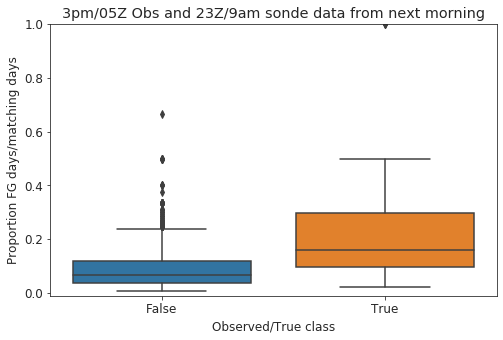

In [235]:
'''When fogflag in object/text data type
of 6617 rows, 6496 values are either T/F - 6353 are "False", 143 "True"
121 fogflags must be NaNs then

d.shape
d['fogflag'].value_counts()
d[['fogflag','chance']].isnull().sum()

When convert fogflag from obejct to bool The NaNs get converted to True !!!!!
see value count True from 143 to 264 - inc by 121
Best to drop these NaNs before doing convert to bool
and defintely before plotting or stats

d['fogflag']=d['fogflag'].astype(bool)
d['fogflag'].value_counts()
 False 6353
 True   264 '''

#https://tryolabs.com/blog/2017/03/16/pandas-seaborn-a-guide-to-handle-visualize-data-elegantly/
# https://pandas.pydata.org/pandas-docs/version/0.20.1/visualization.html
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(8,5))
d['fogflag']=d['fogflag'].astype(bool)
sns.boxplot(x="fogflag", y="chance", data=d, ax=ax)\
.set(
    title='3pm/05Z Obs and 23Z/9am sonde data from next morning',
    xlabel='Observed/True class',
    ylabel='Proportion FG days/matching days'
)
plt.ylim(-0.01,1.)
plt.savefig(f'./fg_plots/YBBN_Proportion_FG_days_BOXPLOT_3pm_obs_nxtday_9amSonde.eps', format='eps', dpi=1000)

In [224]:
print(d.loc[~d['fogflag'],'chance'].describe())
d.loc[d['fogflag'],'chance'].describe()

count    1133.000000
mean        0.091249
std         0.080075
min         0.006410
25%         0.035714
50%         0.066667
75%         0.117647
max         0.666667
Name: chance, dtype: float64


count    138.000000
mean       0.213509
std        0.174178
min        0.021739
25%        0.097090
50%        0.158947
75%        0.296429
max        1.000000
Name: chance, dtype: float64

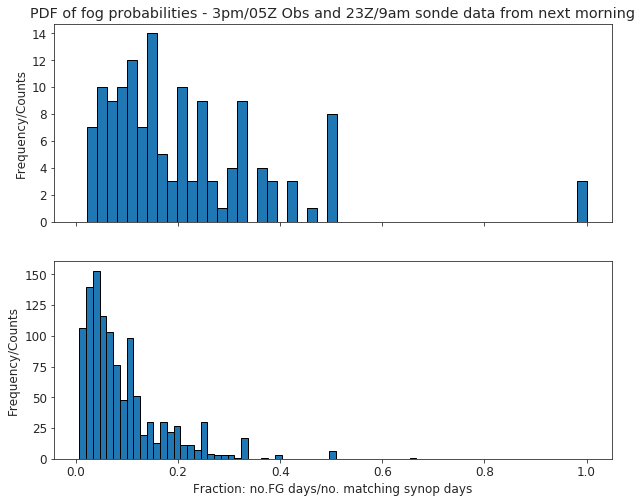

In [236]:
pos_cases = d.loc[d['fogflag'],'chance']
neg_cases = d.loc[~d['fogflag'],'chance']

from scipy import stats
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10,8), sharex=True)   #2 rows 1 col
# Plot the PDF
pos_cases.plot(ax=axes[0], y=pos_cases, kind='hist',
        bins=50, edgecolor='k',
        #range=(0.00005,pos_cases.max()),
        density=False)\
    .set(title='PDF of fog probabilities - 3pm/05Z Obs and 23Z/9am sonde data from next morning',
        ylabel='Frequency/Counts')
#pos_cases.ylabel='Normalised Frequency'
# used min as 0.00005 0.005% to eliminate high counts for prob=0.0
# for both +ve and _ve cases
neg_cases.plot(ax=axes[1], y=neg_cases, kind='hist',
        bins=50, edgecolor='k',
        #range=(0.00005,neg_cases.max()),
        density=False)\
    .set(
    xlabel='Fraction: no.FG days/no. matching synop days',
    ylabel='Frequency/Counts')


plt.savefig(f'./fg_plots/YBBN_Frequency_Fog_Proportion_3pm_obs_nxtday_9amSonde.eps', format='eps', dpi=1000)

(0, 0.5)

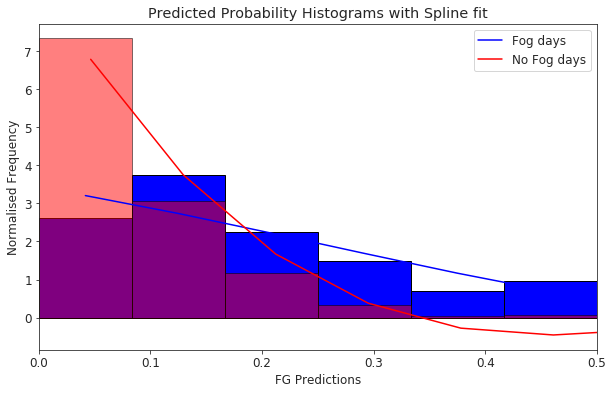

In [226]:
import numpy as np
from scipy.interpolate import UnivariateSpline
from scipy.stats import norm
from matplotlib import pyplot as plt


# since unbalanced case apply scaling factor to histo bin counts
fig, ax = plt.subplots(1, 1, figsize=(10,6))

N=d.shape[0]
n = N//100  # num of bins

pos_cases.plot(ax=ax,y=pos_cases, kind='hist',
        bins=n, edgecolor='k', color='b',
        range=(0.00005,pos_cases.max()),
        density=True)
neg_cases.plot(ax=ax,y=neg_cases, kind='hist',
        bins=n, edgecolor='k', color='r',alpha=0.5,
        range=(0.00005,pos_cases.max()),
        density=True)


# used min as 0.005 0.5% to eliminate high counts for prob=0.0
# for both +ve and _ve cases
p, x = np.histogram(
    pos_cases,
    bins=n,range=(0.00005,pos_cases.max()),
    density=True)

x = x[:-1] + (x[1] - x[0])/2   # convert bin edges to centers
f = UnivariateSpline(x=x,y=p, s=n)
ax.plot(x, f(x), c='b')

''''
You can increase or decrease s (smoothing factor)
within the UnivariateSpline function call to increase or
decrease smoothing.

Now plot PDF of probability values for non-TS days
given unbalanced we cud divide the histogram bin counts by factor u
this may look good but may lead to dodgy interpretation!!!
'''

s = neg_cases
p, x = np.histogram(
    neg_cases,
    bins=n,range=(0.005,pos_cases.max()),
    density=True) # bin it into n = N//10 bins

x = x[:-1] + (x[1] - x[0])/2   # convert bin edges to centers

f = UnivariateSpline(x=x, y=p, s=n)
ax.plot(x, f(x), c='r')

ax.set_title("Predicted Probability Histograms with Spline fit")
ax.set_xlabel("FG Predictions")
ax.set_ylabel("Normalised Frequency")
ax.legend(('Fog days','No Fog days'))
ax.set_xlim(0,0.5)
#plt.savefig(f'./fg_plots/YBBN_Frequency_Fog_Proportion_3pm_obs_nxtday_9amSonde.eps', format='eps', dpi=1000)

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


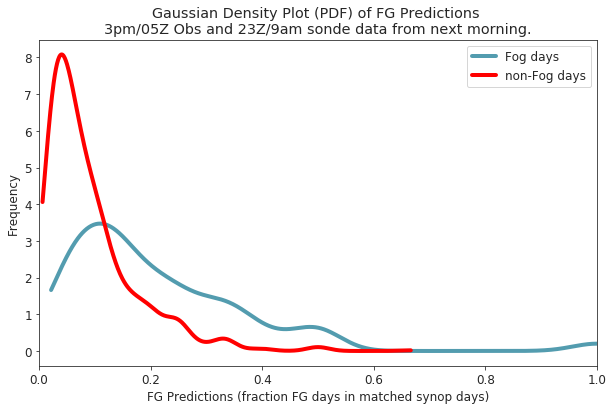

In [237]:
# We must first create a density estimate from our data

from scipy.stats import gaussian_kde
fig, ax = plt.subplots(1, 1, figsize=(10,6))

# Define a function for a density plot
def densityplot(x_data, density_est, x_label, y_label, title,kolor):
    ax.plot(x_data, density_est(x_data), color = kolor, lw = 4)
    ax.set_ylabel(y_label)
    ax.set_xlabel(x_label)
    ax.set_title(title)
    #ax.set_label(leg)
    #ax.legend()

data = pos_cases
density_est = gaussian_kde(data)

# Control the 'smoothness'of the estimate. Higher values give
# smoother estimates.
density_est.covariance_factor = lambda : .25
density_est._compute_covariance()
x_data = np.arange(min(data), max(data), 0.001)

# Call the function to create plot
densityplot(x_data = x_data
            , density_est = density_est
            , x_label = 'num days FG/num days Match Pattern'
            , y_label = 'Frequency'
            , title = 'Distribution of Proportions num FG day /num days Match Synop Pattern'
            , kolor = '#539caf')

data = neg_cases
density_est = gaussian_kde(data)

density_est.covariance_factor = lambda : .25
density_est._compute_covariance()
x_data = np.arange(min(data), max(data), 0.001)

# Call the function to create plot
densityplot(x_data = x_data
            , density_est = density_est
            , x_label = 'FG Predictions (fraction FG days in matched synop days)'
            , y_label = 'Frequency'
            , title = 'Gaussian Density Plot (PDF) of FG Predictions \n3pm/05Z Obs and 23Z/9am sonde data from next morning.'
            , kolor = 'red')

ax.legend(('Fog days', 'non-Fog days'))
ax.set_xlim(0,1.0)
plt.savefig(f'./fg_plots/YBBN_GaussianDensityProportion_3pm_obs_nxtday_9amSonde.eps', format='eps', dpi=1000)

In [228]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
for thres in [0.1,0.11,0.12,0.13,0.14,0.15]:
    fcst = d[['chance','fogflag']].copy()
    fcst['fcst'] = fcst['chance'].apply(
        lambda chance : True if chance >= thres else False)

    accuracy = accuracy_score(y_true=fcst['fogflag'].values,
                          y_pred=fcst['fcst'].values)
    print (f'\nProbability Threshold:{thres}. Accuracy:{round(accuracy, 3)}')


    cmat = confusion_matrix(y_true=fcst['fogflag'].values,
                        y_pred=fcst['fcst'].values)
    #print (cmat)
    #print ("\n", cmat.dtype)
    #print (cmat.shape)

    tn =  cmat[0,0] # +ve/True TS fcst and it happens
    tp =  cmat[1,1] #-ve/no TS fcst, and does not occur
    fp =  cmat[0,1] # +ve/True fcst, does not happen - false alarm
    fn =  cmat[1,0] # -ve/no TS fcst and it happens - missed event
    #tn, fp, fn, tp

    #print('true_negatives={}\nfalse_negatives={}\nfalse_positives={}\ntrue_positives={}'\
    #  .format(tn,fn,fp,tp))

    # so cmat is just a 2 X 2matrix
    print (' target_label | predicted_label | count ')
    print ('--------------+-----------------+-------')
    # Print out the confusion matrix.
    # NOTE: Some tools may arrange entries in a different order.
    # In our case appears to do the right thing

    for i, target_label in enumerate([False,True]):
        for j, predicted_label in enumerate([False,True]):
            print ('{0:^13} | {1:^15} | {2:5d}'.format(target_label, predicted_label, cmat[i,j]))



Probability Threshold:0.1. Accuracy:0.664
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |   742
      0       |        1        |   391
      1       |        0        |    36
      1       |        1        |   102

Probability Threshold:0.11. Accuracy:0.718
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |   814
      0       |        1        |   319
      1       |        0        |    39
      1       |        1        |    99

Probability Threshold:0.12. Accuracy:0.741
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |   852
      0       |        1        |   281
      1       |        0        |    48
      1       |        1        |    90

Probability Threshold:0.13. Accuracy:0.771
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |  

```

New variable introduce Td Seperation TmTd
above with TmTd  hits 80 , misses 52 , false alarms 293 < miss down 10, FAR similar

+/-5QNH/T +/-4Td +/-2TmTd +/- 10 wspd and 35 days  Fog days PDF max FRQ 5 near 0.08 to 0.15

@ P>0.10 hits 86  , misses 46 , false alarms 300 
@ P>0.11 hits 81  , misses 51 , false alarms 256 
@ P>0.12 hits 76  , misses 56 , false alarms 217 
@ P>0.13 hits 69  , misses 63 , false alarms 185 
@ P>0.14 hits 63  , misses 69 , false alarms 155 
@ P>0.15 hits 58  , misses 74 , false alarms 127 

+/-4QNH/T +/-3Td +/-2TmTd +/- 8 wspd and 35 days  Much better hits and lower misses

@ P>0.10 hits 101 , misses 31 , false alarms 307 
@ P>0.11 hits 101 , misses 31 , false alarms 269 
@ P>0.12 hits  93 , misses 39 , false alarms 224 
@ P>0.13 hits  89 , misses 43 , false alarms 191 
@ P>0.14 hits  81 , misses 51 , false alarms 168 
@ P>0.15 hits  78 , misses 54 , false alarms 142 

Lower Td seperation to 1 deg - keep everything else same
-------------------------------------------------------------
THIS IS OUR STAR!!

+/-4QNH/T +/-3Td +/-1TmTd +/- 8 wspd and 35 days  

@ P>0.10 hits 119 , misses 18 , false alarms 331 <-- highest hits,lowes miss - FAR about 15 per year not bad
@ P>0.11 hits 111 , misses 21 , false alarms 256 <-- highest hits,lowes miss
@ P>0.12 hits 109 , misses 23 , false alarms 226 <-- highest hits,lowes miss
@ P>0.13 hits 106 , misses 26 , false alarms 202 <-- highest hits,lowes miss
@ P>0.14 hits 105 , misses 27 , false alarms 192 <-- highest hits,lowes miss
@ P>0.15 hits  99 ,misses  33 ,false alarms  160 <actually quite good - low FAR about 8 per year!! peanuts 
-------------------------------------------------------------

Note that when we remove check for temperature we get exact same results as above
So including T does not explain any more variance in data 
+/-4QNH (noT) +/-3Td +/- 1TmTd +/- 8 wspd and 35 days 


Note that widening window for QNH and Td and wind speed 
So +/-5QNH/Td  +/- 2TmTd  +/- 10 wspd and 35 days  AND no Temp check!
Give results which are quite similar to what we get with these thresholds 
+/-5QNH/T +/-4Td +/-2TmTd +/- 10 wspd and 35 days 

So it increases misses AND False alarms at the same time!!! even when we drop Temp matching 
So essentially widening the match window has more matching dates which reduces fog probability -  makes sense

Shrinking TmTd to 1 from 2 does produce better results though
@ P>0.10 hits 100 , misses 32 , false alarms 296 <-- highest hits,lowes miss
@ P>0.11 hits  95 , misses 37 , false alarms 265 <-- highest hits,lowes miss
@ P>0.12 hits  91 , misses 41 , false alarms 234 <-- highest hits,lowes miss
@ P>0.13 hits  86 , misses 46 , false alarms 211 <-- highest hits,lowes miss
@ P>0.14 hits  85 , misses 47 , false alarms 187 <-- highest hits,lowes miss
@ P>0.15 hits  84(-15),misses 48(+15),false alarms 158 <actually quite good -low FAR!!

Expanding TmTd to 5 from 2 produce worse results
@ P>0.10 hits  79 , misses 58 , false alarms 352 
@ P>0.11 hits  70 , misses 67 , false alarms 294 

No luck with increasing window to 6 weeks - 42 days as well..

and +/-3 for all , +/- 5 for winds and 42 days !!
above with TmTd  hits 108 , misses 24 , false alarms 297

+/- 5 QNH, T +/- 2 Td and TmTd, +/-8 wind 35 days
above with TmTd  hits 105 , misses 27 , false alarms 302


        
3pm/5Z Observations parameters and 23Z sonde for predictions
+/-4QNH +/-3Td +/-3TmTd +/- 10 wspd and 35 days

Probability Threshold:0.1. Accuracy:0.652
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |   726
      0       |        1        |   405
      1       |        0        |    36
      1       |        1        |   102

Probability Threshold:0.11. Accuracy:0.701
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |   790
      0       |        1        |   341
      1       |        0        |    38
      1       |        1        |   100

Probability Threshold:0.12. Accuracy:0.729   <<<----Nice sweet spot
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |   832
      0       |        1        |   299
      1       |        0        |    45
      1       |        1        |    93

Probability Threshold:0.13. Accuracy:0.759
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |   876
      0       |        1        |   255
      1       |        0        |    51
      1       |        1        |    87

Probability Threshold:0.14. Accuracy:0.773
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |   896
      0       |        1        |   235
      1       |        0        |    53
      1       |        1        |    85

Probability Threshold:0.15. Accuracy:0.784
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |   920
      0       |        1        |   211
      1       |        0        |    63
      1       |        1        |    75
      
        
6pm/8Z observations parameters and 23Z sonde for predictions
+/-4QNH +/-3Td +/-3TmTd +/- 10 wspd and 35 days

Probability Threshold:0.1. Accuracy:0.735
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  1023
      0       |        1        |   363
      1       |        0        |    41
      1       |        1        |    97

Probability Threshold:0.11. Accuracy:0.764
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  1072
      0       |        1        |   314
      1       |        0        |    46
      1       |        1        |    92

Probability Threshold:0.12. Accuracy:0.786
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  1113
      0       |        1        |   273
      1       |        0        |    53
      1       |        1        |    85

Probability Threshold:0.13. Accuracy:0.804
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  1145
      0       |        1        |   241
      1       |        0        |    57
      1       |        1        |    81

Probability Threshold:0.14. Accuracy:0.821
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  1175
      0       |        1        |   211
      1       |        0        |    62
      1       |        1        |    76

Probability Threshold:0.15. Accuracy:0.833
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  1202
      0       |        1        |   184
      1       |        0        |    70
      1       |        1        |    68




9pm/11Z observations parameters and 23Z sonde for predictions
+/-4QNH +/-3Td +/-3TmTd +/- 10 wspd and 35 days

Probability Threshold:0.1. Accuracy:0.73
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  1046
      0       |        1        |   378
      1       |        0        |    44
      1       |        1        |    93

Probability Threshold:0.11. Accuracy:0.756
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  1095
      0       |        1        |   329
      1       |        0        |    52
      1       |        1        |    85

Probability Threshold:0.12. Accuracy:0.783
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  1141
      0       |        1        |   283
      1       |        0        |    56
      1       |        1        |    81

Probability Threshold:0.13. Accuracy:0.811
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  1189
      0       |        1        |   235
      1       |        0        |    60
      1       |        1        |    77

Probability Threshold:0.14. Accuracy:0.828
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  1217
      0       |        1        |   207
      1       |        0        |    61
      1       |        1        |    76

Probability Threshold:0.15. Accuracy:0.843
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  1253
      0       |        1        |   171
      1       |        0        |    74
      1       |        1        |    63


        
        
        
       
        
12am observations parameters and 23Z sonde for predictions
+/-4QNH +/-3Td +/-3TmTd +/- 10 wspd and 35 days

Test Accuracy: 0.745773
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  1094
      0       |        1        |   365
      1       |        0        |    41
      1       |        1        |    97

Test Accuracy: 0.777708
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  1151
      0       |        1        |   308
      1       |        0        |    47
      1       |        1        |    91

Test Accuracy: 0.793989
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  1185
      0       |        1        |   274
      1       |        0        |    55
      1       |        1        |    83

Test Accuracy: 0.8134
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  1220
      0       |        1        |   239
      1       |        0        |    59
      1       |        1        |    79

Test Accuracy: 0.822167
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  1237
      0       |        1        |   222
      1       |        0        |    62
      1       |        1        |    76

Test Accuracy: 0.846587
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  1280
      0       |        1        |   179
      1       |        0        |    66
      1       |        1        |    72

 
3am/17z parameters

Test Accuracy: 0.764877
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  1218
      0       |        1        |   359
      1       |        0        |    44
      1       |        1        |    93

Test Accuracy: 0.795216
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  1273
      0       |        1        |   304
      1       |        0        |    47
      1       |        1        |    90

Test Accuracy: 0.81797
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  1321
      0       |        1        |   256
      1       |        0        |    56
      1       |        1        |    81

Test Accuracy: 0.833139
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  1353
      0       |        1        |   224
      1       |        0        |    62
      1       |        1        |    75

Test Accuracy: 0.844224
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  1377
      0       |        1        |   200
      1       |        0        |    67
      1       |        1        |    70

Test Accuracy: 0.858226
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  1406
      0       |        1        |   171
      1       |        0        |    72
      1       |        1        |    65


```


``` 
Best with +/-4QNH (noT) +/-3Td +/- 1TmTd +/- 8 wspd Lapse rate 3C and 35 days 
Test Accuracy: 0.952711
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  5520
      0       |        1        |   269
      1       |        0        |    11
      1       |        1        |   121

Test Accuracy: 0.957609
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  5553
      0       |        1        |   236
      1       |        0        |    15
      1       |        1        |   117

Test Accuracy: 0.963689
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  5589
      0       |        1        |   200
      1       |        0        |    15
      1       |        1        |   117

Test Accuracy: 0.967742
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  5617
      0       |        1        |   172
      1       |        0        |    19
      1       |        1        |   113

Test Accuracy: 0.968249
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  5621
      0       |        1        |   168
      1       |        0        |    20
      1       |        1        |   112

Test Accuracy: 0.972978
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  5652
      0       |        1        |   137
      1       |        0        |    23
      1       |        1        |   109
      
      
      
      
Ran different time - with same threholds -  got this - even better!!
Test Accuracy: 0.950911
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  5880
      0       |        1        |   298
      1       |        0        |    12
      1       |        1        |   125

Test Accuracy: 0.955661
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  5914
      0       |        1        |   264
      1       |        0        |    16
      1       |        1        |   121

Test Accuracy: 0.961837
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  5953
      0       |        1        |   225
      1       |        0        |    16
      1       |        1        |   121

Test Accuracy: 0.965796
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  5981
      0       |        1        |   197
      1       |        0        |    19
      1       |        1        |   118

Test Accuracy: 0.967063
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  5989
      0       |        1        |   189
      1       |        0        |    19
      1       |        1        |   118

Test Accuracy: 0.971496
 target_label | predicted_label | count 
--------------+-----------------+-------
      0       |        0        |  6020
      0       |        1        |   158
      1       |        0        |    22
      1       |        1        |   115

```

In [229]:
'''Function apply_threshold() that accepts
* `probabilities` (an array of probability values)
* `threshold` (a float between 0 and 0.5)
The function returns an array,
where each element is set to +1 or -1 depending on
whether the corresponding probability exceeds `threshold`.'''
def apply_threshold(probabilities, threshold):
    predictions = np.array([ True if x > threshold else False for x in probabilities])
    return predictions

fcst.tail()
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score


def apply_threshold(probabilities, threshold):
    predictions = np.array(
        [ True if x > threshold else False for x in probabilities])
    return predictions

accuracy_all =[]
precision_all = []
recall_all = []
# probabilities = model.predict_proba(test_matrix)[:,1]
# don't have an actual model yet, though analogue selection is kind of
# nearest neighbour model
threshold_values = np.linspace(0.0, 0.5, num=100)

for threshold in threshold_values:
    predictions = apply_threshold(fcst['chance'], threshold)

    accuracy = accuracy_score(
        y_true=fcst['fogflag'].values, y_pred=predictions)
    precision = precision_score(
        y_true=fcst['fogflag'].values,y_pred=predictions)
    recall =    recall_score(
        y_true=fcst['fogflag'].values,  y_pred=predictions)

    accuracy_all.append(accuracy)
    precision_all.append(precision)
    recall_all.append(recall)

# determining optimal Decision Boundary based on accuracy
index_acc =  np.argmax(accuracy_all)
index_pre =  np.argmax(precision_all)
index_rec =  np.argmax(recall_all)

opt_DB1= threshold_values[np.argmax(accuracy_all)]
opt_DB2= threshold_values[np.argmax(precision_all)]
opt_DB3= threshold_values[np.argmax(recall_all)]

print ("The optimal Decision Boundary to maximise accuracy is",opt_DB1)
print ("With Accuracy={}, Precision={}, Recall={}"
       .format(accuracy_all[index_acc],precision_all[index_acc],recall_all[index_acc]))
print ("The optimal Decision Boundary to maximise precision is",opt_DB2)
print ("With Accuracy={}, Precision={}, Recall={}"
       .format(accuracy_all[index_pre],precision_all[index_pre],recall_all[index_pre]))
print ("The optimal Decision Boundary to maximise recall is",opt_DB3)
print ("With Accuracy={}, Precision={}, Recall={}"
       .format(accuracy_all[index_rec],precision_all[index_rec],recall_all[index_rec]))

The optimal Decision Boundary to maximise accuracy is 0.33333333333333337
With Accuracy=0.9000786782061369, Precision=0.6666666666666666, Recall=0.15942028985507245
The optimal Decision Boundary to maximise precision is 0.5
With Accuracy=0.8929976396538158, Precision=0.75, Recall=0.021739130434782608
The optimal Decision Boundary to maximise recall is 0.0
With Accuracy=0.10857592446892211, Precision=0.10857592446892211, Recall=1.0


' VERY BAD - Should be hugging the top right '

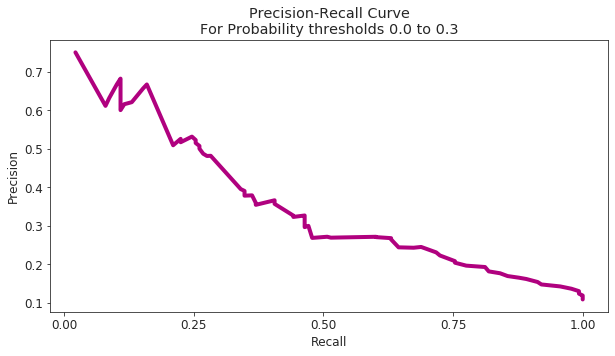

In [230]:
def plot_pr_curve(precision, recall, title):
    plt.rcParams['figure.figsize'] = 10, 5
    plt.locator_params(axis = 'x', nbins = 5)
    plt.plot(recall, precision, 'b-', linewidth=4.0, color = '#B0017F')
    plt.title(title)
    plt.ylabel('Precision')
    plt.xlabel('Recall')
    plt.rcParams.update({'font.size': 16})
    plt.savefig(f'./fg_plots/YBBN_PrecissionRecallCurve_3pm_obs_nxtday_9amSonde.eps', format='eps', dpi=1000)

plot_pr_curve(precision_all, recall_all,
              'Precision-Recall Curve\nFor Probability thresholds 0.0 to 0.3')
''' VERY BAD - Should be hugging the top right '''

In [231]:
from sklearn.preprocessing import binarize
'''
sklearn.preprocessing.binarize(X, threshold=0.0, copy=True)
does exactly what apply_threshold() function defined earlier'''

label=['Accuracy','Precision','Recall','MSE']
metrics = {}

# get validation metrics for all threshold values
new_threshold_values = np.linspace(0.0, 1.0, num=100)
for thres in new_threshold_values:

    pred = binarize(fcst['chance'].values.reshape(-1, 1), thres)
    acc = accuracy_score(fcst['fogflag'], pred)
    pre = precision_score(fcst['fogflag'], pred)
    rec = recall_score(fcst['fogflag'], pred)
    mse = 1-acc
    metrics[thres]=[acc,pre,rec,mse]

# changing to misclassification error
#MSE = [1 - x for x in accuracy_all]

#MSE[:5]
metrics = pd.DataFrame(metrics).T
metrics.columns = ['acc','pre','rec','mse']
metrics.index.name = "threhold"
metrics.iloc[:5,:]

/home/bou/py37/lib64/python3.7/site-packages/sklearn/metrics/_classification.py:1268: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,acc,pre,rec,mse
threhold,,,,
0.000000,0.108576,0.108576,1.000000,0.891424
0.010101,0.118804,0.109698,1.000000,0.881196
0.020202,0.194335,0.118761,1.000000,0.805665
0.030303,0.278521,0.130104,0.992754,0.721479
0.040404,0.369788,0.142395,0.956522,0.630212


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


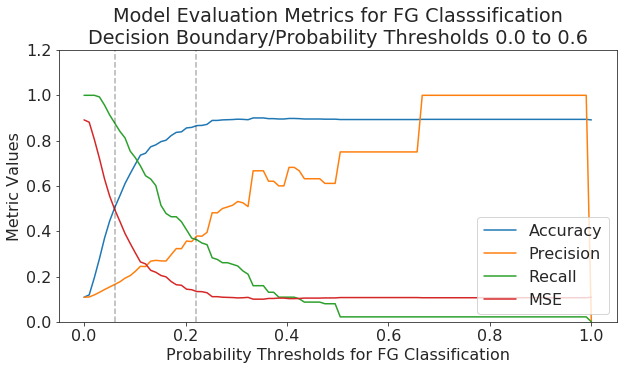

In [232]:
#plt.plot(metss,label=['Accuracy','Precision','Recall'])
# this shows that where prec/recall intersect prob value about 0.25
# good decision boundary wud be between 0.3 and point of inflection
# in accuracy and MSE curves i.e about 0.14
# also region where acuracy and recall intersect
# 0.17 is also the mean of two class probs

fig, ax = plt.subplots(1, 1, figsize=(10,5))

label=['Accuracy','Precision','Recall','MSE']
m = np.arange(4)
for m in m:
    plt.plot(metrics.iloc[:,m],label=label[m])
    #plt.rcParams['figure.figsize'] = 6, 6
#plt.xlim([0.0,0.5])
plt.ylim([0.0,1.2])
# plt.rcParams['figure.figsize'] = 6, 6
plt.axvline(x=0.06, color='k', alpha=0.3, linestyle='--')
plt.axvline(x=0.22, color='k', alpha=0.3, linestyle='--')
plt.title('Model Evaluation Metrics for FG Classsification\nDecision Boundary/Probability Thresholds 0.0 to 0.6')
plt.xlabel('Probability Thresholds for FG Classification')
plt.ylabel('Metric Values')
plt.legend(loc=4,)
plt.savefig(f'./fg_plots/YBBN_ModelEveluationMetrics_3pm_obs_nxtday_9amSonde.eps', format='eps', dpi=1000)

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


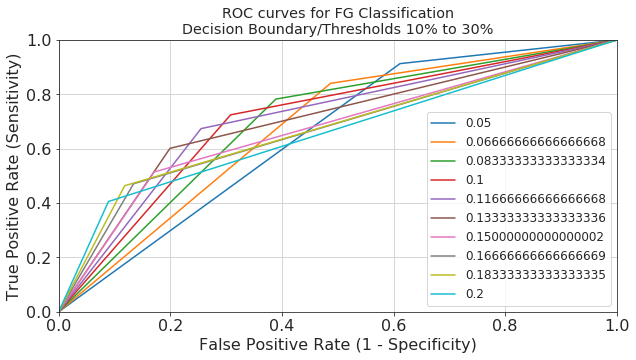

In [233]:
from sklearn import metrics
# https://www.medcalc.org/manual/roc-curves.php

fig, ax = plt.subplots(1, 1, figsize=(10,5))

for thres in np.linspace(0.05, 0.2, num=10):
    pred = binarize(fcst['chance'].values.reshape(-1, 1), thres)
    fpr, tpr, thresholds = metrics.roc_curve(fcst['fogflag'], pred)
    plt.plot(fpr, tpr, label = str(thres))

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.rcParams['font.size'] = 12
plt.title('ROC curves for FG Classification\nDecision Boundary/Thresholds 10% to 30%')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.legend(loc=4,)
plt.grid(True)

plt.savefig(f'./fg_plots/YBBN_ROCC_Curves_3pm_obs_nxtday_9amSonde.eps', format='eps', dpi=1000)

# green or red roc curcve fo prob 0.04 and 0.06 is good tradeoff
# Not this will produce quite high FAR - overforecasting fog!!

# Fog modelling - move to new notebook

In [234]:
df =pd.merge(left=sonde23,right=dat17,how='left',left_index=True,right_index=True)
print(dat17.shape,sonde23.shape)
print(dat17.isnull().sum(axis=0),sonde23.isnull().sum(axis=0))
df=df[['900_wdir', '900_WS', 'T850', 'Td850', '850_wdir',
       '850_WS', 'T700', 'Td700', '700_wdir', '700_WS', 'T500',
       'Td500', '500_wdir', '500_WS', 'season', 'lr_sfc_850', 'lr_850_500',
       'mid_rh', 'fogflag_x', 'WDir', 'WS', 'T', 'Td', 'RH', 'pptnSince9',
       'QNH']].dropna()
df = df.rename({'fogflag_x':'fogflag'},axis=1)  # rename fogflag
print(df.isnull().sum(axis=0))
df.shape

(7569, 17) (6891, 30)
WDir            59
WS              59
T               59
Td              59
RH              59
pptnSince9     135
vis            143
vis_aws        298
PW            6793
QNH             96
Ceil1_ht      4206
Ceil1_amnt      59
Ceil2_ht      5760
Ceil2_amnt      59
Ceil3_ht      6549
Ceil3_amnt      59
fogflag        576
dtype: int64 sfc_P                 0
sfc_T                 0
sfc_Td                0
sfc_wdir              0
sfc_wspd              0
P910                  0
T910               6403
Td910              6403
900_wdir            208
900_WS              208
P850                  0
T850                 19
Td850                19
850_wdir            266
850_WS              266
P700                  0
T700                 23
Td700                23
700_wdir            157
700_WS              157
P500                  0
T500                 33
Td500                33
500_wdir            108
500_WS              108
tmp_rate850_500      39
season            

KeyError: "['fogflag_x'] not in index"

In [ ]:
df_test=df
print(df_test.shape)
df_test['fogflag'].value_counts()  
# only 44 fog cases with dat14/dat17 and sonde 17 - so many missing sondes 17z - no good
# Vs 132  fog cases with dat14/dat17 and sonde 23
#df_test.tail()

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor, GradientBoostingClassifier
from sklearn.model_selection import cross_val_score

# testing for relationships.
# for numeric targets.
'''reg = GradientBoostingRegressor(n_estimators=100, max_depth=5,
                                learning_rate=0.1, loss='ls',
                                random_state=1)
'''
# for categorical targets.
clf = GradientBoostingClassifier(n_estimators=100, max_depth=5,
                                learning_rate=0.1, loss='deviance',
                                random_state=1)
       
# try to predict one feature using the rest of others to test collinearity, so it's easier to interpret the results
'''
for c in cols:
    # c is the thing to predict.
    
    if c not in ['rand0', 'rand1', 'rand2']: 

        X = df_test.drop([c], axis=1) # drop the thing to predict.
        X = pd.get_dummies(X)
        y = df_test[c]

        print(c)

        if c in non_numeric_columns:
            scoring = 'accuracy'
            model = clf
            scores = cross_val_score(clf, X, y, cv=5, scoring=scoring)
            print(scoring + ": %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))
        elif c in numeric_columns:
            scoring = 'neg_root_mean_squared_error'
            model = reg
            scores = cross_val_score(reg, X, y, cv=5, scoring=scoring)
            print(scoring.replace('neg_', '') + ": %0.2f (+/- %0.2f)" % (-scores.mean(), scores.std() * 2))
        else:
            print('what is this?')

        model.fit(X, y)
        df_importances = pd.DataFrame(data={'feature_name': X.columns, 'importance': model.feature_importances_}).sort_values(by='importance', ascending=False)
        top5_features = df_importances.iloc[:5]
        print('top 5 features:')
        print(top5_features)
'''

X = df_test.drop(['fogflag'], axis=1) # drop the thing to predict.
X = pd.get_dummies(X)
y = df_test['fogflag'].astype('int') 
print(df_test['fogflag'].astype('int').value_counts() )
scoring = 'accuracy'
model = clf
scores = cross_val_score(clf, X, y, cv=5, scoring=scoring)
print(scoring + ": %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))

model.fit(X, y)
df_importances = pd.DataFrame(
    data={'feature_name': X.columns,
          'importance': model.feature_importances_}).\
sort_values(by='importance', ascending=False)

top10_features = df_importances.iloc[:10]
print('top 10 features:')
print(top10_features)

In [ ]:
top20_features = df_importances.iloc[:20]
print('top 20 features:')
print(top20_features)

In [ ]:
fg_aut.columns

In [ ]:
fg_aut.loc[:,(fg_aut.columns.str.contains(pat = '20', regex = True))].columns

In [ ]:
fg_aut.loc[:,(fg_aut.columns.str.contains(pat = '11', regex = True))].tail(1)

In [ ]:
# drop RH obs at all synop times - bext to use regex fotr this
X=fg_aut.loc[:,~(fg_aut.columns.str.contains(pat = 'RH', regex = True))]
# drop other cols
X=X.drop(labels=['avID', 'man', 'aut', 'min_vis', 'fg_onset',
       'fg_finish', 'fg_duration'],axis=1)
# grab only 14Z - 12am obs
# Choose which synop hour to match - this one matchs 14Z 
X=X.loc[:,(X.columns.str.contains(pat = '17|fogflag', regex = True))]
# fg_aut.loc[:,~(fg_aut.columns.str.contains(pat = '(5|8|11|17|20)', regex = True))]

X=pd.merge(left=X, right=sonde23[['lr_sfc_850','900_wdir']],
           how='left',left_index=True,right_index=True)
print(X.columns,X.shape)
'''
'fogflag','rain24hr','avg_wk_rain','QNH14_48hr','avg_wk_rain'
'TmTd8','TmTd11','TmTd14','TmTd17','TmTd20',
'Td8to14','Td11to17','TmTd14_24hr','TmTd17_24hr','TmTd14_48hr' '''
X=X.dropna()
X.shape

In [ ]:
clf = GradientBoostingClassifier(n_estimators=100, max_depth=5,
                                learning_rate=0.1, loss='deviance',
                                random_state=1)


y = X['fogflag'].astype('int') 
X = X.drop(['fogflag'],axis=1) # drop the thing to predict.
X = pd.get_dummies(X)

print(fg_aut['fogflag'].astype('int').value_counts() )
scoring = 'accuracy'
model = clf
scores = cross_val_score(clf, X, y, cv=5, scoring=scoring)
print(scoring + ": %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))

model.fit(X, y)
df_importances = pd.DataFrame(
    data={'feature_name': X.columns, 'importance': model.feature_importances_}).\
sort_values(by='importance', ascending=False)
top10_features = df_importances.iloc[:10]
print('top 10 features:')
print(top10_features)

```
Using 14Z obs for prediction
============================
accuracy: 0.97 (+/- 0.00)
top 10 features:
   feature_name  importance
4        TmTd14    0.219200
12     900_wdir    0.068704
11   lr_sfc_850    0.059463
1          Td14    0.053134
6   TmTd14_24hr    0.052305
8    QNH14_48hr    0.050761
2         QNH14    0.050335
5       Td8to14    0.049441
3        pptn14    0.049285
10       wspd14    0.047592

Using 17Z obs for prediction
============================
accuracy: 0.98 (+/- 0.00)
top 10 features:
  feature_name  importance
4       TmTd17    0.278584
5     Td11to17    0.098352
8   lr_sfc_850    0.096142
2        QNH17    0.070426
9     900_wdir    0.053699
0          T17    0.053433
3       pptn17    0.048248
6       wdir17    0.041805
1         Td17    0.041384
7       wspd17    0.027057
9        wspd17    0.034356
```

## Handle class imbalance

```Now do the same adjusting for class imbalance 
Guess the large class imbalance is influencing feature importance
```

In [ ]:
print("Shape of data",fg_aut.shape)
print("How many fog/no fog days\n",fg_aut['fogflag'].value_counts())
print("Need only twice as many non fog days: ",fg_aut['fogflag'].value_counts()[1]*2)
no_fog_days = fg_aut.loc[~fg_aut['fogflag']]
print("Current size of no fog days: ",no_fog_days.shape[0])
'''Now to grab 320 non fog days - just get fraction of non-fog days
'''
print(f'So we need to grab just {318/no_fog_days.shape[0]}% of the non fog days')


```pandas.DataFrame.sample
DataFrame.sample(n=None, frac=None, replace=False, weights=None, random_state=None, axis=None)
Return a random sample of items from an axis of object.
```

In [ ]:
fg_days_sample = fg_aut.loc[fg_aut['fogflag']]
no_fog_days_sample = fg_aut.loc[~fg_aut['fogflag']]\
    .sample(frac=0.50, replace=False,random_state=99,axis=0)

print(no_fog_days_sample.shape)
no_fog_days_sample['fogflag'].value_counts()  # none true so great
# join with fg days
sample = pd.concat([fg_days_sample,no_fog_days_sample],axis=0)
print(sample.shape)
sample['fogflag'].value_counts()

In [ ]:
# drop RH obs at all synop times - bext to use regex fotr this
X=sample.loc[:,~(sample.columns.str.contains(pat = 'RH', regex = True))]
# drop other cols
X=X.drop(labels=['avID', 'man', 'aut', 'min_vis', 'fg_onset',
       'fg_finish', 'fg_duration'],axis=1)
# grab only 14Z - 12am obs
# Choose which synop hour to match - this one matchs 14Z 
X=X.loc[:,(X.columns.str.contains(pat = '\D8|fogflag', regex = True))]
# fg_aut.loc[:,~(fg_aut.columns.str.contains(pat = '(5|8|11|17|20)', regex = True))]

X=pd.merge(left=X, 
           right=sonde23[['lr_sfc_850','lr_850_500',
                          'mid_rh','900_wdir','900_WS']],
           how='left',left_index=True,right_index=True)
print(X.columns,X.shape)
'''
'fogflag','rain24hr','avg_wk_rain','QNH14_48hr','avg_wk_rain'
'TmTd8','TmTd11','TmTd14','TmTd17','TmTd20',
'Td8to14','Td11to17','TmTd14_24hr','TmTd17_24hr','TmTd14_48hr' '''
X=X.dropna()
X.shape

In [ ]:
# apply machine learning to sample only
clf = GradientBoostingClassifier(n_estimators=100, max_depth=5,
                                learning_rate=0.1, loss='deviance',
                                random_state=1)
y = X['fogflag'].astype('int') 
X = X.drop(['fogflag'],axis=1) # drop the thing to predict.
X = pd.get_dummies(X)

print(sample['fogflag'].astype('int').value_counts() )
scoring = 'accuracy'
model = clf
scores = cross_val_score(clf, X, y, cv=5, scoring=scoring)
print(scoring + ": %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))

model.fit(X, y)
df_importances = pd.DataFrame(
    data={'feature_name': X.columns, 
          'importance': model.feature_importances_}).\
sort_values(by='importance', ascending=False)
top10_features = df_importances.iloc[:10]
print('top 10 features:')
print(top10_features)

Variables that have most impact on fog/no fog outcome prediction 
- TmTd ( explains about 45-60% of the variance) MUST HAVE 
- Td
- QNH (upto 10% variance esp 6pm data)


```
accuracy: 0.75 (+/- 0.08)
top 10 features:
     feature_name  importance - after remove TmTd
7           TmTd5    0.274842
1              T5    0.121315 - 22%
0        rain24hr    0.070495
3            QNH5    0.067141 - 11%
2             Td5    0.058930 - 21%
6     avg_wk_rain    0.048124
70  wind5_ 050/10    0.034623
78  wind5_ 060/07    0.016056
33  wind5_ 020/13    0.015588
22  wind5_ 010/20    0.013252

accuracy: 0.81 (+/- 0.07)
top 10 features:
    feature_name  importance
7          TmTd8    0.493513
3           QNH8    0.104615 - same
2            Td8    0.059085 - 33% 
6    avg_wk_rain    0.046776
0       rain24hr    0.042618
1             T8    0.042486
4          pptn8    0.024830
64  wind8_060/06    0.013165
50  wind8_040/06    0.011270
57  wind8_050/07    0.010701

accuracy: 0.95 (+/- 0.01)- with 50% of no fog days ONLY
top 10 features:
   feature_name  importance
4         TmTd8    0.202814
7      900_wdir    0.117921
6    lr_sfc_850    0.091683
2          QNH8    0.070050
1           Td8    0.068032
8        900_WS    0.060461
5       Td8to14    0.040647
3         pptn8    0.036027
9  wind8_000/00    0.019870
0            T8    0.019003

---------------------------------------------------------
accuracy: 0.85 (+/- 0.09)
top 10 features:
      feature_name  importance
7           TmTd11    0.524203
3            QNH11    0.080937 similar
1              T11    0.051385 - 17
8           wdir11    0.043006
2             Td11    0.036937 - 22
9           wspd11    0.033737
0         rain24hr    0.032487
169  wind11_250/04    0.024837
4           pptn11    0.023362
6      avg_wk_rain    0.019941

accuracy: 0.96 (+/- 0.01)  - with 50% of no fog days ONLY
top 10 features:
   feature_name  importance
4        TmTd11    0.235419
5      Td11to17    0.097654
8    lr_sfc_850    0.089612
9      900_wdir    0.060726
2         QNH11    0.045412
6        wdir11    0.045056
3        pptn11    0.040450
10       900_WS    0.039752
1          Td11    0.037673
7        wspd11    0.032150
-------------------------------------------------------
accuracy: 0.86 (+/- 0.08)
top 10 features:
   feature_name  importance
7        TmTd14    0.564622
8        wdir14    0.070851 - 10
3         QNH14    0.045600  similar
2          Td14    0.043172 - 20
9        wspd14    0.038094
0      rain24hr    0.036487
10  TmTd14_24hr    0.031913
6   avg_wk_rain    0.027405
1           T14    0.025197 - 18
4        pptn14    0.012562

accuracy: 0.96 (+/- 0.01)  - with 50% of no fog days ONLY
top 10 features:
   feature_name  importance
4        TmTd14    0.304399
12     900_wdir    0.091069
3        pptn14    0.062357
11   lr_sfc_850    0.052417
2         QNH14    0.045645
10       wspd14    0.044015
5       Td8to14    0.042976
8    QNH14_48hr    0.038007
9        wdir14    0.034179
1          Td14    0.032321
-----------------------------------------------------
accuracy: 0.87 (+/- 0.07)
top 10 features:
     feature_name  importance
7          TmTd17    0.603478
8     TmTd17_24hr    0.062976
10         wspd17    0.048170
6     avg_wk_rain    0.037558
1             T17    0.035375 - 25
3           QNH17    0.031599 -  8
2            Td17    0.023320 - 24
9          wdir17    0.019557
4          pptn17    0.012599
39  wind17_100/05    0.010449

accuracy: 0.97 (+/- 0.02)   - with 50% of no fog days ONLY
top 10 features:
   feature_name  importance
4        TmTd17    0.370585
5      Td11to17    0.103473
9      900_wdir    0.084612
8    lr_sfc_850    0.063616
3        pptn17    0.054474
2         QNH17    0.052608
1          Td17    0.038713
7        wspd17    0.036307
0           T17    0.034485
10       900_WS    0.028937

```

### `sklearn.neighbors.KNeighborsClassifier`

Defaults
-  n_neighbors : int, optional (default = 5)
- weights : str or callable, optional (default = ‘uniform’)
- algorithm : {‘auto’, ‘ball_tree’, ‘kd_tree’, ‘brute’}, optional, 'auto'
- p : integer, optional (default p = 2 -> euclidean_distance (l2)
- metric : string or callable, default ‘minkowski’ (with p=2 is equivalent to the standard Euclidean metric)
- leaf_size : int, optional (default = 30), Leaf size passed to BallTree or KDTree.
```
KNeighborsClassifier(n_neighbors=10,
                            weights='uniform',
                            algorithm='auto'
                            p=2,metric=‘minkowski’)```

In [ ]:
fg_aut.columns

In [ ]:
# drop RH and surface wind obs at all synop times
dat=fg_aut.loc[:,~(fg_aut.columns.str.contains(
    pat = '(RH|wind|wdir)', regex = True))]

# drop other cols related to observed fog
dat=dat.drop(labels=['avID', 'man', 'aut', 'min_vis', 'fg_onset',
       'fg_finish', 'fg_duration'],axis=1)

# grab only 14Z/12am obs
# Choose which synop hour to match - this one matchs 14Z 
dat=dat.loc[:,(dat.columns.str.contains(
    pat = '\D14|fogflag|avg', regex = True))]
# fg_aut.loc[:,~(fg_aut.columns.str.contains(pat = '(5|8|11|17|20)', regex = True))]

dat=pd.merge(left=dat, 
           right=sonde23[['lr_sfc_850','lr_850_500',
                          'mid_rh','900_wdir','900_WS','850_wdir','850_WS']],
           how='left',left_index=True,right_index=True)
print(dat.columns,dat.shape)
dat.dropna(inplace=True)
print(f'{dat.columns}\ndat.shape:{dat.shape}\ndat.fogflag value counts\
      \n{dat["fogflag"].value_counts()}')

In [ ]:
# Train KNN using un-scaled features 

from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score

# create design matrix X and target vector y
# Note all features and response data has to be numeric
y = np.array(dat.loc[:,'fogflag'].astype('int')) # response or target
X = np.array(dat.iloc[:, 1:]) #features all except 'fogflag' columns

# instantiate learning model (k = 10 neighbours - prediction is majority voting)
knn = KNeighborsClassifier(n_neighbors=10)

# fitting the model
knn.fit(X, y)

# predict the response
pred = knn.predict(X)

# evaluate accuracy
print (accuracy_score(y, pred))

# out of all TS forecasts how many we get correct
# for every 100 TS predictions, 63 are correct
print (precision_score(y, pred))  

# out of all observed TS days how many we correctly predict
# we only succesfully predict 14 out of every 100 TS days
# this is VERY BAD - we 91% accuracy as most days we dont have TS and we correctly predict that
# but POD is only 14%
print (recall_score(y, pred))
set(y) - set(pred)

### KNeighborsClassifier Never predicts FOG !!!
`Precision is ill-defined and being set to 0.0 due to no predicted samples` Essentially it says that the prediction does not include any outcome of value 1 - FOG equal True!!!

In [ ]:
print(f'The response values can be either True(1) or False (0).\
\nUnique values in prediction are {np.unique(pred)} \nwhile unique response in actual data {np.unique(y)}')


# This just checks if .astype(int) coccrectly converts False to 0 and True to 1 - it DOES
list(
    zip(np.array(dat.loc[:,'fogflag']),
        np.array(dat.loc[:,'fogflag'].astype('int')) )
    )

### `kneighbors([X, n_neighbors, return_distance]) `

http://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html#sklearn.neighbors.KNeighborsClassifier.kneighbors

Returns indices of and distances to the neighbors of each point.
Parameters:	

X : array-like, shape (n_query, n_features), or (n_query, n_indexed) if metric == ‘precomputed’

    The query point or points. If not provided, neighbors of each indexed point are returned. In this case, the query point is not considered its own neighbor.

n_neighbors : int

    Number of neighbors to get (default is the value passed to the constructor).

return_distance : boolean, optional. Defaults to True.

    If False, distances will not be returned

Returns:	

dist : array

    Array representing the lengths to points, only present if return_distance=True

ind : array

    Indices of the nearest points in the population matrix.

In [ ]:
# Lets now pull out 10 nearest or most similar days 
# to our query date from dataset
'''
distances,indices = knn.kneighbors(X[6386,:],n_neighbors=10)'''

# note we don't want to include reponse in X matrix
# is this realle necessary
# X = np.array(ob.iloc[:, :10]) # leave out response 'TS' 
y = np.array(dat.loc[:,'fogflag'].astype('int')) # response or target
X = np.array(dat.iloc[:, 1:]) #features all except 'fogflag' columns

# Our worst fog day recently
dat.loc['2017-07-07']
#dat.iloc[5766,:]

In [ ]:
# Need to figure row index for this date
ob_no_index = dat.reset_index()
print(ob_no_index.columns) 
'''datetimeindex moves to 'index' col, 
this is good as it will help us figure which 
int row id points to which date later on
when we inspect the closest neighbours''' 

ob_no_index[ob_no_index['index'] == '2017-07-07']

In [ ]:
# Now we can pull data for query obs as follows
print(ob_no_index[ob_no_index['index']=='2017-07-07'].index)
ind = ob_no_index[ob_no_index['index']=='2017-07-07'].index[0]
# grab 1st n only elment
# check array values to see if we got correct sample
#print(X[6460,:].ndim)  # 1-D
#print(X[6460,:].shape) # 10

X[ind,:]  
# cross check with feature values above NB not scaled!

In [ ]:
print(X[ind,:].shape)
print(X[ind,:].ndim)
print(X[ind,:].reshape(1, -1).shape) # 1 X 10
print(X[ind,:].reshape(1, -1).ndim)  # 2-D

distances,indices = knn.kneighbors(
    X[ind,:].reshape(1, -1) ,
    n_neighbors=10)

In [ ]:
indices

In [ ]:
 #NB indices is 2-D - we flatten to list b4 looking up
dat.iloc[indices.flatten()]

We can see that out of 10 nearest neighbours 2 had fog 

2/10 of neighbours so 20% chance getting fog. The default classifier uses majority voting - usually P>=0.5 for precit positive case - so our query obs for '2017-07-07' gets classified as no fog we see later on. But if we set threshold >=10% then it gets fogges!!!!

To see distances as well, bit more work involved.

In [ ]:
print(indices)

neighbours = pd.DataFrame({'distance':distances.flatten(),
                         'id':indices.flatten()})
neighbours.set_index('id', inplace=True)
neighbours_best10 = \
    ob_no_index.join(neighbours,how='right').nsmallest(10,'distance')
neighbours_best10

In [ ]:
'''suppose we find 10 nearest neighbours, 
but only want to see closest 5, nsmallest()'''

neighbours = pd.DataFrame({'distance':distances.flatten(),
                         'id':indices.flatten()})
neighbours.set_index('id', inplace=True)
ob_no_index.join(neighbours,how='right').nsmallest(5,'distance')

In [ ]:
close5 = ob_no_index.join(neighbours,how='right').nsmallest(5,'distance').index.values
close5

In [ ]:
# Lets feed these 5 NN back into model and get thier predictions
# see how they go 
X5nn = np.array(dat.iloc[close5, 1:])  

# ValueError: Location based indexing can only have [integer,
# integer slice
y5nn = np.array(dat.iloc[close5,0])  

# fitting the model WE USE the MODEL FITTED/TRAINED EARLIER
# knn.fit(X, y)

'''Note the predicted probabilities have probs for both class labels
[Prob(No FG), Prob(FG)]  e.g [0.8,0.2] means 80% chance no fog, 20% chaane fog
To make prediction - the default classifier uses threshold of 50% and given the 
probs for no fog class > 50%, all cases get negative - no fog prediction!'''

# predict the response
pred = knn.predict(X5nn)
pred_probs = knn.predict_proba(X5nn)
pd.DataFrame(data = list(zip(close5,pred_probs,pred,y5nn)),
             columns=['idx','Predict Probs', 'Predict Class','Observed class']).set_index('idx')

In [ ]:
from sklearn.model_selection import train_test_split
#from sklearn.cross_validation import train_test_split

# split into train and test, 
X_train, X_test, y_train, y_test = \
    train_test_split(X, y, test_size=0.33, random_state=42)

print (X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)
print (y_train[:10])  # just check if its really fog col
# instantiate learning model (k = 10)
knn = KNeighborsClassifier(n_neighbors=10)

# fitting the model
knn.fit(X_train, y_train)

# predict the response
pred = knn.predict(X_test)

# get probability estimates as well
pred_probs = knn.predict_proba(X_test)

''' when trained using all data
0.907740422205
0.674796747967
0.13112164297'''
# evaluate accuracy
print (accuracy_score(y_test, pred))
# out of all TS forecasts how many we get correct
print (precision_score(y_test, pred))  
# out of all observed TS days how many we correctly predict
print (recall_score(y_test, pred))

In [ ]:
# Again only negative cases in prediction
np.unique(y_test),np.unique(pred)

**`sklearn.preprocessing.scale()`**

Standardization, or mean removal and variance scaling transform the data to center it by removing the mean value of each feature, then scale it by dividing non-constant features by their standard deviation.

This shifts the distribution of each attribute to have a mean of zero and a standard deviation of one (unit variance).

It is useful to standardize attributes for a model that relies on the distribution of attributes such as Gaussian processes.

For instance, many elements used in the objective function of a learning algorithm (such as the RBF kernel of Support Vector Machines or the l1 and l2 regularizers of linear models) assume that all features are centered around zero and have variance in the same order. 

**If a feature has a variance that is orders of magnitude larger than others, it might dominate the objective function and make the estimator unable to learn from other features correctly as expected.**

In [ ]:
print("Feature means before scaling\n",X_train.mean(axis=0))
print("Feature variance before scaling\n",X_train.std(axis=0))

In [ ]:
from sklearn.preprocessing import scale
X_train_scaled = scale(X_train)
X_test_scaled =  scale(X_test)

print("Feature means after scaling\n",X_train_scaled.mean(axis=0))
print("Feature variance before scaling\n",X_train_scaled.std(axis=0))

# Note Scaled data has zero mean 
# (near zero - see exp -14 and -16 !!!) and unit variance (1)

In [ ]:
# Train KNN using scaled features 

# instantiate learning model (k = 10)
knn = KNeighborsClassifier(n_neighbors=10)

# fitting the model
knn.fit(X_train_scaled, y_train)

# predict the response
pred = knn.predict(X_test_scaled)

# get probability estimates as well
pred_probs = knn.predict_proba(X_test_scaled)

# evaluate accuracy
print (accuracy_score(y_test, pred))
# out of all TS forecasts how many we get correct
print (precision_score(y_test, pred))  
# out of all observed TS days how many we correctly predict
print (recall_score(y_test, pred))
# similar accuracy to when we fit/trained on all data (91%)
# pre and recall improved a bit
# Accuracy ~ 0.98 for both scaled and unscaled features - no real gain
# However precision is 100% and recall 8% MASSIVE changes

### `predict_proba()` 
-    Predicts the probabilities
-    Choose the class with the highest probability

There is a 0.5 classification threshold

-    Class 1 is predicted if probability > 0.5
-    Class 0 is predicted if probability < 0.5

The predict_proba() function returns the probability values 
for both classes +1 and -1. 
- column 0: predicted probability that each observation is a member of class 0/no FOG
- column 1: predicted probability that each observation is a member of class 1/FOG

In [ ]:
predictions = pd.DataFrame(
              data = list(zip(y_test,pred, pred_probs)),
              columns=['Observed Class','Predict Class','Predict Probs']).\
              sort_values(by='Predict Class',ascending=False)
predictions

In [ ]:
# predictions['Predict Class'].value_counts()   1574 zero class predictions - no fog prediction!!!
predictions['Observed Class'].value_counts()

In [ ]:
print(f"Out of {predictions['Observed Class'].value_counts()[1]} fog cases,\
only {predictions['Predict Class'].value_counts()[1]} correctly predicted \
-> Giving recall of just \
{(predictions['Predict Class'].value_counts()[1]/predictions['Observed Class'].value_counts()[1])*100:.1f}%")

In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score

k_range=list(range(1,20))
k_scores=[]
for k in k_range:
    knn=KNeighborsClassifier(n_neighbors=k)
    scores=cross_val_score(knn, X_train_scaled, y_train, cv=10,scoring='recall')
    k_scores.append(scores.mean())
    
print(np.round(k_scores,3)) # to display scores to 3 decimal places

from matplotlib import pyplot as plt
plt.plot(k_range,k_scores,color="red")
plt.xlabel('k values')
plt.ylabel('Recall')
plt.show()

# NB Very unbalaced data set so recall only as high as 20%
# will try this again with balanced dataset later

What data does say is that we need smaller k - i.e we don't need 10 or 15 neighbours - only 2 or 3 enough for pediction. Grid Search for parameters suggest we need only 1 neighbour!! for max recall - but that is ony 19%.

We can do better than that if we shift threshold from 50% to sthn like 20%

From the above plot the optimal k value is somewhere between 1 and 10. Looking at the scores, at k=5 we have the highest recall/sensitivity.

We can use a more efficient parameter tuning approach called GridSearchCV as shown below which basically automates the search process and it also fits the optimal parameter to the training data.

In [ ]:
#from sklearn.grid_search import GridSearchCV
from sklearn.model_selection import GridSearchCV
k_range=list(range(1,10))
param_grid=dict(n_neighbors=k_range)
scores = ['accuracy', 'recall'] # evaluation scores for selecting best parameter
for sc in scores:
    grid_knn=GridSearchCV(knn,param_grid,cv=10,scoring=sc,n_jobs=-1)
    print("# Tuning hyper-parameters for %s" % sc)
    grid_knn.fit(X_train_scaled,y_train)
    
    print(grid_knn.best_params_)
    print(np.round(grid_knn.best_score_,3))

In [ ]:
# we only test neighbours 1 to 50
neighbors = list(range(1,10))

# empty list that will hold cv scores
accuracy_scores = []
precision_scores = []
recall_scores = []

# perform 10-fold cross validation
# for ks=1 to ks=51
for k in neighbors:
    knn = KNeighborsClassifier(n_neighbors=k)
    acc = cross_val_score(
        knn, X_train_scaled, y_train, cv=10, scoring='accuracy')
    pre = cross_val_score(
        knn, X_train_scaled, y_train, cv=10, scoring='precision')
    rec = cross_val_score(
        knn, X_train_scaled, y_train, cv=10, scoring='recall')
    
    '''Since CV=10, for each iteration we get 10 set of scores
    for each metric, take mean b4 saving'''
    accuracy_scores.append(acc.mean())
    precision_scores.append(pre.mean())
    recall_scores.append(rec.mean())
    
# changing to misclassification error
MSE = [1 - x for x in accuracy_scores]

MSE[:5]

In [ ]:
# determining best k
optimal_k = neighbors[MSE.index(min(MSE))]
optimal_k = neighbors[np.argmin(MSE)]
print ("The optimal number of neighbors is %d" % optimal_k)
#print ("In practice k is chosen from the ``elbow corner`` of curve,\
#       so more like k=10")
# plot misclassification error vs k
plt.plot(neighbors, MSE)
plt.xlabel('Number of Neighbors K')
plt.ylabel('Misclassification Error')
plt.show()

Note how validation error (MSE) starts to steadily incr from k=2 onwards.

Best k cud be anywhere 1 to 3 from above plot.

Now we have used cross-validation to determine our optimal k, we can go ahead and train our model using k=16 and test using the 1/3 held out test data.

This completes our train. validate, test cycle. Good thing with cross validation, we don't have to partition data into 3 sets, like this
- train set  e.g 60%
- validate set   35%
- test set       15%

Instead we just do what we did
- train set  e.g 2/3, 66.6%
- test set       1/3, 33.3%

CV performs validation on the held out (1/10) set
- for CV=10,splits train data set into 10 parts
- hold 1st 1/10 of data for validation, model fit/train on remaining 9/10, then test/validate using held out 1/10
- then hold the 2nd 1/10 set for validation, train on remaining 9/10 parts, then validate on 2nd part
- and so on - every time holding different 1/10 part for validation and train on remaining 9/10 parts

Validation can be used to tweak various parameters of the model such as how many neighbours to use etc etc
And when we finally happy with performance do final testing with the test set set aside in the beginning.

In [ ]:
from sklearn.preprocessing import binarize

knn = KNeighborsClassifier(n_neighbors=10) 
                           #weights='uniform',
                           #metric='minkowski', p=2,
                           #algorithm='auto')
knn.fit(X_train_scaled, y_train)
pred = knn.predict(X_test_scaled)

print(knn.predict_proba(X_test_scaled).shape)
knn.predict_proba(X_test_scaled)

In [ ]:
'''
sklearn.preprocessing.binarize(X, threshold=0.0, copy=True)
makes our apply_threshold() redundant but this demonstrates 
how it really works behind the scene'''

#def apply_threshold(probabilities, threshold):  
#    predictions = np.array(
#        [ True if x > threshold else False for x in probabilities]) 
#    return predictions

threshold_values = np.linspace(0.0, 0.5, num=20)

# create design matrix X and target vector y
# Note all features and response data has to be numeric
y = np.array(dat.loc[:,'fogflag'].astype('int')) # response or target
X = np.array(dat.iloc[:, 1:]) #features all except 'fogflag' columns       # response or target

# split into train and test, 
X_train, X_test, y_train, y_test = \
    train_test_split(X, y, test_size=0.33, random_state=42)
    
accuracy_all =[]
precision_all = []
recall_all = []

# get validation metrics for all threshold values

for threshold in threshold_values:
    
    knn = KNeighborsClassifier(n_neighbors=15) 
    knn.fit(X_train_scaled, y_train)
    
    # pred = knn.predict(X_test_scaled)  # uses threshold 0.5 by 

    y_pred_prob = knn.predict_proba(X_test_scaled)[:,1]  
    # y_pred_prob 1-D, reshape to 2-D then binarize
    pred = binarize(y_pred_prob.reshape(-1, 1), threshold).flatten()
    # pred is 2-D , so had to flatten to 1-D
    # pred = apply_threshold(fcst['prob'].values, threshold)
    
    accuracy_all.append(accuracy_score(y_test, pred))
    precision_all.append(precision_score(y_test, pred))
    recall_all.append(recall_score(y_test, pred))
    
# determining optimal Decision Boundary based on accuracy
index_acc =  np.argmax(accuracy_all)
index_pre =  np.argmax(precision_all)
index_rec =  np.argmax(recall_all)

opt_DB1= threshold_values[np.argmax(accuracy_all)]
opt_DB2= threshold_values[np.argmax(precision_all)]
opt_DB3= threshold_values[np.argmax(recall_all)]

print ("The optimal Decision Boundary to maximise accuracy is",opt_DB1)
print ("With Accuracy={}, Precision={}, Recall={}"
       .format(accuracy_all[index_acc],precision_all[index_acc],recall_all[index_acc]))

print ("The optimal Decision Boundary to maximise precision is",opt_DB2)
print ("With Accuracy={}, Precision={}, Recall={}"
       .format(accuracy_all[index_pre],precision_all[index_pre],recall_all[index_pre]))

print ("The optimal Decision Boundary to maximise recall is",opt_DB3)
print ("With Accuracy={}, Precision={}, Recall={}"
       .format(accuracy_all[index_rec],precision_all[index_rec],recall_all[index_rec]))

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

def plot_pr_curve(precision, recall, title):
    plt.rcParams['figure.figsize'] = 7, 5
    plt.locator_params(axis = 'x', nbins = 5)
    plt.plot(recall, precision, 'b-', linewidth=4.0, color = '#B0017F')
    plt.title(title)
    plt.ylabel('Precision')
    plt.xlabel('Recall')
    plt.rcParams.update({'font.size': 16})
    
plot_pr_curve(precision_all, recall_all, 'Precision recall curve (all)')

# just as in roc curve can't see threholds well here 
# but we can see that to get about 80% recall, 
# precision wud come down to about 10%

In [ ]:
neighbors = list(range(1,10))
# get validation metrics for all threshold values
threshold_values = np.linspace(0.0, 0.5, num=20)

'''
https://www.geeksforgeeks.org/python-using-2d-arrays-lists-the-right-way/
'''
# empty list that will hold cv scores
acc_scores =  list()
pre_scores  = list()
rec_scores  = list()

print (neighbors)
print (threshold_values)

# perform 10-fold cross validation
# for ks=1 to ks=51
for k in neighbors:
    col1=list()
    col2=list()
    col3=list()
    for t in threshold_values:
        print(k,t)
        knn = KNeighborsClassifier(n_neighbors=k) 
        knn.fit(X_train_scaled, y_train)
    
        # pred = knn.predict(X_test_scaled)  # uses threshold 0.5 by default
        y_pred_prob = knn.predict_proba(X_test_scaled)[:,1]  
        # y_pred_prob 1-D, reshape to 2-D then binarize
        pred = binarize(y_pred_prob.reshape(-1, 1), t).flatten()
        # pred is 2-D , so had to flatten to 1-D
        # pred = apply_threshold(fcst['prob'].values, threshold)
        print(f'***********************k={k}, threshold={t}\n')
        
        col1.append(accuracy_score(y_test, pred))
        col2.append(precision_score(y_test, pred))
        col3.append(recall_score(y_test, pred))
        
    acc_scores.append(col1)
    pre_scores.append(col2)
    rec_scores.append(col3)
        
        #print(accuracy_score(y_test, pred))
        #print(precision_score(y_test, pred))
        #print(recall_score(y_test, pred))    
    
    '''
    accuracy_all.append(accuracy_score(y_test, pred))
    precision_all.append(precision_score(y_test, pred))
    recall_all.append(recall_score(y_test, pred))    
    '''
    '''
    knn = KNeighborsClassifier(n_neighbors=k)
    acc = cross_val_score(
        knn, X_train_scaled, y_train, cv=10, scoring='accuracy')
    pre = cross_val_score(
        knn, X_train_scaled, y_train, cv=10, scoring='precision')
    rec = cross_val_score(
        knn, X_train_scaled, y_train, cv=10, scoring='recall')
    '''
    '''Since CV=10, for each iteration we get 10 set of scores
    for each metric, take mean b4 saving'''
    
    #accuracy_scores.append(acc.mean())
    #precision_scores.append(pre.mean())
    #recall_scores.append(rec.mean())
